# Time series analysis, and forecasting using VAR,VARIMAX and SARIMAX 
## For Rossmann Retail Sales

* **By         : Venki Ramachandran**
* **Dated      : 17-Jan-2022**

Rossmann is a European drug distributor which operates over 3,000 drug stores across seven European countries. Since a lot of drugs come with a short shelf life, that is, they do not have a long expiry date, it becomes imperative for Rossmann to accurately forecast sales at their individual stores. Currently, the forecasting is taken care of by the store managers who are tasked with forecasting daily sales for the next six weeks.  

As expected, store sales are influenced by many factors, including promotional campaigns, competition, state holidays, seasonality, and locality.


With thousands of individual managers predicting sales based on their unique circumstances and intuitions, the accuracy of the forecasts is quite varied. To overcome this problem, the company has hired you as a data scientist to work on the forecasting problem. As part of your job role, you are tasked with building a forecasting model to forecast the daily sales for the next six weeks. To help you with the same, you have been provided with historical sales data for 1,115 Rossmann stores

### Process Followed:
1. Load the two (2) CSV files - store and train csv files, do some initial analysis, and then merge. Initial Count of records is: **1017209**
2. Filter for the nine(9) Stores: Count reduces to **8110**
3. Remove the rows where Open=0 (Closed on Sunday) and Sales = 0. I went back and forth on this, whether to remove the rows or leave it in. After all, time series analysis should be able to detect that all Sundays, the shops are closed and there are no Sales. I decided to remove these rows as ZERO (0) valuesi in the Sales column was creating a lot of issues. Such as:
    * MAPE coud not get calculaed for simple time series
    * Box Cox transformation does not work out of the box. Had to use boxcox1p a special lib
4. In the end, decided to remove the rows and let the time series handle the trend.
5. Count of records dropped to **6681**
6. On this set, EDA was performed. The results of the EDA are listed in next section
7. The stores were then split into nine (9) seperate data frames, one for each
8. A combined analysis was done on all nine stores as one large time series, but because of non-aligned dates and gaps in the data, the RMSE and MAPE accurayc was very bad. And so this process, was abandoned and individual stores analysis was undertaken
9. Store 13 and 46 has about 320 rows missing which were added using the date_range method, filled with no.nan values and then interpolated (Sales and Customers column). The rest were filled using ffil() and bfill() methods.
2. Time Series Analysis - Find Gaps, Impute Values, Smooth using Linear Interpolation + Seasonality.
3. Auto Regression Models Used for all nine (9) stores:
  * VAR
  * VARMAX
  * SARIMAX

### Data Preparation Steps:
1. Assigned the individual data for each store to a generic var called 'data'.
2. Find outliers at the 99th percentile and update them to NaN (not remove them).
3. Since we were supposed to predict for 6 weeks and compare results, I used 36 rows from the end of each data frame and reserved the rest for training. 6 weeks to 42 days and since I had removed Sundays, deleted 6. 42-6 = 36 days
4. I did not Standardize the sales and number of customers variables before modelling. This is because it did not have a lot of improvement in the accuracy. These two series are cointegrated and all documentation explains that the values are not used to predict, rather the trend is.
5. For Stores = 13, 46, missing rows were added using the date_range method as too many rows were missing
6. Linear interpolate was used to Determine the values of Sales and Customers col where they were NaN.
7. ADF and KPSS tests were done to check and see if the series was stationary, and if not for some box cox and Differencing was used to make them stationary.
8. Once they were, stationary the the ACF and PACF graphs were drawn to detect the p and q values. These were used in the VAR Vector Autoregression Model.
9. The endogenous variables were Sales and Customers and the exogenous variables were Promo, DayOfWeek and SchoolHoliday
10. Most of the store time series proved that Sales and Customers were tightly cointegrated and this was done by Check for cointegration using the Johansen test. The rank came oout to be 1 in most cases and hence concluded that they were cointegrated.
11. Predict sales for the last 6 weeks and compared with the test data to determine the rmse and mape values for all the nine stores.

### EDA Analysis:
1. For all stores Customers and Sales are linearly related with an upward tread as seen above
2. No Sales on Sundays (Day == 7) probably because they are closed and then there is a spike on Monday
3. Promo has a definite effect on Sales all the nine stores have a greater Sales when the Promo was on
4. No affect on Sales and Customers due to 'Promo2'
5. Definite Increase in Sales on School Holidays. All nine stores show an increased Sales numbers on School Holiday probably because the stores are open and customers have the day off to shop
6. No effect on Sales on State Holidays, probably because the store is also Closed on State Holidays
7. We see that Sales & Customers are ZERO(0) on Sundays probably because they are closed on Sundays. Also, because of that Sales on Monday is highest.
8. Also, Note that Christmas & New Year Days lead to increase in sales. As these Stores sells drug or medicines, it may be that during these holiday season, they have long days and night parties and need these medicines or maybe it is COLD in Europe and so need warm medicine which might explain the increase in sales.
9. Time series analysis: Store 13 and Store 46 have a lot of missing rows. We might have to fill them in with empty rows and interpolate. Store 25 also shows a gap. Rest of them are all ok, seem like regular time series. Store 25 has sone missing rows
10. Almost all stores have **significant** outliers and for all stores on Sundays Sales was ZERO because they were closed.

### Final Results Analysis and Observations:
1. The p and q values are all over the place. Documenttaion says that q should not be more than 0,1,2, but if you see the ACF and PACF graphs, the p and q values come up to be very high.
2. I used the AIC table to determine the optimum p value based on the lowers AIC value (denoted by *)
3. The VAR model performed the least well, although as you increase the p value its performance improved.
4. VARMAX gave much better results than the VAR model because it used the effect of the exogenous varibale
5. Finally, SARIMAX performed the **BEST** because it used the seasonality into its predictions. All the individual time series have **NO Trend** but display a lot of **Seasonality** and so it is not surprising that the SARIMAX was the most effective.

### Further Work can be done:
1. Further explorations can be done with the values of p and q to get better results for VAR and VARMAX models.
2. Read further on the affect of leaving ZERO (0) values in the predictor columns and how to handle them. Removing them should not be the answer as these are valid entries. Zero Sales on days when stores are closed is valid value and they should be used in the analysis.
3. Study further on the how to interpret the ACF and PACF graphs and what is the optimum method to detect the perfect p and q values for your models.


### Specific Questions:

1. Is the sales data non-stationary? If so, how do you find it and correct it?

* While analyzing the nine(9) stores's data, some of the time series was stationary and for some not stationary, base on the ADF and KPSS tests. In some cases they gave contradictory answers. I used Box Cox and Differencing to make them stationaty and proceed.

2. Is the data cointegrated? Which variables are cointegrated and how do you find them?

* If you look at the two specific columns - Sales and Customers, Yes they are cointegrated. Based on the rank provided by the output of Johansen test, and checking to see the value = 1, we concluded that the two series were cointegrated. 

3. What is the impact of the number of customers on sales?

* They are linearly corelated. As Customers increase so does the sales.

4. What is the impact of promo and promo2 variables on sales? How do you measure it?

* Only Promo has had visible impact on the Sales. Promo2 had no affect on the Sales at these nine(9) stores 

5. Forecast sales for the next 6 weeks? Report the accuracy of the model using MAPE.

* The last 36 rows (6 weeks) of data were used for prediction and then comparedf with the test data to calculate the RMSE and MAPE errors.

# Initial setup

## Import required packages

In [1]:
import time
import pandas as pd 
import numpy as np 
import matplotlib.pyplot as plt
%matplotlib inline

import warnings
warnings.filterwarnings("ignore")
total_start_time = time.time()

## Import time series data: Sales Data

In [2]:
# Load the two CSV files into two DFs
store_df = pd.read_csv('./datafiles/store.csv')
#store_df = store_df.set_index('Store')
store_df.head()

,Store,StoreType,Assortment,CompetitionDistance,CompetitionOpenSinceMonth,CompetitionOpenSinceYear,Promo2,Promo2SinceWeek,Promo2SinceYear,PromoInterval
0,1,c,a,1270.0,9.0,2008.0,0,NaN,NaN,NaN
1,2,a,a,570.0,11.0,2007.0,1,13.0,2010.0,"Jan,Apr,Jul,Oct"
2,3,a,a,14130.0,12.0,2006.0,1,14.0,2011.0,"Jan,Apr,Jul,Oct"
3,4,c,c,620.0,9.0,2009.0,0,NaN,NaN,NaN
4,5,a,a,29910.0,4.0,2015.0,0,NaN,NaN,NaN


In [3]:
store_df.shape

(1115, 10)

In [4]:
# Load the two CSV files into two DFs
train_df = pd.read_csv('./datafiles/train.csv')
#train_df = train_df.set_index('Store')
train_df.head()

,Store,DayOfWeek,Date,Sales,Customers,Open,Promo,StateHoliday,SchoolHoliday
0,1,5,2015-07-31,5263,555,1,1,0,1
1,2,5,2015-07-31,6064,625,1,1,0,1
2,3,5,2015-07-31,8314,821,1,1,0,1
3,4,5,2015-07-31,13995,1498,1,1,0,1
4,5,5,2015-07-31,4822,559,1,1,0,1


In [5]:
train_df.shape

(1017209, 9)

In [6]:
train_df.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 1017209 entries, 0 to 1017208
Data columns (total 9 columns):
 #   Column         Non-Null Count    Dtype 
---  ------         --------------    ----- 
 0   Store          1017209 non-null  int64 
 1   DayOfWeek      1017209 non-null  int64 
 2   Date           1017209 non-null  object
 3   Sales          1017209 non-null  int64 
 4   Customers      1017209 non-null  int64 
 5   Open           1017209 non-null  int64 
 6   Promo          1017209 non-null  int64 
 7   StateHoliday   1017209 non-null  object
 8   SchoolHoliday  1017209 non-null  int64 
dtypes: int64(7), object(2)
memory usage: 69.8+ MB


# Data Staging

### Update the column values so that you can fix / update them later

In [7]:
# Convert Date to a date-time-object 
train_df['Date'] = pd.to_datetime(train_df['Date'], format='%Y-%m-%d')

In [8]:
train_df.describe()

,Store,DayOfWeek,Sales,Customers,Open,Promo,SchoolHoliday
count,1.017209e+06,1.017209e+06,1.017209e+06,1.017209e+06,1.017209e+06,1.017209e+06,1.017209e+06
mean,5.584297e+02,3.998341e+00,5.773819e+03,6.331459e+02,8.301067e-01,3.815145e-01,1.786467e-01
std,3.219087e+02,1.997391e+00,3.849926e+03,4.644117e+02,3.755392e-01,4.857586e-01,3.830564e-01
min,1.000000e+00,1.000000e+00,0.000000e+00,0.000000e+00,0.000000e+00,0.000000e+00,0.000000e+00
25%,2.800000e+02,2.000000e+00,3.727000e+03,4.050000e+02,1.000000e+00,0.000000e+00,0.000000e+00
50%,5.580000e+02,4.000000e+00,5.744000e+03,6.090000e+02,1.000000e+00,0.000000e+00,0.000000e+00
75%,8.380000e+02,6.000000e+00,7.856000e+03,8.370000e+02,1.000000e+00,1.000000e+00,0.000000e+00
max,1.115000e+03,7.000000e+00,4.155100e+04,7.388000e+03,1.000000e+00,1.000000e+00,1.000000e+00


In [9]:
# Check for null value rows and columns
missing = train_df.isnull().sum()
missing.sort_values(ascending=False)

Store            0
DayOfWeek        0
Date             0
Sales            0
Customers        0
Open             0
Promo            0
StateHoliday     0
SchoolHoliday    0
dtype: int64

In [10]:
# Check for ZERO values in Sales or Customer Values
count = (train_df['Sales'] == 0).sum()
print('Number of zero values in Sales column:', count)

Number of zero values in Sales column: 172871


In [11]:
# Check for ZERO values in Customer Values
count = (train_df['Customers'] == 0).sum()
print('Number of zero values in Customers column:', count)

Number of zero values in Customers column: 172869


#### Let us not delete these rows but update them to NaN and then use Linear Interpolation to fill missing values

#### Let us analyze the data inthe store csv file

In [12]:
# Let us look at the store data
# Check for null value rows and columns
missing = store_df.isnull().sum()
missing.sort_values(ascending=False)

Promo2SinceWeek              544
Promo2SinceYear              544
PromoInterval                544
CompetitionOpenSinceMonth    354
CompetitionOpenSinceYear     354
CompetitionDistance            3
Store                          0
StoreType                      0
Assortment                     0
Promo2                         0
dtype: int64

CompetitionDistance has 3 missing rows, while the others:

* PromoInterval
* Promo2SinceYear 
* Promo2SinceWeek
* CompetitionOpenSinceYear 
* CompetitionOpenSinceMonth have quite a few NaN values.

Let us replace the NaN values in CompetitionDistance with the mean values and then for the rest we can replace with 0

In [13]:
store_df['CompetitionDistance'].fillna(store_df['CompetitionDistance'].mean(), inplace = True)

In [14]:
store_df.fillna(0, inplace = True)

In [15]:
store_df.head(10)

,Store,StoreType,Assortment,CompetitionDistance,CompetitionOpenSinceMonth,CompetitionOpenSinceYear,Promo2,Promo2SinceWeek,Promo2SinceYear,PromoInterval
0,1,c,a,1270.0,9.0,2008.0,0,0.0,0.0,0
1,2,a,a,570.0,11.0,2007.0,1,13.0,2010.0,"Jan,Apr,Jul,Oct"
2,3,a,a,14130.0,12.0,2006.0,1,14.0,2011.0,"Jan,Apr,Jul,Oct"
3,4,c,c,620.0,9.0,2009.0,0,0.0,0.0,0
4,5,a,a,29910.0,4.0,2015.0,0,0.0,0.0,0
5,6,a,a,310.0,12.0,2013.0,0,0.0,0.0,0
6,7,a,c,24000.0,4.0,2013.0,0,0.0,0.0,0
7,8,a,a,7520.0,10.0,2014.0,0,0.0,0.0,0
8,9,a,c,2030.0,8.0,2000.0,0,0.0,0.0,0
9,10,a,a,3160.0,9.0,2009.0,0,0.0,0.0,0


### Looks Good, Now Let us merge with store data using a left join so that all the ones that match get joined

In [16]:
df = train_df.merge(right=store_df, on='Store', how='left')

In [17]:
# shape
df.shape

(1017209, 18)

In [18]:
df.head()

,Store,DayOfWeek,Date,Sales,Customers,Open,Promo,StateHoliday,SchoolHoliday,StoreType,Assortment,CompetitionDistance,CompetitionOpenSinceMonth,CompetitionOpenSinceYear,Promo2,Promo2SinceWeek,Promo2SinceYear,PromoInterval
0,1,5,2015-07-31,5263,555,1,1,0,1,c,a,1270.0,9.0,2008.0,0,0.0,0.0,0
1,2,5,2015-07-31,6064,625,1,1,0,1,a,a,570.0,11.0,2007.0,1,13.0,2010.0,"Jan,Apr,Jul,Oct"
2,3,5,2015-07-31,8314,821,1,1,0,1,a,a,14130.0,12.0,2006.0,1,14.0,2011.0,"Jan,Apr,Jul,Oct"
3,4,5,2015-07-31,13995,1498,1,1,0,1,c,c,620.0,9.0,2009.0,0,0.0,0.0,0
4,5,5,2015-07-31,4822,559,1,1,0,1,a,a,29910.0,4.0,2015.0,0,0.0,0.0,0


### Only nine stores have to be considered so let us filter those.

Since the company is just embarking on this project, the scope has been kept to nine key stores across Europe. The stores are key for the company keeping in mind the revenue and historical prestige associated with them. These stores are numbered - 1,3,8,9,13,25,29,31 and 46

In [19]:
filtered_df = df[
        (df.Store == 1) | (df.Store == 3)| (df.Store == 8)| (df.Store == 9)| (df.Store == 13) |
        (df.Store == 25) | (df.Store == 29)| (df.Store == 31)| (df.Store == 46)
     ]

In [20]:
filtered_df.shape

(8110, 18)

In [21]:
# DELETE rows where Sales == 0 and Open == 0
# Open - an indicator for whether the store was open: 0 = closed, 1 = open
filtered_df=filtered_df[~((filtered_df.Open==0) & (filtered_df.Sales==0))]

In [22]:
# Now that we have filetred this let us see if there are any other anamolies
count = ((filtered_df.Open==1) & (filtered_df.Sales==0)).sum()
print(count)

2


In [23]:
filtered_df[((filtered_df.Open==1) & (filtered_df.Sales==0))]

,Store,DayOfWeek,Date,Sales,Customers,Open,Promo,StateHoliday,SchoolHoliday,StoreType,Assortment,CompetitionDistance,CompetitionOpenSinceMonth,CompetitionOpenSinceYear,Promo2,Promo2SinceWeek,Promo2SinceYear,PromoInterval
561199,25,4,2014-02-13,0,0,1,0,0,0,c,a,430.0,4.0,2003.0,0,0.0,0.0,0
562314,25,3,2014-02-12,0,0,1,0,0,0,c,a,430.0,4.0,2003.0,0,0.0,0.0,0


In [24]:
# Update the above two rows's Sales and Customer to NaN and linear interpolate, because this is bad data
filtered_df.loc[((filtered_df.Open==1) & (filtered_df.Sales==0)), 'Sales'] = np.nan
filtered_df.loc[((filtered_df.Open==1) & (filtered_df.Customers==0)), 'Customers'] = np.nan

In [25]:
filtered_df.loc[((filtered_df.Date=='2014-02-13') & (filtered_df.Store==25))]

,Store,DayOfWeek,Date,Sales,Customers,Open,Promo,StateHoliday,SchoolHoliday,StoreType,Assortment,CompetitionDistance,CompetitionOpenSinceMonth,CompetitionOpenSinceYear,Promo2,Promo2SinceWeek,Promo2SinceYear,PromoInterval
561199,25,4,2014-02-13,NaN,NaN,1,0,0,0,c,a,430.0,4.0,2003.0,0,0.0,0.0,0


In [26]:
filtered_df = filtered_df.set_index('Date')
#Extracting some date features for analysis for all stores.
filtered_df['Year'] = filtered_df.index.year
filtered_df['Month'] = filtered_df.index.month
filtered_df['Day'] = filtered_df.index.day
filtered_df['WeekOfYear'] = filtered_df.index.weekofyear

#### Split into different stores SO that graphs can be drawn for all nine in subplots

Nine Stores are: 1,3,8,9,13,25,29,31 and 46.

In [27]:
data_store1 = filtered_df[(filtered_df.Store==1)]
print('Number of records for store 1: ', len(data_store1))
data_store3 = filtered_df[(filtered_df.Store==3)]
print('Number of records for store 3: ', len(data_store3))
data_store8 = filtered_df[(filtered_df.Store==8)]
print('Number of records for store 8: ', len(data_store8))
data_store9 = filtered_df[(filtered_df.Store==9)]
print('Number of records for store 9: ', len(data_store9))
#
data_store13 = filtered_df[(filtered_df.Store==13)]
print('Number of records for store 13: ', len(data_store13))
data_store25 = filtered_df[(filtered_df.Store==25)]
print('Number of records for store 25: ', len(data_store25))
data_store29 = filtered_df[(filtered_df.Store==29)]
print('Number of records for store 29: ', len(data_store29))
data_store31 = filtered_df[(filtered_df.Store==31)]
print('Number of records for store 31: ', len(data_store31))
#
data_store46 = filtered_df[(filtered_df.Store==46)]
print('Number of records for store 46: ', len(data_store46))

Number of records for store 1:  781
Number of records for store 3:  779
Number of records for store 8:  784
Number of records for store 9:  779
Number of records for store 13:  621
Number of records for store 25:  752
Number of records for store 29:  779
Number of records for store 31:  784
Number of records for store 46:  622


# Exploratory data analysis for All nine (9) Stores

### Let us plot some graphs:

#### Promo vs Sales for all Nine Stores

In [28]:
# seaborn sub-plots parameters
left  = 0.125  # the left side of the subplots of the figure
right = 0.9    # the right side of the subplots of the figure
bottom = 0.1   # the bottom of the subplots of the figure
top = 0.9      # the top of the subplots of the figure
wspace = 0.2   # the amount of width reserved for blank space between subplots
hspace = 0.8   # the amount of height reserved for white space between subplots

store_dfs = [data_store1, data_store3, data_store8, data_store9, data_store13, data_store25,
                data_store29, data_store31, data_store46
            ]

label_dfs = ['store1', 'store3', 'store8', 'store9', 'store13', 'store25',
                'store29', 'store31', 'store46'
            ]

range_dict = {"0":"1", "1":"3", "2":"5"}

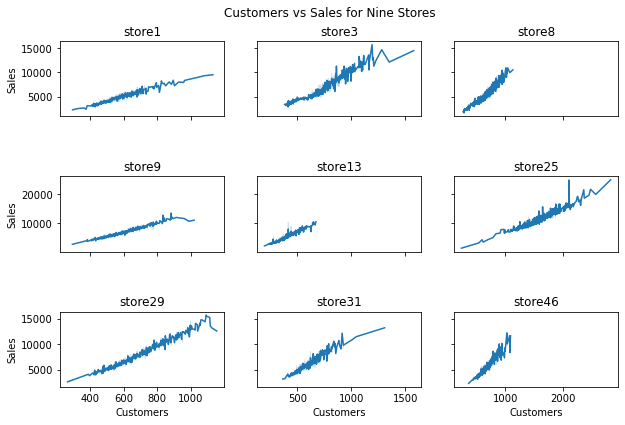

In [29]:
import matplotlib.pyplot as plt
import seaborn as sns
# Customers Vs Sales
fig, axis = plt.subplots(3, 3, sharex='col', sharey='row', figsize=(10,6))
fig.suptitle('Customers vs Sales for Nine Stores')
fig.subplots_adjust(left=left, bottom=bottom, right=right, top=top, wspace=wspace, hspace=hspace)

for x in range (0,3):
    incr = range_dict[str(x)]
    for y in range (0,3):
        i = x + y + int(incr)
        label =  label_dfs[i-1]
        d = store_dfs[i-1]
        #
        axis[x,y].title.set_text(label)
        sns.lineplot(x='Customers', y='Sales', data=d, ax=axis[x,y])

#### For all stores Customers and Sales are linearly related with an upward tread as seen above

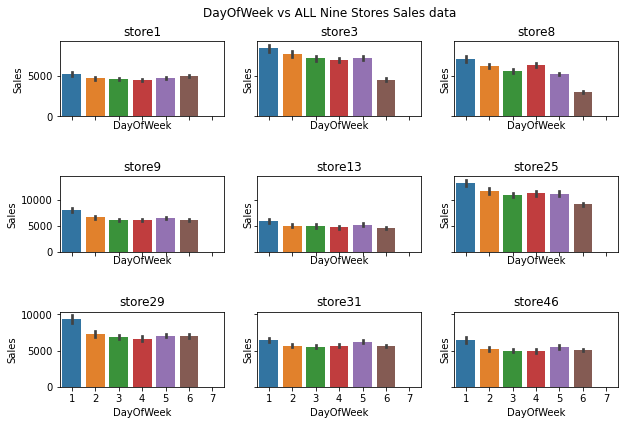

In [30]:
import matplotlib.pyplot as plt
# DayOfWeek Vs Sales
fig, axis = plt.subplots(3, 3, sharex='col', sharey='row', figsize=(10,6))
fig.suptitle('DayOfWeek vs ALL Nine Stores Sales data')
fig.subplots_adjust(left=left, bottom=bottom, right=right, top=top, wspace=wspace, hspace=hspace)

for x in range (0,3):
    incr = range_dict[str(x)]
    for y in range (0,3):
        i = x + y + int(incr)
        label =  label_dfs[i-1]
        d = store_dfs[i-1]
        #
        axis[x,y].title.set_text(label)
        sns.barplot(x='DayOfWeek', y='Sales', data=d, ax=axis[x,y], order=[1,2,3,4,5,6,7])

#### Observation: No Sales on Sundays (Day == 7) probably because they are closed and then there is a spike on Monday

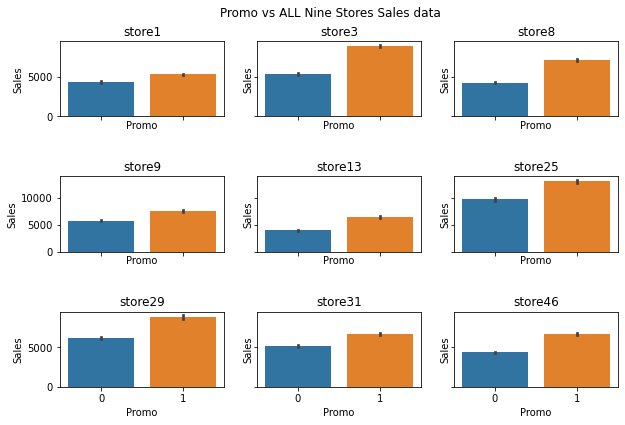

In [31]:
import matplotlib.pyplot as plt
# PROMO
fig, axis = plt.subplots(3, 3, sharex='col', sharey='row', figsize=(10,6))
fig.suptitle('Promo vs ALL Nine Stores Sales data')
fig.subplots_adjust(left=left, bottom=bottom, right=right, top=top, wspace=wspace, hspace=hspace)

for x in range (0,3):
    incr = range_dict[str(x)]
    for y in range (0,3):
        i = x + y + int(incr)
        label = label_dfs[i-1]
        d = store_dfs[i-1]
        #
        axis[x,y].title.set_text(label)
        sns.barplot(x='Promo', y='Sales', data=d, ax=axis[x,y])

#### Observation: Promo has a definite effect on Sales all the nine stores have a greater Sales when the Promo was on

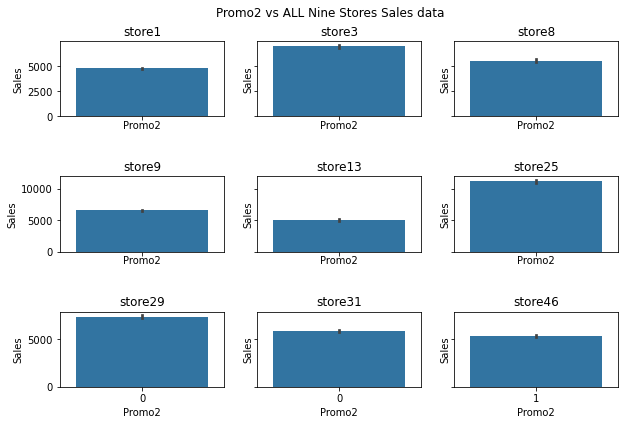

In [32]:
# PROMO2
fig, axis = plt.subplots(3, 3, sharex='col', sharey='row', figsize=(10,6))
fig.suptitle('Promo2 vs ALL Nine Stores Sales data')
fig.subplots_adjust(left=left, bottom=bottom, right=right, top=top, wspace=wspace, hspace=hspace)

for x in range (0,3):
    incr = range_dict[str(x)]
    for y in range (0,3):
        i = x + y + int(incr)
        label =  label_dfs[i-1]
        d = store_dfs[i-1]
        #
        axis[x,y].title.set_text(label)
        sns.barplot(x='Promo2', y='Sales', data=d, ax=axis[x,y])

#### Observation: No affect on Sales and Customers due to 'Promo2'

### Let us look at School and State holidays for all nine stores

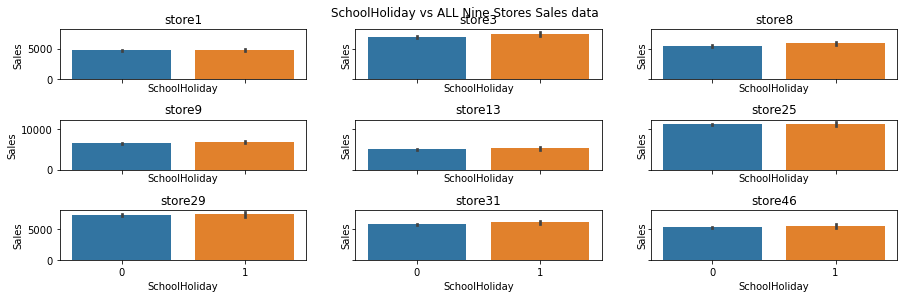

In [33]:
# SchoolHoliday
fig, axis = plt.subplots(3, 3, sharex='col', sharey='row', figsize=(15,4))
fig.suptitle('SchoolHoliday vs ALL Nine Stores Sales data')
fig.subplots_adjust(left=left, bottom=bottom, right=right, top=top, wspace=wspace, hspace=hspace)

for x in range (0,3):
    incr = range_dict[str(x)]
    for y in range (0,3):
        i = x + y + int(incr)
        label =  label_dfs[i-1]
        d = store_dfs[i-1]
        #
        axis[x,y].title.set_text(label)
        sns.barplot(x='SchoolHoliday', y='Sales', data=d, ax=axis[x,y])

#### Observation: Definite Increase in Sales on School Holidays. All nine stores show an increased Sales numbers on School Holiday probably because the stores are open and customers have the day off to shop.

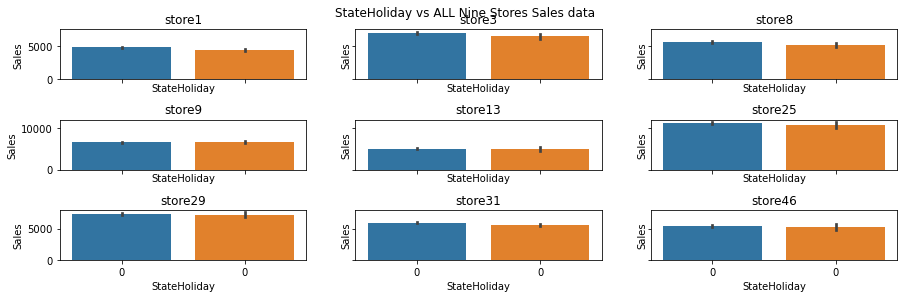

In [34]:
# StateHoliday
fig, axis = plt.subplots(3, 3, sharex='col', sharey='row', figsize=(15,4))
fig.suptitle('StateHoliday vs ALL Nine Stores Sales data')
fig.subplots_adjust(left=left, bottom=bottom, right=right, top=top, wspace=wspace, hspace=hspace)

for x in range (0,3):
    incr = range_dict[str(x)]
    for y in range (0,3):
        i = x + y + int(incr)
        label = label_dfs[i-1]
        d = store_dfs[i-1]
        #
        axis[x,y].title.set_text(label)
        sns.barplot(x='StateHoliday', y='Sales', data=d, ax=axis[x,y])

#### Observation: No effect on Sales on State Holidays, probably because the store is also Closed on State Holidays.

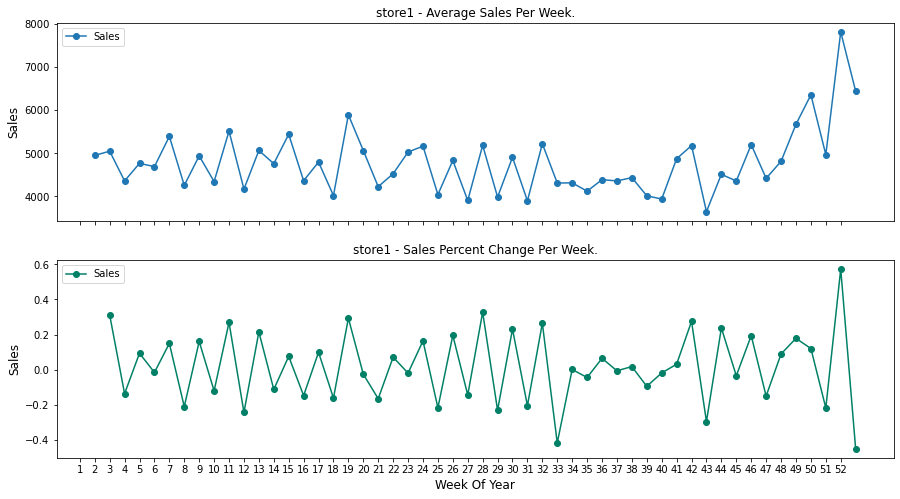

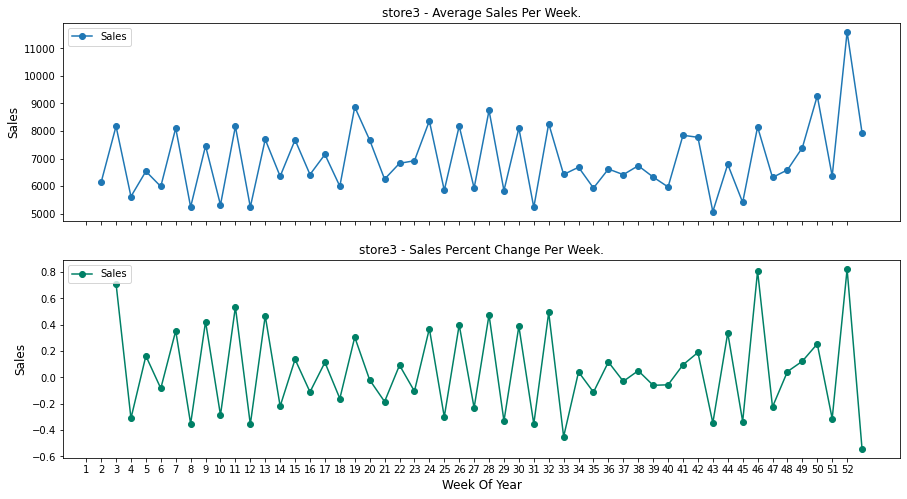

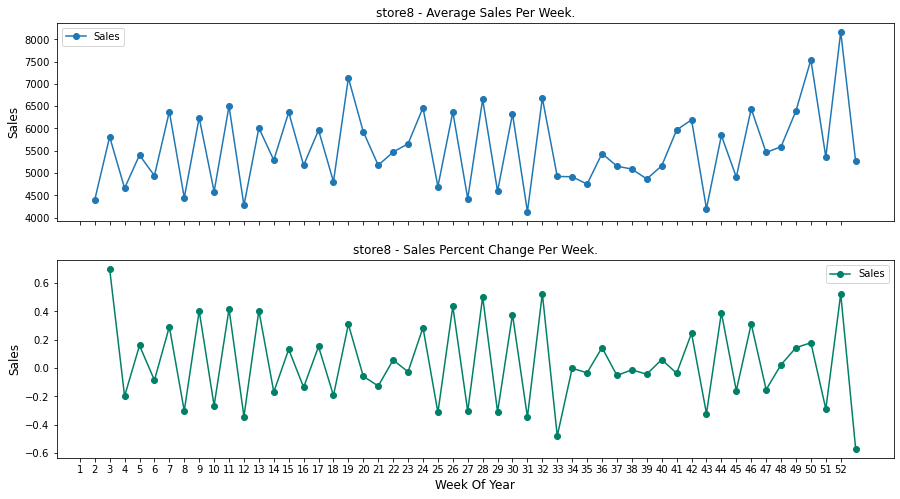

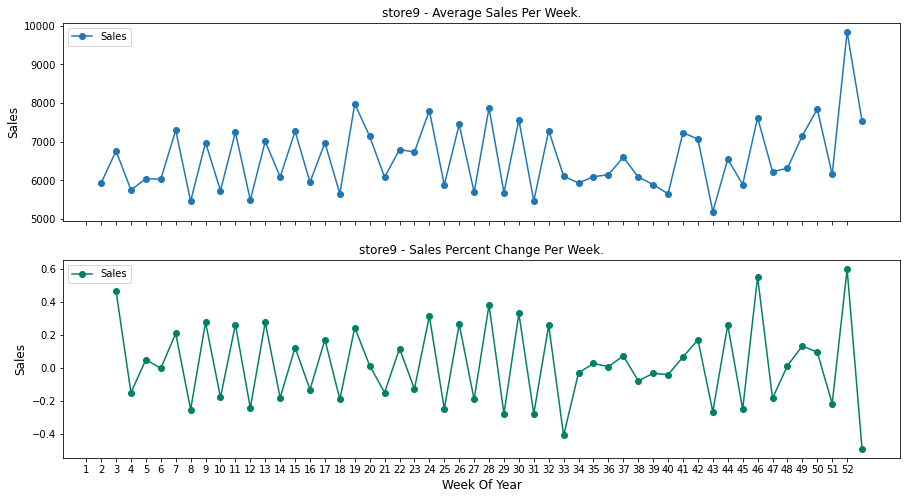

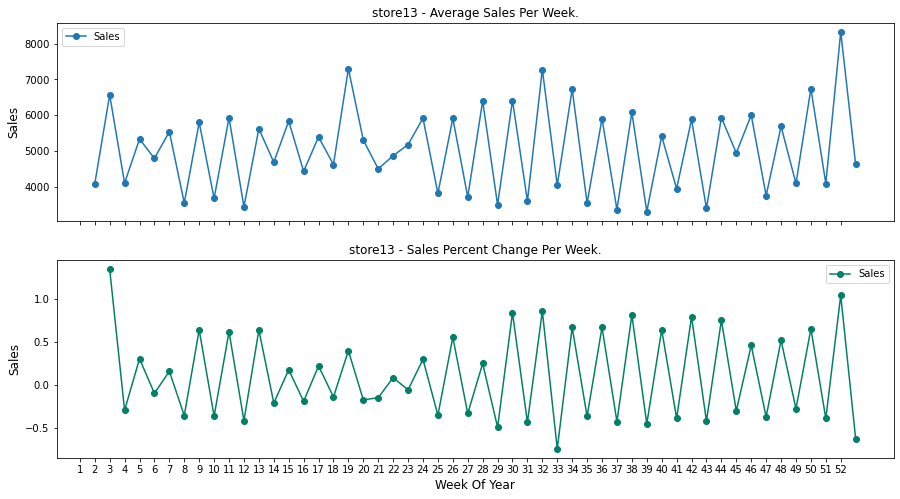

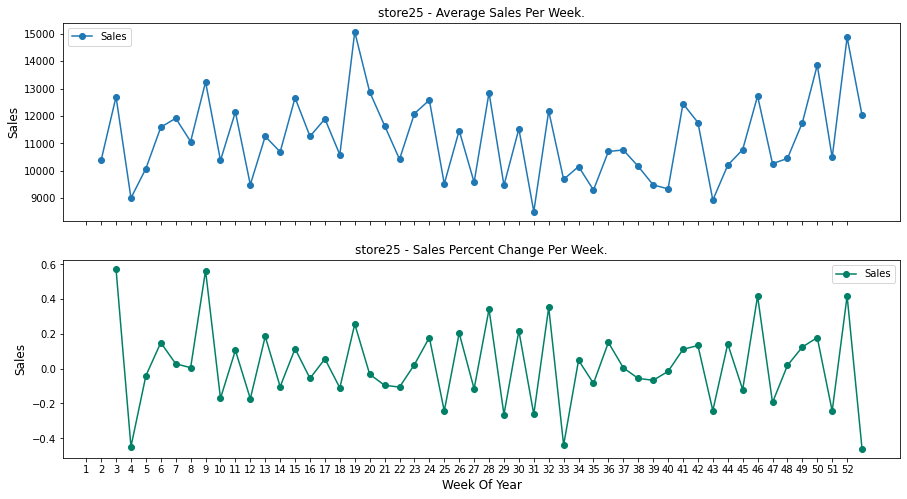

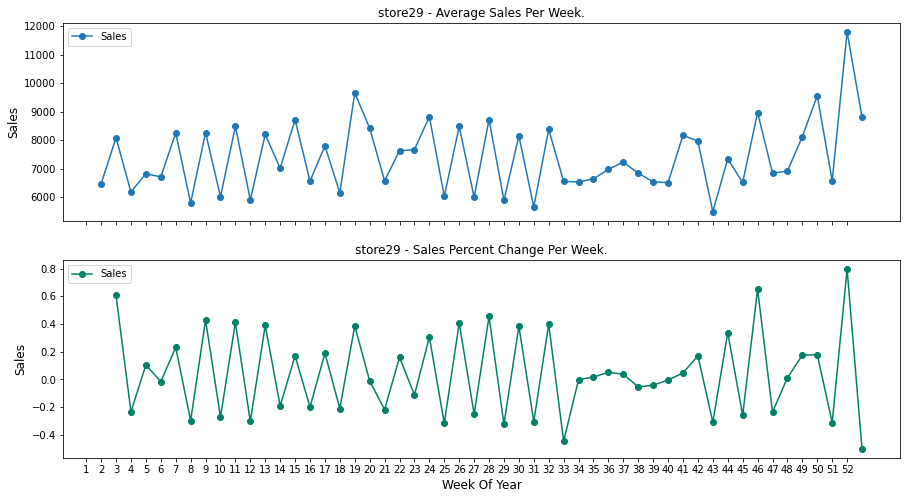

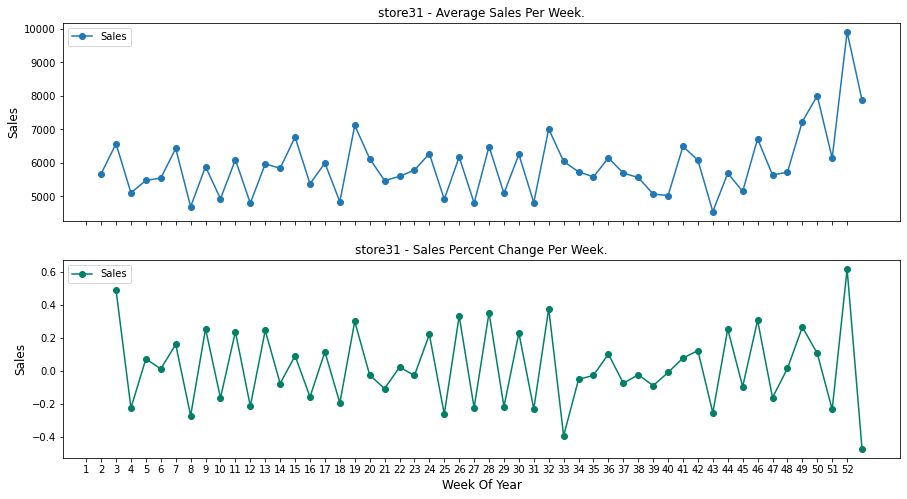

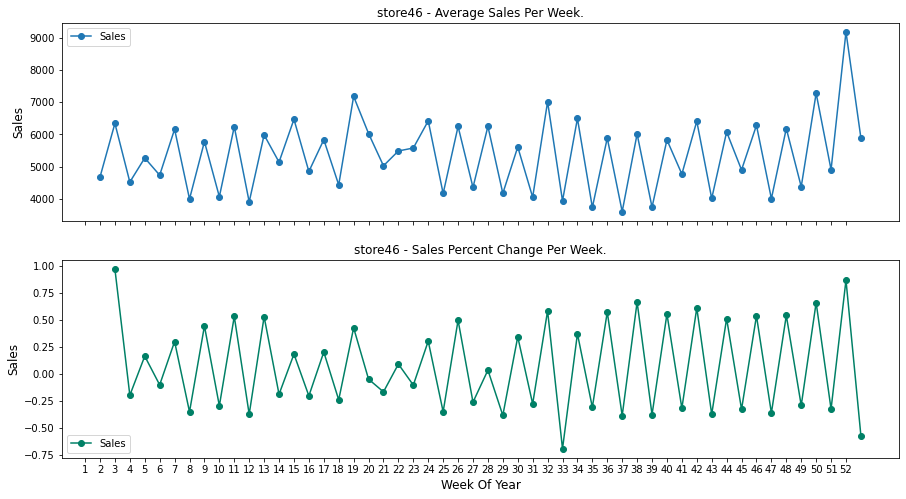

In [35]:
# Let us plot average sales and pct change in sales
for i in range(0,9):
    d = store_dfs[i]
    label = label_dfs[i]
    # group by WeekofYear and get average sales, and precent change
    average_sales    = d.groupby('WeekOfYear')["Sales"].mean()
    pct_change_sales = d.groupby('WeekOfYear')["Sales"].sum().pct_change()
    
    fig, (axis1,axis2) = plt.subplots(2,1,sharex=True,figsize=(15,8))

    # plot average sales over time(year-month)
    ax1 = average_sales.plot(legend=True, ax=axis1, marker='o', title=label + " - Average Sales Per Week.")
    ax1.set_xticks(range(len(average_sales)))
    ax1.set_xticklabels(average_sales.index.tolist())
    ax1.set_ylabel('Sales', size=12)

    # plot precent change for sales over time(year-month)
    ax2 = pct_change_sales.plot(legend=True, ax=axis2, marker='o', colormap="summer", title=label + " - Sales Percent Change Per Week.")
    plt.ylabel("Sales", size=12)
    plt.xlabel('Week Of Year', size=12)

#### Observation: 
#### We see that Sales & Customers are ZERO(0) on Sundays probably because they are closed on Sundays. Also, because of that Sales on Monday is highest.

#### Also, Note that Christmas & New Year Days lead to increase in sales. As these Stores sells  drug or medicines, it may be that during these holiday season, they have long days and night parties and need these medicines or maybe it is COLD in Europe and so need warm medicine which might explain the increase in sales.

# Time series analysis

## Plot time series data

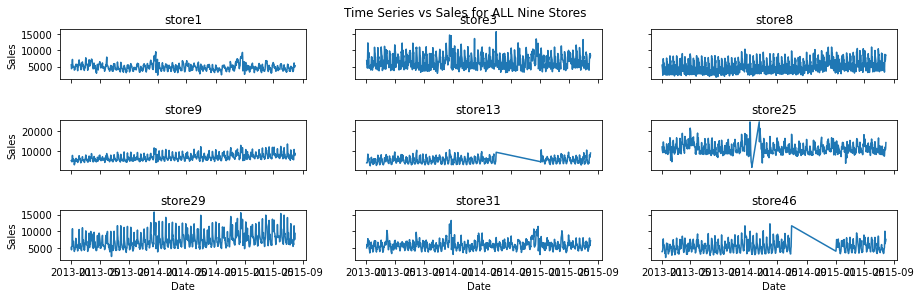

In [36]:
# Time series with Sales
fig, axis = plt.subplots(3, 3, sharex='col', sharey='row', figsize=(15,4))
fig.suptitle('Time Series vs Sales for ALL Nine Stores')
fig.subplots_adjust(left=left, bottom=bottom, right=right, top=top, wspace=wspace, hspace=hspace)

for x in range (0,3):
    incr = range_dict[str(x)]
    for y in range (0,3):
        i = x + y + int(incr)
        label = label_dfs[i-1]
        d = store_dfs[i-1]
        #
        axis[x,y].title.set_text(label)
        sns.lineplot(x=d.index, y='Sales', data=d, ax=axis[x,y])

#### Store 13 and Store 46 have a lot of missing rows. We might have to fill them in with empty rows and interpolate. Store 25 also shows a gap. Rest of them are all ok, seem like regular time series

### Histogram plot

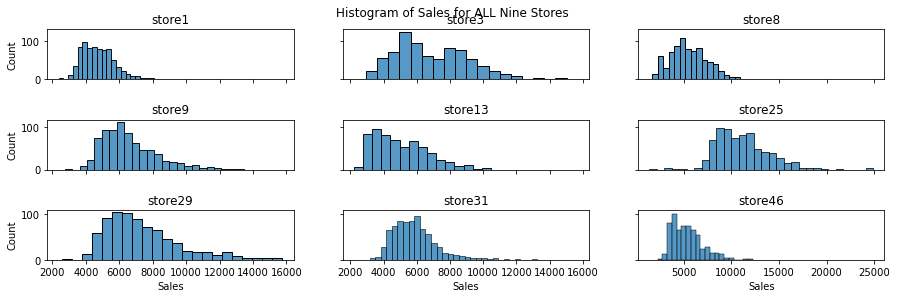

In [37]:
# Histogram of Sales
fig, axis = plt.subplots(3, 3, sharex='col', sharey='row', figsize=(15,4))
fig.suptitle('Histogram of Sales for ALL Nine Stores')
fig.subplots_adjust(left=left, bottom=bottom, right=right, top=top, wspace=wspace, hspace=hspace)

for x in range (0,3):
    incr = range_dict[str(x)]
    for y in range (0,3):
        i = x + y + int(incr)
        label = label_dfs[i-1]
        d = store_dfs[i-1]
        #
        axis[x,y].title.set_text(label)
        sns.histplot(x="Sales", data=d, ax=axis[x,y])

#### Almost all stores have outliers and for all stores on Sundays Sales was ZERO because they were closed

### Competion Analysis plots

<AxesSubplot:xlabel='CompetitionOpenSinceYear', ylabel='Density'>

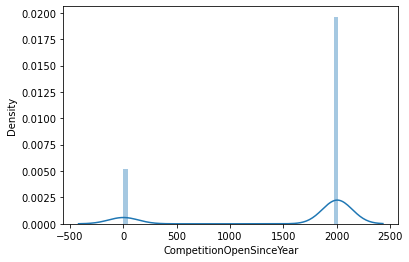

In [38]:
sns.distplot(filtered_df['CompetitionOpenSinceYear'])

#### All the Stores had their Competition open in the Year 2000

<AxesSubplot:xlabel='CompetitionOpenSinceMonth', ylabel='Density'>

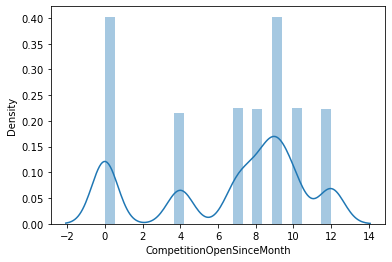

In [39]:
sns.distplot(filtered_df['CompetitionOpenSinceMonth'])

#### Not sure if this means anything, the Stores Open through our the year in every month, more so in later part of the year after July.

Text(0.5, 0, 'Competition Distance in meters')

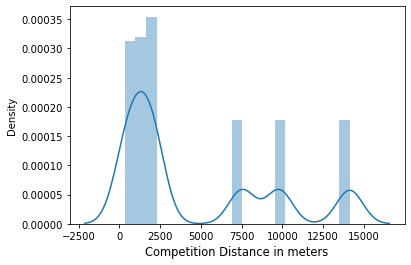

In [40]:
#Plotting distribution of Competition Distance.
sns.distplot(filtered_df['CompetitionDistance'])
plt.xlabel('Competition Distance in meters',fontsize=11.5)

#### Most of the Stores have their Competition within 2.5 Kms

## Store Types

In [41]:
filtered_df.groupby('StoreType')['Sales'].describe()

,count,mean,std,min,25%,50%,75%,max
StoreType,,,,,,,,
a,2342.0,6346.361657,2008.043751,1725.0,4977.25,6051.5,7664.5,15689.0
c,2153.0,7163.277288,3531.526947,1410.0,4407.00,5735.0,9346.0,24882.0
d,2184.0,6162.949176,2005.842984,2210.0,4811.75,5872.5,7081.5,15758.0


In [42]:
filtered_df['AvgSalesByCustomer'] = filtered_df['Sales'] / filtered_df['Customers']

In [43]:
filtered_df.groupby('StoreType')['Customers', 'Sales', 'AvgSalesByCustomer'].sum()

,Customers,Sales,AvgSalesByCustomer
StoreType,,,
a,1552014.0,14863179.0,22332.018278
c,2029127.0,15422536.0,16800.161904
d,1206437.0,13459881.0,24456.713191


**Type D has the max. AvgSalesBy Customer although Type A Stores have the most Sales and the most Customers**

In [44]:
# Check the null values in the entire df again
missing = filtered_df.isnull().sum()
missing.sort_values(ascending=False)

AvgSalesByCustomer           2
Sales                        2
Customers                    2
CompetitionOpenSinceYear     0
WeekOfYear                   0
Day                          0
Month                        0
Year                         0
PromoInterval                0
Promo2SinceYear              0
Promo2SinceWeek              0
Promo2                       0
Store                        0
DayOfWeek                    0
CompetitionDistance          0
Assortment                   0
StoreType                    0
SchoolHoliday                0
StateHoliday                 0
Promo                        0
Open                         0
CompetitionOpenSinceMonth    0
dtype: int64

In [45]:
# Retain only the necessary columns going forward
filtered_df.drop(columns=['AvgSalesByCustomer','CompetitionOpenSinceYear','WeekOfYear','Day',
                           'PromoInterval','Promo2SinceYear','Promo2SinceWeek','Month','Year',
                           'Promo2','CompetitionDistance','Assortment','StoreType','StateHoliday',
                            'CompetitionOpenSinceMonth'],inplace=True)

In [46]:
# Date is already the index, Check
filtered_df.head(10)

,Store,DayOfWeek,Sales,Customers,Open,Promo,SchoolHoliday
Date,,,,,,,
2015-07-31,1,5,5263.0,555.0,1,1,1
2015-07-31,3,5,8314.0,821.0,1,1,1
2015-07-31,8,5,8492.0,833.0,1,1,1
2015-07-31,9,5,8565.0,687.0,1,1,1
2015-07-31,13,5,8821.0,568.0,1,1,0
2015-07-31,25,5,14180.0,1586.0,1,1,1
2015-07-31,29,5,9411.0,737.0,1,1,1
2015-07-31,31,5,7248.0,645.0,1,1,1
2015-07-31,46,5,7628.0,775.0,1,1,0


# Analysis of All Nine Stores data treated as one time series

## Outlier detection

### Box plot and interquartile range

In [47]:
data=filtered_df[['Store','Sales','Customers','Open','DayOfWeek','Promo','SchoolHoliday']].copy()
data = data.sort_index(ascending=True) # Sort of ascending time and date
data.head()

,Store,Sales,Customers,Open,DayOfWeek,Promo,SchoolHoliday
Date,,,,,,,
2013-01-02,46,4016.0,582.0,1,3,0,1
2013-01-02,1,5530.0,668.0,1,3,0,1
2013-01-02,3,6823.0,805.0,1,3,0,1
2013-01-02,8,5419.0,698.0,1,3,0,1
2013-01-02,31,5122.0,567.0,1,3,0,1


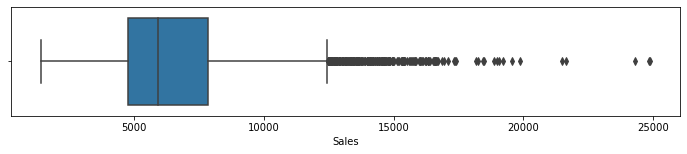

In [48]:
import seaborn as sns
fig = plt.subplots(figsize=(12, 2))
ax = sns.boxplot(x=data['Sales'],whis=1.5)

In [49]:
# Remove outliers for Sales, at 99% looks like we have many points
outlier_value = data['Sales'].quantile(0.99)
print(outlier_value)

15226.680000000024


In [50]:
# Update the outliers to NaN
data.Sales=data.Sales.where(data.Sales.between(0,outlier_value))
data['Sales'].describe()

count     6612.000000
mean      6443.143527
std       2412.957239
min       1410.000000
25%       4727.750000
50%       5896.000000
75%       7735.250000
max      15206.000000
Name: Sales, dtype: float64

In [51]:
# Remove outliers for Customers, at 99% looks like we have many points
outlier_value = data['Customers'].quantile(0.99)
print(outlier_value)

1976.880000000001


In [52]:
# Update the outliers to NaN
data.Customers=data.Customers.where(data.Customers.between(0,outlier_value))
data['Customers'].describe()

count    6612.000000
mean      702.273593
std       323.690076
min       194.000000
25%       517.000000
50%       615.000000
75%       759.000000
max      1976.000000
Name: Customers, dtype: float64

### The NaN or Missing Values can be filled with Linear Interpolated values

#### Do for both the Sales and Customers Column

In [53]:
# Check for nulls in all columns
data.isnull().sum(axis = 0)

Store             0
Sales            69
Customers        69
Open              0
DayOfWeek         0
Promo             0
SchoolHoliday     0
dtype: int64

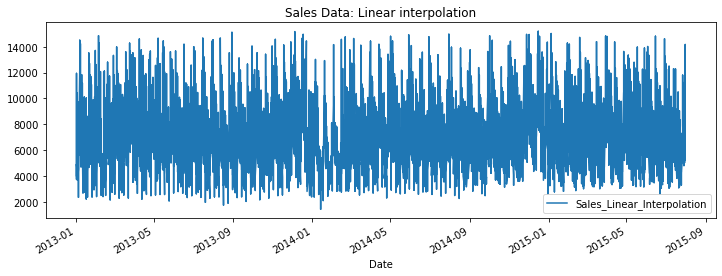

In [54]:
# FIll Missing with Linear Interpolation Doe Sales col
data = data.assign(Sales_Linear_Interpolation=data.Sales.interpolate(method='linear'))
data[['Sales_Linear_Interpolation']].plot(figsize=(12, 4))
plt.legend(loc='best')
plt.title('Sales Data: Linear interpolation')
plt.show(block=False)

In [55]:
data['Sales'] = data['Sales_Linear_Interpolation']
data.drop(columns=['Sales_Linear_Interpolation'],inplace=True)

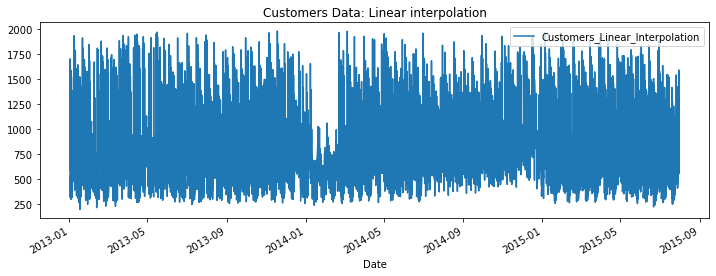

In [56]:
# FIll Missing with Linear Interpolation for Customers col
data = data.assign(Customers_Linear_Interpolation=data.Customers.interpolate(method='linear'))
data[['Customers_Linear_Interpolation']].plot(figsize=(12, 4))
plt.legend(loc='best')
plt.title('Customers Data: Linear interpolation')
plt.show(block=False)

In [57]:
# Replace with the Linear interpolated values
data['Customers'] = data['Customers_Linear_Interpolation']
data.drop(columns=['Customers_Linear_Interpolation'],inplace=True)

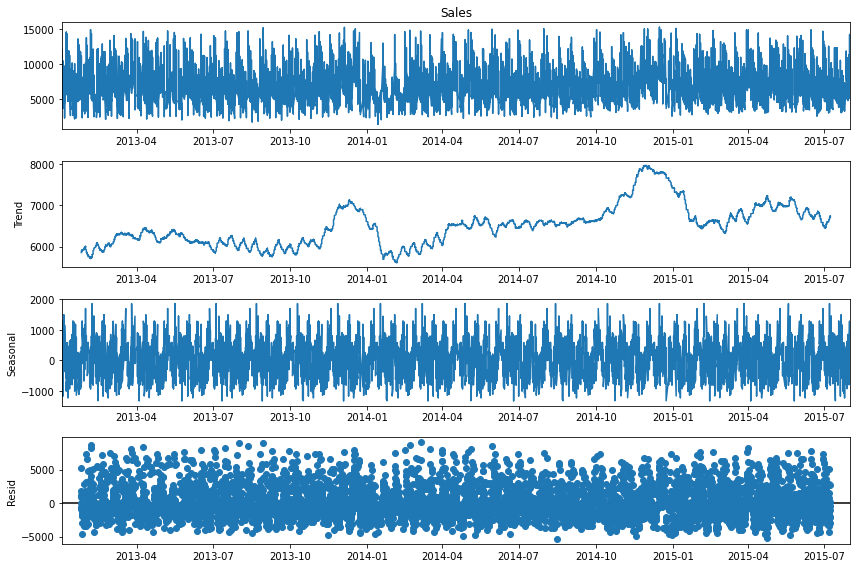

In [58]:
# Time series Decomposition
from pylab import rcParams
import statsmodels.api as sm
rcParams['figure.figsize'] = 12, 8
decomposition = sm.tsa.seasonal_decompose(data['Sales'], model='additive', freq=365) # additive seasonal index
fig = decomposition.plot()
    
plt.show()

#### Clearly, shows seasonality based on the three graphs drawn for the three stores but no trend.

## Split time series data into training and test keeping 36 rows for test (6 weeks)

In [59]:
data.head()
print("Number of Rows in all nine stores:", len(data))

Number of Rows in all nine stores: 6681


In [60]:
# Leave last 36 for forecast, 6 weeks = 42 days minus 6 Sundays == 36
test_len = 36
train_len = len(data) - test_len
print(train_len)

6645


In [61]:
# Set inferred freq
data.index.freq = data.index.inferred_freq
train = data.iloc[0:train_len, :]
test = data.iloc[train_len:,:]
endog_vars = ['Sales', 'Customers']
exog_vars = ['Promo','DayOfWeek','SchoolHoliday']

In [62]:
train[endog_vars].head()

,Sales,Customers
Date,,
2013-01-02,4016.0,582.0
2013-01-02,5530.0,668.0
2013-01-02,6823.0,805.0
2013-01-02,5419.0,698.0
2013-01-02,5122.0,567.0


In [63]:
train[exog_vars].head()

,Promo,DayOfWeek,SchoolHoliday
Date,,,
2013-01-02,0,3,1
2013-01-02,0,3,1
2013-01-02,0,3,1
2013-01-02,0,3,1
2013-01-02,0,3,1


# Auto Regressive methods

## Stationarity vs non-stationary time series

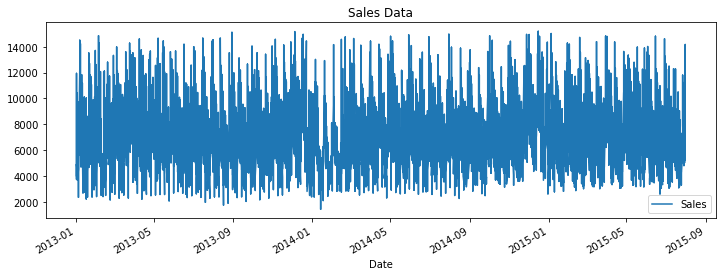

In [64]:
data['Sales'].plot(figsize=(12, 4))
plt.legend(loc='best')
plt.title('Sales Data')
plt.show(block=False)

### Augmented Dickey-Fuller (ADF) test

In [65]:
from statsmodels.tsa.stattools import adfuller
adf_test = adfuller(data['Sales'])

print('ADF Statistic: %f' % adf_test[0])
print('Critical Values @ 0.05: %.2f' % adf_test[4]['5%'])
print('p-value: %f' % adf_test[1])

ADF Statistic: -11.833317
Critical Values @ 0.05: -2.86
p-value: 0.000000


### The p-value is 0.00 way under than 0.05 and so according to ADF the series is Stationary

### Kwiatkowski-Phillips-Schmidt-Shin (KPSS) test

In [66]:
from statsmodels.tsa.stattools import kpss
kpss_test = kpss(data['Sales'])

print('KPSS Statistic: %f' % kpss_test[0])
print('Critical Values @ 0.05: %.2f' % kpss_test[3]['5%'])
print('p-value: %f' % kpss_test[1])

KPSS Statistic: 1.764329
Critical Values @ 0.05: 0.46
p-value: 0.010000


/Users/venkir/opt/anaconda3/lib/python3.9/site-packages/statsmodels/tsa/stattools.py:1906: InterpolationWarning: The test statistic is outside of the range of p-values available in the
look-up table. The actual p-value is smaller than the p-value returned.

  warnings.warn(


### The p-value is 0.01 is higher than 0.05 and so according to KPSS the series is NON-Stationary. 
#### Contradictory results...let us transform then and make them stationary

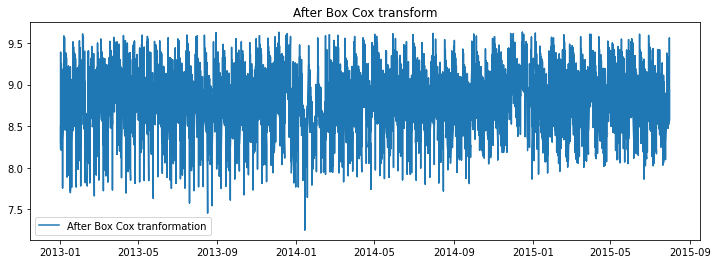

In [67]:
### Box Cox transformation to make variance constant
from scipy.stats import boxcox
data_boxcox = pd.Series(boxcox(data['Sales'], lmbda=0), index = data.index)

plt.figure(figsize=(12,4))
plt.plot(data_boxcox, label='After Box Cox tranformation')
plt.legend(loc='best')
plt.title('After Box Cox transform')
plt.show()

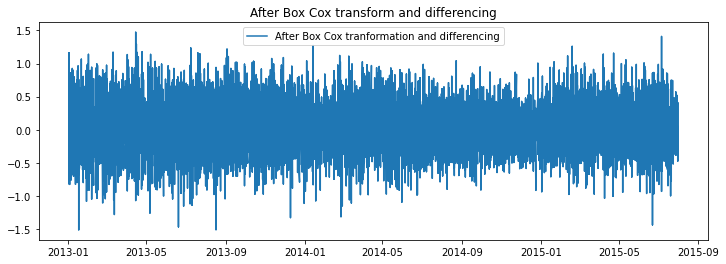

In [68]:
# Differencing
data_boxcox_diff = pd.Series(data_boxcox - data_boxcox.shift(), data.index)
plt.figure(figsize=(12,4))
plt.plot(data_boxcox_diff, label='After Box Cox tranformation and differencing')
plt.legend(loc='best')
plt.title('After Box Cox transform and differencing')
plt.show()

In [69]:
data_boxcox_diff.dropna(inplace=True)

### Autocorrelation function (ACF) and PACF as subplots

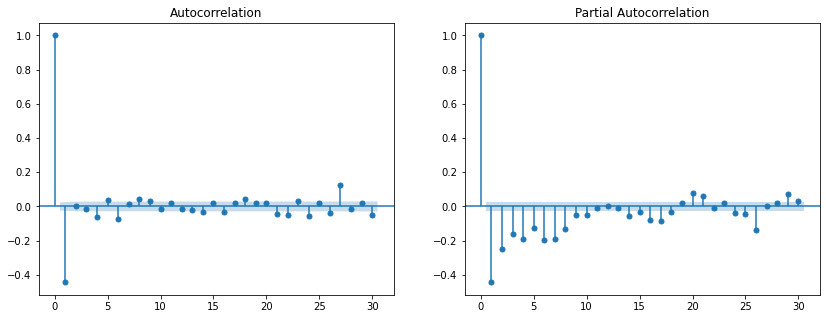

In [70]:
from statsmodels.graphics.tsaplots import plot_acf
from statsmodels.graphics.tsaplots import plot_pacf

fig, ax = plt.subplots(1,2,figsize=(14,5))
sm.graphics.tsa.plot_acf(data_boxcox_diff.squeeze(), lags=30, ax=ax[0])
sm.graphics.tsa.plot_pacf(data_boxcox_diff.squeeze(), lags=30, ax=ax[1])
plt.show()

#### p = 1 and q = 1

## VAR Model

In [71]:
# Define endog vards and exog vars and scale Sales and Customers to same metric
#from sklearn.preprocessing import StandardScaler
#scaler = StandardScaler()
#train[endog_vars] = scaler.fit_transform(train[endog_vars]) # for train data
#test[endog_vars] = scaler.fit_transform(test[endog_vars]) # for test data

In [72]:
# Check and see if Scaling worked
train.head()

,Store,Sales,Customers,Open,DayOfWeek,Promo,SchoolHoliday
Date,,,,,,,
2013-01-02,46,4016.0,582.0,1,3,0,1
2013-01-02,1,5530.0,668.0,1,3,0,1
2013-01-02,3,6823.0,805.0,1,3,0,1
2013-01-02,8,5419.0,698.0,1,3,0,1
2013-01-02,31,5122.0,567.0,1,3,0,1


In [73]:
#  Stationarity Test - ADF Test
for i in range(len(endog_vars)):
    print('\n' + endog_vars[i] + ': ADF test results:')
    result = adfuller(data[endog_vars[i]].dropna())
    print('ADF Statistic: %f' % result[0])
    print('p-value: %f' % result[1])
    print('Critical Values:')
    for key, value in result[4].items():
        if key=='5%':
            print('\t%s: %.3f' % (key, value))


Sales: ADF test results:
ADF Statistic: -11.833317
p-value: 0.000000
Critical Values:
	5%: -2.862

Customers: ADF test results:
ADF Statistic: -10.392786
p-value: 0.000000
Critical Values:
	5%: -2.862


In [74]:
# VAR does not need exog vars
mod = sm.tsa.VARMAX(train[endog_vars], order=(1,1), trend='n') # p = 1 and q = 1
res = mod.fit(maxiter=1000, disp=False)
print(res.summary())
#Note the AIC value - lower AIC => better model

/Users/venkir/opt/anaconda3/lib/python3.9/site-packages/statsmodels/tsa/statespace/varmax.py:161: EstimationWarning: Estimation of VARMA(p,q) models is not generically robust, due especially to identification issues.
  warn('Estimation of VARMA(p,q) models is not generically robust,'
/Users/venkir/opt/anaconda3/lib/python3.9/site-packages/statsmodels/tsa/base/tsa_model.py:581: ValueWarning: A date index has been provided, but it has no associated frequency information and so will be ignored when e.g. forecasting.
  warnings.warn('A date index has been provided, but it has no'


                             Statespace Model Results                             
Dep. Variable:     ['Sales', 'Customers']   No. Observations:                 6645
Model:                         VARMA(1,1)   Log Likelihood             -103866.494
Date:                    Mon, 17 Jan 2022   AIC                         207754.987
Time:                            13:16:57   BIC                         207829.805
Sample:                                 0   HQIC                        207780.836
                                   - 6645                                         
Covariance Type:                      opg                                         
Ljung-Box (L1) (Q):          26.47, 100.16   Jarque-Bera (JB):     1983.79, 7119.17
Prob(Q):                        0.00, 0.00   Prob(JB):                   0.00, 0.00
Heteroskedasticity (H):         1.01, 1.32   Skew:                      1.14, -0.30
Prob(H) (two-sided):            0.78, 0.00   Kurtosis:                   4.39, 8.03


In [75]:
predictions = res.forecast(steps=test_len, exog=test[exog_vars])
predictions['Date'] = test.index
predictions = predictions.set_index('Date')

/Users/venkir/opt/anaconda3/lib/python3.9/site-packages/statsmodels/tsa/base/tsa_model.py:376: ValueWarning: No supported index is available. Prediction results will be given with an integer index beginning at `start`.
  warnings.warn('No supported index is available.'


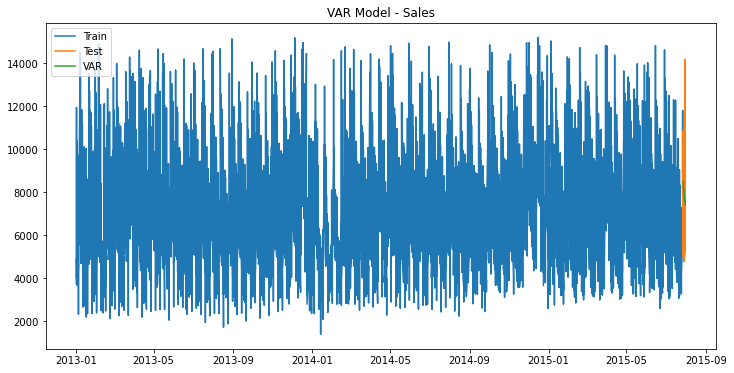

In [76]:
plt.figure(figsize=(12,6))
plt.plot(train['Sales'], label='Train')
plt.plot(test['Sales'], label='Test')
plt.plot(predictions['Sales'], label='VAR')
plt.legend(loc='best')
plt.title('VAR Model - Sales')
plt.show()

In [77]:
from sklearn.metrics import mean_squared_error
# Root Mean Square Error (RMSE)
rmse = np.sqrt(mean_squared_error(test.Sales, predictions.Sales)).round(2)

model_comparison=pd.DataFrame()
model_comparison.loc[0,'Model']='VAR'
model_comparison.loc[0,'Variable']='Sales'
model_comparison.loc[0,'RMSE']=rmse

rmse = np.sqrt(mean_squared_error(test.Customers, predictions.Customers)).round(2)
#print('Investment: RMSE:',  rmse)

append=pd.DataFrame()
append.loc[0,'Model']='VAR'
append.loc[0,'Variable']='Customers'
append.loc[0,'RMSE']=rmse

model_comparison = model_comparison.append(append)

# Mean Absolute Percentage Error
abs_error = np.abs(test.Sales-predictions.Sales)
actual = test.Sales
mape = np.round(np.mean(abs_error/actual)*100, 2)

model_comparison.loc[model_comparison['Variable']=='Sales', 'MAPE'] = mape

abs_error = np.abs(test.Customers-predictions.Customers)
actual = test.Customers
mape = np.round(np.mean(abs_error/actual)*100, 2)
#print('Investment: MAPE:',  mape)

model_comparison.loc[model_comparison['Variable']=='Customers', 'MAPE'] = mape

In [78]:
model_comparison.reset_index(drop=True, inplace=True)
#model_comparison

In [79]:
# Display concatenated Diplay of rrmse and mape errors
results_display = model_comparison.copy()
results_display

,Model,Variable,RMSE,MAPE
0,VAR,Sales,1973.44,19.90
1,VAR,Customers,267.67,27.85


In [80]:
from statsmodels.tsa.api import VAR
from statsmodels.tsa.base import  datetools
var = VAR(data[endog_vars])

x= var.select_order()
x.summary()

/Users/venkir/opt/anaconda3/lib/python3.9/site-packages/statsmodels/tsa/base/tsa_model.py:581: ValueWarning: A date index has been provided, but it has no associated frequency information and so will be ignored when e.g. forecasting.
  warnings.warn('A date index has been provided, but it has no'


,AIC,BIC,FPE,HQIC
0,25.93,25.94,1.831e+11,25.93
1,25.60,25.60,1.306e+11,25.60
2,25.46,25.47,1.140e+11,25.46
3,25.41,25.42,1.085e+11,25.42
4,25.39,25.41,1.061e+11,25.39
5,25.38,25.40,1.053e+11,25.39
6,25.37,25.39,1.040e+11,25.38
7,25.36,25.39,1.034e+11,25.37
8,25.34,25.37,1.010e+11,25.35
9,25.33,25.36,9.970e+10,25.34


In [81]:
"""
    Johansen cointegration test of the cointegration rank of a VECM

    Parameters
    ----------
    endog : array_like (nobs_tot x neqs)
        Data to test
    det_order : int
        * -1 - no deterministic terms - model1
        * 0 - constant term - model3
        * 1 - linear trend
    k_ar_diff : int, nonnegative
        Number of lagged differences in the model.
"""

def joh_output(res):
    output = pd.DataFrame([res.lr2,res.lr1],
                          index=['max_eig_stat',"trace_stat"])
    print(output.T,'\n')
    print("Critical values(90%, 95%, 99%) of max_eig_stat\n",res.cvm,'\n')
    print("Critical values(90%, 95%, 99%) of trace_stat\n",res.cvt,'\n')

In [82]:
from statsmodels.tsa.vector_ar.vecm import coint_johansen
joh_model1 = coint_johansen(data[endog_vars],-1,1) # k_ar_diff +1 = K
joh_output(joh_model1)

   max_eig_stat   trace_stat
0   2526.442911  2614.799415
1     88.356504    88.356504 

Critical values(90%, 95%, 99%) of max_eig_stat
 [[ 9.4748 11.2246 15.0923]
 [ 2.9762  4.1296  6.9406]] 

Critical values(90%, 95%, 99%) of trace_stat
 [[10.4741 12.3212 16.364 ]
 [ 2.9762  4.1296  6.9406]] 



In [83]:
from statsmodels.tsa.vector_ar.vecm import select_coint_rank
rank=select_coint_rank(data[endog_vars],-1,1)
print(rank.rank)
#result=stt.coint(endog['Sales'], endog['Customers'])

2


**These two Series Sales and Customers are COINTEGRATED because the rank = 1**

In [84]:
# use fit = 34
results = var.fit(34)
#We can check the summary of the model by.
results.summary()

  Summary of Regression Results   
Model:                         VAR
Method:                        OLS
Date:           Mon, 17, Jan, 2022
Time:                     13:16:58
--------------------------------------------------------------------
No. of Equations:         2.00000    BIC:                    25.3449
Nobs:                     6647.00    HQIC:                   25.2525
Log likelihood:          -102490.    FPE:                8.82709e+10
AIC:                      25.2037    Det(Omega_mle):     8.64664e+10
--------------------------------------------------------------------
Results for equation Sales
                   coefficient       std. error           t-stat            prob
--------------------------------------------------------------------------------
const              2845.267675       302.627608            9.402           0.000
L1.Sales              0.394070         0.023320           16.899           0.000
L1.Customers         -2.324009         0.159446          -14

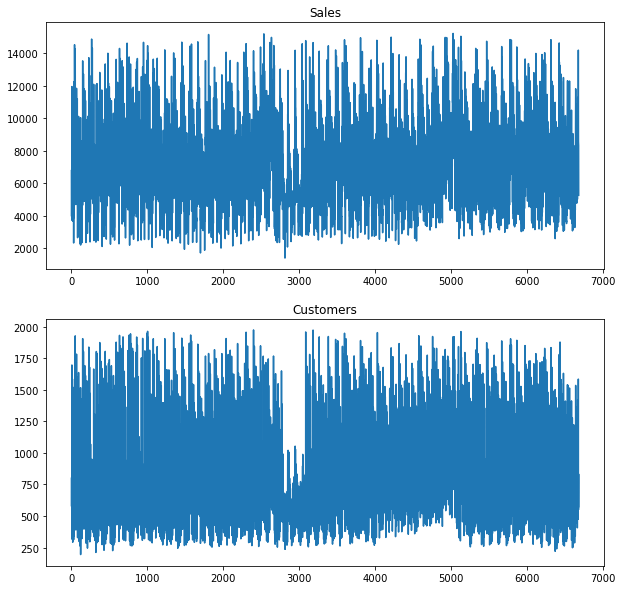

In [85]:
#Visualizing the input:
results.plot();

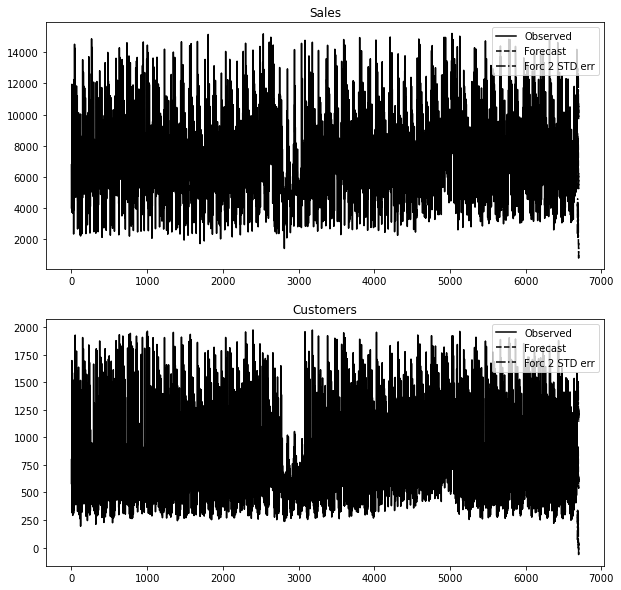

In [86]:
#We can also plot our forecasted values by the model.

results.plot_forecast(20);

### VARMAX Model

In [87]:
import time
start_time = time.time()

from statsmodels.tsa.api import VARMAX
mod = sm.tsa.VARMAX(data[endog_vars], order=(2,1), trend='n', exog=data[exog_vars])
res = mod.fit(maxiter=1000, disp=False)
end_time = time.time()
print("Time taken to execute VARMAX model (mins):", (end_time - start_time)/60)
print(res.summary())

/Users/venkir/opt/anaconda3/lib/python3.9/site-packages/statsmodels/tsa/statespace/varmax.py:161: EstimationWarning: Estimation of VARMA(p,q) models is not generically robust, due especially to identification issues.
  warn('Estimation of VARMA(p,q) models is not generically robust,'
/Users/venkir/opt/anaconda3/lib/python3.9/site-packages/statsmodels/tsa/base/tsa_model.py:581: ValueWarning: A date index has been provided, but it has no associated frequency information and so will be ignored when e.g. forecasting.
  warnings.warn('A date index has been provided, but it has no'


Time taken to execute VARMAX model (mins): 1.8176605502764385
                             Statespace Model Results                             
Dep. Variable:     ['Sales', 'Customers']   No. Observations:                 6681
Model:                        VARMAX(2,1)   Log Likelihood             -104390.782
Date:                    Mon, 17 Jan 2022   AIC                         208823.564
Time:                            13:18:47   BIC                         208966.512
Sample:                                 0   HQIC                        208872.937
                                   - 6681                                         
Covariance Type:                      opg                                         
Ljung-Box (L1) (Q):             0.05, 0.00   Jarque-Bera (JB):     1090.77, 9346.32
Prob(Q):                        0.82, 0.98   Prob(JB):                   0.00, 0.00
Heteroskedasticity (H):         0.97, 1.29   Skew:                      0.86, -0.50
Prob(H) (two-sided):  

In [88]:
predictions = res.forecast(steps=test_len, exog=test[exog_vars])
predictions['Date'] = test.index
predictions = predictions.set_index('Date')

/Users/venkir/opt/anaconda3/lib/python3.9/site-packages/statsmodels/tsa/statespace/varmax.py:161: EstimationWarning: Estimation of VARMA(p,q) models is not generically robust, due especially to identification issues.
  warn('Estimation of VARMA(p,q) models is not generically robust,'
/Users/venkir/opt/anaconda3/lib/python3.9/site-packages/statsmodels/tsa/base/tsa_model.py:376: ValueWarning: No supported index is available. Prediction results will be given with an integer index beginning at `start`.
  warnings.warn('No supported index is available.'
/Users/venkir/opt/anaconda3/lib/python3.9/site-packages/statsmodels/tsa/statespace/varmax.py:161: EstimationWarning: Estimation of VARMA(p,q) models is not generically robust, due especially to identification issues.
  warn('Estimation of VARMA(p,q) models is not generically robust,'


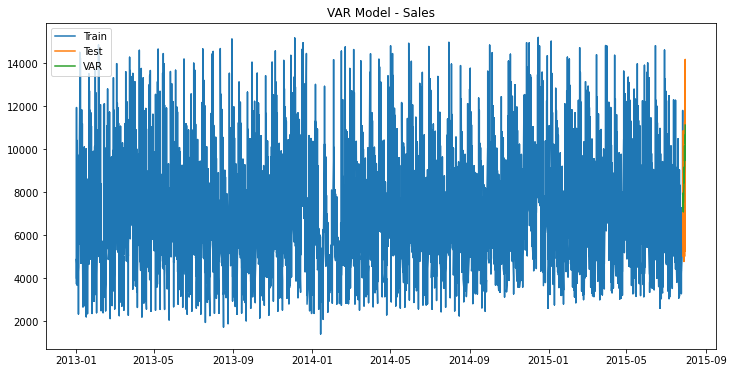

In [89]:
plt.figure(figsize=(12,6))
plt.plot(train['Sales'], label='Train')
plt.plot(test['Sales'], label='Test')
plt.plot(predictions['Sales'], label='VAR')
plt.legend(loc='best')
plt.title('VAR Model - Sales')
plt.show()

In [90]:
# Root Mean Square Error (RMSE)
rmse = np.sqrt(mean_squared_error(test.Sales, predictions.Sales)).round(2)

model_comparison=pd.DataFrame()
model_comparison.loc[0,'Model']='VARMAX'
model_comparison.loc[0,'Variable']='Sales'
model_comparison.loc[0,'RMSE']=rmse

rmse = np.sqrt(mean_squared_error(test.Customers, predictions.Customers)).round(2)
#print('Investment: RMSE:',  rmse)

append=pd.DataFrame()
append.loc[0,'Model']='VARMAX'
append.loc[0,'Variable']='Customers'
append.loc[0,'RMSE']=rmse

model_comparison = model_comparison.append(append)

# Mean Absolute Percentage Error
abs_error = np.abs(test.Sales-predictions.Sales)
actual = test.Sales
mape = np.round(np.mean(abs_error/actual)*100, 2)

model_comparison.loc[model_comparison['Variable']=='Sales', 'MAPE'] = mape

abs_error = np.abs(test.Customers-predictions.Customers)
actual = test.Customers
mape = np.round(np.mean(abs_error/actual)*100, 2)
#print('Investment: MAPE:',  mape)

model_comparison.loc[model_comparison['Variable']=='Customers', 'MAPE'] = mape

In [91]:
model_comparison.reset_index(drop=True, inplace=True)
#model_comparison

In [92]:
# Display concatenated Diplay of rrmse and mape errors
results_display = pd.concat([results_display, model_comparison])
results_display

,Model,Variable,RMSE,MAPE
0,VAR,Sales,1973.44,19.90
1,VAR,Customers,267.67,27.85
0,VARMAX,Sales,2317.12,28.75
1,VARMAX,Customers,340.90,45.80


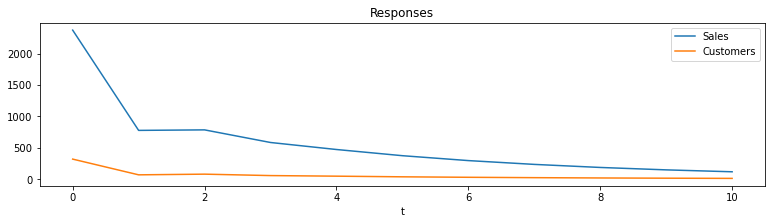

In [93]:
ax = res.impulse_responses(10, orthogonalized=True, impulse=[1, 0]).plot(figsize=(13,3))
ax.set(xlabel='t', title='Responses');

### SARIMAX Model

In [94]:
test_index_min=test.index.min()
test_index_max=test.index.max()

In [95]:
data=data.reset_index()

In [96]:
data=data.set_index(['Date','Store']) # Since we have data for all nine stores
data = data.sort_index(ascending=True) # Sort of ascending time and date
data.head()

Sales  Customers  Open  DayOfWeek  Promo  SchoolHoliday
Date       Store                                                          
2013-01-02 1      5530.0      668.0     1          3      0              1
           3      6823.0      805.0     1          3      0              1
           8      5419.0      698.0     1          3      0              1
           9      4903.0      481.0     1          3      0              1
           13     3737.0      317.0     1          3      0              1

In [97]:
from statsmodels.tsa.statespace.sarimax import SARIMAX
model=sm.tsa.statespace.SARIMAX(data['Sales'],order=(1, 1, 1),seasonal_order=(1,0,1,12), exog=data[exog_vars])
model_fit=model.fit()
print(model_fit.params)

/Users/venkir/opt/anaconda3/lib/python3.9/site-packages/statsmodels/tsa/base/tsa_model.py:578: ValueWarning: An unsupported index was provided and will be ignored when e.g. forecasting.
  warnings.warn('An unsupported index was provided and will be'
/Users/venkir/opt/anaconda3/lib/python3.9/site-packages/statsmodels/tsa/base/tsa_model.py:578: ValueWarning: An unsupported index was provided and will be ignored when e.g. forecasting.
  warnings.warn('An unsupported index was provided and will be'
 This problem is unconstrained.


RUNNING THE L-BFGS-B CODE

           * * *

Machine precision = 2.220D-16
 N =            8     M =           10

At X0         0 variables are exactly at the bounds

At iterate    0    f=  9.14490D+00    |proj g|=  1.19242D-01

At iterate    5    f=  9.06666D+00    |proj g|=  8.61104D-03

At iterate   10    f=  9.06531D+00    |proj g|=  9.74262D-05

At iterate   15    f=  9.06526D+00    |proj g|=  5.34705D-03

At iterate   20    f=  9.05701D+00    |proj g|=  6.33482D-02

At iterate   25    f=  9.04155D+00    |proj g|=  1.56165D-03

At iterate   30    f=  9.04153D+00    |proj g|=  3.26908D-05

           * * *

Tit   = total number of iterations
Tnf   = total number of function evaluations
Tnint = total number of segments explored during Cauchy searches
Skip  = number of BFGS updates skipped
Nact  = number of active bounds at final generalized Cauchy point
Projg = norm of the final projected gradient
F     = final function value

           * * *

   N    Tit     Tnf  Tnint  Skip  Nac

<AxesSubplot:title={'center':'SARIMAX Model'}, xlabel='Date,Store'>

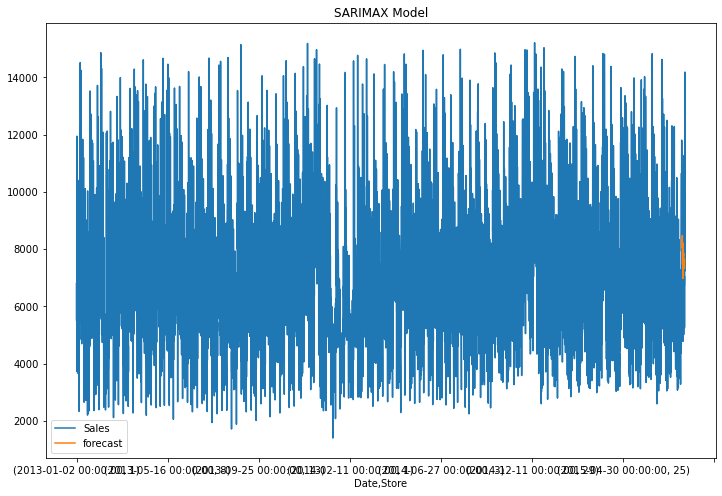

In [98]:
#Testing the fitted model.
data['forecast']=model_fit.predict(start=test_index_min,end=test_index_max,dynamic=True)
data[['Sales','forecast']].plot(figsize=(12,8), title='SARIMAX Model')

### As the predictions were not accurate, it seems that we need to analyze each Store seperately as the trends in one Store will affect the forecast of only that Store.

Let us proceed with individual Store analysis

## Split into different stores and analyze each one seperately
### Doing it again to get the smaller number of columns. We dropped a lot of columns that were not required

Nine Stores are: 1,3,8,9,13,25,29,31 and 46.

In [99]:
data_store1 = filtered_df[(filtered_df.Store==1)]
print('Number of records for store 1: ', len(data_store1))
data_store3 = filtered_df[(filtered_df.Store==3)]
print('Number of records for store 3: ', len(data_store3))
data_store8 = filtered_df[(filtered_df.Store==8)]
print('Number of records for store 8: ', len(data_store8))
data_store9 = filtered_df[(filtered_df.Store==9)]
print('Number of records for store 9: ', len(data_store9))
#
data_store13 = filtered_df[(filtered_df.Store==13)]
print('Number of records for store 13: ', len(data_store13))
data_store25 = filtered_df[(filtered_df.Store==25)]
print('Number of records for store 25: ', len(data_store25))
data_store29 = filtered_df[(filtered_df.Store==29)]
print('Number of records for store 29: ', len(data_store29))
data_store31 = filtered_df[(filtered_df.Store==31)]
print('Number of records for store 31: ', len(data_store31))
#
data_store46 = filtered_df[(filtered_df.Store==46)]
print('Number of records for store 46: ', len(data_store46))

Number of records for store 1:  781
Number of records for store 3:  779
Number of records for store 8:  784
Number of records for store 9:  779
Number of records for store 13:  621
Number of records for store 25:  752
Number of records for store 29:  779
Number of records for store 31:  784
Number of records for store 46:  622


# Store 1

## Outlier detection for each Store as it affects each independently

### Box plot and interquartile range

In [100]:
data=data_store1.copy()
data = data.sort_index(ascending=True) # Sort of ascending time and date

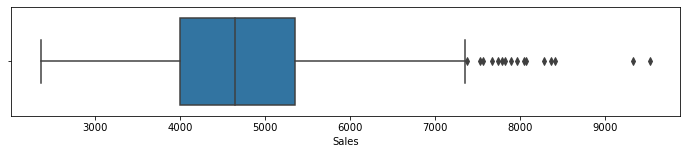

In [101]:
import seaborn as sns
fig = plt.subplots(figsize=(12, 2))
ax = sns.boxplot(x=data['Sales'],whis=1.5)

In [102]:
# Remove outliers for Sales, at 99% looks like we have many points
outlier_value = data['Sales'].quantile(0.99)
print(outlier_value)

7906.200000000003


In [103]:
# Update the outliers to NaN
data.Sales=data.Sales.where(data.Sales.between(0,outlier_value))
data['Sales'].describe()

count     773.00000
mean     4720.39586
std       940.91511
min      2362.00000
25%      3998.00000
50%      4624.00000
75%      5328.00000
max      7893.00000
Name: Sales, dtype: float64

In [104]:
# Remove outliers for Customers, at 99% looks like we have many points
outlier_value = data['Customers'].quantile(0.99)
print(outlier_value)

873.6000000000006


In [105]:
# Update the outliers to NaN
data.Customers=data.Customers.where(data.Customers.between(0,outlier_value))
data['Customers'].describe()

count    773.000000
mean     559.878396
std       84.242146
min      298.000000
25%      499.000000
50%      549.000000
75%      609.000000
max      871.000000
Name: Customers, dtype: float64

### The NaN or Missing Values can be filled with Linear Interpolated values

#### Do for both the Sales and Customers Column

In [106]:
# Check for nulls in all columns
data.isnull().sum(axis = 0)

Store            0
DayOfWeek        0
Sales            8
Customers        8
Open             0
Promo            0
SchoolHoliday    0
dtype: int64

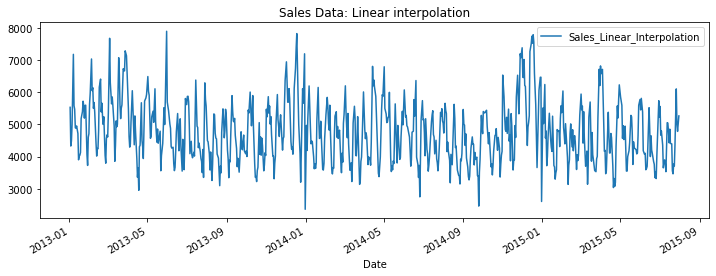

In [107]:
# FIll Missing with Linear Interpolation Doe Sales col
data = data.assign(Sales_Linear_Interpolation=data.Sales.interpolate(method='linear'))
data[['Sales_Linear_Interpolation']].plot(figsize=(12, 4))
plt.legend(loc='best')
plt.title('Sales Data: Linear interpolation')
plt.show(block=False)

In [108]:
data['Sales'] = data['Sales_Linear_Interpolation']
data.drop(columns=['Sales_Linear_Interpolation'],inplace=True)

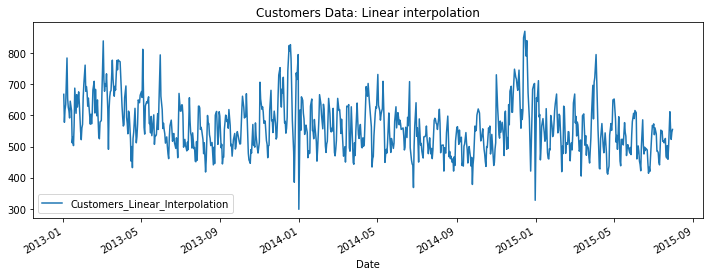

In [109]:
# FIll Missing with Linear Interpolation for Customers col
data = data.assign(Customers_Linear_Interpolation=data.Customers.interpolate(method='linear'))
data[['Customers_Linear_Interpolation']].plot(figsize=(12, 4))
plt.legend(loc='best')
plt.title('Customers Data: Linear interpolation')
plt.show(block=False)

In [110]:
# Replace with the Linear interpolated values
data['Customers'] = data['Customers_Linear_Interpolation']
data.drop(columns=['Customers_Linear_Interpolation'],inplace=True)

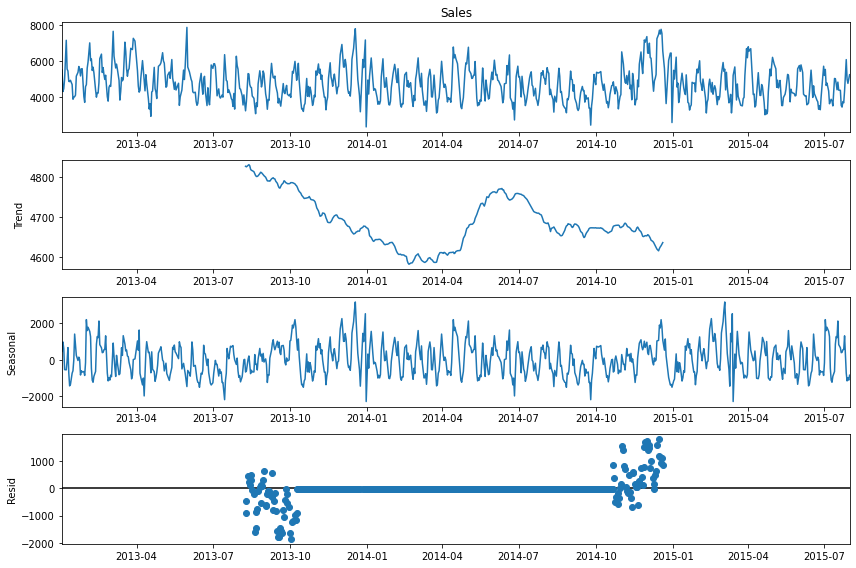

In [111]:
# Time series Decomposition
from pylab import rcParams
import statsmodels.api as sm
rcParams['figure.figsize'] = 12, 8
decomposition = sm.tsa.seasonal_decompose(data['Sales'], model='additive', freq=365) # additive seasonal index
fig = decomposition.plot()
    
plt.show()

#### Clearly, shows seasonality based on the three graphs drawn for the three stores but no trend.

## Split time series data into training and test keeping 36 rows for test (6 weeks)

In [112]:
data.head()
print("Number of Rows in DS 1:", len(data))

Number of Rows in DS 1: 781


In [113]:
# Leave last 36 for forecast, 6 weeks = 42 days minus 6 Sundays == 36
test_len = 36
train_len = len(data) - test_len
print(train_len)

745


In [114]:
# Set inferred freq
data.index.freq = data.index.inferred_freq
train = data.iloc[0:train_len, :]
test = data.iloc[train_len:,:]

In [115]:
train[endog_vars].head()

,Sales,Customers
Date,,
2013-01-02,5530.0,668.0
2013-01-03,4327.0,578.0
2013-01-04,4486.0,619.0
2013-01-05,4997.0,635.0
2013-01-07,7176.0,785.0


In [116]:
train[exog_vars].head()

,Promo,DayOfWeek,SchoolHoliday
Date,,,
2013-01-02,0,3,1
2013-01-03,0,4,1
2013-01-04,0,5,1
2013-01-05,0,6,1
2013-01-07,1,1,1


# Auto Regressive methods

## Stationarity vs non-stationary time series

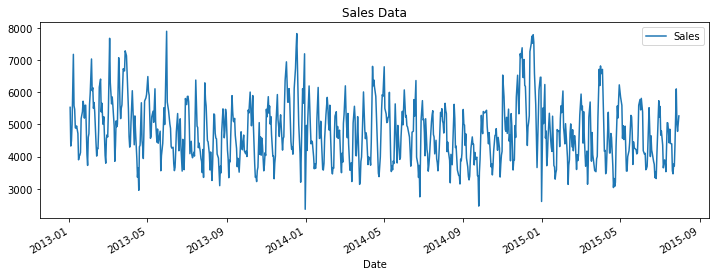

In [117]:
data['Sales'].plot(figsize=(12, 4))
plt.legend(loc='best')
plt.title('Sales Data')
plt.show(block=False)

### Augmented Dickey-Fuller (ADF) test

In [118]:
from statsmodels.tsa.stattools import adfuller
adf_test = adfuller(data['Sales'])

print('ADF Statistic: %f' % adf_test[0])
print('Critical Values @ 0.05: %.2f' % adf_test[4]['5%'])
print('p-value: %f' % adf_test[1])

ADF Statistic: -3.720745
Critical Values @ 0.05: -2.87
p-value: 0.003831


### The p-value is 0.003 way under than 0.05 and so according to ADF the series is Stationary

### Kwiatkowski-Phillips-Schmidt-Shin (KPSS) test

In [119]:
from statsmodels.tsa.stattools import kpss
kpss_test = kpss(data['Sales'])

print('KPSS Statistic: %f' % kpss_test[0])
print('Critical Values @ 0.05: %.2f' % kpss_test[3]['5%'])
print('p-value: %f' % kpss_test[1])

KPSS Statistic: 0.318387
Critical Values @ 0.05: 0.46
p-value: 0.100000


/Users/venkir/opt/anaconda3/lib/python3.9/site-packages/statsmodels/tsa/stattools.py:1910: InterpolationWarning: The test statistic is outside of the range of p-values available in the
look-up table. The actual p-value is greater than the p-value returned.

  warnings.warn(


### The p-value is 0.1 is higher than 0.05 and so according to KPSS the series is Stationary. 

### Autocorrelation function (ACF) and PACF as subplots

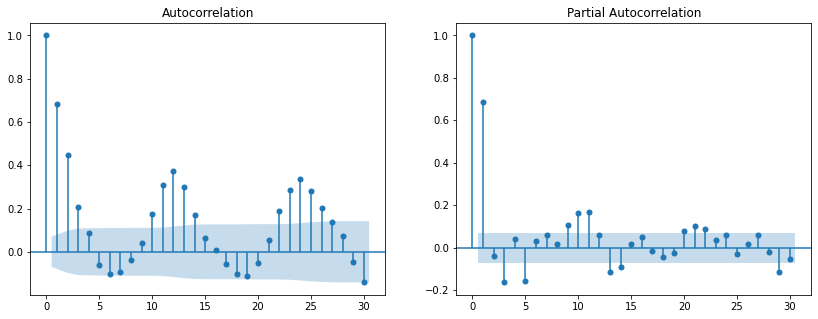

In [120]:
from statsmodels.graphics.tsaplots import plot_acf
from statsmodels.graphics.tsaplots import plot_pacf

fig, ax = plt.subplots(1,2,figsize=(14,5))
sm.graphics.tsa.plot_acf(data['Sales'].squeeze(), lags=30, ax=ax[0])
sm.graphics.tsa.plot_pacf(data['Sales'].squeeze(), lags=30, ax=ax[1])
plt.show()

#### p = 1 and q = 1

## VAR Model

In [121]:
# Define endog vards and exog vars and scale Sales and Customers to same metric
#from sklearn.preprocessing import StandardScaler
#caler = StandardScaler()
#train[endog_vars] = scaler.fit_transform(train[endog_vars]) # for train data
#test[endog_vars] = scaler.fit_transform(test[endog_vars]) # for test data

In [122]:
# Check and see if Scaling worked
train.head()

,Store,DayOfWeek,Sales,Customers,Open,Promo,SchoolHoliday
Date,,,,,,,
2013-01-02,1,3,5530.0,668.0,1,0,1
2013-01-03,1,4,4327.0,578.0,1,0,1
2013-01-04,1,5,4486.0,619.0,1,0,1
2013-01-05,1,6,4997.0,635.0,1,0,1
2013-01-07,1,1,7176.0,785.0,1,1,1


In [123]:
#  Stationarity Test - ADF Test
for i in range(len(endog_vars)):
    print('\n' + endog_vars[i] + ': ADF test results:')
    result = adfuller(data[endog_vars[i]].dropna())
    print('ADF Statistic: %f' % result[0])
    print('p-value: %f' % result[1])
    print('Critical Values:')
    for key, value in result[4].items():
        if key=='5%':
            print('\t%s: %.3f' % (key, value))


Sales: ADF test results:
ADF Statistic: -3.720745
p-value: 0.003831
Critical Values:
	5%: -2.865

Customers: ADF test results:
ADF Statistic: -3.214964
p-value: 0.019135
Critical Values:
	5%: -2.865


In [124]:
# VAR does not need exog vars
mod = sm.tsa.VARMAX(train[endog_vars], order=(2,1), trend='n') # p = 1 and q = 1
res = mod.fit(maxiter=1000, disp=False)
print(res.summary())
#Note the AIC value - lower AIC => better model

/Users/venkir/opt/anaconda3/lib/python3.9/site-packages/statsmodels/tsa/statespace/varmax.py:161: EstimationWarning: Estimation of VARMA(p,q) models is not generically robust, due especially to identification issues.
  warn('Estimation of VARMA(p,q) models is not generically robust,'
/Users/venkir/opt/anaconda3/lib/python3.9/site-packages/statsmodels/tsa/base/tsa_model.py:581: ValueWarning: A date index has been provided, but it has no associated frequency information and so will be ignored when e.g. forecasting.
  warnings.warn('A date index has been provided, but it has no'


                             Statespace Model Results                             
Dep. Variable:     ['Sales', 'Customers']   No. Observations:                  745
Model:                         VARMA(2,1)   Log Likelihood               -9475.124
Date:                    Mon, 17 Jan 2022   AIC                          18980.249
Time:                            13:19:02   BIC                          19049.450
Sample:                                 0   HQIC                         19006.922
                                    - 745                                         
Covariance Type:                      opg                                         
Ljung-Box (L1) (Q):             1.34, 0.03   Jarque-Bera (JB):        333.28, 67.22
Prob(Q):                        0.25, 0.86   Prob(JB):                   0.00, 0.00
Heteroskedasticity (H):         1.06, 1.07   Skew:                       0.05, 0.25
Prob(H) (two-sided):            0.67, 0.58   Kurtosis:                   6.27, 4.39


In [125]:
predictions = res.forecast(steps=test_len, exog=test[exog_vars])
predictions['Date'] = test.index
predictions = predictions.set_index('Date')

/Users/venkir/opt/anaconda3/lib/python3.9/site-packages/statsmodels/tsa/base/tsa_model.py:376: ValueWarning: No supported index is available. Prediction results will be given with an integer index beginning at `start`.
  warnings.warn('No supported index is available.'


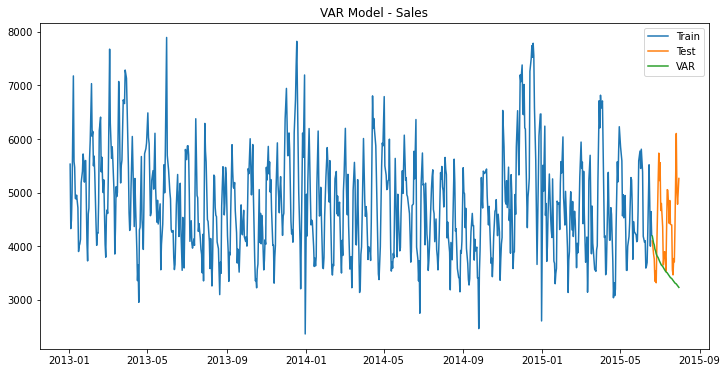

In [126]:
plt.figure(figsize=(12,6))
plt.plot(train['Sales'], label='Train')
plt.plot(test['Sales'], label='Test')
plt.plot(predictions['Sales'], label='VAR')
plt.legend(loc='best')
plt.title('VAR Model - Sales')
plt.show()

In [127]:
# Root Mean Square Error (RMSE)
rmse = np.sqrt(mean_squared_error(test.Sales, predictions.Sales)).round(2)

model_comparison=pd.DataFrame()
model_comparison.loc[0,'Model']='VAR'
model_comparison.loc[0,'Variable']='Sales'
model_comparison.loc[0,'RMSE']=rmse

rmse = np.sqrt(mean_squared_error(test.Customers, predictions.Customers)).round(2)
#print('Investment: RMSE:',  rmse)

append=pd.DataFrame()
append.loc[0,'Model']='VAR'
append.loc[0,'Variable']='Customers'
append.loc[0,'RMSE']=rmse

model_comparison = model_comparison.append(append)

# Mean Absolute Percentage Error
abs_error = np.abs(test.Sales-predictions.Sales)
actual = test.Sales
mape = np.round(np.mean(abs_error/actual)*100, 2)

model_comparison.loc[model_comparison['Variable']=='Sales', 'MAPE'] = mape

abs_error = np.abs(test.Customers-predictions.Customers)
actual = test.Customers
mape = np.round(np.mean(abs_error/actual)*100, 2)
#print('Investment: MAPE:',  mape)

model_comparison.loc[model_comparison['Variable']=='Customers', 'MAPE'] = mape

In [128]:
model_comparison.reset_index(drop=True, inplace=True)
#model_comparison

In [129]:
# Display concatenated Diplay of rrmse and mape errors
results_display = model_comparison.copy()
results_display

,Model,Variable,RMSE,MAPE
0,VAR,Sales,1167.65,19.41
1,VAR,Customers,96.11,15.67


In [130]:
from statsmodels.tsa.api import VAR
from statsmodels.tsa.base import  datetools
var = VAR(data[endog_vars])

x= var.select_order()
x.summary()

/Users/venkir/opt/anaconda3/lib/python3.9/site-packages/statsmodels/tsa/base/tsa_model.py:581: ValueWarning: A date index has been provided, but it has no associated frequency information and so will be ignored when e.g. forecasting.
  warnings.warn('A date index has been provided, but it has no'


,AIC,BIC,FPE,HQIC
0,20.63,20.65,9.149e+08,20.64
1,19.75,19.79,3.786e+08,19.77
2,19.74,19.80,3.733e+08,19.76
3,19.69,19.78,3.567e+08,19.73
4,19.63,19.74,3.368e+08,19.68
5,19.55,19.68,3.086e+08,19.60
6,19.50,19.66*,2.948e+08,19.56*
7,19.51,19.69,2.966e+08,19.58
8,19.50,19.71,2.948e+08,19.58
9,19.50,19.73,2.941e+08,19.59


In [131]:
"""
    Johansen cointegration test of the cointegration rank of a VECM

    Parameters
    ----------
    endog : array_like (nobs_tot x neqs)
        Data to test
    det_order : int
        * -1 - no deterministic terms - model1
        * 0 - constant term - model3
        * 1 - linear trend
    k_ar_diff : int, nonnegative
        Number of lagged differences in the model.
"""

def joh_output(res):
    output = pd.DataFrame([res.lr2,res.lr1],
                          index=['max_eig_stat',"trace_stat"])
    print(output.T,'\n')
    print("Critical values(90%, 95%, 99%) of max_eig_stat\n",res.cvm,'\n')
    print("Critical values(90%, 95%, 99%) of trace_stat\n",res.cvt,'\n')

In [132]:
joh_model1 = coint_johansen(data[endog_vars],-1,1) # k_ar_diff +1 = K
joh_output(joh_model1)

   max_eig_stat  trace_stat
0    146.954094  148.783095
1      1.829002    1.829002 

Critical values(90%, 95%, 99%) of max_eig_stat
 [[ 9.4748 11.2246 15.0923]
 [ 2.9762  4.1296  6.9406]] 

Critical values(90%, 95%, 99%) of trace_stat
 [[10.4741 12.3212 16.364 ]
 [ 2.9762  4.1296  6.9406]] 



In [133]:
from statsmodels.tsa.vector_ar.vecm import select_coint_rank
rank=select_coint_rank(data[endog_vars],-1,1)
print(rank.rank)
#result=stt.coint(endog['Sales'], endog['Customers'])

1


**These two Series Sales and Customers are COINTEGRATED because the rank = 1**

In [134]:
# use fit = 14
results = var.fit(14)
#We can check the summary of the model by.
results.summary()

  Summary of Regression Results   
Model:                         VAR
Method:                        OLS
Date:           Mon, 17, Jan, 2022
Time:                     13:19:02
--------------------------------------------------------------------
No. of Equations:         2.00000    BIC:                    19.8249
Nobs:                     767.000    HQIC:                   19.6090
Log likelihood:          -9586.89    FPE:                2.86704e+08
AIC:                      19.4739    Det(Omega_mle):     2.66194e+08
--------------------------------------------------------------------
Results for equation Sales
                   coefficient       std. error           t-stat            prob
--------------------------------------------------------------------------------
const               877.573987       246.816946            3.556           0.000
L1.Sales              0.585306         0.079379            7.374           0.000
L1.Customers          0.421452         0.880122            0

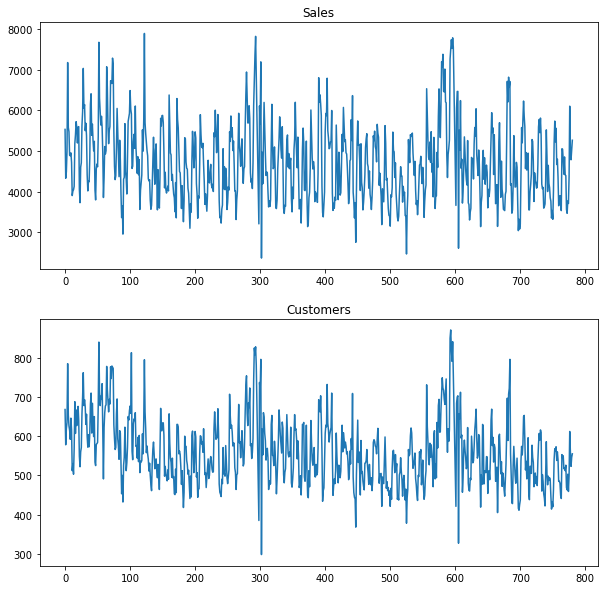

In [135]:
#Visualizing the input:
results.plot();

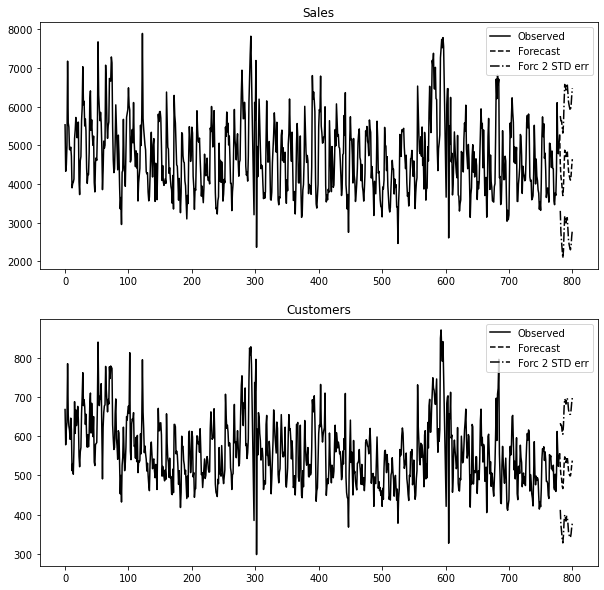

In [136]:
#We can also plot our forecasted values by the model.

results.plot_forecast(20);

### VARMAX Model

In [137]:
from statsmodels.tsa.api import VARMAX
mod = sm.tsa.VARMAX(data[endog_vars], order=(2,1), trend='n', exog=data[exog_vars])
res = mod.fit(maxiter=1000, disp=False)
print(res.summary())

/Users/venkir/opt/anaconda3/lib/python3.9/site-packages/statsmodels/tsa/statespace/varmax.py:161: EstimationWarning: Estimation of VARMA(p,q) models is not generically robust, due especially to identification issues.
  warn('Estimation of VARMA(p,q) models is not generically robust,'
/Users/venkir/opt/anaconda3/lib/python3.9/site-packages/statsmodels/tsa/base/tsa_model.py:581: ValueWarning: A date index has been provided, but it has no associated frequency information and so will be ignored when e.g. forecasting.
  warnings.warn('A date index has been provided, but it has no'
/Users/venkir/opt/anaconda3/lib/python3.9/site-packages/statsmodels/base/model.py:566: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "


                             Statespace Model Results                             
Dep. Variable:     ['Sales', 'Customers']   No. Observations:                  781
Model:                        VARMAX(2,1)   Log Likelihood              -10066.876
Date:                    Mon, 17 Jan 2022   AIC                          20175.752
Time:                            13:19:38   BIC                          20273.624
Sample:                                 0   HQIC                         20213.393
                                    - 781                                         
Covariance Type:                      opg                                         
Ljung-Box (L1) (Q):             4.45, 0.00   Jarque-Bera (JB):        147.03, 47.31
Prob(Q):                        0.03, 0.98   Prob(JB):                   0.00, 0.00
Heteroskedasticity (H):         1.01, 1.08   Skew:                      0.45, -0.10
Prob(H) (two-sided):            0.92, 0.55   Kurtosis:                   4.92, 4.19


In [138]:
predictions = res.forecast(steps=test_len, exog=test[exog_vars])
predictions['Date'] = test.index
predictions = predictions.set_index('Date')

/Users/venkir/opt/anaconda3/lib/python3.9/site-packages/statsmodels/tsa/statespace/varmax.py:161: EstimationWarning: Estimation of VARMA(p,q) models is not generically robust, due especially to identification issues.
  warn('Estimation of VARMA(p,q) models is not generically robust,'
/Users/venkir/opt/anaconda3/lib/python3.9/site-packages/statsmodels/tsa/base/tsa_model.py:376: ValueWarning: No supported index is available. Prediction results will be given with an integer index beginning at `start`.
  warnings.warn('No supported index is available.'
/Users/venkir/opt/anaconda3/lib/python3.9/site-packages/statsmodels/tsa/statespace/varmax.py:161: EstimationWarning: Estimation of VARMA(p,q) models is not generically robust, due especially to identification issues.
  warn('Estimation of VARMA(p,q) models is not generically robust,'


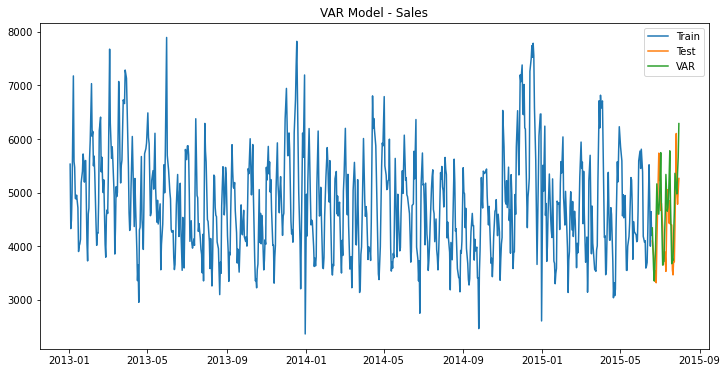

In [139]:
plt.figure(figsize=(12,6))
plt.plot(train['Sales'], label='Train')
plt.plot(test['Sales'], label='Test')
plt.plot(predictions['Sales'], label='VAR')
plt.legend(loc='best')
plt.title('VAR Model - Sales')
plt.show()

In [140]:
# Root Mean Square Error (RMSE)
rmse = np.sqrt(mean_squared_error(test.Sales, predictions.Sales)).round(2)

model_comparison=pd.DataFrame()
model_comparison.loc[0,'Model']='VARMAX'
model_comparison.loc[0,'Variable']='Sales'
model_comparison.loc[0,'RMSE']=rmse

rmse = np.sqrt(mean_squared_error(test.Customers, predictions.Customers)).round(2)
#print('Investment: RMSE:',  rmse)

append=pd.DataFrame()
append.loc[0,'Model']='VARMAX'
append.loc[0,'Variable']='Customers'
append.loc[0,'RMSE']=rmse

model_comparison = model_comparison.append(append)

# Mean Absolute Percentage Error
abs_error = np.abs(test.Sales-predictions.Sales)
actual = test.Sales
mape = np.round(np.mean(abs_error/actual)*100, 2)

model_comparison.loc[model_comparison['Variable']=='Sales', 'MAPE'] = mape

abs_error = np.abs(test.Customers-predictions.Customers)
actual = test.Customers
mape = np.round(np.mean(abs_error/actual)*100, 2)
#print('Investment: MAPE:',  mape)

model_comparison.loc[model_comparison['Variable']=='Customers', 'MAPE'] = mape

In [141]:
model_comparison.reset_index(drop=True, inplace=True)
#model_comparison

In [142]:
results_display = pd.concat([results_display, model_comparison])
results_display

,Model,Variable,RMSE,MAPE
0,VAR,Sales,1167.65,19.41
1,VAR,Customers,96.11,15.67
0,VARMAX,Sales,722.13,13.88
1,VARMAX,Customers,74.18,11.18


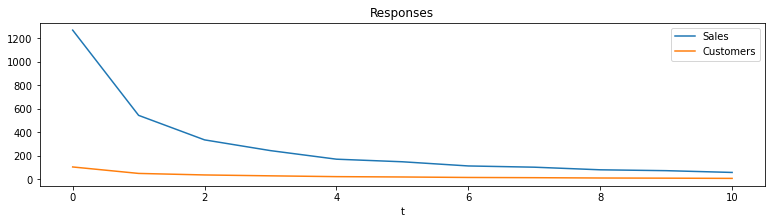

In [143]:
ax = res.impulse_responses(10, orthogonalized=True, impulse=[1, 0]).plot(figsize=(13,3))
ax.set(xlabel='t', title='Responses');

### SARIMAX Model for Sales

In [144]:
model=sm.tsa.statespace.SARIMAX(data['Sales'],order=(1, 1, 1),seasonal_order=(1,0,1,12), exog=data[exog_vars])
results=model.fit()
print(model_fit.params)

/Users/venkir/opt/anaconda3/lib/python3.9/site-packages/statsmodels/tsa/base/tsa_model.py:581: ValueWarning: A date index has been provided, but it has no associated frequency information and so will be ignored when e.g. forecasting.
  warnings.warn('A date index has been provided, but it has no'
/Users/venkir/opt/anaconda3/lib/python3.9/site-packages/statsmodels/tsa/base/tsa_model.py:581: ValueWarning: A date index has been provided, but it has no associated frequency information and so will be ignored when e.g. forecasting.
  warnings.warn('A date index has been provided, but it has no'
 This problem is unconstrained.


RUNNING THE L-BFGS-B CODE

           * * *

Machine precision = 2.220D-16
 N =            8     M =           10

At X0         0 variables are exactly at the bounds

At iterate    0    f=  8.47383D+00    |proj g|=  1.21385D+00

At iterate    5    f=  7.85688D+00    |proj g|=  1.69046D-02

At iterate   10    f=  7.84244D+00    |proj g|=  7.41600D-03

At iterate   15    f=  7.84081D+00    |proj g|=  1.56596D-02

At iterate   20    f=  7.83819D+00    |proj g|=  3.81061D-03

At iterate   25    f=  7.83773D+00    |proj g|=  8.72720D-04

At iterate   30    f=  7.83770D+00    |proj g|=  2.33319D-03

At iterate   35    f=  7.83500D+00    |proj g|=  9.94078D-03

At iterate   40    f=  7.83111D+00    |proj g|=  9.08050D-04

           * * *

Tit   = total number of iterations
Tnf   = total number of function evaluations
Tnint = total number of segments explored during Cauchy searches
Skip  = number of BFGS updates skipped
Nact  = number of active bounds at final generalized Cauchy point
Projg 

<AxesSubplot:title={'center':'SARIMAX Model - Sales'}, xlabel='Date'>

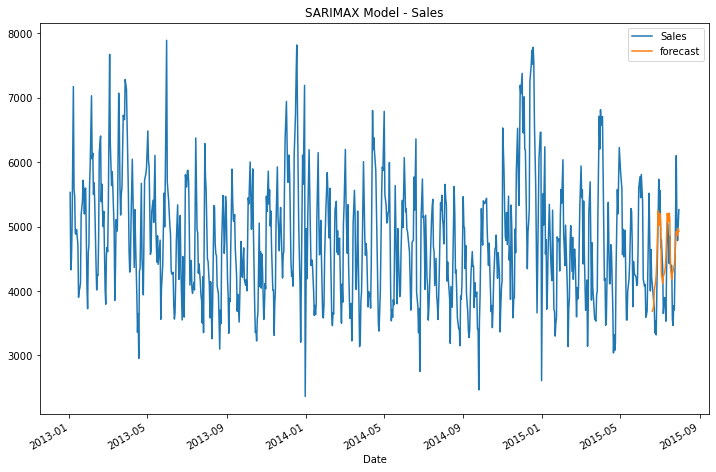

In [145]:
#Testing the fitted model.
data['forecast']=results.predict(start=test.index.min(),end=test.index.max(),dynamic=True)
data[['Sales','forecast']].plot(figsize=(12,8), title='SARIMAX Model - Sales')

In [146]:
rmse = np.sqrt(mean_squared_error(test['Sales'], data['forecast'][test.index.min():])).round(2)
mape = np.round(np.mean(np.abs(test['Sales']-data['forecast'][test.index.min():])/test['Sales'])*100,2)

tempResults = pd.DataFrame({'Model':['SARIMAX method'], 'Variable':['Sales'], 'RMSE': [rmse],'MAPE': [mape] })
#tempResults

In [147]:
results_display = pd.concat([results_display, tempResults])
results_display

,Model,Variable,RMSE,MAPE
0,VAR,Sales,1167.65,19.41
1,VAR,Customers,96.11,15.67
0,VARMAX,Sales,722.13,13.88
1,VARMAX,Customers,74.18,11.18
0,SARIMAX method,Sales,518.15,10.49


### SARIMAX Model for Customers

In [148]:
model=sm.tsa.statespace.SARIMAX(data['Customers'],order=(1, 1, 1),seasonal_order=(1,0,1,12), exog=data[exog_vars])
results=model.fit()
print(model_fit.params)

/Users/venkir/opt/anaconda3/lib/python3.9/site-packages/statsmodels/tsa/base/tsa_model.py:581: ValueWarning: A date index has been provided, but it has no associated frequency information and so will be ignored when e.g. forecasting.
  warnings.warn('A date index has been provided, but it has no'
/Users/venkir/opt/anaconda3/lib/python3.9/site-packages/statsmodels/tsa/base/tsa_model.py:581: ValueWarning: A date index has been provided, but it has no associated frequency information and so will be ignored when e.g. forecasting.
  warnings.warn('A date index has been provided, but it has no'
 This problem is unconstrained.


RUNNING THE L-BFGS-B CODE

           * * *

Machine precision = 2.220D-16
 N =            8     M =           10

At X0         0 variables are exactly at the bounds

At iterate    0    f=  6.08173D+00    |proj g|=  1.15319D+00

At iterate    5    f=  5.50129D+00    |proj g|=  1.92656D-02

At iterate   10    f=  5.48355D+00    |proj g|=  1.09902D-02

At iterate   15    f=  5.48258D+00    |proj g|=  9.13138D-03

At iterate   20    f=  5.48075D+00    |proj g|=  1.64080D-03

At iterate   25    f=  5.47783D+00    |proj g|=  3.37035D-03

At iterate   30    f=  5.47769D+00    |proj g|=  3.47510D-04

At iterate   35    f=  5.47747D+00    |proj g|=  9.08130D-03

At iterate   40    f=  5.47461D+00    |proj g|=  1.41674D-02

At iterate   45    f=  5.47367D+00    |proj g|=  3.15859D-03

At iterate   50    f=  5.47359D+00    |proj g|=  3.74883D-04

           * * *

Tit   = total number of iterations
Tnf   = total number of function evaluations
Tnint = total number of segments explored during Cau

/Users/venkir/opt/anaconda3/lib/python3.9/site-packages/statsmodels/base/model.py:566: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "


<AxesSubplot:title={'center':'SARIMAX Model - Customers'}, xlabel='Date'>

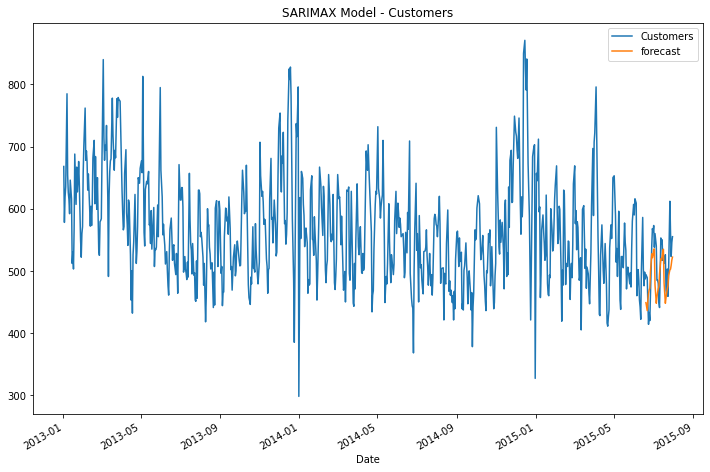

In [149]:
#Testing the fitted model.
data['forecast']=results.predict(start=test.index.min(),end=test.index.max(),dynamic=True)
data[['Customers','forecast']].plot(figsize=(12,8), title='SARIMAX Model - Customers')

In [150]:
rmse = np.sqrt(mean_squared_error(test['Customers'], data['forecast'][test.index.min():])).round(2)
mape = np.round(np.mean(np.abs(test['Customers']-data['forecast'][test.index.min():])/test['Sales'])*100,2)

tempResults = pd.DataFrame({'Model':['SARIMAX method'], 'Variable':['Customers'], 'RMSE': [rmse],'MAPE': [mape] })
#tempResults

In [151]:
results_display = pd.concat([results_display, tempResults])
results_display

,Model,Variable,RMSE,MAPE
0,VAR,Sales,1167.65,19.41
1,VAR,Customers,96.11,15.67
0,VARMAX,Sales,722.13,13.88
1,VARMAX,Customers,74.18,11.18
0,SARIMAX method,Sales,518.15,10.49
0,SARIMAX method,Customers,43.17,0.80


# Store 3

## Outlier detection for each Store as it affects each independently

### Box plot and interquartile range

In [152]:
data=data_store3.copy()
data = data.sort_index(ascending=True) # Sort of ascending time and date

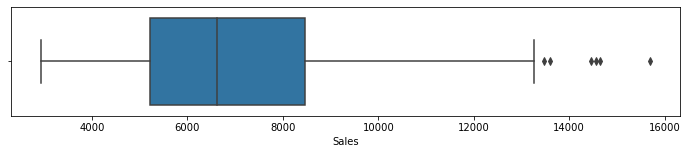

In [153]:
import seaborn as sns
fig = plt.subplots(figsize=(12, 2))
ax = sns.boxplot(x=data['Sales'],whis=1.5)

In [154]:
# Remove outliers for Sales, at 99% looks like we have many points
outlier_value = data['Sales'].quantile(0.99)
print(outlier_value)

12675.760000000013


In [155]:
# Update the outliers to NaN
data.Sales=data.Sales.where(data.Sales.between(0,outlier_value))
data['Sales'].describe()

count      771.000000
mean      6868.373541
std       2077.723288
min       2936.000000
25%       5201.000000
50%       6595.000000
75%       8406.500000
max      12564.000000
Name: Sales, dtype: float64

In [156]:
# Remove outliers for Customers, at 99% looks like we have many points
outlier_value = data['Customers'].quantile(0.99)
print(outlier_value)

1194.1000000000001


In [157]:
# Update the outliers to NaN
data.Customers=data.Customers.where(data.Customers.between(0,outlier_value))
data['Customers'].describe()

count     771.000000
mean      744.455253
std       161.453822
min       381.000000
25%       659.500000
50%       743.000000
75%       858.000000
max      1193.000000
Name: Customers, dtype: float64

### The NaN or Missing Values can be filled with Linear Interpolated values

#### Do for both the Sales and Customers Column

In [158]:
# Check for nulls in all columns
data.isnull().sum(axis = 0)

Store            0
DayOfWeek        0
Sales            8
Customers        8
Open             0
Promo            0
SchoolHoliday    0
dtype: int64

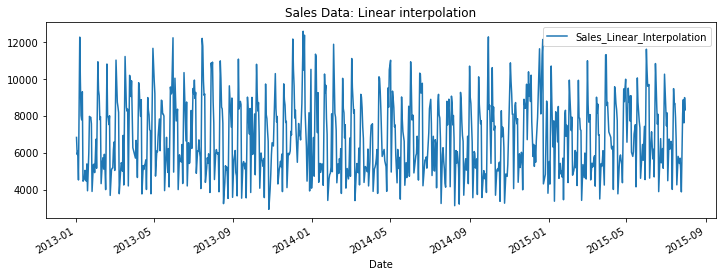

In [159]:
# FIll Missing with Linear Interpolation Doe Sales col
data = data.assign(Sales_Linear_Interpolation=data.Sales.interpolate(method='linear'))
data[['Sales_Linear_Interpolation']].plot(figsize=(12, 4))
plt.legend(loc='best')
plt.title('Sales Data: Linear interpolation')
plt.show(block=False)

In [160]:
data['Sales'] = data['Sales_Linear_Interpolation']
data.drop(columns=['Sales_Linear_Interpolation'],inplace=True)

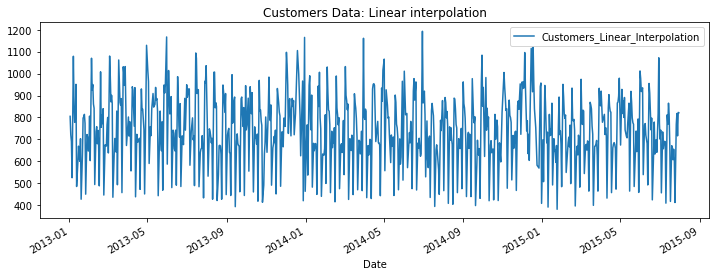

In [161]:
# FIll Missing with Linear Interpolation for Customers col
data = data.assign(Customers_Linear_Interpolation=data.Customers.interpolate(method='linear'))
data[['Customers_Linear_Interpolation']].plot(figsize=(12, 4))
plt.legend(loc='best')
plt.title('Customers Data: Linear interpolation')
plt.show(block=False)

In [162]:
# Replace with the Linear interpolated values
data['Customers'] = data['Customers_Linear_Interpolation']
data.drop(columns=['Customers_Linear_Interpolation'],inplace=True)

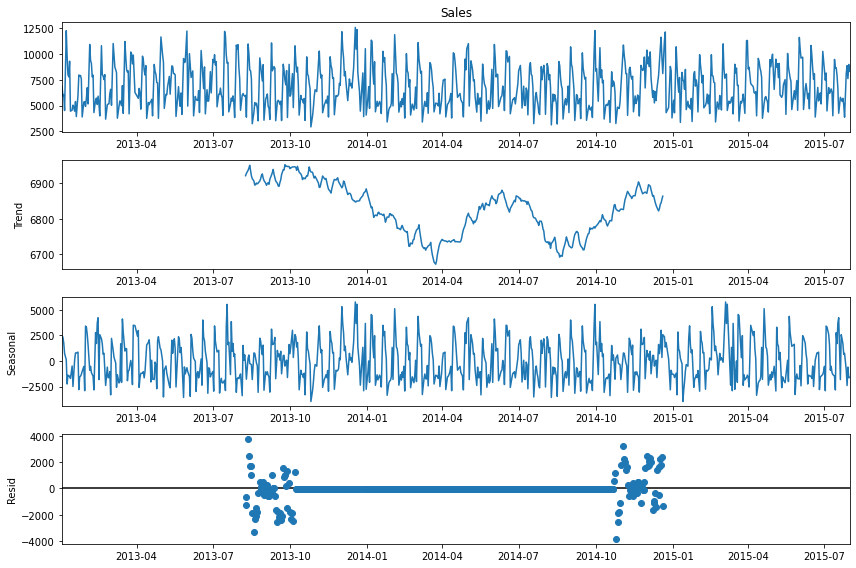

In [163]:
# Time series Decomposition
from pylab import rcParams
import statsmodels.api as sm
rcParams['figure.figsize'] = 12, 8
decomposition = sm.tsa.seasonal_decompose(data['Sales'], model='additive', freq=365) # additive seasonal index
fig = decomposition.plot()
    
plt.show()

#### Clearly, shows seasonality based on the three graphs drawn for the three stores but no trend.

## Split time series data into training and test keeping 36 rows for test (6 weeks)

In [164]:
data.head()
print("Number of Rows in DS 3:", len(data))

Number of Rows in DS 3: 779


In [165]:
# Leave last 36 for forecast, 6 weeks = 42 days minus 6 Sundays == 36
test_len = 36
train_len = len(data) - test_len
print(train_len)

743


In [166]:
# Set inferred freq
data.index.freq = data.index.inferred_freq
train = data.iloc[0:train_len, :]
test = data.iloc[train_len:,:]

In [167]:
train[endog_vars].head()

,Sales,Customers
Date,,
2013-01-02,6823.0,805.0
2013-01-03,5902.0,721.0
2013-01-04,6069.0,690.0
2013-01-05,4523.0,525.0
2013-01-07,12247.0,1079.0


In [168]:
train[exog_vars].head()

,Promo,DayOfWeek,SchoolHoliday
Date,,,
2013-01-02,0,3,1
2013-01-03,0,4,1
2013-01-04,0,5,1
2013-01-05,0,6,0
2013-01-07,1,1,0


# Auto Regressive methods

## Stationarity vs non-stationary time series

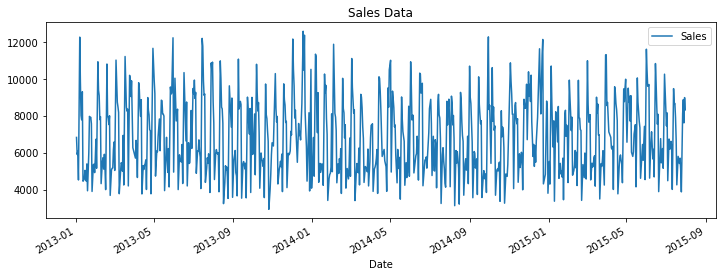

In [169]:
data['Sales'].plot(figsize=(12, 4))
plt.legend(loc='best')
plt.title('Sales Data')
plt.show(block=False)

### Augmented Dickey-Fuller (ADF) test

In [170]:
from statsmodels.tsa.stattools import adfuller
adf_test = adfuller(data['Sales'])

print('ADF Statistic: %f' % adf_test[0])
print('Critical Values @ 0.05: %.2f' % adf_test[4]['5%'])
print('p-value: %f' % adf_test[1])

ADF Statistic: -6.945020
Critical Values @ 0.05: -2.87
p-value: 0.000000


### The p-value is 0.003 way under than 0.05 and so according to ADF the series is Stationary

### Kwiatkowski-Phillips-Schmidt-Shin (KPSS) test

In [171]:
from statsmodels.tsa.stattools import kpss
kpss_test = kpss(data['Sales'])

print('KPSS Statistic: %f' % kpss_test[0])
print('Critical Values @ 0.05: %.2f' % kpss_test[3]['5%'])
print('p-value: %f' % kpss_test[1])

KPSS Statistic: 0.076302
Critical Values @ 0.05: 0.46
p-value: 0.100000


/Users/venkir/opt/anaconda3/lib/python3.9/site-packages/statsmodels/tsa/stattools.py:1910: InterpolationWarning: The test statistic is outside of the range of p-values available in the
look-up table. The actual p-value is greater than the p-value returned.

  warnings.warn(


### The p-value is 0.1 is higher than 0.05 and so according to KPSS the series is Stationary. 

### Autocorrelation function (ACF) and PACF as subplots

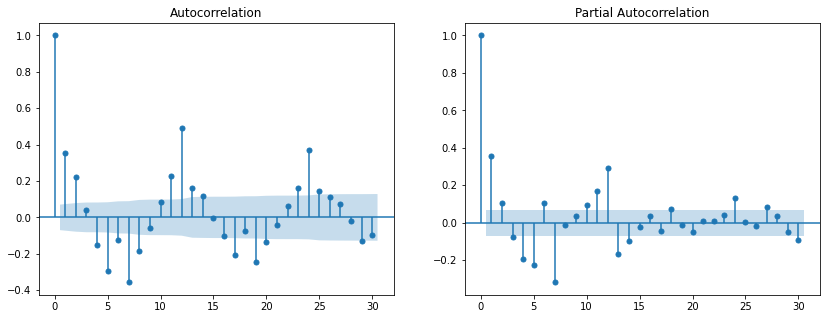

In [172]:
from statsmodels.graphics.tsaplots import plot_acf
from statsmodels.graphics.tsaplots import plot_pacf

fig, ax = plt.subplots(1,2,figsize=(14,5))
sm.graphics.tsa.plot_acf(data['Sales'].squeeze(), lags=30, ax=ax[0])
sm.graphics.tsa.plot_pacf(data['Sales'].squeeze(), lags=30, ax=ax[1])
plt.show()

#### p = 1 and q = 1

## VAR Model

In [173]:
# Define endog vards and exog vars and scale Sales and Customers to same metric
#from sklearn.preprocessing import StandardScaler
#caler = StandardScaler()
#train[endog_vars] = scaler.fit_transform(train[endog_vars]) # for train data
#test[endog_vars] = scaler.fit_transform(test[endog_vars]) # for test data

In [174]:
# Check and see if Scaling worked
train.head()

,Store,DayOfWeek,Sales,Customers,Open,Promo,SchoolHoliday
Date,,,,,,,
2013-01-02,3,3,6823.0,805.0,1,0,1
2013-01-03,3,4,5902.0,721.0,1,0,1
2013-01-04,3,5,6069.0,690.0,1,0,1
2013-01-05,3,6,4523.0,525.0,1,0,0
2013-01-07,3,1,12247.0,1079.0,1,1,0


In [175]:
#  Stationarity Test - ADF Test
for i in range(len(endog_vars)):
    print('\n' + endog_vars[i] + ': ADF test results:')
    result = adfuller(data[endog_vars[i]].dropna())
    print('ADF Statistic: %f' % result[0])
    print('p-value: %f' % result[1])
    print('Critical Values:')
    for key, value in result[4].items():
        if key=='5%':
            print('\t%s: %.3f' % (key, value))


Sales: ADF test results:
ADF Statistic: -6.945020
p-value: 0.000000
Critical Values:
	5%: -2.865

Customers: ADF test results:
ADF Statistic: -6.010130
p-value: 0.000000
Critical Values:
	5%: -2.865


In [176]:
# VAR does not need exog vars
mod = sm.tsa.VARMAX(train[endog_vars], order=(2,1), trend='n') # p = 1 and q = 1
res = mod.fit(maxiter=1000, disp=False)
print(res.summary())
#Note the AIC value - lower AIC => better model

/Users/venkir/opt/anaconda3/lib/python3.9/site-packages/statsmodels/tsa/statespace/varmax.py:161: EstimationWarning: Estimation of VARMA(p,q) models is not generically robust, due especially to identification issues.
  warn('Estimation of VARMA(p,q) models is not generically robust,'
/Users/venkir/opt/anaconda3/lib/python3.9/site-packages/statsmodels/tsa/base/tsa_model.py:581: ValueWarning: A date index has been provided, but it has no associated frequency information and so will be ignored when e.g. forecasting.
  warnings.warn('A date index has been provided, but it has no'


                             Statespace Model Results                             
Dep. Variable:     ['Sales', 'Customers']   No. Observations:                  743
Model:                         VARMA(2,1)   Log Likelihood              -10757.720
Date:                    Mon, 17 Jan 2022   AIC                          21545.439
Time:                            13:19:49   BIC                          21614.600
Sample:                                 0   HQIC                         21572.100
                                    - 743                                         
Covariance Type:                      opg                                         
Ljung-Box (L1) (Q):             0.00, 0.02   Jarque-Bera (JB):      178.02, 5258.79
Prob(Q):                        0.95, 0.89   Prob(JB):                   0.00, 0.00
Heteroskedasticity (H):         1.06, 1.84   Skew:                       0.12, 0.79
Prob(H) (two-sided):            0.63, 0.00   Kurtosis:                  5.39, 15.94


In [177]:
test_len=len(test.index)
test_len

36

In [178]:
predictions = res.forecast(steps=test_len, exog=test[exog_vars])
predictions['Date'] = test.index
predictions = predictions.set_index('Date')

/Users/venkir/opt/anaconda3/lib/python3.9/site-packages/statsmodels/tsa/base/tsa_model.py:376: ValueWarning: No supported index is available. Prediction results will be given with an integer index beginning at `start`.
  warnings.warn('No supported index is available.'


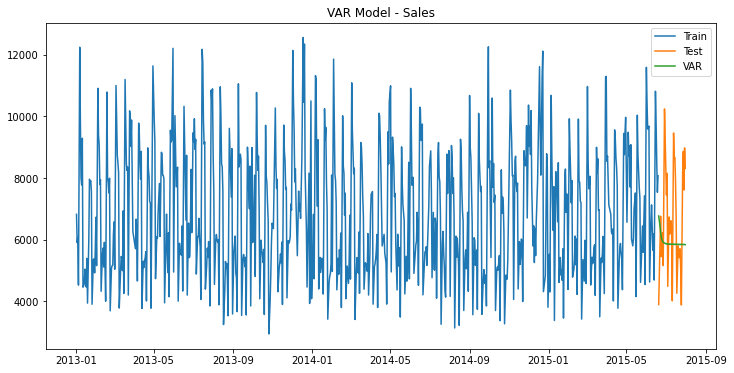

In [179]:
plt.figure(figsize=(12,6))
plt.plot(train['Sales'], label='Train')
plt.plot(test['Sales'], label='Test')
plt.plot(predictions['Sales'], label='VAR')
plt.legend(loc='best')
plt.title('VAR Model - Sales')
plt.show()

In [180]:
# Root Mean Square Error (RMSE)
rmse = np.sqrt(mean_squared_error(test.Sales, predictions.Sales)).round(2)

model_comparison=pd.DataFrame()
model_comparison.loc[0,'Model']='VAR'
model_comparison.loc[0,'Variable']='Sales'
model_comparison.loc[0,'RMSE']=rmse

rmse = np.sqrt(mean_squared_error(test.Customers, predictions.Customers)).round(2)
#print('Investment: RMSE:',  rmse)

append=pd.DataFrame()
append.loc[0,'Model']='VAR'
append.loc[0,'Variable']='Customers'
append.loc[0,'RMSE']=rmse

model_comparison = model_comparison.append(append)

# Mean Absolute Percentage Error
abs_error = np.abs(test.Sales-predictions.Sales)
actual = test.Sales
mape = np.round(np.mean(abs_error/actual)*100, 2)

model_comparison.loc[model_comparison['Variable']=='Sales', 'MAPE'] = mape

abs_error = np.abs(test.Customers-predictions.Customers)
actual = test.Customers
mape = np.round(np.mean(abs_error/actual)*100, 2)
#print('Investment: MAPE:',  mape)

model_comparison.loc[model_comparison['Variable']=='Customers', 'MAPE'] = mape

In [181]:
model_comparison.reset_index(drop=True, inplace=True)
#model_comparison

In [182]:
# Display concatenated Diplay of rrmse and mape errors
results_display = model_comparison.copy()
results_display

,Model,Variable,RMSE,MAPE
0,VAR,Sales,1942.59,22.71
1,VAR,Customers,148.74,18.02


In [183]:
from statsmodels.tsa.api import VAR
from statsmodels.tsa.base import  datetools
var = VAR(data[endog_vars])

x= var.select_order()
x.summary()

/Users/venkir/opt/anaconda3/lib/python3.9/site-packages/statsmodels/tsa/base/tsa_model.py:581: ValueWarning: A date index has been provided, but it has no associated frequency information and so will be ignored when e.g. forecasting.
  warnings.warn('A date index has been provided, but it has no'


,AIC,BIC,FPE,HQIC
0,23.61,23.62,1.797e+10,23.62
1,23.26,23.29,1.259e+10,23.27
2,23.26,23.32,1.266e+10,23.29
3,23.25,23.33,1.248e+10,23.28
4,23.22,23.33,1.215e+10,23.26
5,23.12,23.26,1.101e+10,23.17
6,22.91,23.07,8.884e+09,22.97
7,22.88,23.06*,8.642e+09,22.95
8,22.86,23.07,8.475e+09,22.94
9,22.87,23.10,8.519e+09,22.95


In [184]:
"""
    Johansen cointegration test of the cointegration rank of a VECM

    Parameters
    ----------
    endog : array_like (nobs_tot x neqs)
        Data to test
    det_order : int
        * -1 - no deterministic terms - model1
        * 0 - constant term - model3
        * 1 - linear trend
    k_ar_diff : int, nonnegative
        Number of lagged differences in the model.
"""

def joh_output(res):
    output = pd.DataFrame([res.lr2,res.lr1],
                          index=['max_eig_stat',"trace_stat"])
    print(output.T,'\n')
    print("Critical values(90%, 95%, 99%) of max_eig_stat\n",res.cvm,'\n')
    print("Critical values(90%, 95%, 99%) of trace_stat\n",res.cvt,'\n')

In [185]:
joh_model1 = coint_johansen(data[endog_vars],-1,1) # k_ar_diff +1 = K
joh_output(joh_model1)

   max_eig_stat  trace_stat
0    168.599167  173.119103
1      4.519936    4.519936 

Critical values(90%, 95%, 99%) of max_eig_stat
 [[ 9.4748 11.2246 15.0923]
 [ 2.9762  4.1296  6.9406]] 

Critical values(90%, 95%, 99%) of trace_stat
 [[10.4741 12.3212 16.364 ]
 [ 2.9762  4.1296  6.9406]] 



In [186]:
from statsmodels.tsa.vector_ar.vecm import select_coint_rank
rank=select_coint_rank(data[endog_vars],-1,1)
print(rank.rank)
#result=stt.coint(endog['Sales'], endog['Customers'])

2


**These two Series Sales and Customers are COINTEGRATED because the rank = 1**

In [187]:
# use fit = 14
results = var.fit(14)
#We can check the summary of the model by.
results.summary()

  Summary of Regression Results   
Model:                         VAR
Method:                        OLS
Date:           Mon, 17, Jan, 2022
Time:                     13:19:49
--------------------------------------------------------------------
No. of Equations:         2.00000    BIC:                    23.1053
Nobs:                     765.000    HQIC:                   22.8890
Log likelihood:          -10816.2    FPE:                7.61682e+09
AIC:                      22.7536    Det(Omega_mle):     7.07058e+09
--------------------------------------------------------------------
Results for equation Sales
                   coefficient       std. error           t-stat            prob
--------------------------------------------------------------------------------
const              3769.313448       874.022290            4.313           0.000
L1.Sales              0.804357         0.080521            9.989           0.000
L1.Customers         -7.277037         0.952674           -7

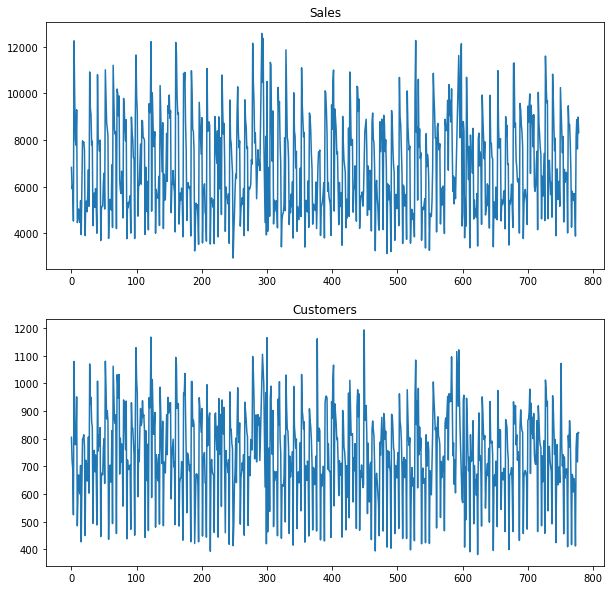

In [188]:
#Visualizing the input:
results.plot();

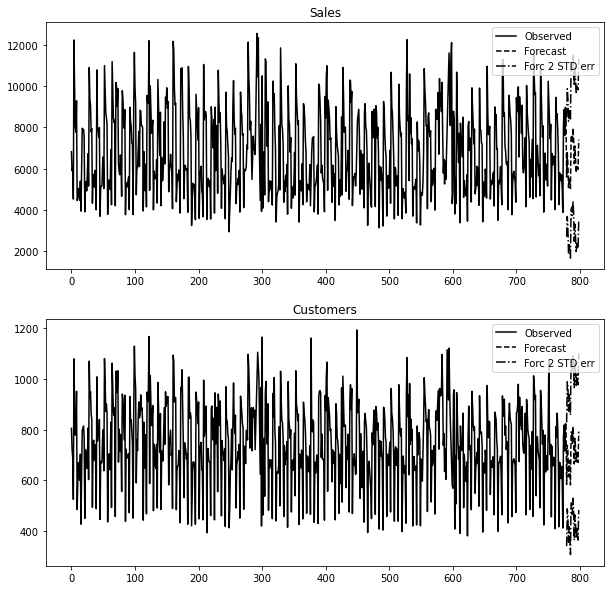

In [189]:
#We can also plot our forecasted values by the model.

results.plot_forecast(20);

### VARMAX Model

In [190]:
from statsmodels.tsa.api import VARMAX
mod = sm.tsa.VARMAX(data[endog_vars], order=(2,1), trend='n', exog=data[exog_vars])
res = mod.fit(maxiter=1000, disp=False)
print(res.summary())

/Users/venkir/opt/anaconda3/lib/python3.9/site-packages/statsmodels/tsa/statespace/varmax.py:161: EstimationWarning: Estimation of VARMA(p,q) models is not generically robust, due especially to identification issues.
  warn('Estimation of VARMA(p,q) models is not generically robust,'
/Users/venkir/opt/anaconda3/lib/python3.9/site-packages/statsmodels/tsa/base/tsa_model.py:581: ValueWarning: A date index has been provided, but it has no associated frequency information and so will be ignored when e.g. forecasting.
  warnings.warn('A date index has been provided, but it has no'
/Users/venkir/opt/anaconda3/lib/python3.9/site-packages/statsmodels/base/model.py:566: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "


                             Statespace Model Results                             
Dep. Variable:     ['Sales', 'Customers']   No. Observations:                  779
Model:                        VARMAX(2,1)   Log Likelihood              -11168.586
Date:                    Mon, 17 Jan 2022   AIC                          22379.172
Time:                            13:20:24   BIC                          22476.991
Sample:                                 0   HQIC                         22416.797
                                    - 779                                         
Covariance Type:                      opg                                         
Ljung-Box (L1) (Q):             0.89, 0.05   Jarque-Bera (JB):      126.76, 7692.85
Prob(Q):                        0.35, 0.83   Prob(JB):                   0.00, 0.00
Heteroskedasticity (H):         0.98, 2.06   Skew:                       0.32, 0.51
Prob(H) (two-sided):            0.86, 0.00   Kurtosis:                  4.87, 18.36


In [191]:
predictions = res.forecast(steps=test_len, exog=test[exog_vars])
predictions['Date'] = test.index
predictions = predictions.set_index('Date')

/Users/venkir/opt/anaconda3/lib/python3.9/site-packages/statsmodels/tsa/statespace/varmax.py:161: EstimationWarning: Estimation of VARMA(p,q) models is not generically robust, due especially to identification issues.
  warn('Estimation of VARMA(p,q) models is not generically robust,'
/Users/venkir/opt/anaconda3/lib/python3.9/site-packages/statsmodels/tsa/base/tsa_model.py:376: ValueWarning: No supported index is available. Prediction results will be given with an integer index beginning at `start`.
  warnings.warn('No supported index is available.'
/Users/venkir/opt/anaconda3/lib/python3.9/site-packages/statsmodels/tsa/statespace/varmax.py:161: EstimationWarning: Estimation of VARMA(p,q) models is not generically robust, due especially to identification issues.
  warn('Estimation of VARMA(p,q) models is not generically robust,'


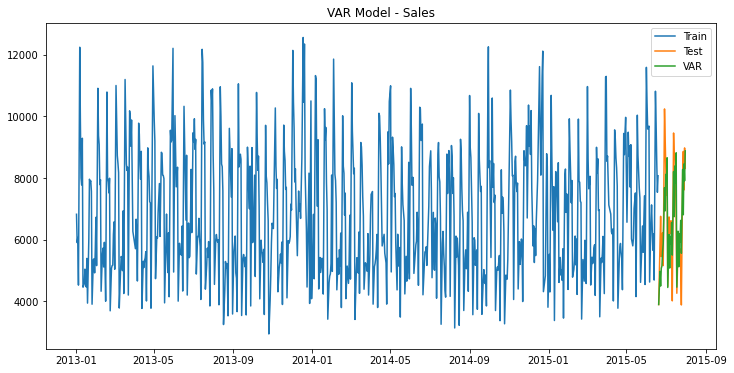

In [192]:
plt.figure(figsize=(12,6))
plt.plot(train['Sales'], label='Train')
plt.plot(test['Sales'], label='Test')
plt.plot(predictions['Sales'], label='VAR')
plt.legend(loc='best')
plt.title('VAR Model - Sales')
plt.show()

In [193]:
# Root Mean Square Error (RMSE)
rmse = np.sqrt(mean_squared_error(test.Sales, predictions.Sales)).round(2)

model_comparison=pd.DataFrame()
model_comparison.loc[0,'Model']='VARMAX'
model_comparison.loc[0,'Variable']='Sales'
model_comparison.loc[0,'RMSE']=rmse

rmse = np.sqrt(mean_squared_error(test.Customers, predictions.Customers)).round(2)
#print('Investment: RMSE:',  rmse)

append=pd.DataFrame()
append.loc[0,'Model']='VARMAX'
append.loc[0,'Variable']='Customers'
append.loc[0,'RMSE']=rmse

model_comparison = model_comparison.append(append)

# Mean Absolute Percentage Error
abs_error = np.abs(test.Sales-predictions.Sales)
actual = test.Sales
mape = np.round(np.mean(abs_error/actual)*100, 2)

model_comparison.loc[model_comparison['Variable']=='Sales', 'MAPE'] = mape

abs_error = np.abs(test.Customers-predictions.Customers)
actual = test.Customers
mape = np.round(np.mean(abs_error/actual)*100, 2)
#print('Investment: MAPE:',  mape)

model_comparison.loc[model_comparison['Variable']=='Customers', 'MAPE'] = mape

In [194]:
model_comparison.reset_index(drop=True, inplace=True)
#model_comparison

In [195]:
results_display = pd.concat([results_display, model_comparison])
results_display

,Model,Variable,RMSE,MAPE
0,VAR,Sales,1942.59,22.71
1,VAR,Customers,148.74,18.02
0,VARMAX,Sales,1140.19,13.25
1,VARMAX,Customers,110.13,12.46


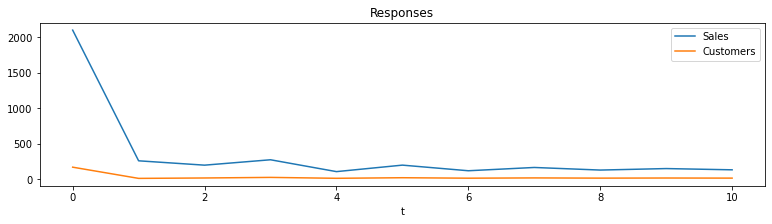

In [196]:
ax = res.impulse_responses(10, orthogonalized=True, impulse=[1, 0]).plot(figsize=(13,3))
ax.set(xlabel='t', title='Responses');

### SARIMAX Model for Sales

In [197]:
model=sm.tsa.statespace.SARIMAX(data['Sales'],order=(1, 1, 1),seasonal_order=(1,0,1,12), exog=data[exog_vars])
results=model.fit()
print(model_fit.params)

/Users/venkir/opt/anaconda3/lib/python3.9/site-packages/statsmodels/tsa/base/tsa_model.py:581: ValueWarning: A date index has been provided, but it has no associated frequency information and so will be ignored when e.g. forecasting.
  warnings.warn('A date index has been provided, but it has no'
/Users/venkir/opt/anaconda3/lib/python3.9/site-packages/statsmodels/tsa/base/tsa_model.py:581: ValueWarning: A date index has been provided, but it has no associated frequency information and so will be ignored when e.g. forecasting.
  warnings.warn('A date index has been provided, but it has no'
 This problem is unconstrained.


RUNNING THE L-BFGS-B CODE

           * * *

Machine precision = 2.220D-16
 N =            8     M =           10

At X0         0 variables are exactly at the bounds

At iterate    0    f=  8.35847D+00    |proj g|=  5.54203D-02

At iterate    5    f=  8.33519D+00    |proj g|=  5.75492D-02

At iterate   10    f=  8.33104D+00    |proj g|=  4.99345D-03

At iterate   15    f=  8.33039D+00    |proj g|=  1.40465D-03

At iterate   20    f=  8.32968D+00    |proj g|=  1.17832D-02

At iterate   25    f=  8.32894D+00    |proj g|=  1.78348D-03

At iterate   30    f=  8.32704D+00    |proj g|=  1.78341D-02

At iterate   35    f=  8.32444D+00    |proj g|=  1.50222D-04

           * * *

Tit   = total number of iterations
Tnf   = total number of function evaluations
Tnint = total number of segments explored during Cauchy searches
Skip  = number of BFGS updates skipped
Nact  = number of active bounds at final generalized Cauchy point
Projg = norm of the final projected gradient
F     = final function 

<AxesSubplot:title={'center':'SARIMAX Model - Sales'}, xlabel='Date'>

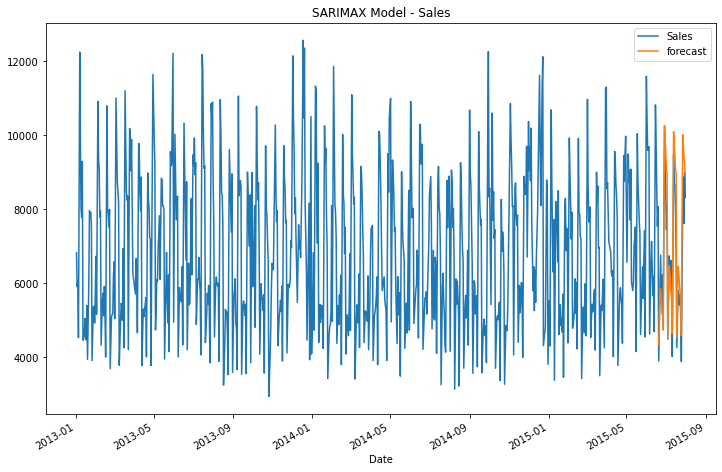

In [198]:
#Testing the fitted model.
data['forecast']=results.predict(start=test.index.min(),end=test.index.max(),dynamic=True)
data[['Sales','forecast']].plot(figsize=(12,8), title='SARIMAX Model - Sales')

In [199]:
rmse = np.sqrt(mean_squared_error(test['Sales'], data['forecast'][test.index.min():])).round(2)
mape = np.round(np.mean(np.abs(test['Sales']-data['forecast'][test.index.min():])/test['Sales'])*100,2)

tempResults = pd.DataFrame({'Model':['SARIMAX method'], 'Variable':['Sales'], 'RMSE': [rmse],'MAPE': [mape] })
#tempResults

In [200]:
results_display = pd.concat([results_display, tempResults])
results_display

,Model,Variable,RMSE,MAPE
0,VAR,Sales,1942.59,22.71
1,VAR,Customers,148.74,18.02
0,VARMAX,Sales,1140.19,13.25
1,VARMAX,Customers,110.13,12.46
0,SARIMAX method,Sales,891.45,10.52


### SARIMAX Model for Customers

In [201]:
model=sm.tsa.statespace.SARIMAX(data['Customers'],order=(1, 1, 1),seasonal_order=(1,0,1,12), exog=data[exog_vars])
results=model.fit()
print(model_fit.params)

/Users/venkir/opt/anaconda3/lib/python3.9/site-packages/statsmodels/tsa/base/tsa_model.py:581: ValueWarning: A date index has been provided, but it has no associated frequency information and so will be ignored when e.g. forecasting.
  warnings.warn('A date index has been provided, but it has no'
/Users/venkir/opt/anaconda3/lib/python3.9/site-packages/statsmodels/tsa/base/tsa_model.py:581: ValueWarning: A date index has been provided, but it has no associated frequency information and so will be ignored when e.g. forecasting.
  warnings.warn('A date index has been provided, but it has no'
 This problem is unconstrained.


RUNNING THE L-BFGS-B CODE

           * * *

Machine precision = 2.220D-16
 N =            8     M =           10

At X0         0 variables are exactly at the bounds

At iterate    0    f=  6.05099D+00    |proj g|=  1.14993D-01

At iterate    5    f=  6.00763D+00    |proj g|=  6.38005D-02

At iterate   10    f=  6.00210D+00    |proj g|=  1.80547D-03

At iterate   15    f=  6.00079D+00    |proj g|=  2.20899D-02

At iterate   20    f=  5.99726D+00    |proj g|=  2.90078D-02

At iterate   25    f=  5.99383D+00    |proj g|=  5.24753D-04

At iterate   30    f=  5.99332D+00    |proj g|=  1.15519D-02

At iterate   35    f=  5.99046D+00    |proj g|=  1.58491D-02

At iterate   40    f=  5.98982D+00    |proj g|=  8.85886D-04

At iterate   45    f=  5.98677D+00    |proj g|=  8.04147D-03

At iterate   50    f=  5.97162D+00    |proj g|=  9.32159D-03

           * * *

Tit   = total number of iterations
Tnf   = total number of function evaluations
Tnint = total number of segments explored during Cau

/Users/venkir/opt/anaconda3/lib/python3.9/site-packages/statsmodels/base/model.py:566: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "


<AxesSubplot:title={'center':'SARIMAX Model - Customers'}, xlabel='Date'>

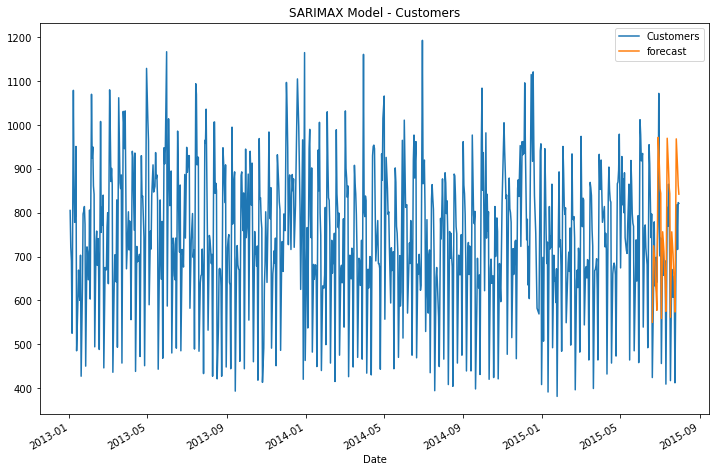

In [202]:
#Testing the fitted model.
data['forecast']=results.predict(start=test.index.min(),end=test.index.max(),dynamic=True)
data[['Customers','forecast']].plot(figsize=(12,8), title='SARIMAX Model - Customers')

In [203]:
rmse = np.sqrt(mean_squared_error(test['Customers'], data['forecast'][test.index.min():])).round(2)
mape = np.round(np.mean(np.abs(test['Customers']-data['forecast'][test.index.min():])/test['Sales'])*100,2)

tempResults = pd.DataFrame({'Model':['SARIMAX method'], 'Variable':['Customers'], 'RMSE': [rmse],'MAPE': [mape] })
#tempResults

In [204]:
results_display = pd.concat([results_display, tempResults])
results_display

,Model,Variable,RMSE,MAPE
0,VAR,Sales,1942.59,22.71
1,VAR,Customers,148.74,18.02
0,VARMAX,Sales,1140.19,13.25
1,VARMAX,Customers,110.13,12.46
0,SARIMAX method,Sales,891.45,10.52
0,SARIMAX method,Customers,109.62,1.52


# Store 8

## Outlier detection for each Store as it affects each independently

### Box plot and interquartile range

In [205]:
data=data_store8.copy()
data = data.sort_index(ascending=True) # Sort of ascending time and date

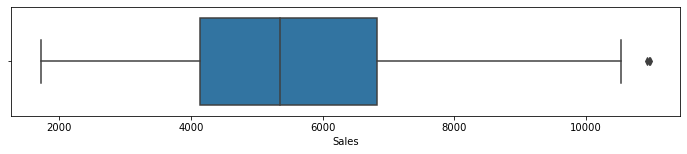

In [206]:
import seaborn as sns
fig = plt.subplots(figsize=(12, 2))
ax = sns.boxplot(x=data['Sales'],whis=1.5)

In [207]:
# Remove outliers for Sales, at 99% looks like we have many points
outlier_value = data['Sales'].quantile(0.99)
print(outlier_value)

9997.13999999999


In [208]:
# Update the outliers to NaN
data.Sales=data.Sales.where(data.Sales.between(0,outlier_value))
data['Sales'].describe()

count     776.000000
mean     5487.167526
std      1832.074560
min      1725.000000
25%      4125.250000
50%      5307.500000
75%      6780.000000
max      9956.000000
Name: Sales, dtype: float64

In [209]:
# Remove outliers for Customers, at 99% looks like we have many points
outlier_value = data['Customers'].quantile(0.99)
print(outlier_value)

1012.3399999999999


In [210]:
# Update the outliers to NaN
data.Customers=data.Customers.where(data.Customers.between(0,outlier_value))
data['Customers'].describe()

count     776.000000
mean      654.199742
std       171.563933
min       266.000000
25%       556.750000
50%       668.000000
75%       781.000000
max      1012.000000
Name: Customers, dtype: float64

### The NaN or Missing Values can be filled with Linear Interpolated values

#### Do for both the Sales and Customers Column

In [211]:
# Check for nulls in all columns
data.isnull().sum(axis = 0)

Store            0
DayOfWeek        0
Sales            8
Customers        8
Open             0
Promo            0
SchoolHoliday    0
dtype: int64

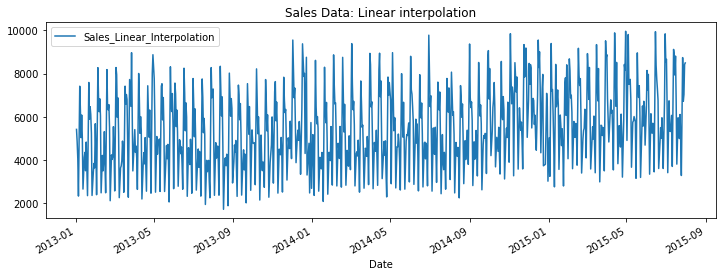

In [212]:
# FIll Missing with Linear Interpolation Doe Sales col
data = data.assign(Sales_Linear_Interpolation=data.Sales.interpolate(method='linear'))
data[['Sales_Linear_Interpolation']].plot(figsize=(12, 4))
plt.legend(loc='best')
plt.title('Sales Data: Linear interpolation')
plt.show(block=False)

In [213]:
data['Sales'] = data['Sales_Linear_Interpolation']
data.drop(columns=['Sales_Linear_Interpolation'],inplace=True)

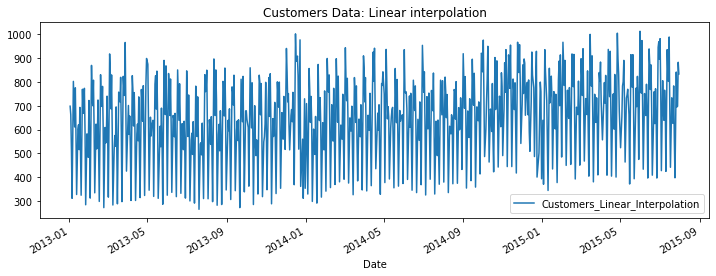

In [214]:
# FIll Missing with Linear Interpolation for Customers col
data = data.assign(Customers_Linear_Interpolation=data.Customers.interpolate(method='linear'))
data[['Customers_Linear_Interpolation']].plot(figsize=(12, 4))
plt.legend(loc='best')
plt.title('Customers Data: Linear interpolation')
plt.show(block=False)

In [215]:
# Replace with the Linear interpolated values
data['Customers'] = data['Customers_Linear_Interpolation']
data.drop(columns=['Customers_Linear_Interpolation'],inplace=True)

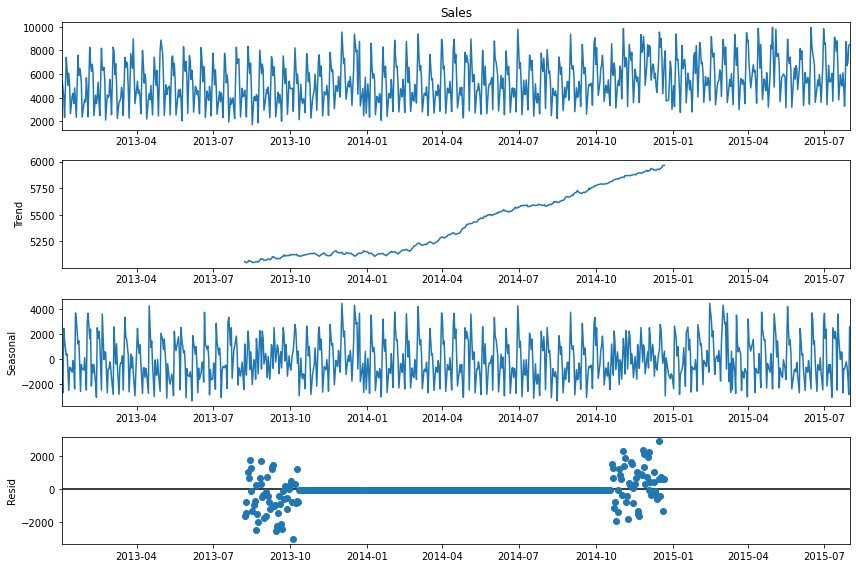

In [216]:
# Time series Decomposition
from pylab import rcParams
import statsmodels.api as sm
rcParams['figure.figsize'] = 12, 8
decomposition = sm.tsa.seasonal_decompose(data['Sales'], model='additive', freq=365) # additive seasonal index
fig = decomposition.plot()
    
plt.show()

#### Clearly, shows seasonality based on the three graphs drawn for the three stores but no trend.

## Split time series data into training and test keeping 36 rows for test (6 weeks)

In [217]:
data.head()
print("Number of Rows in DS 8:", len(data))

Number of Rows in DS 8: 784


In [218]:
# Leave last 36 for forecast, 6 weeks = 42 days minus 6 Sundays == 36
test_len = 36
train_len = len(data) - test_len
print(train_len)

748


In [219]:
# Set inferred freq
data.index.freq = data.index.inferred_freq
train = data.iloc[0:train_len, :]
test = data.iloc[train_len:,:]

In [220]:
train[endog_vars].head()

,Sales,Customers
Date,,
2013-01-02,5419.0,698.0
2013-01-03,4842.0,662.0
2013-01-04,4059.0,517.0
2013-01-05,2337.0,312.0
2013-01-07,7416.0,802.0


In [221]:
train[exog_vars].head()

,Promo,DayOfWeek,SchoolHoliday
Date,,,
2013-01-02,0,3,1
2013-01-03,0,4,1
2013-01-04,0,5,1
2013-01-05,0,6,0
2013-01-07,1,1,0


# Auto Regressive methods

## Stationarity vs non-stationary time series

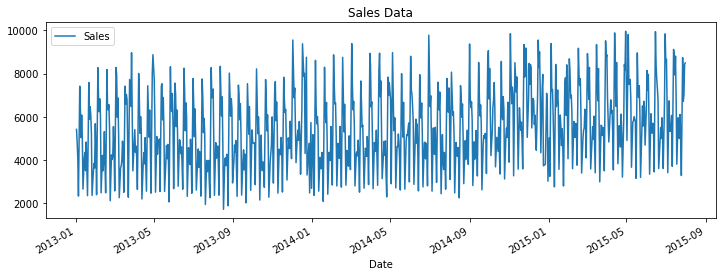

In [222]:
data['Sales'].plot(figsize=(12, 4))
plt.legend(loc='best')
plt.title('Sales Data')
plt.show(block=False)

### Augmented Dickey-Fuller (ADF) test

In [223]:
from statsmodels.tsa.stattools import adfuller
adf_test = adfuller(data['Sales'])

print('ADF Statistic: %f' % adf_test[0])
print('Critical Values @ 0.05: %.2f' % adf_test[4]['5%'])
print('p-value: %f' % adf_test[1])

ADF Statistic: -3.045890
Critical Values @ 0.05: -2.87
p-value: 0.030825


### The p-value is 0.003 way under than 0.05 and so according to ADF the series is Stationary

### Kwiatkowski-Phillips-Schmidt-Shin (KPSS) test

In [224]:
from statsmodels.tsa.stattools import kpss
kpss_test = kpss(data['Sales'])

print('KPSS Statistic: %f' % kpss_test[0])
print('Critical Values @ 0.05: %.2f' % kpss_test[3]['5%'])
print('p-value: %f' % kpss_test[1])

KPSS Statistic: 2.472850
Critical Values @ 0.05: 0.46
p-value: 0.010000


/Users/venkir/opt/anaconda3/lib/python3.9/site-packages/statsmodels/tsa/stattools.py:1906: InterpolationWarning: The test statistic is outside of the range of p-values available in the
look-up table. The actual p-value is smaller than the p-value returned.

  warnings.warn(


### The p-value is 0.1 is higher than 0.05 and so according to KPSS the series is Stationary. 

### Autocorrelation function (ACF) and PACF as subplots

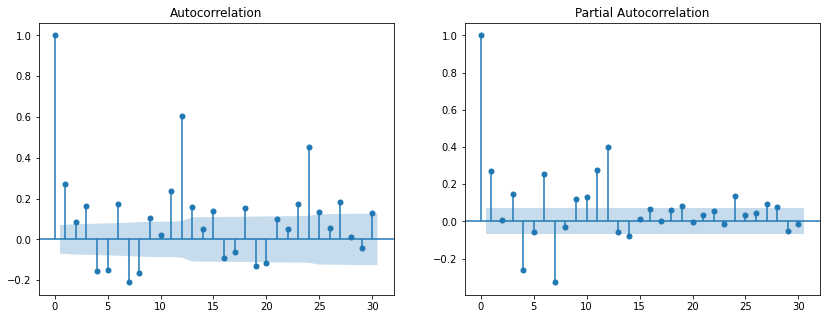

In [225]:
from statsmodels.graphics.tsaplots import plot_acf
from statsmodels.graphics.tsaplots import plot_pacf

fig, ax = plt.subplots(1,2,figsize=(14,5))
sm.graphics.tsa.plot_acf(data['Sales'].squeeze(), lags=30, ax=ax[0])
sm.graphics.tsa.plot_pacf(data['Sales'].squeeze(), lags=30, ax=ax[1])
plt.show()

#### p = 1 and q = 1

## VAR Model

In [226]:
# Define endog vards and exog vars and scale Sales and Customers to same metric
#from sklearn.preprocessing import StandardScaler
#caler = StandardScaler()
#train[endog_vars] = scaler.fit_transform(train[endog_vars]) # for train data
#test[endog_vars] = scaler.fit_transform(test[endog_vars]) # for test data

In [227]:
# Check and see if Scaling worked
train.head()

,Store,DayOfWeek,Sales,Customers,Open,Promo,SchoolHoliday
Date,,,,,,,
2013-01-02,8,3,5419.0,698.0,1,0,1
2013-01-03,8,4,4842.0,662.0,1,0,1
2013-01-04,8,5,4059.0,517.0,1,0,1
2013-01-05,8,6,2337.0,312.0,1,0,0
2013-01-07,8,1,7416.0,802.0,1,1,0


In [228]:
#  Stationarity Test - ADF Test
for i in range(len(endog_vars)):
    print('\n' + endog_vars[i] + ': ADF test results:')
    result = adfuller(data[endog_vars[i]].dropna())
    print('ADF Statistic: %f' % result[0])
    print('p-value: %f' % result[1])
    print('Critical Values:')
    for key, value in result[4].items():
        if key=='5%':
            print('\t%s: %.3f' % (key, value))


Sales: ADF test results:
ADF Statistic: -3.045890
p-value: 0.030825
Critical Values:
	5%: -2.865

Customers: ADF test results:
ADF Statistic: -2.964681
p-value: 0.038327
Critical Values:
	5%: -2.865


In [229]:
# VAR does not need exog vars
mod = sm.tsa.VARMAX(train[endog_vars], order=(2,1), trend='n') # p = 1 and q = 1
res = mod.fit(maxiter=1000, disp=False)
print(res.summary())
#Note the AIC value - lower AIC => better model

/Users/venkir/opt/anaconda3/lib/python3.9/site-packages/statsmodels/tsa/statespace/varmax.py:161: EstimationWarning: Estimation of VARMA(p,q) models is not generically robust, due especially to identification issues.
  warn('Estimation of VARMA(p,q) models is not generically robust,'
/Users/venkir/opt/anaconda3/lib/python3.9/site-packages/statsmodels/tsa/base/tsa_model.py:581: ValueWarning: A date index has been provided, but it has no associated frequency information and so will be ignored when e.g. forecasting.
  warnings.warn('A date index has been provided, but it has no'


                             Statespace Model Results                             
Dep. Variable:     ['Sales', 'Customers']   No. Observations:                  748
Model:                         VARMA(2,1)   Log Likelihood              -10797.025
Date:                    Mon, 17 Jan 2022   AIC                          21624.049
Time:                            13:20:36   BIC                          21693.310
Sample:                                 0   HQIC                         21650.740
                                    - 748                                         
Covariance Type:                      opg                                         
Ljung-Box (L1) (Q):             7.28, 2.66   Jarque-Bera (JB):       29.85, 1754.75
Prob(Q):                        0.01, 0.10   Prob(JB):                   0.00, 0.00
Heteroskedasticity (H):         1.30, 2.27   Skew:                     -0.11, -0.65
Prob(H) (two-sided):            0.04, 0.00   Kurtosis:                  3.96, 10.39


In [230]:
test_len=len(test.index)
test_len

36

In [231]:
predictions = res.forecast(steps=test_len, exog=test[exog_vars])
predictions['Date'] = test.index
predictions = predictions.set_index('Date')

/Users/venkir/opt/anaconda3/lib/python3.9/site-packages/statsmodels/tsa/base/tsa_model.py:376: ValueWarning: No supported index is available. Prediction results will be given with an integer index beginning at `start`.
  warnings.warn('No supported index is available.'


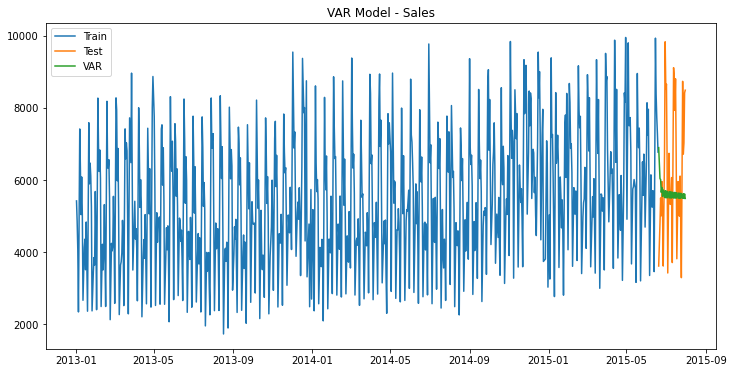

In [232]:
plt.figure(figsize=(12,6))
plt.plot(train['Sales'], label='Train')
plt.plot(test['Sales'], label='Test')
plt.plot(predictions['Sales'], label='VAR')
plt.legend(loc='best')
plt.title('VAR Model - Sales')
plt.show()

In [233]:
# Root Mean Square Error (RMSE)
rmse = np.sqrt(mean_squared_error(test.Sales, predictions.Sales)).round(2)

model_comparison=pd.DataFrame()
model_comparison.loc[0,'Model']='VAR'
model_comparison.loc[0,'Variable']='Sales'
model_comparison.loc[0,'RMSE']=rmse

rmse = np.sqrt(mean_squared_error(test.Customers, predictions.Customers)).round(2)
#print('Investment: RMSE:',  rmse)

append=pd.DataFrame()
append.loc[0,'Model']='VAR'
append.loc[0,'Variable']='Customers'
append.loc[0,'RMSE']=rmse

model_comparison = model_comparison.append(append)

# Mean Absolute Percentage Error
abs_error = np.abs(test.Sales-predictions.Sales)
actual = test.Sales
mape = np.round(np.mean(abs_error/actual)*100, 2)

model_comparison.loc[model_comparison['Variable']=='Sales', 'MAPE'] = mape

abs_error = np.abs(test.Customers-predictions.Customers)
actual = test.Customers
mape = np.round(np.mean(abs_error/actual)*100, 2)
#print('Investment: MAPE:',  mape)

model_comparison.loc[model_comparison['Variable']=='Customers', 'MAPE'] = mape

In [234]:
model_comparison.reset_index(drop=True, inplace=True)
#model_comparison

In [235]:
# Display concatenated Diplay of rrmse and mape errors
results_display = model_comparison.copy()
results_display

,Model,Variable,RMSE,MAPE
0,VAR,Sales,2027.95,27.33
1,VAR,Customers,184.57,23.23


In [236]:
from statsmodels.tsa.api import VAR
from statsmodels.tsa.base import  datetools
var = VAR(data[endog_vars])

x= var.select_order()
x.summary()

/Users/venkir/opt/anaconda3/lib/python3.9/site-packages/statsmodels/tsa/base/tsa_model.py:581: ValueWarning: A date index has been provided, but it has no associated frequency information and so will be ignored when e.g. forecasting.
  warnings.warn('A date index has been provided, but it has no'


,AIC,BIC,FPE,HQIC
0,23.35,23.36,1.380e+10,23.35
1,23.09,23.12,1.061e+10,23.10
2,22.94,23.00,9.214e+09,22.97
3,22.88,22.96,8.613e+09,22.91
4,22.72,22.83,7.384e+09,22.76
5,22.63,22.77,6.748e+09,22.68
6,22.20,22.36,4.380e+09,22.26
7,22.20,22.38,4.368e+09,22.27
8,22.17,22.38,4.268e+09,22.25
9,22.17,22.41,4.270e+09,22.26


In [237]:
"""
    Johansen cointegration test of the cointegration rank of a VECM

    Parameters
    ----------
    endog : array_like (nobs_tot x neqs)
        Data to test
    det_order : int
        * -1 - no deterministic terms - model1
        * 0 - constant term - model3
        * 1 - linear trend
    k_ar_diff : int, nonnegative
        Number of lagged differences in the model.
"""

def joh_output(res):
    output = pd.DataFrame([res.lr2,res.lr1],
                          index=['max_eig_stat',"trace_stat"])
    print(output.T,'\n')
    print("Critical values(90%, 95%, 99%) of max_eig_stat\n",res.cvm,'\n')
    print("Critical values(90%, 95%, 99%) of trace_stat\n",res.cvt,'\n')

In [238]:
joh_model1 = coint_johansen(data[endog_vars],-1,1) # k_ar_diff +1 = K
joh_output(joh_model1)

   max_eig_stat  trace_stat
0    154.573276  165.054000
1     10.480724   10.480724 

Critical values(90%, 95%, 99%) of max_eig_stat
 [[ 9.4748 11.2246 15.0923]
 [ 2.9762  4.1296  6.9406]] 

Critical values(90%, 95%, 99%) of trace_stat
 [[10.4741 12.3212 16.364 ]
 [ 2.9762  4.1296  6.9406]] 



In [239]:
from statsmodels.tsa.vector_ar.vecm import select_coint_rank
rank=select_coint_rank(data[endog_vars],-1,1)
print(rank.rank)
#result=stt.coint(endog['Sales'], endog['Customers'])

2


**These two Series Sales and Customers are COINTEGRATED because the rank = 1**

In [240]:
# use fit = 12
results = var.fit(12)
#We can check the summary of the model by.
results.summary()

  Summary of Regression Results   
Model:                         VAR
Method:                        OLS
Date:           Mon, 17, Jan, 2022
Time:                     13:20:36
--------------------------------------------------------------------
No. of Equations:         2.00000    BIC:                    22.3360
Nobs:                     772.000    HQIC:                   22.1507
Log likelihood:          -10646.3    FPE:                3.71228e+09
AIC:                      22.0349    Det(Omega_mle):     3.48305e+09
--------------------------------------------------------------------
Results for equation Sales
                   coefficient       std. error           t-stat            prob
--------------------------------------------------------------------------------
const               982.137676       699.090884            1.405           0.160
L1.Sales              0.590274         0.078066            7.561           0.000
L1.Customers         -4.872982         0.853327           -5

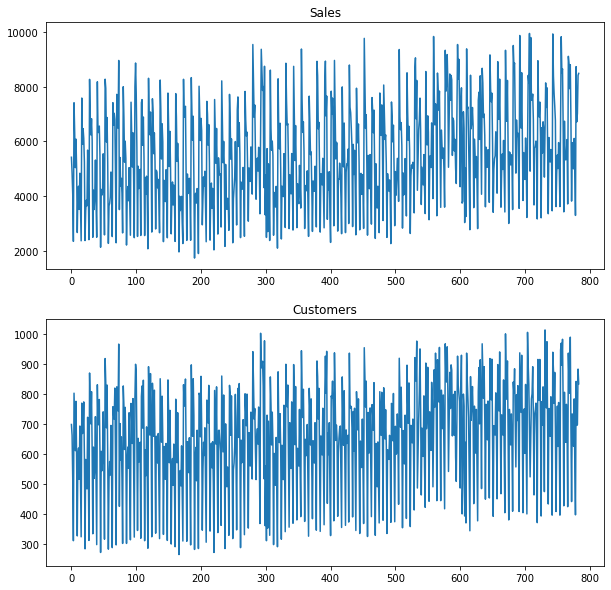

In [241]:
#Visualizing the input:
results.plot();

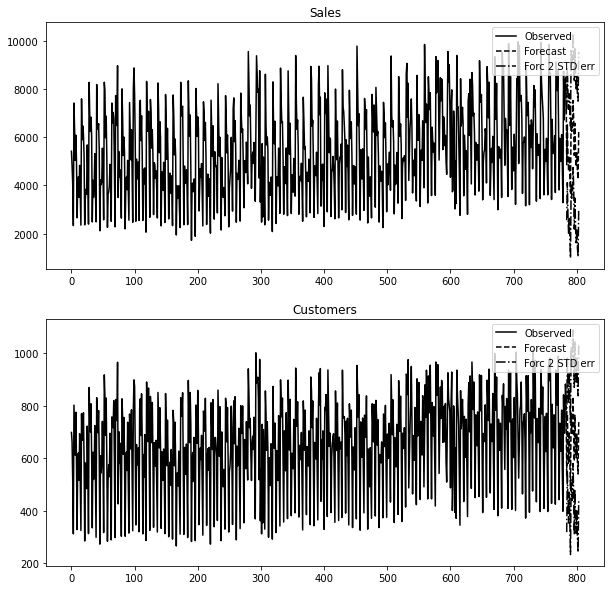

In [242]:
#We can also plot our forecasted values by the model.

results.plot_forecast(20);

### VARMAX Model

In [243]:
from statsmodels.tsa.api import VARMAX
mod = sm.tsa.VARMAX(data[endog_vars], order=(2,1), trend='n', exog=data[exog_vars])
res = mod.fit(maxiter=1000, disp=False)
print(res.summary())

/Users/venkir/opt/anaconda3/lib/python3.9/site-packages/statsmodels/tsa/statespace/varmax.py:161: EstimationWarning: Estimation of VARMA(p,q) models is not generically robust, due especially to identification issues.
  warn('Estimation of VARMA(p,q) models is not generically robust,'
/Users/venkir/opt/anaconda3/lib/python3.9/site-packages/statsmodels/tsa/base/tsa_model.py:581: ValueWarning: A date index has been provided, but it has no associated frequency information and so will be ignored when e.g. forecasting.
  warnings.warn('A date index has been provided, but it has no'
/Users/venkir/opt/anaconda3/lib/python3.9/site-packages/statsmodels/base/model.py:566: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "


                             Statespace Model Results                             
Dep. Variable:     ['Sales', 'Customers']   No. Observations:                  784
Model:                        VARMAX(2,1)   Log Likelihood              -11204.227
Date:                    Mon, 17 Jan 2022   AIC                          22450.454
Time:                            13:21:11   BIC                          22548.406
Sample:                                 0   HQIC                         22488.118
                                    - 784                                         
Covariance Type:                      opg                                         
Ljung-Box (L1) (Q):            28.38, 0.31   Jarque-Bera (JB):      107.94, 4184.67
Prob(Q):                        0.00, 0.58   Prob(JB):                   0.00, 0.00
Heteroskedasticity (H):         1.29, 2.75   Skew:                      0.75, -0.74
Prob(H) (two-sided):            0.04, 0.00   Kurtosis:                  4.02, 14.22


In [244]:
predictions = res.forecast(steps=test_len, exog=test[exog_vars])
predictions['Date'] = test.index
predictions = predictions.set_index('Date')

/Users/venkir/opt/anaconda3/lib/python3.9/site-packages/statsmodels/tsa/statespace/varmax.py:161: EstimationWarning: Estimation of VARMA(p,q) models is not generically robust, due especially to identification issues.
  warn('Estimation of VARMA(p,q) models is not generically robust,'
/Users/venkir/opt/anaconda3/lib/python3.9/site-packages/statsmodels/tsa/base/tsa_model.py:376: ValueWarning: No supported index is available. Prediction results will be given with an integer index beginning at `start`.
  warnings.warn('No supported index is available.'
/Users/venkir/opt/anaconda3/lib/python3.9/site-packages/statsmodels/tsa/statespace/varmax.py:161: EstimationWarning: Estimation of VARMA(p,q) models is not generically robust, due especially to identification issues.
  warn('Estimation of VARMA(p,q) models is not generically robust,'


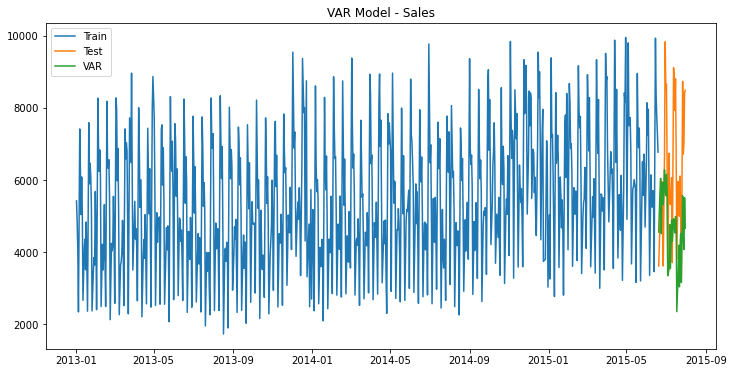

In [245]:
plt.figure(figsize=(12,6))
plt.plot(train['Sales'], label='Train')
plt.plot(test['Sales'], label='Test')
plt.plot(predictions['Sales'], label='VAR')
plt.legend(loc='best')
plt.title('VAR Model - Sales')
plt.show()

In [246]:
# Root Mean Square Error (RMSE)
rmse = np.sqrt(mean_squared_error(test.Sales, predictions.Sales)).round(2)

model_comparison=pd.DataFrame()
model_comparison.loc[0,'Model']='VARMAX'
model_comparison.loc[0,'Variable']='Sales'
model_comparison.loc[0,'RMSE']=rmse

rmse = np.sqrt(mean_squared_error(test.Customers, predictions.Customers)).round(2)
#print('Investment: RMSE:',  rmse)

append=pd.DataFrame()
append.loc[0,'Model']='VARMAX'
append.loc[0,'Variable']='Customers'
append.loc[0,'RMSE']=rmse

model_comparison = model_comparison.append(append)

# Mean Absolute Percentage Error
abs_error = np.abs(test.Sales-predictions.Sales)
actual = test.Sales
mape = np.round(np.mean(abs_error/actual)*100, 2)

model_comparison.loc[model_comparison['Variable']=='Sales', 'MAPE'] = mape

abs_error = np.abs(test.Customers-predictions.Customers)
actual = test.Customers
mape = np.round(np.mean(abs_error/actual)*100, 2)
#print('Investment: MAPE:',  mape)

model_comparison.loc[model_comparison['Variable']=='Customers', 'MAPE'] = mape

In [247]:
model_comparison.reset_index(drop=True, inplace=True)
#model_comparison

In [248]:
results_display = pd.concat([results_display, model_comparison])
results_display

,Model,Variable,RMSE,MAPE
0,VAR,Sales,2027.95,27.33
1,VAR,Customers,184.57,23.23
0,VARMAX,Sales,2272.02,27.61
1,VARMAX,Customers,229.45,27.24


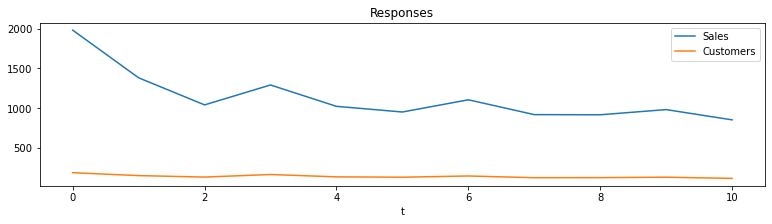

In [249]:
ax = res.impulse_responses(10, orthogonalized=True, impulse=[1, 0]).plot(figsize=(13,3))
ax.set(xlabel='t', title='Responses');

### SARIMAX Model for Sales

In [250]:
model=sm.tsa.statespace.SARIMAX(data['Sales'],order=(1, 1, 1),seasonal_order=(1,0,1,12), exog=data[exog_vars])
results=model.fit()
print(model_fit.params)

/Users/venkir/opt/anaconda3/lib/python3.9/site-packages/statsmodels/tsa/base/tsa_model.py:581: ValueWarning: A date index has been provided, but it has no associated frequency information and so will be ignored when e.g. forecasting.
  warnings.warn('A date index has been provided, but it has no'
/Users/venkir/opt/anaconda3/lib/python3.9/site-packages/statsmodels/tsa/base/tsa_model.py:581: ValueWarning: A date index has been provided, but it has no associated frequency information and so will be ignored when e.g. forecasting.
  warnings.warn('A date index has been provided, but it has no'
 This problem is unconstrained.


RUNNING THE L-BFGS-B CODE

           * * *

Machine precision = 2.220D-16
 N =            8     M =           10

At X0         0 variables are exactly at the bounds

At iterate    0    f=  8.14625D+00    |proj g|=  8.73796D-02

At iterate    5    f=  8.11234D+00    |proj g|=  5.44602D-02

At iterate   10    f=  8.10628D+00    |proj g|=  7.71871D-03

At iterate   15    f=  8.10478D+00    |proj g|=  3.68107D-03

At iterate   20    f=  8.10463D+00    |proj g|=  2.63478D-04

At iterate   25    f=  8.10459D+00    |proj g|=  5.04938D-03

At iterate   30    f=  8.10093D+00    |proj g|=  5.33194D-02

At iterate   35    f=  8.09148D+00    |proj g|=  1.75936D-02

At iterate   40    f=  8.08495D+00    |proj g|=  1.96511D-04

At iterate   45    f=  8.08495D+00    |proj g|=  1.00917D-03

At iterate   50    f=  8.08482D+00    |proj g|=  1.34394D-02

           * * *

Tit   = total number of iterations
Tnf   = total number of function evaluations
Tnint = total number of segments explored during Cau

/Users/venkir/opt/anaconda3/lib/python3.9/site-packages/statsmodels/base/model.py:566: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "


<AxesSubplot:title={'center':'SARIMAX Model - Sales'}, xlabel='Date'>

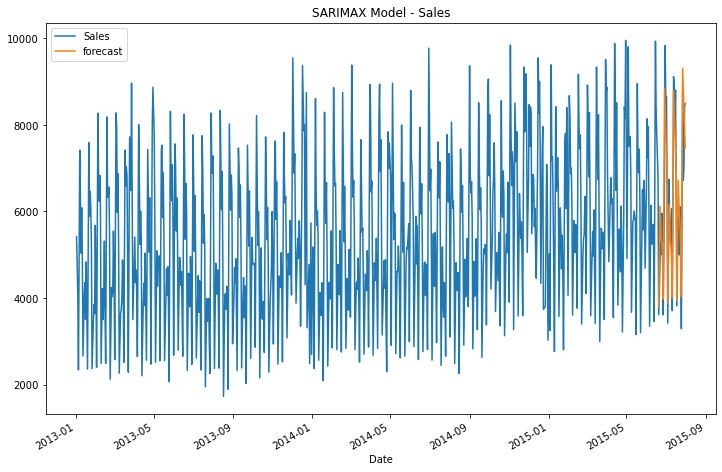

In [251]:
#Testing the fitted model.
data['forecast']=results.predict(start=test.index.min(),end=test.index.max(),dynamic=True)
data[['Sales','forecast']].plot(figsize=(12,8), title='SARIMAX Model - Sales')

In [252]:
rmse = np.sqrt(mean_squared_error(test['Sales'], data['forecast'][test.index.min():])).round(2)
mape = np.round(np.mean(np.abs(test['Sales']-data['forecast'][test.index.min():])/test['Sales'])*100,2)

tempResults = pd.DataFrame({'Model':['SARIMAX method'], 'Variable':['Sales'], 'RMSE': [rmse],'MAPE': [mape] })
#tempResults

In [253]:
results_display = pd.concat([results_display, tempResults])
results_display

,Model,Variable,RMSE,MAPE
0,VAR,Sales,2027.95,27.33
1,VAR,Customers,184.57,23.23
0,VARMAX,Sales,2272.02,27.61
1,VARMAX,Customers,229.45,27.24
0,SARIMAX method,Sales,880.96,11.19


### SARIMAX Model for Customers

In [254]:
model=sm.tsa.statespace.SARIMAX(data['Customers'],order=(1, 1, 1),seasonal_order=(1,0,1,12), exog=data[exog_vars])
results=model.fit()
print(model_fit.params)

/Users/venkir/opt/anaconda3/lib/python3.9/site-packages/statsmodels/tsa/base/tsa_model.py:581: ValueWarning: A date index has been provided, but it has no associated frequency information and so will be ignored when e.g. forecasting.
  warnings.warn('A date index has been provided, but it has no'
/Users/venkir/opt/anaconda3/lib/python3.9/site-packages/statsmodels/tsa/base/tsa_model.py:581: ValueWarning: A date index has been provided, but it has no associated frequency information and so will be ignored when e.g. forecasting.
  warnings.warn('A date index has been provided, but it has no'
 This problem is unconstrained.


RUNNING THE L-BFGS-B CODE

           * * *

Machine precision = 2.220D-16
 N =            8     M =           10

At X0         0 variables are exactly at the bounds

At iterate    0    f=  5.95487D+00    |proj g|=  1.08093D-01

At iterate    5    f=  5.92446D+00    |proj g|=  2.24277D-02

At iterate   10    f=  5.91278D+00    |proj g|=  4.71024D-02

At iterate   15    f=  5.86516D+00    |proj g|=  6.01871D-02

At iterate   20    f=  5.86034D+00    |proj g|=  7.24239D-04

At iterate   25    f=  5.85962D+00    |proj g|=  1.99020D-02

At iterate   30    f=  5.85093D+00    |proj g|=  3.73497D-02

At iterate   35    f=  5.84579D+00    |proj g|=  5.43697D-03

At iterate   40    f=  5.84266D+00    |proj g|=  1.93491D-02

At iterate   45    f=  5.82278D+00    |proj g|=  1.62476D-02

At iterate   50    f=  5.82254D+00    |proj g|=  2.55205D-04

           * * *

Tit   = total number of iterations
Tnf   = total number of function evaluations
Tnint = total number of segments explored during Cau

/Users/venkir/opt/anaconda3/lib/python3.9/site-packages/statsmodels/base/model.py:566: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "


<AxesSubplot:title={'center':'SARIMAX Model - Customers'}, xlabel='Date'>

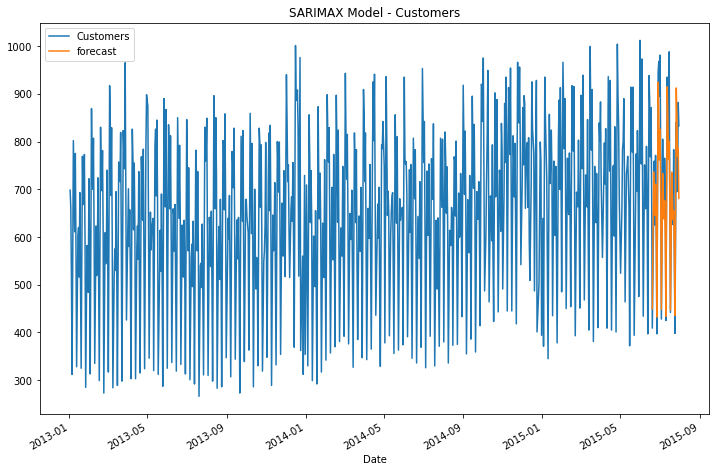

In [255]:
#Testing the fitted model.
data['forecast']=results.predict(start=test.index.min(),end=test.index.max(),dynamic=True)
data[['Customers','forecast']].plot(figsize=(12,8), title='SARIMAX Model - Customers')

In [256]:
rmse = np.sqrt(mean_squared_error(test['Customers'], data['forecast'][test.index.min():])).round(2)
mape = np.round(np.mean(np.abs(test['Customers']-data['forecast'][test.index.min():])/test['Sales'])*100,2)

tempResults = pd.DataFrame({'Model':['SARIMAX method'], 'Variable':['Customers'], 'RMSE': [rmse],'MAPE': [mape] })
#tempResults

In [257]:
results_display = pd.concat([results_display, tempResults])
results_display

,Model,Variable,RMSE,MAPE
0,VAR,Sales,2027.95,27.33
1,VAR,Customers,184.57,23.23
0,VARMAX,Sales,2272.02,27.61
1,VARMAX,Customers,229.45,27.24
0,SARIMAX method,Sales,880.96,11.19
0,SARIMAX method,Customers,79.61,0.91


In [258]:
total_end_time = time.time()
print('Total time it took to run the Rossmann Retail Time Series Analysis for Stores = 1,3,8 in mins:', 
      round((total_end_time-total_start_time)/60))

Total time it took to run the Rossmann Retail Time Series Analysis for Stores = 1,3,8 in mins: 5


# Store 9

## Outlier detection for each Store as it affects each independently

### Box plot and interquartile range

In [259]:
data=data_store9.copy()
data = data.sort_index(ascending=True) # Sort of ascending time and date

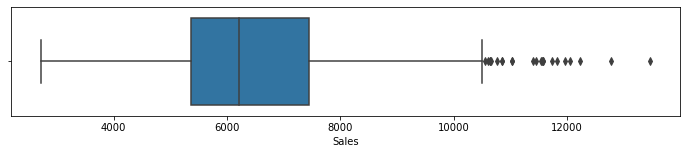

In [260]:
import seaborn as sns
fig = plt.subplots(figsize=(12, 2))
ax = sns.boxplot(x=data['Sales'],whis=1.5)

In [261]:
# Remove outliers for Sales, at 99% looks like we have many points
outlier_value = data['Sales'].quantile(0.99)
print(outlier_value)

11570.98


In [262]:
# Update the outliers to NaN
data.Sales=data.Sales.where(data.Sales.between(0,outlier_value))
data['Sales'].describe()

count      771.000000
mean      6503.831388
std       1530.618877
min       2724.000000
25%       5366.500000
50%       6187.000000
75%       7415.500000
max      11569.000000
Name: Sales, dtype: float64

In [263]:
# Remove outliers for Customers, at 99% looks like we have many points
outlier_value = data['Customers'].quantile(0.99)
print(outlier_value)

883.22


In [264]:
# Update the outliers to NaN
data.Customers=data.Customers.where(data.Customers.between(0,outlier_value))
data['Customers'].describe()

count    771.000000
mean     576.189364
std       97.188800
min      297.000000
25%      504.000000
50%      560.000000
75%      634.000000
max      883.000000
Name: Customers, dtype: float64

### The NaN or Missing Values can be filled with Linear Interpolated values

#### Do for both the Sales and Customers Column

In [265]:
# Check for nulls in all columns
data.isnull().sum(axis = 0)

Store            0
DayOfWeek        0
Sales            8
Customers        8
Open             0
Promo            0
SchoolHoliday    0
dtype: int64

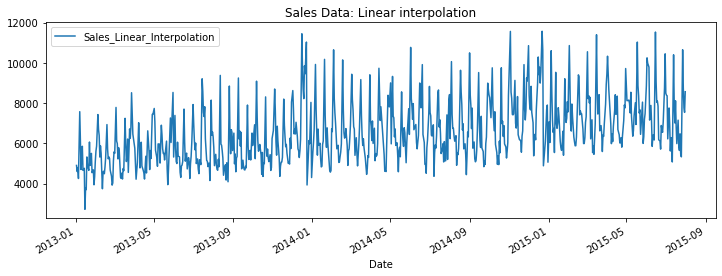

In [266]:
# FIll Missing with Linear Interpolation Doe Sales col
data = data.assign(Sales_Linear_Interpolation=data.Sales.interpolate(method='linear'))
data[['Sales_Linear_Interpolation']].plot(figsize=(12, 4))
plt.legend(loc='best')
plt.title('Sales Data: Linear interpolation')
plt.show(block=False)

In [267]:
data['Sales'] = data['Sales_Linear_Interpolation']
data.drop(columns=['Sales_Linear_Interpolation'],inplace=True)

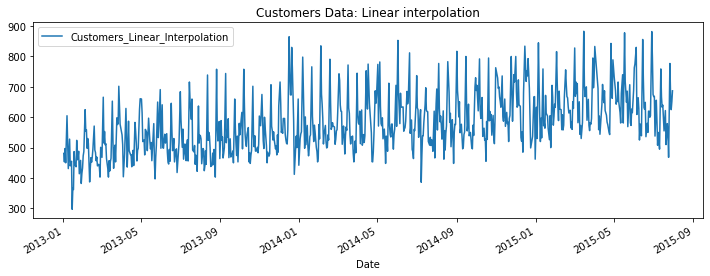

In [268]:
# FIll Missing with Linear Interpolation for Customers col
data = data.assign(Customers_Linear_Interpolation=data.Customers.interpolate(method='linear'))
data[['Customers_Linear_Interpolation']].plot(figsize=(12, 4))
plt.legend(loc='best')
plt.title('Customers Data: Linear interpolation')
plt.show(block=False)

In [269]:
# Replace with the Linear interpolated values
data['Customers'] = data['Customers_Linear_Interpolation']
data.drop(columns=['Customers_Linear_Interpolation'],inplace=True)

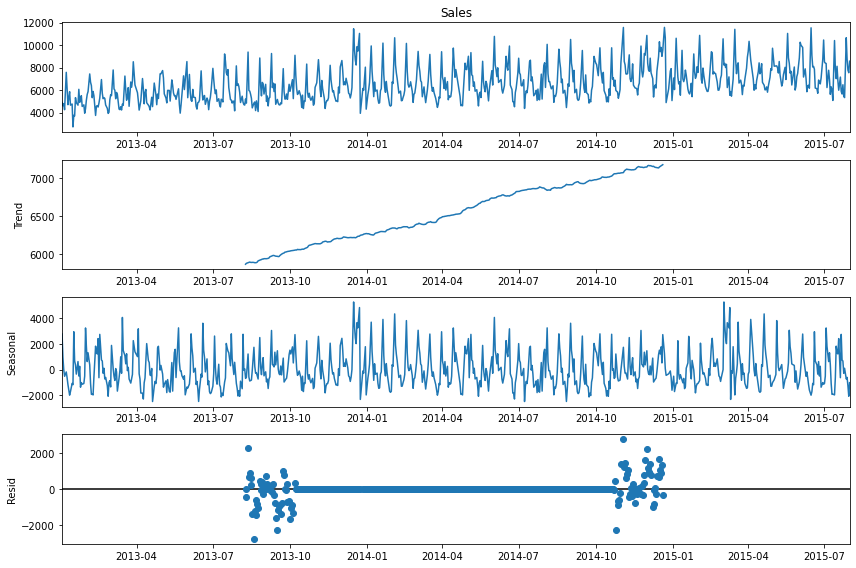

In [270]:
# Time series Decomposition
from pylab import rcParams
import statsmodels.api as sm
rcParams['figure.figsize'] = 12, 8
decomposition = sm.tsa.seasonal_decompose(data['Sales'], model='additive', freq=365) # additive seasonal index
fig = decomposition.plot()
    
plt.show()

#### Clearly, shows seasonality based on the three graphs drawn for the three stores but no trend.

## Split time series data into training and test keeping 36 rows for test (6 weeks)

In [271]:
data.head()
print("Number of Rows in DS 9:", len(data))

Number of Rows in DS 9: 779


In [272]:
# Leave last 36 for forecast, 6 weeks = 42 days minus 6 Sundays == 36
test_len = 36
train_len = len(data) - test_len
print(train_len)

743


In [273]:
# Set inferred freq
data.index.freq = data.index.inferred_freq
train = data.iloc[0:train_len, :]
test = data.iloc[train_len:,:]

In [274]:
train[endog_vars].head()

,Sales,Customers
Date,,
2013-01-02,4903.0,481.0
2013-01-03,4602.0,453.0
2013-01-04,4798.0,497.0
2013-01-05,4254.0,450.0
2013-01-07,7574.0,605.0


In [275]:
train[exog_vars].head()

,Promo,DayOfWeek,SchoolHoliday
Date,,,
2013-01-02,0,3,1
2013-01-03,0,4,1
2013-01-04,0,5,1
2013-01-05,0,6,0
2013-01-07,1,1,0


# Auto Regressive methods

## Stationarity vs non-stationary time series

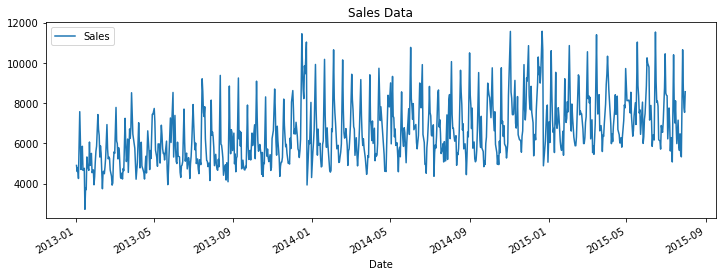

In [276]:
data['Sales'].plot(figsize=(12, 4))
plt.legend(loc='best')
plt.title('Sales Data')
plt.show(block=False)

### Augmented Dickey-Fuller (ADF) test

In [277]:
from statsmodels.tsa.stattools import adfuller
adf_test = adfuller(data['Sales'])

print('ADF Statistic: %f' % adf_test[0])
print('Critical Values @ 0.05: %.2f' % adf_test[4]['5%'])
print('p-value: %f' % adf_test[1])

ADF Statistic: -2.822244
Critical Values @ 0.05: -2.87
p-value: 0.055166


### The p-value is 0.003 way under than 0.05 and so according to ADF the series is Stationary

### Kwiatkowski-Phillips-Schmidt-Shin (KPSS) test

In [278]:
from statsmodels.tsa.stattools import kpss
kpss_test = kpss(data['Sales'])

print('KPSS Statistic: %f' % kpss_test[0])
print('Critical Values @ 0.05: %.2f' % kpss_test[3]['5%'])
print('p-value: %f' % kpss_test[1])

KPSS Statistic: 2.985030
Critical Values @ 0.05: 0.46
p-value: 0.010000


/Users/venkir/opt/anaconda3/lib/python3.9/site-packages/statsmodels/tsa/stattools.py:1906: InterpolationWarning: The test statistic is outside of the range of p-values available in the
look-up table. The actual p-value is smaller than the p-value returned.

  warnings.warn(


### The p-value is 0.1 is higher than 0.05 and so according to KPSS the series is Stationary. 

### Autocorrelation function (ACF) and PACF as subplots

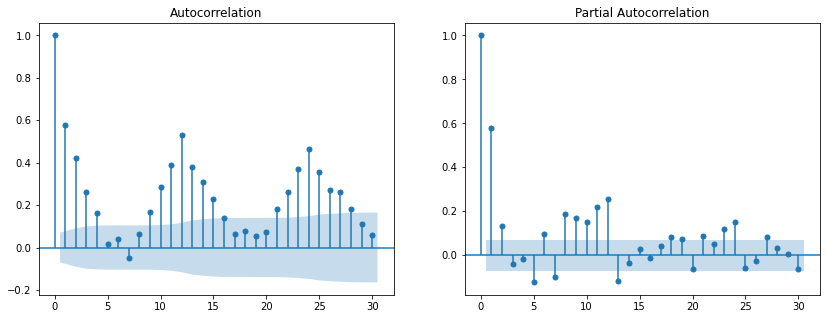

In [279]:
from statsmodels.graphics.tsaplots import plot_acf
from statsmodels.graphics.tsaplots import plot_pacf

fig, ax = plt.subplots(1,2,figsize=(14,5))
sm.graphics.tsa.plot_acf(data['Sales'].squeeze(), lags=30, ax=ax[0])
sm.graphics.tsa.plot_pacf(data['Sales'].squeeze(), lags=30, ax=ax[1])
plt.show()

#### p = 1 and q = 1

## VAR Model

In [280]:
# Define endog vards and exog vars and scale Sales and Customers to same metric
#from sklearn.preprocessing import StandardScaler
#caler = StandardScaler()
#train[endog_vars] = scaler.fit_transform(train[endog_vars]) # for train data
#test[endog_vars] = scaler.fit_transform(test[endog_vars]) # for test data

In [281]:
# Check and see if Scaling worked
train.head()

,Store,DayOfWeek,Sales,Customers,Open,Promo,SchoolHoliday
Date,,,,,,,
2013-01-02,9,3,4903.0,481.0,1,0,1
2013-01-03,9,4,4602.0,453.0,1,0,1
2013-01-04,9,5,4798.0,497.0,1,0,1
2013-01-05,9,6,4254.0,450.0,1,0,0
2013-01-07,9,1,7574.0,605.0,1,1,0


In [282]:
#  Stationarity Test - ADF Test
for i in range(len(endog_vars)):
    print('\n' + endog_vars[i] + ': ADF test results:')
    result = adfuller(data[endog_vars[i]].dropna())
    print('ADF Statistic: %f' % result[0])
    print('p-value: %f' % result[1])
    print('Critical Values:')
    for key, value in result[4].items():
        if key=='5%':
            print('\t%s: %.3f' % (key, value))


Sales: ADF test results:
ADF Statistic: -2.822244
p-value: 0.055166
Critical Values:
	5%: -2.865

Customers: ADF test results:
ADF Statistic: -2.798396
p-value: 0.058503
Critical Values:
	5%: -2.865


In [283]:
# VAR does not need exog vars
mod = sm.tsa.VARMAX(train[endog_vars], order=(2,1), trend='n') # p = 1 and q = 1
res = mod.fit(maxiter=1000, disp=False)
print(res.summary())
#Note the AIC value - lower AIC => better model

/Users/venkir/opt/anaconda3/lib/python3.9/site-packages/statsmodels/tsa/statespace/varmax.py:161: EstimationWarning: Estimation of VARMA(p,q) models is not generically robust, due especially to identification issues.
  warn('Estimation of VARMA(p,q) models is not generically robust,'
/Users/venkir/opt/anaconda3/lib/python3.9/site-packages/statsmodels/tsa/base/tsa_model.py:581: ValueWarning: A date index has been provided, but it has no associated frequency information and so will be ignored when e.g. forecasting.
  warnings.warn('A date index has been provided, but it has no'


                             Statespace Model Results                             
Dep. Variable:     ['Sales', 'Customers']   No. Observations:                  743
Model:                         VARMA(2,1)   Log Likelihood               -9964.328
Date:                    Mon, 17 Jan 2022   AIC                          19958.656
Time:                            13:21:20   BIC                          20027.817
Sample:                                 0   HQIC                         19985.317
                                    - 743                                         
Covariance Type:                      opg                                         
Ljung-Box (L1) (Q):             2.42, 1.12   Jarque-Bera (JB):     402.76, 11349.12
Prob(Q):                        0.12, 0.29   Prob(JB):                   0.00, 0.00
Heteroskedasticity (H):         1.49, 2.92   Skew:                      1.08, -1.47
Prob(H) (two-sided):            0.00, 0.00   Kurtosis:                  5.89, 21.92


In [284]:
test_len=len(test.index)
test_len

36

In [285]:
predictions = res.forecast(steps=test_len, exog=test[exog_vars])
predictions['Date'] = test.index
predictions = predictions.set_index('Date')

/Users/venkir/opt/anaconda3/lib/python3.9/site-packages/statsmodels/tsa/base/tsa_model.py:376: ValueWarning: No supported index is available. Prediction results will be given with an integer index beginning at `start`.
  warnings.warn('No supported index is available.'


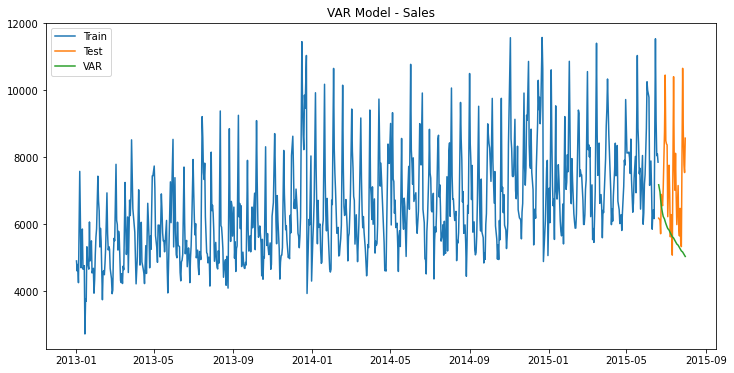

In [286]:
plt.figure(figsize=(12,6))
plt.plot(train['Sales'], label='Train')
plt.plot(test['Sales'], label='Test')
plt.plot(predictions['Sales'], label='VAR')
plt.legend(loc='best')
plt.title('VAR Model - Sales')
plt.show()

In [287]:
# Root Mean Square Error (RMSE)
rmse = np.sqrt(mean_squared_error(test.Sales, predictions.Sales)).round(2)

model_comparison=pd.DataFrame()
model_comparison.loc[0,'Model']='VAR'
model_comparison.loc[0,'Variable']='Sales'
model_comparison.loc[0,'RMSE']=rmse

rmse = np.sqrt(mean_squared_error(test.Customers, predictions.Customers)).round(2)
#print('Investment: RMSE:',  rmse)

append=pd.DataFrame()
append.loc[0,'Model']='VAR'
append.loc[0,'Variable']='Customers'
append.loc[0,'RMSE']=rmse

model_comparison = model_comparison.append(append)

# Mean Absolute Percentage Error
abs_error = np.abs(test.Sales-predictions.Sales)
actual = test.Sales
mape = np.round(np.mean(abs_error/actual)*100, 2)

model_comparison.loc[model_comparison['Variable']=='Sales', 'MAPE'] = mape

abs_error = np.abs(test.Customers-predictions.Customers)
actual = test.Customers
mape = np.round(np.mean(abs_error/actual)*100, 2)
#print('Investment: MAPE:',  mape)

model_comparison.loc[model_comparison['Variable']=='Customers', 'MAPE'] = mape

In [288]:
model_comparison.reset_index(drop=True, inplace=True)
#model_comparison

In [289]:
# Display concatenated Diplay of rrmse and mape errors
results_display = model_comparison.copy()
results_display

,Model,Variable,RMSE,MAPE
0,VAR,Sales,2155.58,20.31
1,VAR,Customers,135.94,15.80


In [290]:
from statsmodels.tsa.api import VAR
from statsmodels.tsa.base import  datetools
var = VAR(data[endog_vars])

x= var.select_order()
x.summary()

/Users/venkir/opt/anaconda3/lib/python3.9/site-packages/statsmodels/tsa/base/tsa_model.py:581: ValueWarning: A date index has been provided, but it has no associated frequency information and so will be ignored when e.g. forecasting.
  warnings.warn('A date index has been provided, but it has no'


,AIC,BIC,FPE,HQIC
0,21.57,21.58,2.330e+09,21.57
1,21.16,21.20,1.551e+09,21.18
2,21.14,21.20,1.515e+09,21.16
3,21.13,21.22,1.503e+09,21.16
4,21.13,21.24,1.505e+09,21.17
5,21.09,21.22,1.440e+09,21.14
6,21.05,21.21,1.382e+09,21.11
7,21.04,21.23,1.377e+09,21.11
8,21.02,21.23,1.343e+09,21.10
9,21.00,21.23,1.318e+09,21.09


In [291]:
"""
    Johansen cointegration test of the cointegration rank of a VECM

    Parameters
    ----------
    endog : array_like (nobs_tot x neqs)
        Data to test
    det_order : int
        * -1 - no deterministic terms - model1
        * 0 - constant term - model3
        * 1 - linear trend
    k_ar_diff : int, nonnegative
        Number of lagged differences in the model.
"""

def joh_output(res):
    output = pd.DataFrame([res.lr2,res.lr1],
                          index=['max_eig_stat',"trace_stat"])
    print(output.T,'\n')
    print("Critical values(90%, 95%, 99%) of max_eig_stat\n",res.cvm,'\n')
    print("Critical values(90%, 95%, 99%) of trace_stat\n",res.cvt,'\n')

In [292]:
joh_model1 = coint_johansen(data[endog_vars],-1,1) # k_ar_diff +1 = K
joh_output(joh_model1)

   max_eig_stat  trace_stat
0    180.979578  182.481088
1      1.501510    1.501510 

Critical values(90%, 95%, 99%) of max_eig_stat
 [[ 9.4748 11.2246 15.0923]
 [ 2.9762  4.1296  6.9406]] 

Critical values(90%, 95%, 99%) of trace_stat
 [[10.4741 12.3212 16.364 ]
 [ 2.9762  4.1296  6.9406]] 



In [293]:
from statsmodels.tsa.vector_ar.vecm import select_coint_rank
rank=select_coint_rank(data[endog_vars],-1,1)
print(rank.rank)
#result=stt.coint(endog['Sales'], endog['Customers'])

1


**These two Series Sales and Customers are COINTEGRATED because the rank = 1**

In [294]:
# use fit = 13
results = var.fit(13)
#We can check the summary of the model by.
results.summary()

  Summary of Regression Results   
Model:                         VAR
Method:                        OLS
Date:           Mon, 17, Jan, 2022
Time:                     13:21:21
--------------------------------------------------------------------
No. of Equations:         2.00000    BIC:                    21.1241
Nobs:                     766.000    HQIC:                   20.9229
Log likelihood:          -10085.0    FPE:                1.07650e+09
AIC:                      20.7969    Det(Omega_mle):     1.00445e+09
--------------------------------------------------------------------
Results for equation Sales
                   coefficient       std. error           t-stat            prob
--------------------------------------------------------------------------------
const              -397.371377       544.084403           -0.730           0.465
L1.Sales              0.483555         0.082471            5.863           0.000
L1.Customers         -1.374498         1.303139           -1

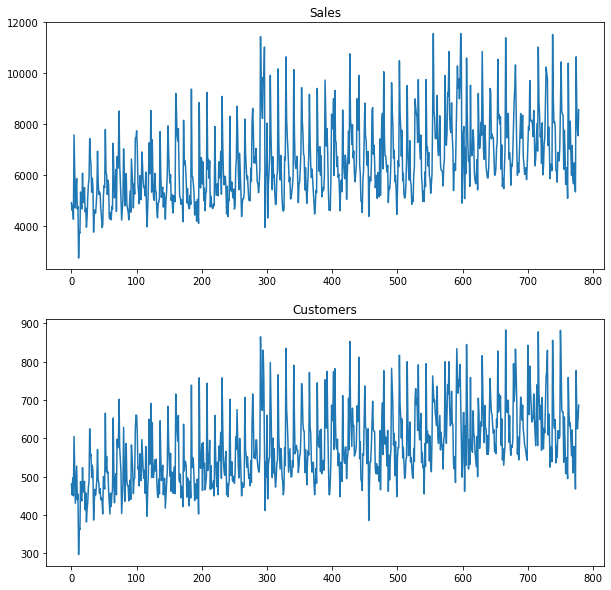

In [295]:
#Visualizing the input:
results.plot();

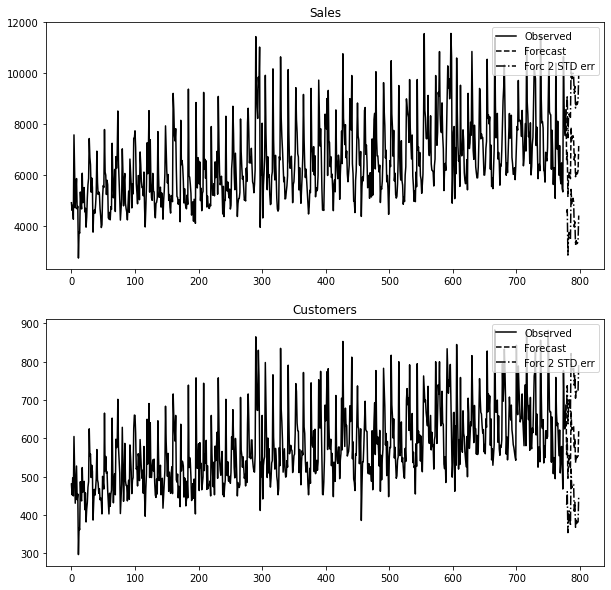

In [296]:
#We can also plot our forecasted values by the model.

results.plot_forecast(20);

### VARMAX Model

In [297]:
from statsmodels.tsa.api import VARMAX
mod = sm.tsa.VARMAX(data[endog_vars], order=(2,1), trend='n', exog=data[exog_vars])
res = mod.fit(maxiter=1000, disp=False)
print(res.summary())

/Users/venkir/opt/anaconda3/lib/python3.9/site-packages/statsmodels/tsa/statespace/varmax.py:161: EstimationWarning: Estimation of VARMA(p,q) models is not generically robust, due especially to identification issues.
  warn('Estimation of VARMA(p,q) models is not generically robust,'
/Users/venkir/opt/anaconda3/lib/python3.9/site-packages/statsmodels/tsa/base/tsa_model.py:581: ValueWarning: A date index has been provided, but it has no associated frequency information and so will be ignored when e.g. forecasting.
  warnings.warn('A date index has been provided, but it has no'
/Users/venkir/opt/anaconda3/lib/python3.9/site-packages/statsmodels/base/model.py:566: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "


                             Statespace Model Results                             
Dep. Variable:     ['Sales', 'Customers']   No. Observations:                  779
Model:                        VARMAX(2,1)   Log Likelihood              -10605.375
Date:                    Mon, 17 Jan 2022   AIC                          21252.749
Time:                            13:21:56   BIC                          21350.568
Sample:                                 0   HQIC                         21290.374
                                    - 779                                         
Covariance Type:                      opg                                         
Ljung-Box (L1) (Q):             2.00, 0.53   Jarque-Bera (JB):      225.53, 7589.46
Prob(Q):                        0.16, 0.47   Prob(JB):                   0.00, 0.00
Heteroskedasticity (H):         1.18, 2.93   Skew:                      0.90, -0.71
Prob(H) (two-sided):            0.17, 0.00   Kurtosis:                  4.92, 18.23


In [298]:
predictions = res.forecast(steps=test_len, exog=test[exog_vars])
predictions['Date'] = test.index
predictions = predictions.set_index('Date')

/Users/venkir/opt/anaconda3/lib/python3.9/site-packages/statsmodels/tsa/statespace/varmax.py:161: EstimationWarning: Estimation of VARMA(p,q) models is not generically robust, due especially to identification issues.
  warn('Estimation of VARMA(p,q) models is not generically robust,'
/Users/venkir/opt/anaconda3/lib/python3.9/site-packages/statsmodels/tsa/base/tsa_model.py:376: ValueWarning: No supported index is available. Prediction results will be given with an integer index beginning at `start`.
  warnings.warn('No supported index is available.'
/Users/venkir/opt/anaconda3/lib/python3.9/site-packages/statsmodels/tsa/statespace/varmax.py:161: EstimationWarning: Estimation of VARMA(p,q) models is not generically robust, due especially to identification issues.
  warn('Estimation of VARMA(p,q) models is not generically robust,'


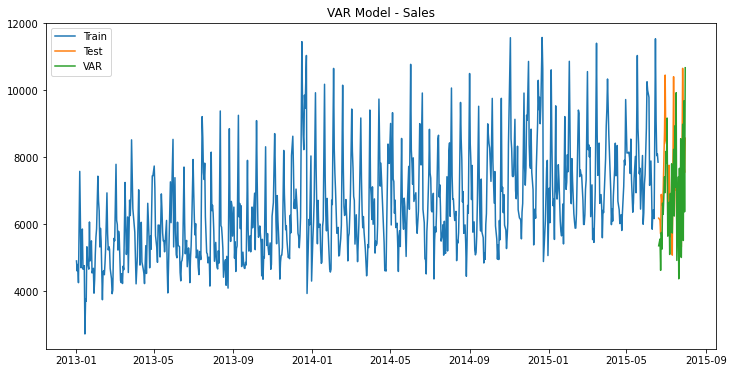

In [299]:
plt.figure(figsize=(12,6))
plt.plot(train['Sales'], label='Train')
plt.plot(test['Sales'], label='Test')
plt.plot(predictions['Sales'], label='VAR')
plt.legend(loc='best')
plt.title('VAR Model - Sales')
plt.show()

In [300]:
# Root Mean Square Error (RMSE)
rmse = np.sqrt(mean_squared_error(test.Sales, predictions.Sales)).round(2)

model_comparison=pd.DataFrame()
model_comparison.loc[0,'Model']='VARMAX'
model_comparison.loc[0,'Variable']='Sales'
model_comparison.loc[0,'RMSE']=rmse

rmse = np.sqrt(mean_squared_error(test.Customers, predictions.Customers)).round(2)
#print('Investment: RMSE:',  rmse)

append=pd.DataFrame()
append.loc[0,'Model']='VARMAX'
append.loc[0,'Variable']='Customers'
append.loc[0,'RMSE']=rmse

model_comparison = model_comparison.append(append)

# Mean Absolute Percentage Error
abs_error = np.abs(test.Sales-predictions.Sales)
actual = test.Sales
mape = np.round(np.mean(abs_error/actual)*100, 2)

model_comparison.loc[model_comparison['Variable']=='Sales', 'MAPE'] = mape

abs_error = np.abs(test.Customers-predictions.Customers)
actual = test.Customers
mape = np.round(np.mean(abs_error/actual)*100, 2)
#print('Investment: MAPE:',  mape)

model_comparison.loc[model_comparison['Variable']=='Customers', 'MAPE'] = mape

In [301]:
model_comparison.reset_index(drop=True, inplace=True)
#model_comparison

In [302]:
results_display = pd.concat([results_display, model_comparison])
results_display

,Model,Variable,RMSE,MAPE
0,VAR,Sales,2155.58,20.31
1,VAR,Customers,135.94,15.80
0,VARMAX,Sales,1626.47,19.34
1,VARMAX,Customers,104.43,13.84


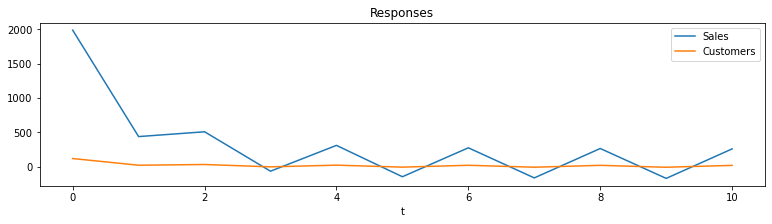

In [303]:
ax = res.impulse_responses(10, orthogonalized=True, impulse=[1, 0]).plot(figsize=(13,3))
ax.set(xlabel='t', title='Responses');

### SARIMAX Model for Sales

In [304]:
model=sm.tsa.statespace.SARIMAX(data['Sales'],order=(1, 1, 1),seasonal_order=(1,0,1,12), exog=data[exog_vars])
results=model.fit()
print(model_fit.params)

/Users/venkir/opt/anaconda3/lib/python3.9/site-packages/statsmodels/tsa/base/tsa_model.py:581: ValueWarning: A date index has been provided, but it has no associated frequency information and so will be ignored when e.g. forecasting.
  warnings.warn('A date index has been provided, but it has no'
/Users/venkir/opt/anaconda3/lib/python3.9/site-packages/statsmodels/tsa/base/tsa_model.py:581: ValueWarning: A date index has been provided, but it has no associated frequency information and so will be ignored when e.g. forecasting.
  warnings.warn('A date index has been provided, but it has no'
 This problem is unconstrained.


RUNNING THE L-BFGS-B CODE

           * * *

Machine precision = 2.220D-16
 N =            8     M =           10

At X0         0 variables are exactly at the bounds

At iterate    0    f=  8.37745D+00    |proj g|=  2.77142D-01

At iterate    5    f=  8.28783D+00    |proj g|=  1.25964D-01

At iterate   10    f=  8.23112D+00    |proj g|=  1.36366D-02

At iterate   15    f=  8.22052D+00    |proj g|=  4.31138D-03

At iterate   20    f=  8.22016D+00    |proj g|=  2.00049D-04

At iterate   25    f=  8.22014D+00    |proj g|=  3.98451D-03

At iterate   30    f=  8.21946D+00    |proj g|=  1.13621D-02

At iterate   35    f=  8.21423D+00    |proj g|=  4.62608D-02

At iterate   40    f=  8.20832D+00    |proj g|=  7.53307D-04

           * * *

Tit   = total number of iterations
Tnf   = total number of function evaluations
Tnint = total number of segments explored during Cauchy searches
Skip  = number of BFGS updates skipped
Nact  = number of active bounds at final generalized Cauchy point
Projg 

<AxesSubplot:title={'center':'SARIMAX Model - Sales'}, xlabel='Date'>

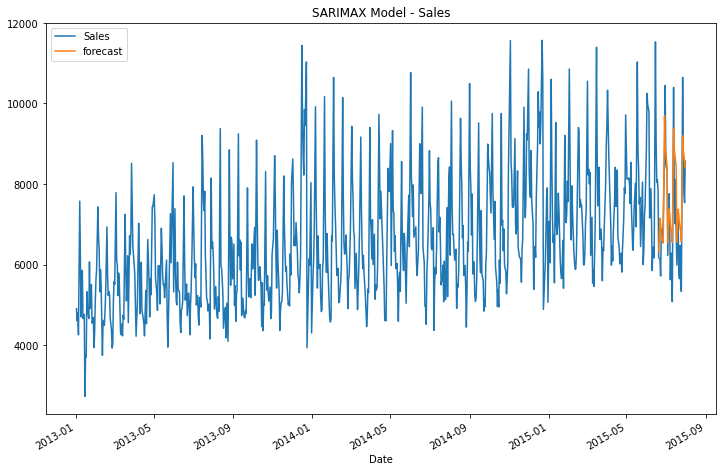

In [305]:
#Testing the fitted model.
data['forecast']=results.predict(start=test.index.min(),end=test.index.max(),dynamic=True)
data[['Sales','forecast']].plot(figsize=(12,8), title='SARIMAX Model - Sales')

In [306]:
rmse = np.sqrt(mean_squared_error(test['Sales'], data['forecast'][test.index.min():])).round(2)
mape = np.round(np.mean(np.abs(test['Sales']-data['forecast'][test.index.min():])/test['Sales'])*100,2)

tempResults = pd.DataFrame({'Model':['SARIMAX method'], 'Variable':['Sales'], 'RMSE': [rmse],'MAPE': [mape] })
#tempResults

In [307]:
results_display = pd.concat([results_display, tempResults])
results_display

,Model,Variable,RMSE,MAPE
0,VAR,Sales,2155.58,20.31
1,VAR,Customers,135.94,15.80
0,VARMAX,Sales,1626.47,19.34
1,VARMAX,Customers,104.43,13.84
0,SARIMAX method,Sales,930.35,11.30


### SARIMAX Model for Customers

In [308]:
model=sm.tsa.statespace.SARIMAX(data['Customers'],order=(1, 1, 1),seasonal_order=(1,0,1,12), exog=data[exog_vars])
results=model.fit()
print(model_fit.params)

/Users/venkir/opt/anaconda3/lib/python3.9/site-packages/statsmodels/tsa/base/tsa_model.py:581: ValueWarning: A date index has been provided, but it has no associated frequency information and so will be ignored when e.g. forecasting.
  warnings.warn('A date index has been provided, but it has no'
/Users/venkir/opt/anaconda3/lib/python3.9/site-packages/statsmodels/tsa/base/tsa_model.py:581: ValueWarning: A date index has been provided, but it has no associated frequency information and so will be ignored when e.g. forecasting.
  warnings.warn('A date index has been provided, but it has no'
 This problem is unconstrained.


RUNNING THE L-BFGS-B CODE

           * * *

Machine precision = 2.220D-16
 N =            8     M =           10

At X0         0 variables are exactly at the bounds

At iterate    0    f=  6.38104D+00    |proj g|=  1.40456D+00

At iterate    5    f=  5.50321D+00    |proj g|=  9.38606D-02

At iterate   10    f=  5.48353D+00    |proj g|=  3.38690D-03

At iterate   15    f=  5.47869D+00    |proj g|=  1.61291D-02

At iterate   20    f=  5.47035D+00    |proj g|=  6.83250D-03

At iterate   25    f=  5.46951D+00    |proj g|=  1.07682D-02

At iterate   30    f=  5.46854D+00    |proj g|=  5.70389D-04

At iterate   35    f=  5.46852D+00    |proj g|=  1.88747D-03

At iterate   40    f=  5.46832D+00    |proj g|=  1.61378D-03

At iterate   45    f=  5.46829D+00    |proj g|=  7.91515D-04

At iterate   50    f=  5.46768D+00    |proj g|=  5.30665D-03

           * * *

Tit   = total number of iterations
Tnf   = total number of function evaluations
Tnint = total number of segments explored during Cau

/Users/venkir/opt/anaconda3/lib/python3.9/site-packages/statsmodels/base/model.py:566: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "


<AxesSubplot:title={'center':'SARIMAX Model - Customers'}, xlabel='Date'>

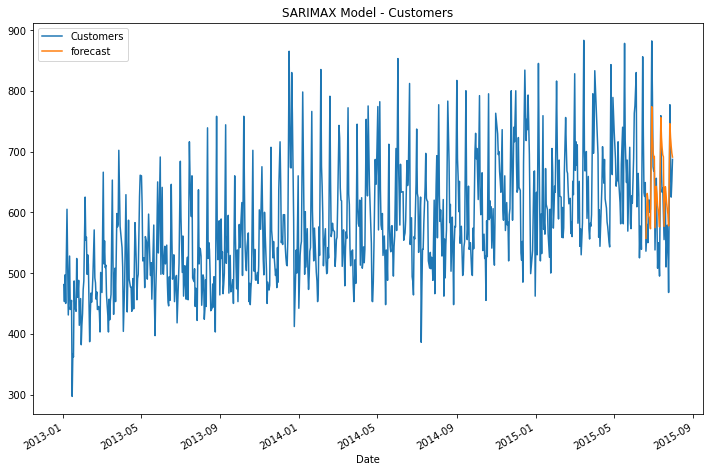

In [309]:
#Testing the fitted model.
data['forecast']=results.predict(start=test.index.min(),end=test.index.max(),dynamic=True)
data[['Customers','forecast']].plot(figsize=(12,8), title='SARIMAX Model - Customers')

In [310]:
rmse = np.sqrt(mean_squared_error(test['Customers'], data['forecast'][test.index.min():])).round(2)
mape = np.round(np.mean(np.abs(test['Customers']-data['forecast'][test.index.min():])/test['Sales'])*100,2)

tempResults = pd.DataFrame({'Model':['SARIMAX method'], 'Variable':['Customers'], 'RMSE': [rmse],'MAPE': [mape] })
#tempResults

In [311]:
results_display = pd.concat([results_display, tempResults])
results_display

,Model,Variable,RMSE,MAPE
0,VAR,Sales,2155.58,20.31
1,VAR,Customers,135.94,15.80
0,VARMAX,Sales,1626.47,19.34
1,VARMAX,Customers,104.43,13.84
0,SARIMAX method,Sales,930.35,11.30
0,SARIMAX method,Customers,59.10,0.76


In [312]:
total_end_time = time.time()
print('Total time it took to run the Rossmann Retail Time Series Analysis for Stores = 1,3,8,9 in mins:', 
      round((total_end_time-total_start_time)/60))

Total time it took to run the Rossmann Retail Time Series Analysis for Stores = 1,3,8,9 in mins: 6


# Store 13

## Outlier detection for each Store as it affects each independently

### Box plot and interquartile range

In [313]:
data=data_store13.copy()
data = data.sort_index(ascending=True) # Sort of ascending time and date

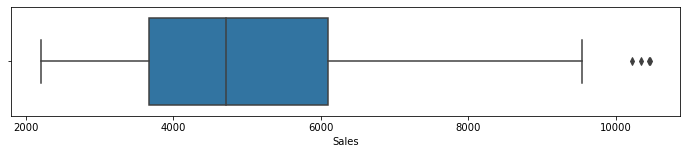

In [314]:
import seaborn as sns
fig = plt.subplots(figsize=(12, 2))
ax = sns.boxplot(x=data['Sales'],whis=1.5)

In [315]:
# Remove outliers for Sales, at 99% looks like we have many points
outlier_value = data['Sales'].quantile(0.99)
print(outlier_value)

9220.8


In [316]:
# Update the outliers to NaN
data.Sales=data.Sales.where(data.Sales.between(0,outlier_value))
data['Sales'].describe()

count     614.000000
mean     4978.824104
std      1537.988380
min      2210.000000
25%      3665.000000
50%      4687.500000
75%      6067.000000
max      9192.000000
Name: Sales, dtype: float64

In [317]:
# Remove outliers for Customers, at 99% looks like we have many points
outlier_value = data['Customers'].quantile(0.99)
print(outlier_value)

629.1999999999998


In [318]:
# Update the outliers to NaN
data.Customers=data.Customers.where(data.Customers.between(0,outlier_value))
data['Customers'].describe()

count    614.000000
mean     379.804560
std       83.885288
min      194.000000
25%      310.000000
50%      369.000000
75%      434.750000
max      626.000000
Name: Customers, dtype: float64

### The NaN or Missing Values can be filled with Linear Interpolated values

#### Do for both the Sales and Customers Column

In [319]:
index_min = data.index.min()
index_max = data.index.max()
print('Min time stamp:', index_min)
print('Max time stamp:', index_max)
print('Number of daily rows should be:', index_max - index_min)

Min time stamp: 2013-01-02 00:00:00
Max time stamp: 2015-07-31 00:00:00
Number of daily rows should be: 940 days 00:00:00


In [320]:
print('Number of rows in data frame for store 13:', len(data))

Number of rows in data frame for store 13: 621


In [321]:
# FInd MISSING ROWS, seems to have a large GAP of 4 months
# Check to see if any time entries are missing between the start and the end date
# dates which are not in the sequence are returned
print(pd.date_range(
  start=index_min, end=index_max, freq='D').difference(data.index)) # D = Daily

DatetimeIndex(['2013-01-06', '2013-01-13', '2013-01-20', '2013-01-27',
               '2013-02-03', '2013-02-10', '2013-02-17', '2013-02-24',
               '2013-03-03', '2013-03-10',
               ...
               '2015-05-31', '2015-06-04', '2015-06-07', '2015-06-14',
               '2015-06-21', '2015-06-28', '2015-07-05', '2015-07-12',
               '2015-07-19', '2015-07-26'],
              dtype='datetime64[ns]', length=320, freq=None)


In [322]:
# Rows to fill
print('Difference =', 940 - 621)

Difference = 319


In [323]:
# fill in the missing time series date entries
df = data.copy()
df.head()

,Store,DayOfWeek,Sales,Customers,Open,Promo,SchoolHoliday
Date,,,,,,,
2013-01-02,13,3,3737.0,317.0,1,0,1
2013-01-03,13,4,3674.0,292.0,1,0,1
2013-01-04,13,5,3848.0,340.0,1,0,1
2013-01-05,13,6,4285.0,344.0,1,0,0
2013-01-07,13,1,8246.0,569.0,1,1,0


In [324]:
idx = pd.date_range(min(data.index), max(data.index), freq='D')
data = df.reindex(idx, fill_value=np.nan)

In [325]:
data.head()

,Store,DayOfWeek,Sales,Customers,Open,Promo,SchoolHoliday
2013-01-02,13.0,3.0,3737.0,317.0,1.0,0.0,1.0
2013-01-03,13.0,4.0,3674.0,292.0,1.0,0.0,1.0
2013-01-04,13.0,5.0,3848.0,340.0,1.0,0.0,1.0
2013-01-05,13.0,6.0,4285.0,344.0,1.0,0.0,0.0
2013-01-06,NaN,NaN,NaN,NaN,NaN,NaN,NaN


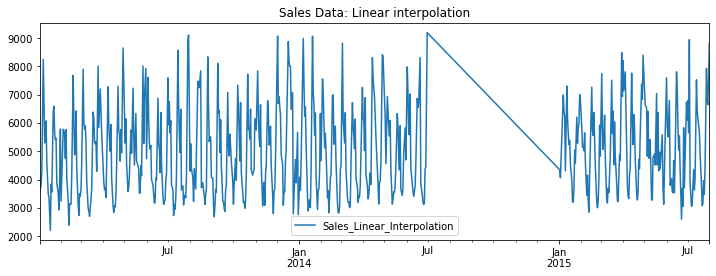

In [326]:
#data = df.copy()
# FIll Missing with Linear Interpolation Doe Sales col
data = data.assign(Sales_Linear_Interpolation=data.Sales.interpolate(method='linear'))
data[['Sales_Linear_Interpolation']].plot(figsize=(12, 4))
plt.legend(loc='best')
plt.title('Sales Data: Linear interpolation')
plt.show(block=False)

In [327]:
data['Sales'] = data['Sales_Linear_Interpolation']
data.drop(columns=['Sales_Linear_Interpolation'],inplace=True)

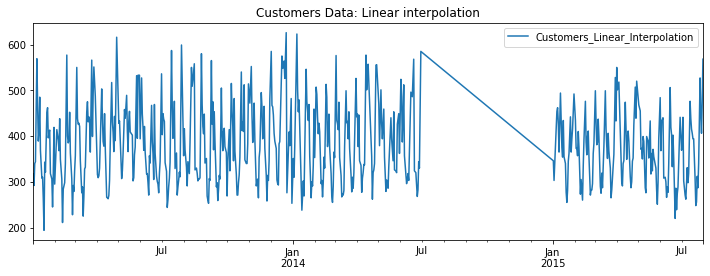

In [328]:
# FIll Missing with Linear Interpolation for Customers col
data = data.assign(Customers_Linear_Interpolation=data.Customers.interpolate(method='linear'))
data[['Customers_Linear_Interpolation']].plot(figsize=(12, 4))
plt.legend(loc='best')
plt.title('Customers Data: Linear interpolation')
plt.show(block=False)

In [329]:
data['Customers'] = data['Customers_Linear_Interpolation']
data.drop(columns=['Customers_Linear_Interpolation'],inplace=True)

In [330]:
# Forward fill the values for the exog columns
data = data.ffill().bfill(downcast='infer')

In [331]:
# See if interpolation worked
data.head(10)

,Store,DayOfWeek,Sales,Customers,Open,Promo,SchoolHoliday
2013-01-02,13,3,3737.0,317.0,1,0,1
2013-01-03,13,4,3674.0,292.0,1,0,1
2013-01-04,13,5,3848.0,340.0,1,0,1
2013-01-05,13,6,4285.0,344.0,1,0,0
2013-01-06,13,6,6265.5,456.5,1,0,0
2013-01-07,13,1,8246.0,569.0,1,1,0
2013-01-08,13,2,6700.0,469.0,1,1,0
2013-01-09,13,3,5296.0,389.0,1,1,0
2013-01-10,13,4,5432.0,411.0,1,1,0
2013-01-11,13,5,6075.0,485.0,1,1,0


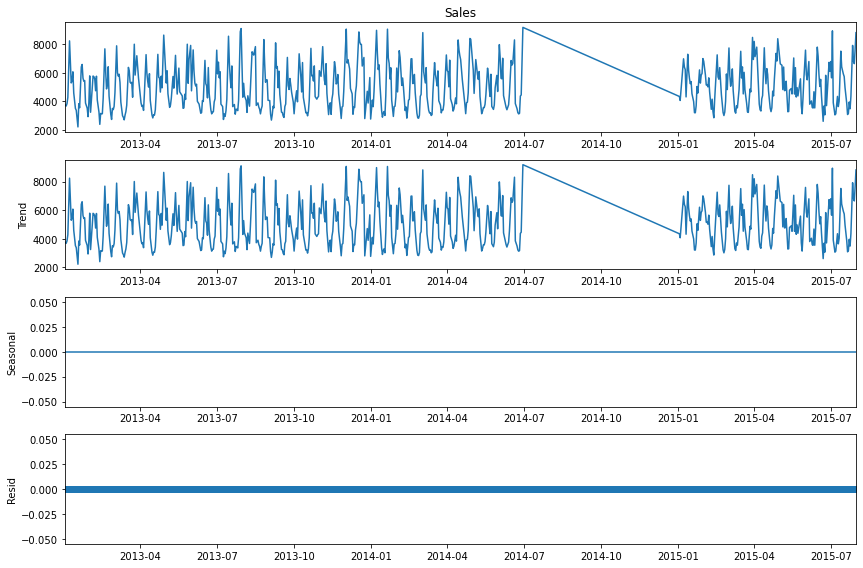

In [332]:
# Time series Decomposition
from pylab import rcParams
import statsmodels.api as sm
rcParams['figure.figsize'] = 12, 8
decomposition = sm.tsa.seasonal_decompose(data['Sales'], model='additive', period=1) # additive seasonal index
fig = decomposition.plot()
    
plt.show()

#### Clearly, shows seasonality based on the three graphs drawn for the three stores but no trend.

## Split time series data into training and test keeping 36 rows for test (6 weeks)

In [333]:
data.head()
print("Number of Rows in DS 13:", len(data))

Number of Rows in DS 13: 941


In [334]:
# Leave last 36 for forecast, 6 weeks = 42 days minus 6 Sundays == 36
test_len = 36
train_len = len(data) - test_len
print(train_len)

905


In [335]:
# Set inferred freq
data.index.freq = data.index.inferred_freq
train = data.iloc[0:train_len, :]
test = data.iloc[train_len:,:]

In [336]:
train[endog_vars].head()

,Sales,Customers
2013-01-02,3737.0,317.0
2013-01-03,3674.0,292.0
2013-01-04,3848.0,340.0
2013-01-05,4285.0,344.0
2013-01-06,6265.5,456.5


In [337]:
train[exog_vars].head()

,Promo,DayOfWeek,SchoolHoliday
2013-01-02,0,3,1
2013-01-03,0,4,1
2013-01-04,0,5,1
2013-01-05,0,6,0
2013-01-06,0,6,0


# Auto Regressive methods

## Stationarity vs non-stationary time series

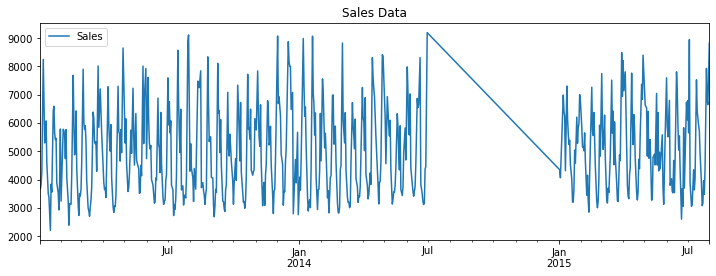

In [338]:
data['Sales'].plot(figsize=(12, 4))
plt.legend(loc='best')
plt.title('Sales Data')
plt.show(block=False)

### Augmented Dickey-Fuller (ADF) test

In [339]:
from statsmodels.tsa.stattools import adfuller
adf_test = adfuller(data['Sales'])

print('ADF Statistic: %f' % adf_test[0])
print('Critical Values @ 0.05: %.2f' % adf_test[4]['5%'])
print('p-value: %f' % adf_test[1])

ADF Statistic: -2.976266
Critical Values @ 0.05: -2.86
p-value: 0.037171


### The p-value is 0.03 way under than 0.05 and so according to ADF the series is Non-Stationary

### Kwiatkowski-Phillips-Schmidt-Shin (KPSS) test

In [340]:
from statsmodels.tsa.stattools import kpss
kpss_test = kpss(data['Sales'])

print('KPSS Statistic: %f' % kpss_test[0])
print('Critical Values @ 0.05: %.2f' % kpss_test[3]['5%'])
print('p-value: %f' % kpss_test[1])

KPSS Statistic: 0.645475
Critical Values @ 0.05: 0.46
p-value: 0.018502


### The p-value is 0.01 is lower than 0.05 and so according to KPSS the series is non-Stationary. 

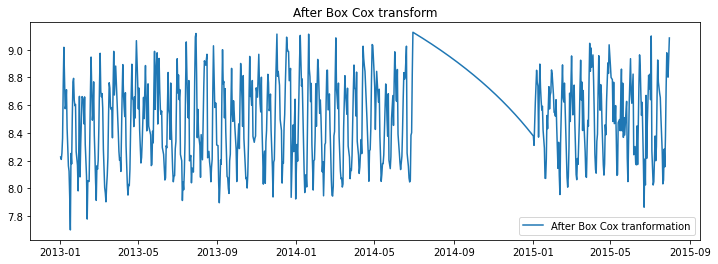

In [341]:
### Box Cox transformation to make variance constant
from scipy.stats import boxcox
data_boxcox = pd.Series(boxcox(data['Sales'], lmbda=0), index = data.index)

plt.figure(figsize=(12,4))
plt.plot(data_boxcox, label='After Box Cox tranformation')
plt.legend(loc='best')
plt.title('After Box Cox transform')
plt.show()

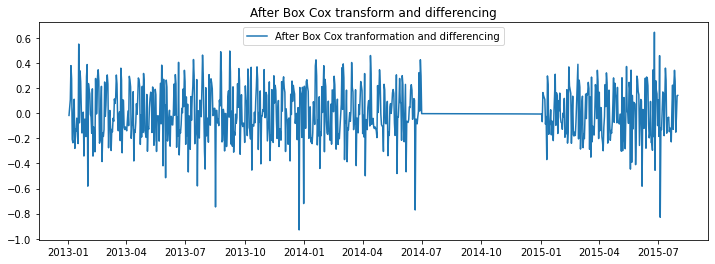

In [342]:
# Differencing
data_boxcox_diff = pd.Series(data_boxcox - data_boxcox.shift(), data.index)
plt.figure(figsize=(12,4))
plt.plot(data_boxcox_diff, label='After Box Cox tranformation and differencing')
plt.legend(loc='best')
plt.title('After Box Cox transform and differencing')
plt.show()

In [343]:
data_boxcox_diff.dropna(inplace=True)

### Autocorrelation function (ACF) and PACF as subplots

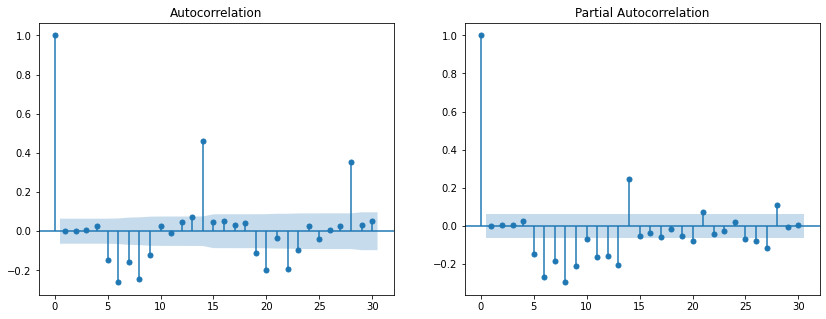

In [344]:
from statsmodels.graphics.tsaplots import plot_acf
from statsmodels.graphics.tsaplots import plot_pacf

fig, ax = plt.subplots(1,2,figsize=(14,5))
sm.graphics.tsa.plot_acf(data_boxcox_diff.squeeze(), lags=30, ax=ax[0])
sm.graphics.tsa.plot_pacf(data_boxcox_diff.squeeze(), lags=30, ax=ax[1])
plt.show()

#### p = 1 and q = 14

## VAR Model

In [345]:
# Define endog vards and exog vars and scale Sales and Customers to same metric
#from sklearn.preprocessing import StandardScaler
#caler = StandardScaler()
#train[endog_vars] = scaler.fit_transform(train[endog_vars]) # for train data
#test[endog_vars] = scaler.fit_transform(test[endog_vars]) # for test data

In [346]:
# Check and see if Scaling worked
train.head()

,Store,DayOfWeek,Sales,Customers,Open,Promo,SchoolHoliday
2013-01-02,13,3,3737.0,317.0,1,0,1
2013-01-03,13,4,3674.0,292.0,1,0,1
2013-01-04,13,5,3848.0,340.0,1,0,1
2013-01-05,13,6,4285.0,344.0,1,0,0
2013-01-06,13,6,6265.5,456.5,1,0,0


In [347]:
#  Stationarity Test - ADF Test
for i in range(len(endog_vars)):
    print('\n' + endog_vars[i] + ': ADF test results:')
    result = adfuller(data[endog_vars[i]].dropna())
    print('ADF Statistic: %f' % result[0])
    print('p-value: %f' % result[1])
    print('Critical Values:')
    for key, value in result[4].items():
        if key=='5%':
            print('\t%s: %.3f' % (key, value))


Sales: ADF test results:
ADF Statistic: -2.976266
p-value: 0.037171
Critical Values:
	5%: -2.865

Customers: ADF test results:
ADF Statistic: -3.210983
p-value: 0.019358
Critical Values:
	5%: -2.865


In [348]:
# VAR does not need exog vars
mod = sm.tsa.VARMAX(train[endog_vars], order=(1,2), trend='n') # p = 1 and q = 14
res = mod.fit(maxiter=1000, disp=False)
print(res.summary())
#Note the AIC value - lower AIC => better model

/Users/venkir/opt/anaconda3/lib/python3.9/site-packages/statsmodels/tsa/statespace/varmax.py:161: EstimationWarning: Estimation of VARMA(p,q) models is not generically robust, due especially to identification issues.
  warn('Estimation of VARMA(p,q) models is not generically robust,'


                             Statespace Model Results                             
Dep. Variable:     ['Sales', 'Customers']   No. Observations:                  905
Model:                         VARMA(1,2)   Log Likelihood              -11460.721
Date:                    Mon, 17 Jan 2022   AIC                          22951.442
Time:                            13:22:05   BIC                          23023.561
Sample:                        01-02-2013   HQIC                         22978.985
                             - 06-25-2015                                         
Covariance Type:                      opg                                         
Ljung-Box (L1) (Q):             0.19, 2.69   Jarque-Bera (JB):        76.28, 469.96
Prob(Q):                        0.66, 0.10   Prob(JB):                   0.00, 0.00
Heteroskedasticity (H):         0.51, 0.92   Skew:                     -0.29, -0.38
Prob(H) (two-sided):            0.00, 0.49   Kurtosis:                   4.29, 6.45


In [349]:
test_len=len(test.index)
test_len

36

In [350]:
predictions = res.forecast(steps=test_len, exog=test[exog_vars])
predictions['Date'] = test.index
predictions = predictions.set_index('Date')

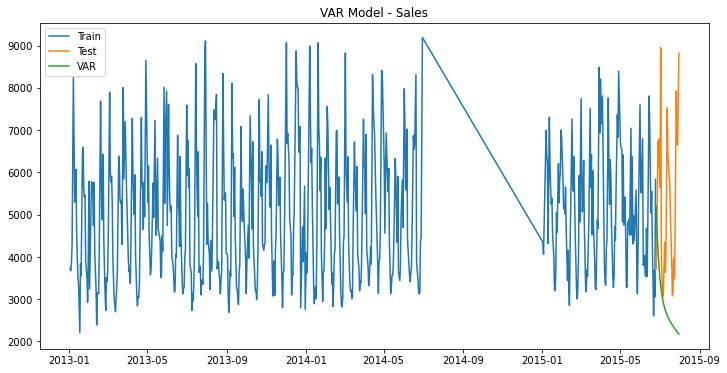

In [351]:
plt.figure(figsize=(12,6))
plt.plot(train['Sales'], label='Train')
plt.plot(test['Sales'], label='Test')
plt.plot(predictions['Sales'], label='VAR')
plt.legend(loc='best')
plt.title('VAR Model - Sales')
plt.show()

In [352]:
# Root Mean Square Error (RMSE)
rmse = np.sqrt(mean_squared_error(test.Sales, predictions.Sales)).round(2)

model_comparison=pd.DataFrame()
model_comparison.loc[0,'Model']='VAR'
model_comparison.loc[0,'Variable']='Sales'
model_comparison.loc[0,'RMSE']=rmse

rmse = np.sqrt(mean_squared_error(test.Customers, predictions.Customers)).round(2)
#print('Investment: RMSE:',  rmse)

append=pd.DataFrame()
append.loc[0,'Model']='VAR'
append.loc[0,'Variable']='Customers'
append.loc[0,'RMSE']=rmse

model_comparison = model_comparison.append(append)

# Mean Absolute Percentage Error
abs_error = np.abs(test.Sales-predictions.Sales)
actual = test.Sales
mape = np.round(np.mean(abs_error/actual)*100, 2)

model_comparison.loc[model_comparison['Variable']=='Sales', 'MAPE'] = mape

abs_error = np.abs(test.Customers-predictions.Customers)
actual = test.Customers
mape = np.round(np.mean(abs_error/actual)*100, 2)
#print('Investment: MAPE:',  mape)

model_comparison.loc[model_comparison['Variable']=='Customers', 'MAPE'] = mape

In [353]:
model_comparison.reset_index(drop=True, inplace=True)
#model_comparison

In [354]:
# Display concatenated Diplay of rrmse and mape errors
results_display = model_comparison.copy()
results_display

,Model,Variable,RMSE,MAPE
0,VAR,Sales,3055.94,42.03
1,VAR,Customers,184.32,40.68


In [355]:
from statsmodels.tsa.api import VAR
from statsmodels.tsa.base import  datetools
var = VAR(data[endog_vars])

x= var.select_order()
x.summary()

,AIC,BIC,FPE,HQIC
0,21.10,21.12,1.464e+09,21.11
1,19.71,19.75,3.644e+08,19.73
2,19.69,19.74,3.550e+08,19.71
3,19.67,19.75,3.501e+08,19.70
4,19.67,19.77,3.494e+08,19.71
5,19.62,19.74,3.324e+08,19.67
6,19.57,19.71,3.162e+08,19.62
7,19.52,19.67,2.992e+08,19.58
8,19.50,19.68,2.944e+08,19.57
9,19.43,19.63,2.746e+08,19.51


In [356]:
"""
    Johansen cointegration test of the cointegration rank of a VECM

    Parameters
    ----------
    endog : array_like (nobs_tot x neqs)
        Data to test
    det_order : int
        * -1 - no deterministic terms - model1
        * 0 - constant term - model3
        * 1 - linear trend
    k_ar_diff : int, nonnegative
        Number of lagged differences in the model.
"""

def joh_output(res):
    output = pd.DataFrame([res.lr2,res.lr1],
                          index=['max_eig_stat',"trace_stat"])
    print(output.T,'\n')
    print("Critical values(90%, 95%, 99%) of max_eig_stat\n",res.cvm,'\n')
    print("Critical values(90%, 95%, 99%) of trace_stat\n",res.cvt,'\n')

In [357]:
joh_model1 = coint_johansen(data[endog_vars],-1,1) # k_ar_diff +1 = K
joh_output(joh_model1)

   max_eig_stat  trace_stat
0     97.455141  100.039816
1      2.584675    2.584675 

Critical values(90%, 95%, 99%) of max_eig_stat
 [[ 9.4748 11.2246 15.0923]
 [ 2.9762  4.1296  6.9406]] 

Critical values(90%, 95%, 99%) of trace_stat
 [[10.4741 12.3212 16.364 ]
 [ 2.9762  4.1296  6.9406]] 



In [358]:
from statsmodels.tsa.vector_ar.vecm import select_coint_rank
rank=select_coint_rank(data[endog_vars],-1,1)
print(rank.rank)
#result=stt.coint(endog['Sales'], endog['Customers'])

1


**These two Series Sales and Customers are COINTEGRATED because the rank = 1**

In [359]:
# use fit = 15
results = var.fit(15)
#We can check the summary of the model by.
results.summary()

  Summary of Regression Results   
Model:                         VAR
Method:                        OLS
Date:           Mon, 17, Jan, 2022
Time:                     13:22:06
--------------------------------------------------------------------
No. of Equations:         2.00000    BIC:                    19.5471
Nobs:                     926.000    HQIC:                   19.3470
Log likelihood:          -11466.4    FPE:                2.23218e+08
AIC:                      19.2236    Det(Omega_mle):     2.08990e+08
--------------------------------------------------------------------
Results for equation Sales
                   coefficient       std. error           t-stat            prob
--------------------------------------------------------------------------------
const               803.512852       294.196603            2.731           0.006
L1.Sales              0.613945         0.079292            7.743           0.000
L1.Customers          2.580056         1.412298            1

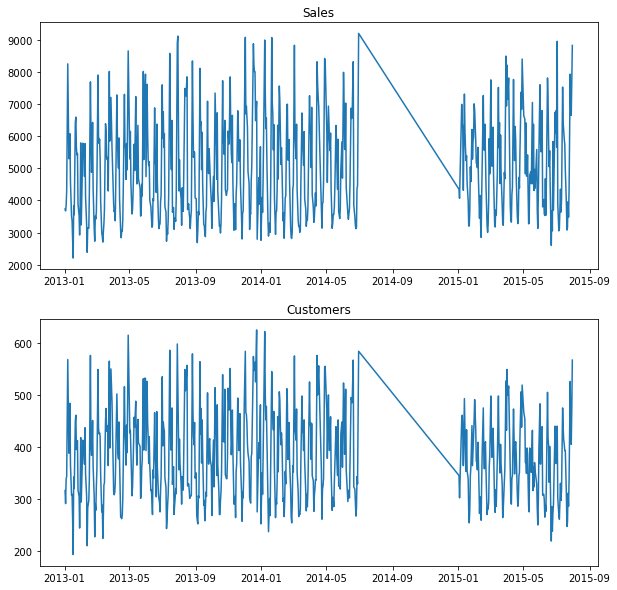

In [360]:
#Visualizing the input:
results.plot();

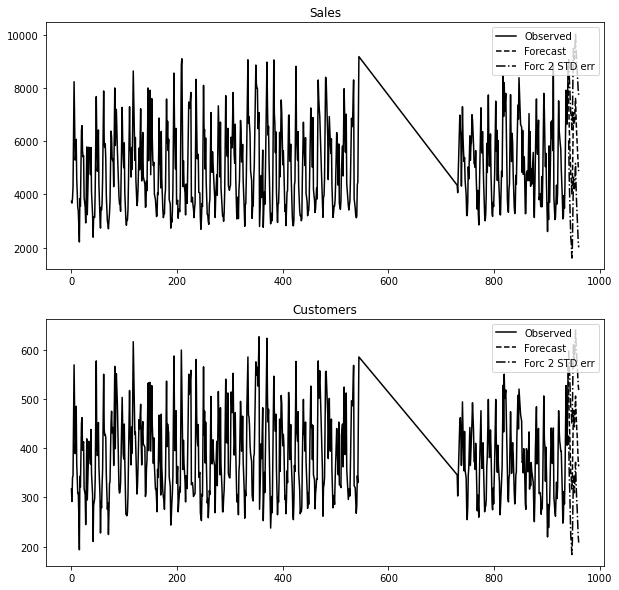

In [361]:
#We can also plot our forecasted values by the model.

results.plot_forecast(20);

### VARMAX Model

In [362]:
from statsmodels.tsa.api import VARMAX
mod = sm.tsa.VARMAX(data[endog_vars], order=(2,1), trend='n', exog=data[exog_vars])
res = mod.fit(maxiter=1000, disp=False)
print(res.summary())

/Users/venkir/opt/anaconda3/lib/python3.9/site-packages/statsmodels/tsa/statespace/varmax.py:161: EstimationWarning: Estimation of VARMA(p,q) models is not generically robust, due especially to identification issues.
  warn('Estimation of VARMA(p,q) models is not generically robust,'


                             Statespace Model Results                             
Dep. Variable:     ['Sales', 'Customers']   No. Observations:                  941
Model:                        VARMAX(2,1)   Log Likelihood              -12003.734
Date:                    Mon, 17 Jan 2022   AIC                          24049.468
Time:                            13:22:25   BIC                          24151.254
Sample:                        01-02-2013   HQIC                         24088.268
                             - 07-31-2015                                         
Covariance Type:                      opg                                         
Ljung-Box (L1) (Q):             2.31, 0.10   Jarque-Bera (JB):         9.90, 965.30
Prob(Q):                        0.13, 0.76   Prob(JB):                   0.01, 0.00
Heteroskedasticity (H):         0.69, 1.34   Skew:                     -0.21, -0.87
Prob(H) (two-sided):            0.00, 0.01   Kurtosis:                   3.27, 7.64


In [363]:
predictions = res.forecast(steps=test_len, exog=test[exog_vars])
predictions['Date'] = test.index
predictions = predictions.set_index('Date')

/Users/venkir/opt/anaconda3/lib/python3.9/site-packages/statsmodels/tsa/statespace/varmax.py:161: EstimationWarning: Estimation of VARMA(p,q) models is not generically robust, due especially to identification issues.
  warn('Estimation of VARMA(p,q) models is not generically robust,'
/Users/venkir/opt/anaconda3/lib/python3.9/site-packages/statsmodels/tsa/statespace/varmax.py:161: EstimationWarning: Estimation of VARMA(p,q) models is not generically robust, due especially to identification issues.
  warn('Estimation of VARMA(p,q) models is not generically robust,'


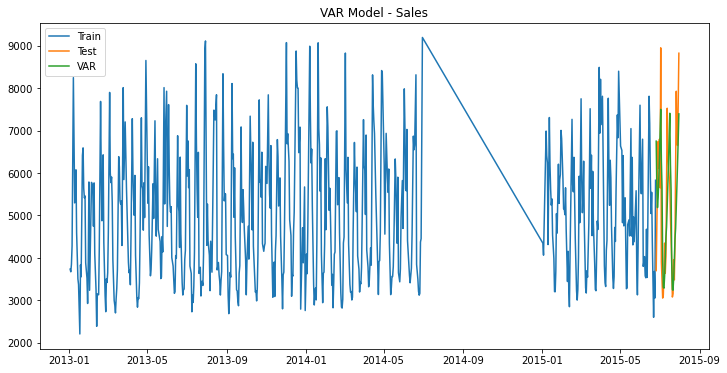

In [364]:
plt.figure(figsize=(12,6))
plt.plot(train['Sales'], label='Train')
plt.plot(test['Sales'], label='Test')
plt.plot(predictions['Sales'], label='VAR')
plt.legend(loc='best')
plt.title('VAR Model - Sales')
plt.show()

In [365]:
# Root Mean Square Error (RMSE)
rmse = np.sqrt(mean_squared_error(test.Sales, predictions.Sales)).round(2)

model_comparison=pd.DataFrame()
model_comparison.loc[0,'Model']='VARMAX'
model_comparison.loc[0,'Variable']='Sales'
model_comparison.loc[0,'RMSE']=rmse

rmse = np.sqrt(mean_squared_error(test.Customers, predictions.Customers)).round(2)
#print('Investment: RMSE:',  rmse)

append=pd.DataFrame()
append.loc[0,'Model']='VARMAX'
append.loc[0,'Variable']='Customers'
append.loc[0,'RMSE']=rmse

model_comparison = model_comparison.append(append)

# Mean Absolute Percentage Error
abs_error = np.abs(test.Sales-predictions.Sales)
actual = test.Sales
mape = np.round(np.mean(abs_error/actual)*100, 2)

model_comparison.loc[model_comparison['Variable']=='Sales', 'MAPE'] = mape

abs_error = np.abs(test.Customers-predictions.Customers)
actual = test.Customers
mape = np.round(np.mean(abs_error/actual)*100, 2)
#print('Investment: MAPE:',  mape)

model_comparison.loc[model_comparison['Variable']=='Customers', 'MAPE'] = mape

In [366]:
model_comparison.reset_index(drop=True, inplace=True)
#model_comparison

In [367]:
results_display = pd.concat([results_display, model_comparison])
results_display

,Model,Variable,RMSE,MAPE
0,VAR,Sales,3055.94,42.03
1,VAR,Customers,184.32,40.68
0,VARMAX,Sales,1246.28,19.04
1,VARMAX,Customers,68.23,14.61


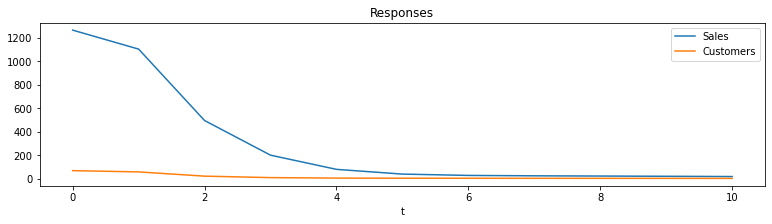

In [368]:
ax = res.impulse_responses(10, orthogonalized=True, impulse=[1, 0]).plot(figsize=(13,3))
ax.set(xlabel='t', title='Responses');

### SARIMAX Model for Sales

In [369]:
model=sm.tsa.statespace.SARIMAX(data['Sales'],order=(1, 1, 1),seasonal_order=(1,0,1,12), exog=data[exog_vars])
results=model.fit()
print(model_fit.params)

 This problem is unconstrained.


RUNNING THE L-BFGS-B CODE

           * * *

Machine precision = 2.220D-16
 N =            8     M =           10

At X0         0 variables are exactly at the bounds

At iterate    0    f=  8.69790D+00    |proj g|=  9.26260D-01

At iterate    5    f=  8.17904D+00    |proj g|=  2.58666D-02

At iterate   10    f=  8.09044D+00    |proj g|=  2.86679D-03

At iterate   15    f=  8.08827D+00    |proj g|=  2.56300D-02

At iterate   20    f=  8.08061D+00    |proj g|=  1.22760D-02

At iterate   25    f=  8.07887D+00    |proj g|=  3.15766D-03

At iterate   30    f=  8.07869D+00    |proj g|=  1.42218D-04

At iterate   35    f=  8.07868D+00    |proj g|=  2.58669D-03

At iterate   40    f=  8.07715D+00    |proj g|=  2.47287D-02

At iterate   45    f=  8.07485D+00    |proj g|=  2.03789D-03

At iterate   50    f=  8.07463D+00    |proj g|=  9.47525D-04

           * * *

Tit   = total number of iterations
Tnf   = total number of function evaluations
Tnint = total number of segments explored during Cau

/Users/venkir/opt/anaconda3/lib/python3.9/site-packages/statsmodels/base/model.py:566: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "


<AxesSubplot:title={'center':'SARIMAX Model - Sales'}>

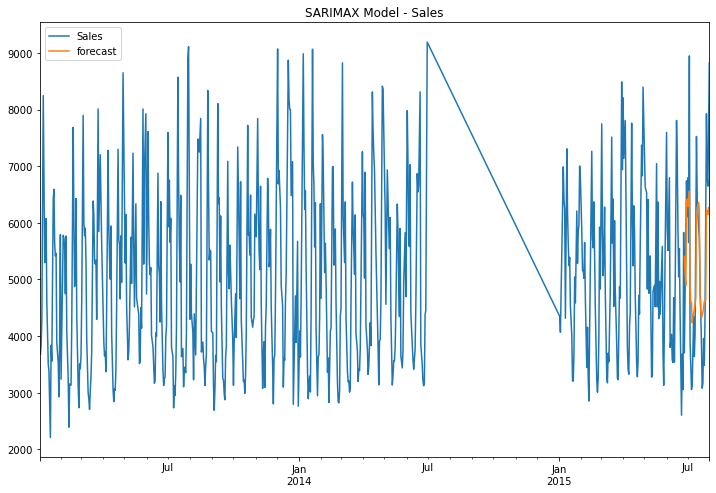

In [370]:
#Testing the fitted model.
data['forecast']=results.predict(start=test.index.min(),end=test.index.max(),dynamic=True)
data[['Sales','forecast']].plot(figsize=(12,8), title='SARIMAX Model - Sales')

In [371]:
rmse = np.sqrt(mean_squared_error(test['Sales'], data['forecast'][test.index.min():])).round(2)
mape = np.round(np.mean(np.abs(test['Sales']-data['forecast'][test.index.min():])/test['Sales'])*100,2)

tempResults = pd.DataFrame({'Model':['SARIMAX method'], 'Variable':['Sales'], 'RMSE': [rmse],'MAPE': [mape] })
#tempResults

In [372]:
results_display = pd.concat([results_display, tempResults])
results_display

,Model,Variable,RMSE,MAPE
0,VAR,Sales,3055.94,42.03
1,VAR,Customers,184.32,40.68
0,VARMAX,Sales,1246.28,19.04
1,VARMAX,Customers,68.23,14.61
0,SARIMAX method,Sales,1073.99,17.93


### SARIMAX Model for Customers

In [373]:
model=sm.tsa.statespace.SARIMAX(data['Customers'],order=(1, 1, 1),seasonal_order=(1,0,1,12), exog=data[exog_vars])
results=model.fit()
print(model_fit.params)

 This problem is unconstrained.


RUNNING THE L-BFGS-B CODE

           * * *

Machine precision = 2.220D-16
 N =            8     M =           10

At X0         0 variables are exactly at the bounds

At iterate    0    f=  5.30396D+00    |proj g|=  5.55009D-02

At iterate    5    f=  5.25091D+00    |proj g|=  7.26300D-03

At iterate   10    f=  5.24632D+00    |proj g|=  5.78682D-03

At iterate   15    f=  5.24351D+00    |proj g|=  1.04880D-02

At iterate   20    f=  5.23496D+00    |proj g|=  1.87444D-03

At iterate   25    f=  5.23448D+00    |proj g|=  2.95902D-03

At iterate   30    f=  5.23422D+00    |proj g|=  4.34744D-03

At iterate   35    f=  5.23253D+00    |proj g|=  1.34712D-03

At iterate   40    f=  5.23164D+00    |proj g|=  1.12252D-03

At iterate   45    f=  5.23128D+00    |proj g|=  1.33901D-03

At iterate   50    f=  5.23128D+00    |proj g|=  4.30711D-05

           * * *

Tit   = total number of iterations
Tnf   = total number of function evaluations
Tnint = total number of segments explored during Cau

/Users/venkir/opt/anaconda3/lib/python3.9/site-packages/statsmodels/base/model.py:566: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "


<AxesSubplot:title={'center':'SARIMAX Model - Customers'}>

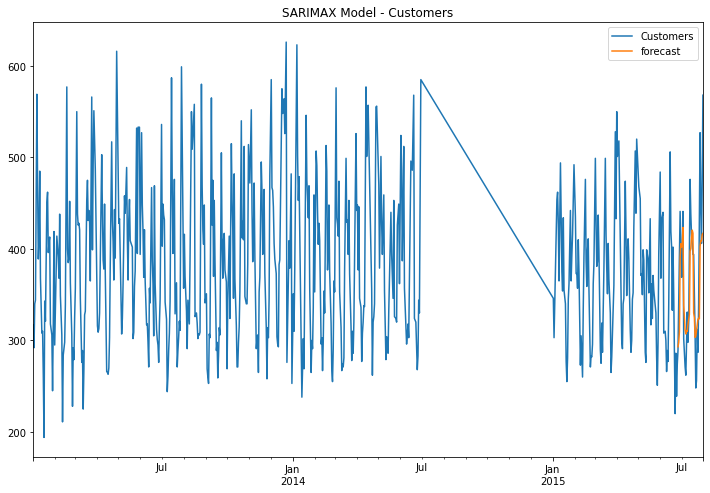

In [374]:
#Testing the fitted model.
data['forecast']=results.predict(start=test.index.min(),end=test.index.max(),dynamic=True)
data[['Customers','forecast']].plot(figsize=(12,8), title='SARIMAX Model - Customers')

In [375]:
rmse = np.sqrt(mean_squared_error(test['Customers'], data['forecast'][test.index.min():])).round(2)
mape = np.round(np.mean(np.abs(test['Customers']-data['forecast'][test.index.min():])/test['Sales'])*100,2)

tempResults = pd.DataFrame({'Model':['SARIMAX method'], 'Variable':['Customers'], 'RMSE': [rmse],'MAPE': [mape] })
#tempResults

In [376]:
results_display = pd.concat([results_display, tempResults])
results_display

,Model,Variable,RMSE,MAPE
0,VAR,Sales,3055.94,42.03
1,VAR,Customers,184.32,40.68
0,VARMAX,Sales,1246.28,19.04
1,VARMAX,Customers,68.23,14.61
0,SARIMAX method,Sales,1073.99,17.93
0,SARIMAX method,Customers,53.13,0.76


#### End of Analysis for Store 13, - Remaining Ones are: 25,29,31 and 46.

# Store 25

## Outlier detection for each Store as it affects each independently

### Box plot and interquartile range

In [377]:
data=data_store25.copy()
data = data.sort_index(ascending=True) # Sort of ascending time and date

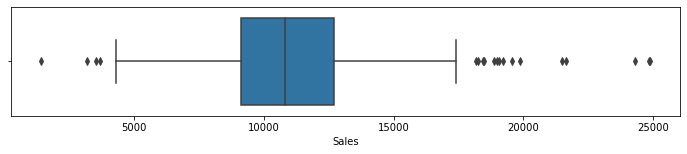

In [378]:
import seaborn as sns
fig = plt.subplots(figsize=(12, 2))
ax = sns.boxplot(x=data['Sales'],whis=1.5)

In [379]:
# Remove outliers for Sales, at 99% looks like we have many points
outlier_value = data['Sales'].quantile(0.99)
print(outlier_value)

19141.71


In [380]:
# Update the outliers to NaN
data.Sales=data.Sales.where(data.Sales.between(0,outlier_value))
data['Sales'].describe()

count      742.000000
mean     11052.233154
std       2576.909778
min       1410.000000
25%       9104.250000
50%      10731.000000
75%      12615.000000
max      19080.000000
Name: Sales, dtype: float64

In [381]:
# Remove outliers for Customers, at 99% looks like we have many points
outlier_value = data['Customers'].quantile(0.99)
print(outlier_value)

2319.6499999999996


In [382]:
# Update the outliers to NaN
data.Customers=data.Customers.where(data.Customers.between(0,outlier_value))
data['Customers'].describe()

count     742.000000
mean     1560.607817
std       283.439190
min       237.000000
25%      1362.250000
50%      1541.000000
75%      1741.750000
max      2312.000000
Name: Customers, dtype: float64

### The NaN or Missing Values can be filled with Linear Interpolated values

#### Do for both the Sales and Customers Column

In [383]:
# Check for nulls in all columns
data.isnull().sum(axis = 0)

Store             0
DayOfWeek         0
Sales            10
Customers        10
Open              0
Promo             0
SchoolHoliday     0
dtype: int64

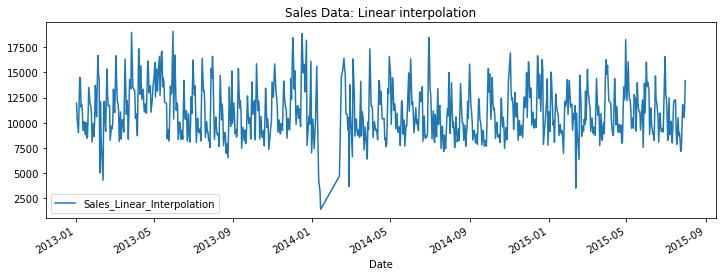

In [384]:
# FIll Missing with Linear Interpolation Doe Sales col
data = data.assign(Sales_Linear_Interpolation=data.Sales.interpolate(method='linear'))
data[['Sales_Linear_Interpolation']].plot(figsize=(12, 4))
plt.legend(loc='best')
plt.title('Sales Data: Linear interpolation')
plt.show(block=False)

In [385]:
data['Sales'] = data['Sales_Linear_Interpolation']
data.drop(columns=['Sales_Linear_Interpolation'],inplace=True)

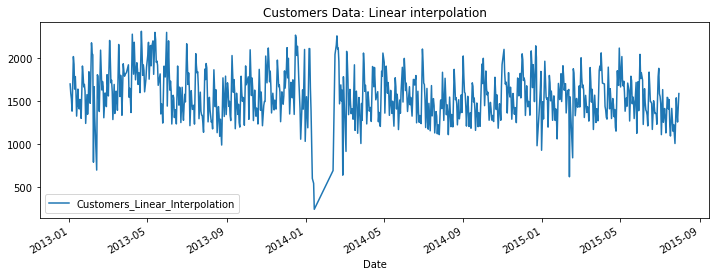

In [386]:
# FIll Missing with Linear Interpolation for Customers col
data = data.assign(Customers_Linear_Interpolation=data.Customers.interpolate(method='linear'))
data[['Customers_Linear_Interpolation']].plot(figsize=(12, 4))
plt.legend(loc='best')
plt.title('Customers Data: Linear interpolation')
plt.show(block=False)

In [387]:
# Replace with the Linear interpolated values
data['Customers'] = data['Customers_Linear_Interpolation']
data.drop(columns=['Customers_Linear_Interpolation'],inplace=True)

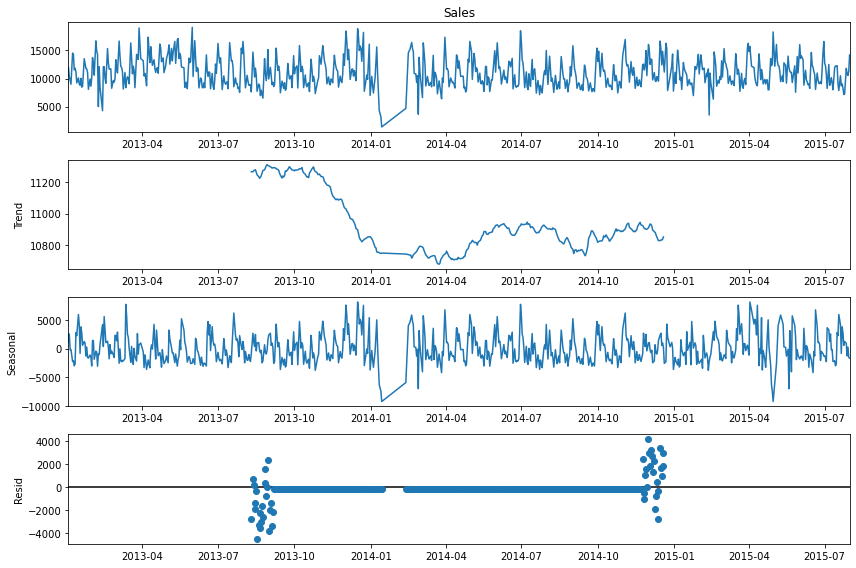

In [388]:
# Time series Decomposition
from pylab import rcParams
import statsmodels.api as sm
rcParams['figure.figsize'] = 12, 8
decomposition = sm.tsa.seasonal_decompose(data['Sales'], model='additive', freq=365) # additive seasonal index
fig = decomposition.plot()
    
plt.show()

#### Clearly, shows seasonality based on the three graphs drawn for the three stores but no trend.

## Split time series data into training and test keeping 36 rows for test (6 weeks)

In [389]:
data.head()
print("Number of Rows in DS 25:", len(data))

Number of Rows in DS 25: 752


In [390]:
# Leave last 36 for forecast, 6 weeks = 42 days minus 6 Sundays == 36
test_len = 36
train_len = len(data) - test_len
print(train_len)

716


In [391]:
# Set inferred freq
data.index.freq = data.index.inferred_freq
train = data.iloc[0:train_len, :]
test = data.iloc[train_len:,:]

In [392]:
train[endog_vars].head()

,Sales,Customers
Date,,
2013-01-02,11944.0,1698.0
2013-01-03,10409.0,1587.0
2013-01-04,9729.0,1520.0
2013-01-05,8987.0,1381.0
2013-01-07,14513.0,2017.0


In [393]:
train[exog_vars].head()

,Promo,DayOfWeek,SchoolHoliday
Date,,,
2013-01-02,0,3,1
2013-01-03,0,4,1
2013-01-04,0,5,1
2013-01-05,0,6,0
2013-01-07,1,1,0


# Auto Regressive methods

## Stationarity vs non-stationary time series

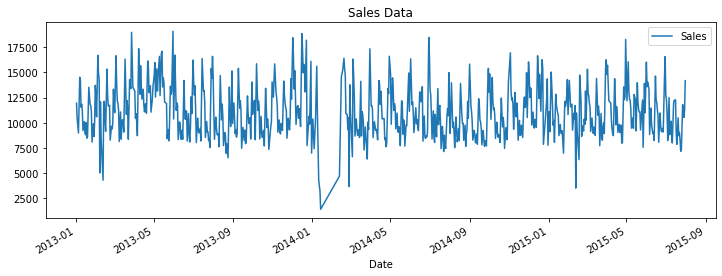

In [394]:
data['Sales'].plot(figsize=(12, 4))
plt.legend(loc='best')
plt.title('Sales Data')
plt.show(block=False)

### Augmented Dickey-Fuller (ADF) test

In [395]:
from statsmodels.tsa.stattools import adfuller
adf_test = adfuller(data['Sales'])

print('ADF Statistic: %f' % adf_test[0])
print('Critical Values @ 0.05: %.2f' % adf_test[4]['5%'])
print('p-value: %f' % adf_test[1])

ADF Statistic: -6.391976
Critical Values @ 0.05: -2.87
p-value: 0.000000


### The p-value is 0.003 way under than 0.05 and so according to ADF the series is Stationary

### Kwiatkowski-Phillips-Schmidt-Shin (KPSS) test

In [396]:
from statsmodels.tsa.stattools import kpss
kpss_test = kpss(data['Sales'])

print('KPSS Statistic: %f' % kpss_test[0])
print('Critical Values @ 0.05: %.2f' % kpss_test[3]['5%'])
print('p-value: %f' % kpss_test[1])

KPSS Statistic: 0.315520
Critical Values @ 0.05: 0.46
p-value: 0.100000


/Users/venkir/opt/anaconda3/lib/python3.9/site-packages/statsmodels/tsa/stattools.py:1910: InterpolationWarning: The test statistic is outside of the range of p-values available in the
look-up table. The actual p-value is greater than the p-value returned.

  warnings.warn(


### The p-value is 0.1 is higher than 0.05 and so according to KPSS the series is Stationary. 

### Autocorrelation function (ACF) and PACF as subplots

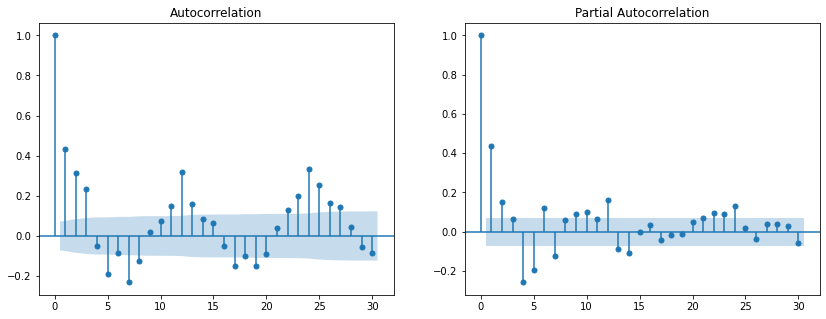

In [397]:
from statsmodels.graphics.tsaplots import plot_acf
from statsmodels.graphics.tsaplots import plot_pacf

fig, ax = plt.subplots(1,2,figsize=(14,5))
sm.graphics.tsa.plot_acf(data['Sales'].squeeze(), lags=30, ax=ax[0])
sm.graphics.tsa.plot_pacf(data['Sales'].squeeze(), lags=30, ax=ax[1])
plt.show()

#### p = 1 and q = 1

## VAR Model

In [398]:
# Define endog vards and exog vars and scale Sales and Customers to same metric
#from sklearn.preprocessing import StandardScaler
#caler = StandardScaler()
#train[endog_vars] = scaler.fit_transform(train[endog_vars]) # for train data
#test[endog_vars] = scaler.fit_transform(test[endog_vars]) # for test data

In [399]:
# Check and see if Scaling worked
train.head()

,Store,DayOfWeek,Sales,Customers,Open,Promo,SchoolHoliday
Date,,,,,,,
2013-01-02,25,3,11944.0,1698.0,1,0,1
2013-01-03,25,4,10409.0,1587.0,1,0,1
2013-01-04,25,5,9729.0,1520.0,1,0,1
2013-01-05,25,6,8987.0,1381.0,1,0,0
2013-01-07,25,1,14513.0,2017.0,1,1,0


In [400]:
#  Stationarity Test - ADF Test
for i in range(len(endog_vars)):
    print('\n' + endog_vars[i] + ': ADF test results:')
    result = adfuller(data[endog_vars[i]].dropna())
    print('ADF Statistic: %f' % result[0])
    print('p-value: %f' % result[1])
    print('Critical Values:')
    for key, value in result[4].items():
        if key=='5%':
            print('\t%s: %.3f' % (key, value))


Sales: ADF test results:
ADF Statistic: -6.391976
p-value: 0.000000
Critical Values:
	5%: -2.865

Customers: ADF test results:
ADF Statistic: -4.299487
p-value: 0.000445
Critical Values:
	5%: -2.865


In [401]:
# VAR does not need exog vars
mod = sm.tsa.VARMAX(train[endog_vars], order=(2,1), trend='n') # p = 1 and q = 1
res = mod.fit(maxiter=1000, disp=False)
print(res.summary())
#Note the AIC value - lower AIC => better model

/Users/venkir/opt/anaconda3/lib/python3.9/site-packages/statsmodels/tsa/statespace/varmax.py:161: EstimationWarning: Estimation of VARMA(p,q) models is not generically robust, due especially to identification issues.
  warn('Estimation of VARMA(p,q) models is not generically robust,'
/Users/venkir/opt/anaconda3/lib/python3.9/site-packages/statsmodels/tsa/base/tsa_model.py:581: ValueWarning: A date index has been provided, but it has no associated frequency information and so will be ignored when e.g. forecasting.
  warnings.warn('A date index has been provided, but it has no'


                             Statespace Model Results                             
Dep. Variable:     ['Sales', 'Customers']   No. Observations:                  716
Model:                         VARMA(2,1)   Log Likelihood              -10794.715
Date:                    Mon, 17 Jan 2022   AIC                          21619.430
Time:                            13:22:39   BIC                          21688.035
Sample:                                 0   HQIC                         21645.922
                                    - 716                                         
Covariance Type:                      opg                                         
Ljung-Box (L1) (Q):             5.84, 0.05   Jarque-Bera (JB):      98.99, 28013.36
Prob(Q):                        0.02, 0.81   Prob(JB):                   0.00, 0.00
Heteroskedasticity (H):         0.83, 0.71   Skew:                      0.46, -2.50
Prob(H) (two-sided):            0.16, 0.01   Kurtosis:                  4.57, 33.23


In [402]:
predictions = res.forecast(steps=test_len, exog=test[exog_vars])
predictions['Date'] = test.index
predictions = predictions.set_index('Date')

/Users/venkir/opt/anaconda3/lib/python3.9/site-packages/statsmodels/tsa/base/tsa_model.py:376: ValueWarning: No supported index is available. Prediction results will be given with an integer index beginning at `start`.
  warnings.warn('No supported index is available.'


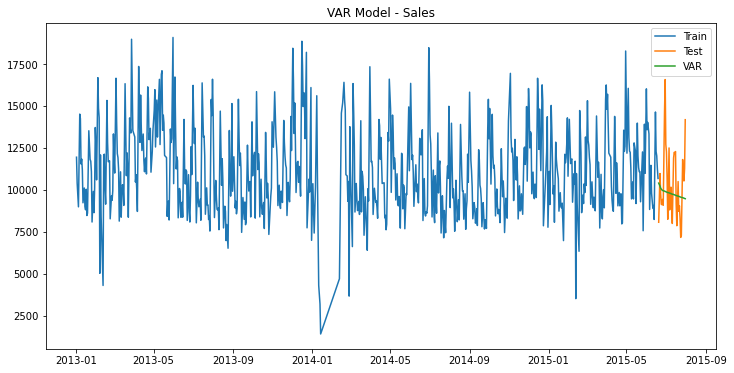

In [403]:
plt.figure(figsize=(12,6))
plt.plot(train['Sales'], label='Train')
plt.plot(test['Sales'], label='Test')
plt.plot(predictions['Sales'], label='VAR')
plt.legend(loc='best')
plt.title('VAR Model - Sales')
plt.show()

In [404]:
# Root Mean Square Error (RMSE)
rmse = np.sqrt(mean_squared_error(test.Sales, predictions.Sales)).round(2)

model_comparison=pd.DataFrame()
model_comparison.loc[0,'Model']='VAR'
model_comparison.loc[0,'Variable']='Sales'
model_comparison.loc[0,'RMSE']=rmse

rmse = np.sqrt(mean_squared_error(test.Customers, predictions.Customers)).round(2)
#print('Investment: RMSE:',  rmse)

append=pd.DataFrame()
append.loc[0,'Model']='VAR'
append.loc[0,'Variable']='Customers'
append.loc[0,'RMSE']=rmse

model_comparison = model_comparison.append(append)

# Mean Absolute Percentage Error
abs_error = np.abs(test.Sales-predictions.Sales)
actual = test.Sales
mape = np.round(np.mean(abs_error/actual)*100, 2)

model_comparison.loc[model_comparison['Variable']=='Sales', 'MAPE'] = mape

abs_error = np.abs(test.Customers-predictions.Customers)
actual = test.Customers
mape = np.round(np.mean(abs_error/actual)*100, 2)
#print('Investment: MAPE:',  mape)

model_comparison.loc[model_comparison['Variable']=='Customers', 'MAPE'] = mape

In [405]:
model_comparison.reset_index(drop=True, inplace=True)
#model_comparison

In [406]:
# Display concatenated Diplay of rrmse and mape errors
results_display = model_comparison.copy()
results_display

,Model,Variable,RMSE,MAPE
0,VAR,Sales,2231.39,16.32
1,VAR,Customers,191.89,11.82


In [407]:
from statsmodels.tsa.api import VAR
from statsmodels.tsa.base import  datetools
var = VAR(data[endog_vars])

x= var.select_order()
x.summary()

/Users/venkir/opt/anaconda3/lib/python3.9/site-packages/statsmodels/tsa/base/tsa_model.py:581: ValueWarning: A date index has been provided, but it has no associated frequency information and so will be ignored when e.g. forecasting.
  warnings.warn('A date index has been provided, but it has no'


,AIC,BIC,FPE,HQIC
0,24.91,24.93,6.612e+10,24.92
1,24.52,24.56,4.471e+10,24.54
2,24.51,24.57,4.390e+10,24.53
3,24.40,24.49,3.943e+10,24.43
4,24.34,24.46,3.730e+10,24.39
5,24.29,24.43*,3.546e+10,24.34
6,24.27,24.44,3.483e+10,24.34
7,24.26,24.45,3.440e+10,24.33
8,24.26,24.48,3.449e+10,24.35
9,24.26,24.50,3.443e+10,24.35


In [408]:
"""
    Johansen cointegration test of the cointegration rank of a VECM

    Parameters
    ----------
    endog : array_like (nobs_tot x neqs)
        Data to test
    det_order : int
        * -1 - no deterministic terms - model1
        * 0 - constant term - model3
        * 1 - linear trend
    k_ar_diff : int, nonnegative
        Number of lagged differences in the model.
"""

def joh_output(res):
    output = pd.DataFrame([res.lr2,res.lr1],
                          index=['max_eig_stat',"trace_stat"])
    print(output.T,'\n')
    print("Critical values(90%, 95%, 99%) of max_eig_stat\n",res.cvm,'\n')
    print("Critical values(90%, 95%, 99%) of trace_stat\n",res.cvt,'\n')

In [409]:
joh_model1 = coint_johansen(data[endog_vars],-1,1) # k_ar_diff +1 = K
joh_output(joh_model1)

   max_eig_stat  trace_stat
0    145.925135  148.879098
1      2.953963    2.953963 

Critical values(90%, 95%, 99%) of max_eig_stat
 [[ 9.4748 11.2246 15.0923]
 [ 2.9762  4.1296  6.9406]] 

Critical values(90%, 95%, 99%) of trace_stat
 [[10.4741 12.3212 16.364 ]
 [ 2.9762  4.1296  6.9406]] 



In [410]:
from statsmodels.tsa.vector_ar.vecm import select_coint_rank
rank=select_coint_rank(data[endog_vars],-1,1)
print(rank.rank)
#result=stt.coint(endog['Sales'], endog['Customers'])

1


**These two Series Sales and Customers are COINTEGRATED because the rank = 1**

In [411]:
# use fit = 16
results = var.fit(16)
#We can check the summary of the model by.
results.summary()

  Summary of Regression Results   
Model:                         VAR
Method:                        OLS
Date:           Mon, 17, Jan, 2022
Time:                     13:22:39
--------------------------------------------------------------------
No. of Equations:         2.00000    BIC:                    24.5513
Nobs:                     736.000    HQIC:                   24.2978
Log likelihood:          -10905.7    FPE:                3.04338e+10
AIC:                      24.1387    Det(Omega_mle):     2.78778e+10
--------------------------------------------------------------------
Results for equation Sales
                   coefficient       std. error           t-stat            prob
--------------------------------------------------------------------------------
const              3413.697508       984.357529            3.468           0.001
L1.Sales              0.439270         0.104021            4.223           0.000
L1.Customers         -1.102187         0.944990           -1

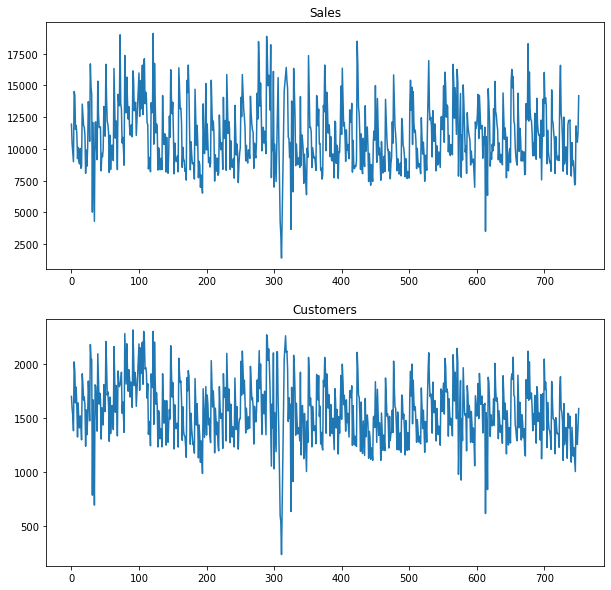

In [412]:
#Visualizing the input:
results.plot();

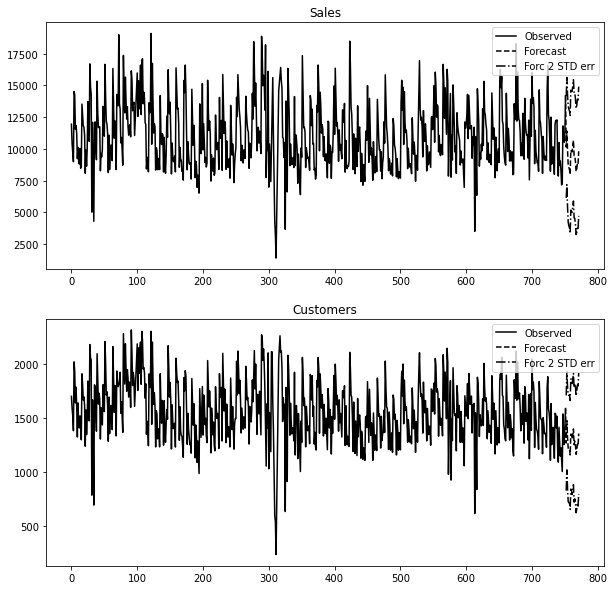

In [413]:
#We can also plot our forecasted values by the model.

results.plot_forecast(20);

### VARMAX Model

In [414]:
from statsmodels.tsa.api import VARMAX
mod = sm.tsa.VARMAX(data[endog_vars], order=(2,1), trend='n', exog=data[exog_vars])
res = mod.fit(maxiter=1000, disp=False)
print(res.summary())

/Users/venkir/opt/anaconda3/lib/python3.9/site-packages/statsmodels/tsa/statespace/varmax.py:161: EstimationWarning: Estimation of VARMA(p,q) models is not generically robust, due especially to identification issues.
  warn('Estimation of VARMA(p,q) models is not generically robust,'
/Users/venkir/opt/anaconda3/lib/python3.9/site-packages/statsmodels/tsa/base/tsa_model.py:581: ValueWarning: A date index has been provided, but it has no associated frequency information and so will be ignored when e.g. forecasting.
  warnings.warn('A date index has been provided, but it has no'


                             Statespace Model Results                             
Dep. Variable:     ['Sales', 'Customers']   No. Observations:                  752
Model:                        VARMAX(2,1)   Log Likelihood              -11484.792
Date:                    Mon, 17 Jan 2022   AIC                          23011.585
Time:                            13:23:04   BIC                          23108.662
Sample:                                 0   HQIC                         23048.986
                                    - 752                                         
Covariance Type:                      opg                                         
Ljung-Box (L1) (Q):             0.37, 0.25   Jarque-Bera (JB):      78.49, 19892.64
Prob(Q):                        0.54, 0.62   Prob(JB):                   0.00, 0.00
Heteroskedasticity (H):         0.94, 0.85   Skew:                      0.24, -2.32
Prob(H) (two-sided):            0.62, 0.19   Kurtosis:                  4.51, 27.77


In [415]:
predictions = res.forecast(steps=test_len, exog=test[exog_vars])
predictions['Date'] = test.index
predictions = predictions.set_index('Date')

/Users/venkir/opt/anaconda3/lib/python3.9/site-packages/statsmodels/tsa/statespace/varmax.py:161: EstimationWarning: Estimation of VARMA(p,q) models is not generically robust, due especially to identification issues.
  warn('Estimation of VARMA(p,q) models is not generically robust,'
/Users/venkir/opt/anaconda3/lib/python3.9/site-packages/statsmodels/tsa/base/tsa_model.py:376: ValueWarning: No supported index is available. Prediction results will be given with an integer index beginning at `start`.
  warnings.warn('No supported index is available.'
/Users/venkir/opt/anaconda3/lib/python3.9/site-packages/statsmodels/tsa/statespace/varmax.py:161: EstimationWarning: Estimation of VARMA(p,q) models is not generically robust, due especially to identification issues.
  warn('Estimation of VARMA(p,q) models is not generically robust,'


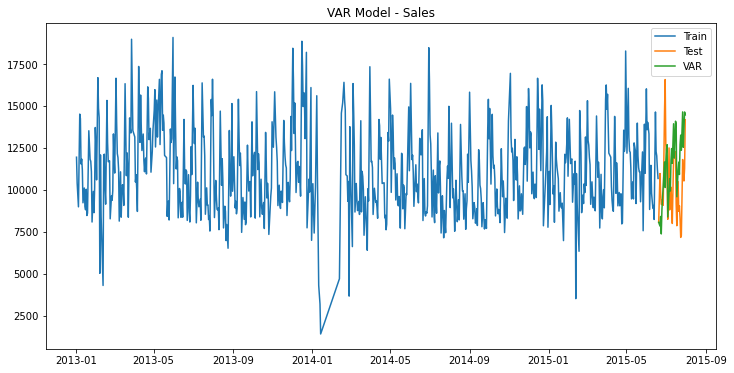

In [416]:
plt.figure(figsize=(12,6))
plt.plot(train['Sales'], label='Train')
plt.plot(test['Sales'], label='Test')
plt.plot(predictions['Sales'], label='VAR')
plt.legend(loc='best')
plt.title('VAR Model - Sales')
plt.show()

In [417]:
# Root Mean Square Error (RMSE)
rmse = np.sqrt(mean_squared_error(test.Sales, predictions.Sales)).round(2)

model_comparison=pd.DataFrame()
model_comparison.loc[0,'Model']='VARMAX'
model_comparison.loc[0,'Variable']='Sales'
model_comparison.loc[0,'RMSE']=rmse

rmse = np.sqrt(mean_squared_error(test.Customers, predictions.Customers)).round(2)
#print('Investment: RMSE:',  rmse)

append=pd.DataFrame()
append.loc[0,'Model']='VARMAX'
append.loc[0,'Variable']='Customers'
append.loc[0,'RMSE']=rmse

model_comparison = model_comparison.append(append)

# Mean Absolute Percentage Error
abs_error = np.abs(test.Sales-predictions.Sales)
actual = test.Sales
mape = np.round(np.mean(abs_error/actual)*100, 2)

model_comparison.loc[model_comparison['Variable']=='Sales', 'MAPE'] = mape

abs_error = np.abs(test.Customers-predictions.Customers)
actual = test.Customers
mape = np.round(np.mean(abs_error/actual)*100, 2)
#print('Investment: MAPE:',  mape)

model_comparison.loc[model_comparison['Variable']=='Customers', 'MAPE'] = mape

In [418]:
model_comparison.reset_index(drop=True, inplace=True)
#model_comparison

In [419]:
results_display = pd.concat([results_display, model_comparison])
results_display

,Model,Variable,RMSE,MAPE
0,VAR,Sales,2231.39,16.32
1,VAR,Customers,191.89,11.82
0,VARMAX,Sales,2729.80,22.12
1,VARMAX,Customers,399.13,26.28


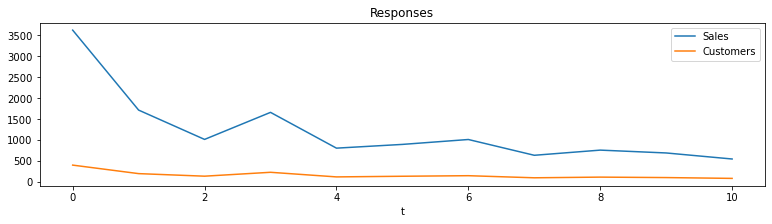

In [420]:
ax = res.impulse_responses(10, orthogonalized=True, impulse=[1, 0]).plot(figsize=(13,3))
ax.set(xlabel='t', title='Responses');

### SARIMAX Model for Sales

In [421]:
model=sm.tsa.statespace.SARIMAX(data['Sales'],order=(1, 1, 1),seasonal_order=(1,0,1,12), exog=data[exog_vars])
results=model.fit()
print(model_fit.params)

/Users/venkir/opt/anaconda3/lib/python3.9/site-packages/statsmodels/tsa/base/tsa_model.py:581: ValueWarning: A date index has been provided, but it has no associated frequency information and so will be ignored when e.g. forecasting.
  warnings.warn('A date index has been provided, but it has no'
/Users/venkir/opt/anaconda3/lib/python3.9/site-packages/statsmodels/tsa/base/tsa_model.py:581: ValueWarning: A date index has been provided, but it has no associated frequency information and so will be ignored when e.g. forecasting.
  warnings.warn('A date index has been provided, but it has no'
 This problem is unconstrained.


RUNNING THE L-BFGS-B CODE

           * * *

Machine precision = 2.220D-16
 N =            8     M =           10

At X0         0 variables are exactly at the bounds

At iterate    0    f=  8.88089D+00    |proj g|=  5.43414D-02

At iterate    5    f=  8.85779D+00    |proj g|=  7.84242D-02

At iterate   10    f=  8.84606D+00    |proj g|=  1.09869D-02

At iterate   15    f=  8.84427D+00    |proj g|=  2.12064D-02

At iterate   20    f=  8.84354D+00    |proj g|=  5.48736D-03

At iterate   25    f=  8.84336D+00    |proj g|=  7.48775D-05

           * * *

Tit   = total number of iterations
Tnf   = total number of function evaluations
Tnint = total number of segments explored during Cauchy searches
Skip  = number of BFGS updates skipped
Nact  = number of active bounds at final generalized Cauchy point
Projg = norm of the final projected gradient
F     = final function value

           * * *

   N    Tit     Tnf  Tnint  Skip  Nact     Projg        F
    8     26     29      1     0     0   

<AxesSubplot:title={'center':'SARIMAX Model - Sales'}, xlabel='Date'>

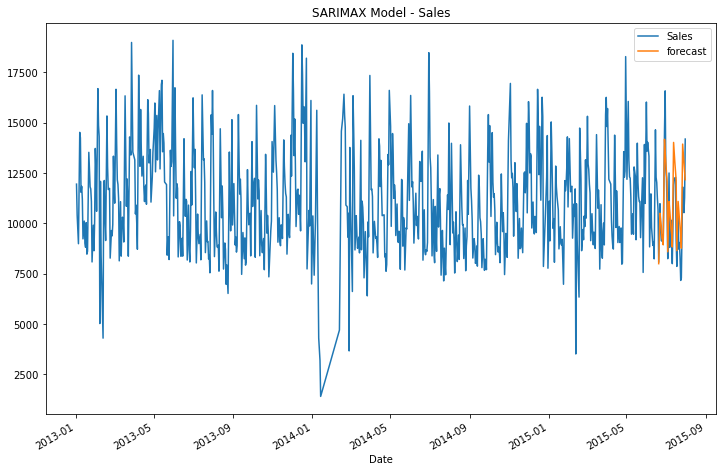

In [422]:
#Testing the fitted model.
data['forecast']=results.predict(start=test.index.min(),end=test.index.max(),dynamic=True)
data[['Sales','forecast']].plot(figsize=(12,8), title='SARIMAX Model - Sales')

In [423]:
rmse = np.sqrt(mean_squared_error(test['Sales'], data['forecast'][test.index.min():])).round(2)
mape = np.round(np.mean(np.abs(test['Sales']-data['forecast'][test.index.min():])/test['Sales'])*100,2)

tempResults = pd.DataFrame({'Model':['SARIMAX method'], 'Variable':['Sales'], 'RMSE': [rmse],'MAPE': [mape] })
#tempResults

In [424]:
results_display = pd.concat([results_display, tempResults])
results_display

,Model,Variable,RMSE,MAPE
0,VAR,Sales,2231.39,16.32
1,VAR,Customers,191.89,11.82
0,VARMAX,Sales,2729.80,22.12
1,VARMAX,Customers,399.13,26.28
0,SARIMAX method,Sales,1440.27,11.32


### SARIMAX Model for Customers

In [425]:
model=sm.tsa.statespace.SARIMAX(data['Customers'],order=(1, 1, 1),seasonal_order=(1,0,1,12), exog=data[exog_vars])
results=model.fit()
print(model_fit.params)

/Users/venkir/opt/anaconda3/lib/python3.9/site-packages/statsmodels/tsa/base/tsa_model.py:581: ValueWarning: A date index has been provided, but it has no associated frequency information and so will be ignored when e.g. forecasting.
  warnings.warn('A date index has been provided, but it has no'
/Users/venkir/opt/anaconda3/lib/python3.9/site-packages/statsmodels/tsa/base/tsa_model.py:581: ValueWarning: A date index has been provided, but it has no associated frequency information and so will be ignored when e.g. forecasting.
  warnings.warn('A date index has been provided, but it has no'
 This problem is unconstrained.


RUNNING THE L-BFGS-B CODE

           * * *

Machine precision = 2.220D-16
 N =            8     M =           10

At X0         0 variables are exactly at the bounds

At iterate    0    f=  6.70059D+00    |proj g|=  6.27655D-02

At iterate    5    f=  6.68143D+00    |proj g|=  6.51124D-02

At iterate   10    f=  6.67081D+00    |proj g|=  6.13649D-03

At iterate   15    f=  6.67062D+00    |proj g|=  2.72085D-03

At iterate   20    f=  6.67040D+00    |proj g|=  8.20195D-03

At iterate   25    f=  6.66621D+00    |proj g|=  8.68471D-03

At iterate   30    f=  6.66610D+00    |proj g|=  8.88777D-05

At iterate   35    f=  6.66601D+00    |proj g|=  4.16761D-03

At iterate   40    f=  6.66592D+00    |proj g|=  5.49799D-04

At iterate   45    f=  6.66562D+00    |proj g|=  3.52837D-03

At iterate   50    f=  6.66450D+00    |proj g|=  2.02283D-03

           * * *

Tit   = total number of iterations
Tnf   = total number of function evaluations
Tnint = total number of segments explored during Cau

/Users/venkir/opt/anaconda3/lib/python3.9/site-packages/statsmodels/base/model.py:566: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "


<AxesSubplot:title={'center':'SARIMAX Model - Customers'}, xlabel='Date'>

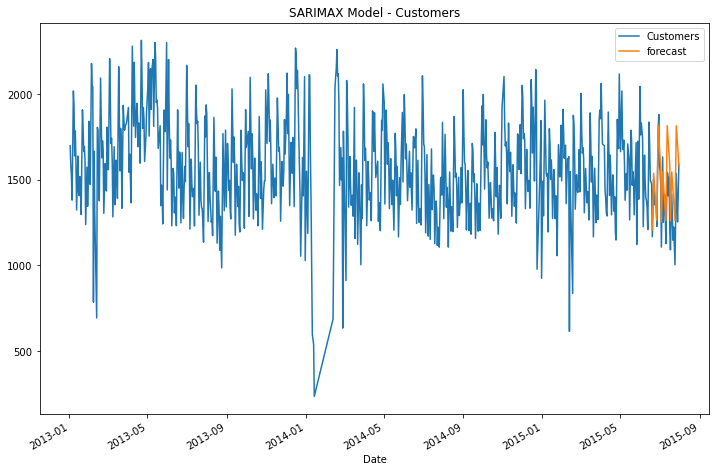

In [426]:
#Testing the fitted model.
data['forecast']=results.predict(start=test.index.min(),end=test.index.max(),dynamic=True)
data[['Customers','forecast']].plot(figsize=(12,8), title='SARIMAX Model - Customers')

In [427]:
rmse = np.sqrt(mean_squared_error(test['Customers'], data['forecast'][test.index.min():])).round(2)
mape = np.round(np.mean(np.abs(test['Customers']-data['forecast'][test.index.min():])/test['Sales'])*100,2)

tempResults = pd.DataFrame({'Model':['SARIMAX method'], 'Variable':['Customers'], 'RMSE': [rmse],'MAPE': [mape] })
#tempResults

In [428]:
results_display = pd.concat([results_display, tempResults])
results_display

,Model,Variable,RMSE,MAPE
0,VAR,Sales,2231.39,16.32
1,VAR,Customers,191.89,11.82
0,VARMAX,Sales,2729.80,22.12
1,VARMAX,Customers,399.13,26.28
0,SARIMAX method,Sales,1440.27,11.32
0,SARIMAX method,Customers,190.82,1.54


# Store 29

## Outlier detection for each Store as it affects each independently

### Box plot and interquartile range

In [429]:
data=data_store29.copy()
data = data.sort_index(ascending=True) # Sort of ascending time and date

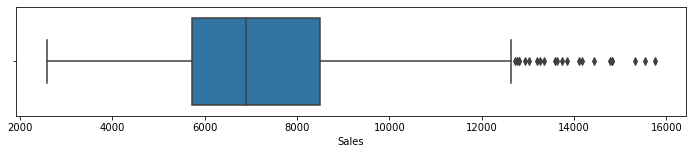

In [430]:
import seaborn as sns
fig = plt.subplots(figsize=(12, 2))
ax = sns.boxplot(x=data['Sales'],whis=1.5)

In [431]:
# Remove outliers for Sales, at 99% looks like we have many points
outlier_value = data['Sales'].quantile(0.99)
print(outlier_value)

14120.860000000002


In [432]:
# Update the outliers to NaN
data.Sales=data.Sales.where(data.Sales.between(0,outlier_value))
data['Sales'].describe()

count      771.000000
mean      7286.022049
std       2074.441274
min       2576.000000
25%       5719.500000
50%       6875.000000
75%       8456.500000
max      14107.000000
Name: Sales, dtype: float64

In [433]:
# Remove outliers for Customers, at 99% looks like we have many points
outlier_value = data['Customers'].quantile(0.99)
print(outlier_value)

1060.7600000000002


In [434]:
# Update the outliers to NaN
data.Customers=data.Customers.where(data.Customers.between(0,outlier_value))
data['Customers'].describe()

count     771.000000
mean      649.020752
std       130.594841
min       268.000000
25%       555.000000
50%       630.000000
75%       721.500000
max      1059.000000
Name: Customers, dtype: float64

### The NaN or Missing Values can be filled with Linear Interpolated values

#### Do for both the Sales and Customers Column

In [435]:
# Check for nulls in all columns
data.isnull().sum(axis = 0)

Store            0
DayOfWeek        0
Sales            8
Customers        8
Open             0
Promo            0
SchoolHoliday    0
dtype: int64

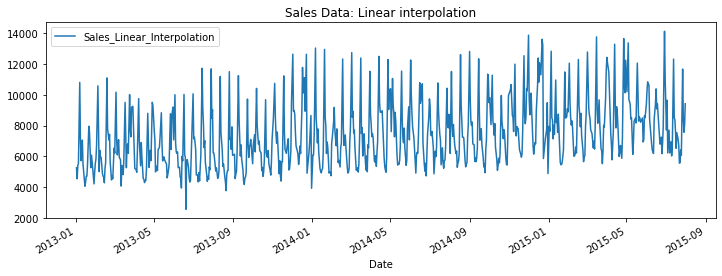

In [436]:
# FIll Missing with Linear Interpolation Doe Sales col
data = data.assign(Sales_Linear_Interpolation=data.Sales.interpolate(method='linear'))
data[['Sales_Linear_Interpolation']].plot(figsize=(12, 4))
plt.legend(loc='best')
plt.title('Sales Data: Linear interpolation')
plt.show(block=False)

In [437]:
data['Sales'] = data['Sales_Linear_Interpolation']
data.drop(columns=['Sales_Linear_Interpolation'],inplace=True)

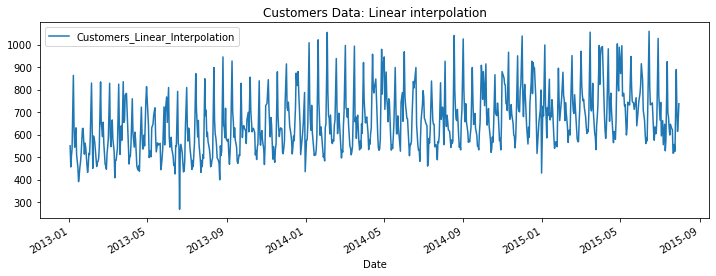

In [438]:
# FIll Missing with Linear Interpolation for Customers col
data = data.assign(Customers_Linear_Interpolation=data.Customers.interpolate(method='linear'))
data[['Customers_Linear_Interpolation']].plot(figsize=(12, 4))
plt.legend(loc='best')
plt.title('Customers Data: Linear interpolation')
plt.show(block=False)

In [439]:
# Replace with the Linear interpolated values
data['Customers'] = data['Customers_Linear_Interpolation']
data.drop(columns=['Customers_Linear_Interpolation'],inplace=True)

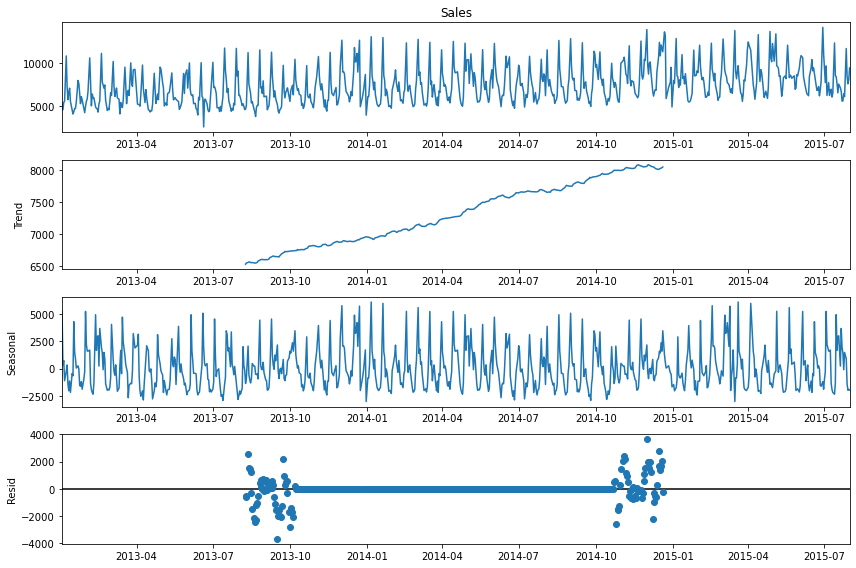

In [440]:
# Time series Decomposition
from pylab import rcParams
import statsmodels.api as sm
rcParams['figure.figsize'] = 12, 8
decomposition = sm.tsa.seasonal_decompose(data['Sales'], model='additive', freq=365) # additive seasonal index
fig = decomposition.plot()
    
plt.show()

#### Clearly, shows seasonality based on the three graphs drawn for the three stores but no trend.

## Split time series data into training and test keeping 36 rows for test (6 weeks)

In [441]:
data.head()
print("Number of Rows in DS 1:", len(data))

Number of Rows in DS 1: 779


In [442]:
# Leave last 36 for forecast, 6 weeks = 42 days minus 6 Sundays == 36
test_len = 36
train_len = len(data) - test_len
print(train_len)

743


In [443]:
# Set inferred freq
data.index.freq = data.index.inferred_freq
train = data.iloc[0:train_len, :]
test = data.iloc[train_len:,:]

In [444]:
train[endog_vars].head()

,Sales,Customers
Date,,
2013-01-02,5269.0,550.0
2013-01-03,4554.0,456.0
2013-01-04,5411.0,505.0
2013-01-05,5564.0,537.0
2013-01-07,10796.0,863.0


In [445]:
train[exog_vars].head()

,Promo,DayOfWeek,SchoolHoliday
Date,,,
2013-01-02,0,3,1
2013-01-03,0,4,1
2013-01-04,0,5,1
2013-01-05,0,6,0
2013-01-07,1,1,0


# Auto Regressive methods

## Stationarity vs non-stationary time series

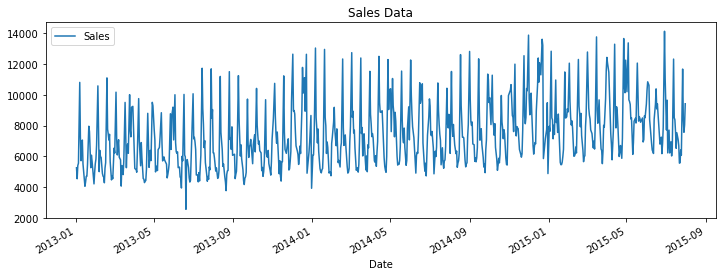

In [446]:
data['Sales'].plot(figsize=(12, 4))
plt.legend(loc='best')
plt.title('Sales Data')
plt.show(block=False)

### Augmented Dickey-Fuller (ADF) test

In [447]:
from statsmodels.tsa.stattools import adfuller
adf_test = adfuller(data['Sales'])

print('ADF Statistic: %f' % adf_test[0])
print('Critical Values @ 0.05: %.2f' % adf_test[4]['5%'])
print('p-value: %f' % adf_test[1])

ADF Statistic: -2.818874
Critical Values @ 0.05: -2.87
p-value: 0.055628


### The p-value is 0.003 way under than 0.05 and so according to ADF the series is Stationary

### Kwiatkowski-Phillips-Schmidt-Shin (KPSS) test

In [448]:
from statsmodels.tsa.stattools import kpss
kpss_test = kpss(data['Sales'])

print('KPSS Statistic: %f' % kpss_test[0])
print('Critical Values @ 0.05: %.2f' % kpss_test[3]['5%'])
print('p-value: %f' % kpss_test[1])

KPSS Statistic: 2.746007
Critical Values @ 0.05: 0.46
p-value: 0.010000


/Users/venkir/opt/anaconda3/lib/python3.9/site-packages/statsmodels/tsa/stattools.py:1906: InterpolationWarning: The test statistic is outside of the range of p-values available in the
look-up table. The actual p-value is smaller than the p-value returned.

  warnings.warn(


### The p-value is 0.1 is higher than 0.05 and so according to KPSS the series is Stationary. 

### Autocorrelation function (ACF) and PACF as subplots

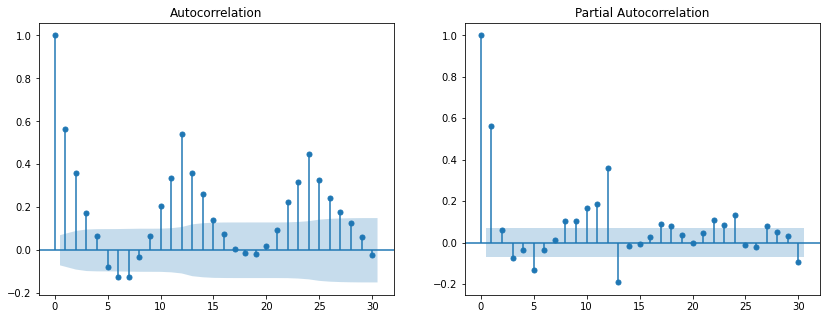

In [449]:
from statsmodels.graphics.tsaplots import plot_acf
from statsmodels.graphics.tsaplots import plot_pacf

fig, ax = plt.subplots(1,2,figsize=(14,5))
sm.graphics.tsa.plot_acf(data['Sales'].squeeze(), lags=30, ax=ax[0])
sm.graphics.tsa.plot_pacf(data['Sales'].squeeze(), lags=30, ax=ax[1])
plt.show()

#### p = 1 and q = 1

## VAR Model

In [450]:
# Define endog vards and exog vars and scale Sales and Customers to same metric
#from sklearn.preprocessing import StandardScaler
#caler = StandardScaler()
#train[endog_vars] = scaler.fit_transform(train[endog_vars]) # for train data
#test[endog_vars] = scaler.fit_transform(test[endog_vars]) # for test data

In [451]:
# Check and see if Scaling worked
train.head()

,Store,DayOfWeek,Sales,Customers,Open,Promo,SchoolHoliday
Date,,,,,,,
2013-01-02,29,3,5269.0,550.0,1,0,1
2013-01-03,29,4,4554.0,456.0,1,0,1
2013-01-04,29,5,5411.0,505.0,1,0,1
2013-01-05,29,6,5564.0,537.0,1,0,0
2013-01-07,29,1,10796.0,863.0,1,1,0


In [452]:
#  Stationarity Test - ADF Test
for i in range(len(endog_vars)):
    print('\n' + endog_vars[i] + ': ADF test results:')
    result = adfuller(data[endog_vars[i]].dropna())
    print('ADF Statistic: %f' % result[0])
    print('p-value: %f' % result[1])
    print('Critical Values:')
    for key, value in result[4].items():
        if key=='5%':
            print('\t%s: %.3f' % (key, value))


Sales: ADF test results:
ADF Statistic: -2.818874
p-value: 0.055628
Critical Values:
	5%: -2.865

Customers: ADF test results:
ADF Statistic: -3.856669
p-value: 0.002378
Critical Values:
	5%: -2.865


In [453]:
# VAR does not need exog vars
mod = sm.tsa.VARMAX(train[endog_vars], order=(2,1), trend='n') # p = 1 and q = 1
res = mod.fit(maxiter=1000, disp=False)
print(res.summary())
#Note the AIC value - lower AIC => better model

/Users/venkir/opt/anaconda3/lib/python3.9/site-packages/statsmodels/tsa/statespace/varmax.py:161: EstimationWarning: Estimation of VARMA(p,q) models is not generically robust, due especially to identification issues.
  warn('Estimation of VARMA(p,q) models is not generically robust,'
/Users/venkir/opt/anaconda3/lib/python3.9/site-packages/statsmodels/tsa/base/tsa_model.py:581: ValueWarning: A date index has been provided, but it has no associated frequency information and so will be ignored when e.g. forecasting.
  warnings.warn('A date index has been provided, but it has no'


                             Statespace Model Results                             
Dep. Variable:     ['Sales', 'Customers']   No. Observations:                  743
Model:                         VARMA(2,1)   Log Likelihood              -10334.577
Date:                    Mon, 17 Jan 2022   AIC                          20699.155
Time:                            13:23:17   BIC                          20768.315
Sample:                                 0   HQIC                         20725.815
                                    - 743                                         
Covariance Type:                      opg                                         
Ljung-Box (L1) (Q):             5.28, 0.00   Jarque-Bera (JB):     321.25, 31228.87
Prob(Q):                        0.02, 0.97   Prob(JB):                   0.00, 0.00
Heteroskedasticity (H):         1.20, 3.49   Skew:                      1.25, -0.63
Prob(H) (two-sided):            0.15, 0.00   Kurtosis:                  5.03, 34.74


In [454]:
predictions = res.forecast(steps=test_len, exog=test[exog_vars])
predictions['Date'] = test.index
predictions = predictions.set_index('Date')

/Users/venkir/opt/anaconda3/lib/python3.9/site-packages/statsmodels/tsa/base/tsa_model.py:376: ValueWarning: No supported index is available. Prediction results will be given with an integer index beginning at `start`.
  warnings.warn('No supported index is available.'


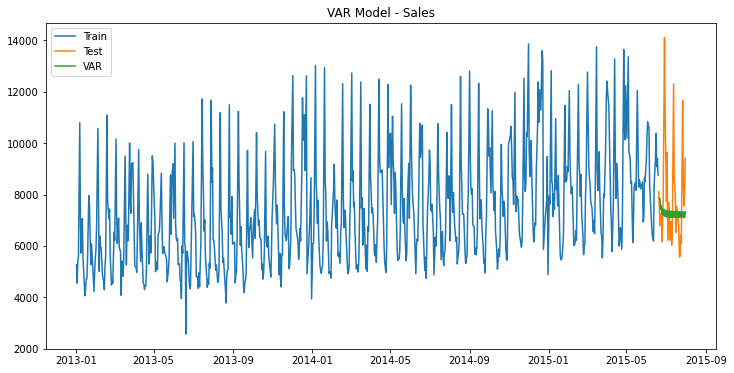

In [455]:
plt.figure(figsize=(12,6))
plt.plot(train['Sales'], label='Train')
plt.plot(test['Sales'], label='Test')
plt.plot(predictions['Sales'], label='VAR')
plt.legend(loc='best')
plt.title('VAR Model - Sales')
plt.show()

In [456]:
# Root Mean Square Error (RMSE)
rmse = np.sqrt(mean_squared_error(test.Sales, predictions.Sales)).round(2)

model_comparison=pd.DataFrame()
model_comparison.loc[0,'Model']='VAR'
model_comparison.loc[0,'Variable']='Sales'
model_comparison.loc[0,'RMSE']=rmse

rmse = np.sqrt(mean_squared_error(test.Customers, predictions.Customers)).round(2)
#print('Investment: RMSE:',  rmse)

append=pd.DataFrame()
append.loc[0,'Model']='VAR'
append.loc[0,'Variable']='Customers'
append.loc[0,'RMSE']=rmse

model_comparison = model_comparison.append(append)

# Mean Absolute Percentage Error
abs_error = np.abs(test.Sales-predictions.Sales)
actual = test.Sales
mape = np.round(np.mean(abs_error/actual)*100, 2)

model_comparison.loc[model_comparison['Variable']=='Sales', 'MAPE'] = mape

abs_error = np.abs(test.Customers-predictions.Customers)
actual = test.Customers
mape = np.round(np.mean(abs_error/actual)*100, 2)
#print('Investment: MAPE:',  mape)

model_comparison.loc[model_comparison['Variable']=='Customers', 'MAPE'] = mape

In [457]:
model_comparison.reset_index(drop=True, inplace=True)
#model_comparison

In [458]:
# Display concatenated Diplay of rrmse and mape errors
results_display = model_comparison.copy()
results_display

,Model,Variable,RMSE,MAPE
0,VAR,Sales,1969.26,15.51
1,VAR,Customers,108.18,11.78


In [459]:
from statsmodels.tsa.api import VAR
from statsmodels.tsa.base import  datetools
var = VAR(data[endog_vars])

x= var.select_order()
x.summary()

/Users/venkir/opt/anaconda3/lib/python3.9/site-packages/statsmodels/tsa/base/tsa_model.py:581: ValueWarning: A date index has been provided, but it has no associated frequency information and so will be ignored when e.g. forecasting.
  warnings.warn('A date index has been provided, but it has no'


,AIC,BIC,FPE,HQIC
0,22.60,22.61,6.538e+09,22.61
1,22.15,22.19,4.172e+09,22.17
2,22.15,22.21,4.179e+09,22.18
3,22.15,22.24,4.167e+09,22.18
4,22.14,22.25,4.141e+09,22.19
5,22.09,22.23,3.938e+09,22.15
6,22.08,22.24,3.879e+09,22.14
7,22.08,22.26,3.882e+09,22.15
8,22.07,22.28,3.848e+09,22.15
9,22.06,22.29,3.791e+09,22.15


In [460]:
"""
    Johansen cointegration test of the cointegration rank of a VECM

    Parameters
    ----------
    endog : array_like (nobs_tot x neqs)
        Data to test
    det_order : int
        * -1 - no deterministic terms - model1
        * 0 - constant term - model3
        * 1 - linear trend
    k_ar_diff : int, nonnegative
        Number of lagged differences in the model.
"""

def joh_output(res):
    output = pd.DataFrame([res.lr2,res.lr1],
                          index=['max_eig_stat',"trace_stat"])
    print(output.T,'\n')
    print("Critical values(90%, 95%, 99%) of max_eig_stat\n",res.cvm,'\n')
    print("Critical values(90%, 95%, 99%) of trace_stat\n",res.cvt,'\n')

In [461]:
joh_model1 = coint_johansen(data[endog_vars],-1,1) # k_ar_diff +1 = K
joh_output(joh_model1)

   max_eig_stat  trace_stat
0    154.652369  157.391993
1      2.739624    2.739624 

Critical values(90%, 95%, 99%) of max_eig_stat
 [[ 9.4748 11.2246 15.0923]
 [ 2.9762  4.1296  6.9406]] 

Critical values(90%, 95%, 99%) of trace_stat
 [[10.4741 12.3212 16.364 ]
 [ 2.9762  4.1296  6.9406]] 



In [462]:
from statsmodels.tsa.vector_ar.vecm import select_coint_rank
rank=select_coint_rank(data[endog_vars],-1,1)
print(rank.rank)
#result=stt.coint(endog['Sales'], endog['Customers'])

1


**These two Series Sales and Customers are COINTEGRATED because the rank = 1**

In [463]:
# use fit = 13
results = var.fit(13)
#We can check the summary of the model by.
results.summary()

  Summary of Regression Results   
Model:                         VAR
Method:                        OLS
Date:           Mon, 17, Jan, 2022
Time:                     13:23:17
--------------------------------------------------------------------
No. of Equations:         2.00000    BIC:                    22.0859
Nobs:                     766.000    HQIC:                   21.8847
Log likelihood:          -10453.4    FPE:                2.81653e+09
AIC:                      21.7587    Det(Omega_mle):     2.62800e+09
--------------------------------------------------------------------
Results for equation Sales
                   coefficient       std. error           t-stat            prob
--------------------------------------------------------------------------------
const               378.806825       690.423763            0.549           0.583
L1.Sales              0.349333         0.092939            3.759           0.000
L1.Customers          1.854987         1.499292            1

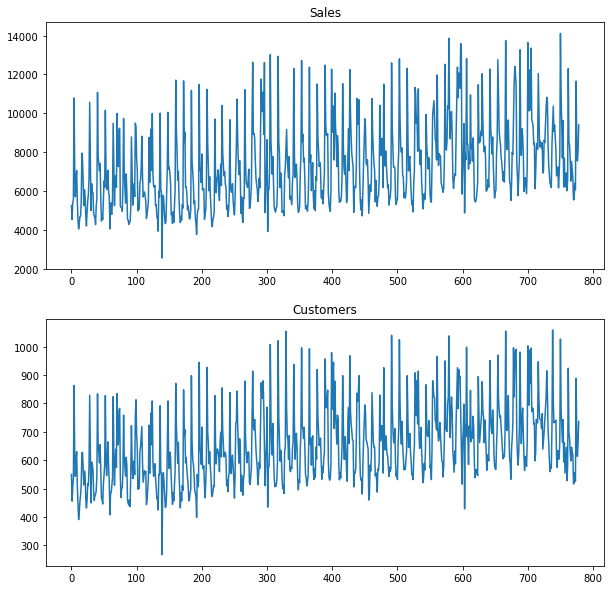

In [464]:
#Visualizing the input:
results.plot();

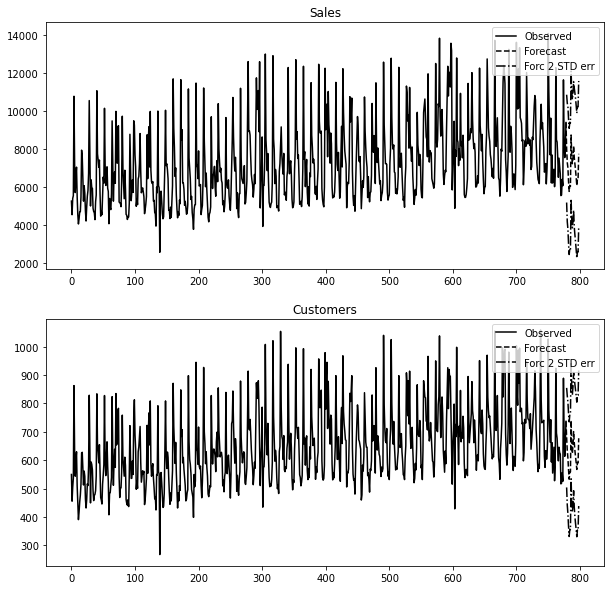

In [465]:
#We can also plot our forecasted values by the model.

results.plot_forecast(20);

### VARMAX Model

In [466]:
from statsmodels.tsa.api import VARMAX
mod = sm.tsa.VARMAX(data[endog_vars], order=(2,1), trend='n', exog=data[exog_vars])
res = mod.fit(maxiter=1000, disp=False)
print(res.summary())

/Users/venkir/opt/anaconda3/lib/python3.9/site-packages/statsmodels/tsa/statespace/varmax.py:161: EstimationWarning: Estimation of VARMA(p,q) models is not generically robust, due especially to identification issues.
  warn('Estimation of VARMA(p,q) models is not generically robust,'
/Users/venkir/opt/anaconda3/lib/python3.9/site-packages/statsmodels/tsa/base/tsa_model.py:581: ValueWarning: A date index has been provided, but it has no associated frequency information and so will be ignored when e.g. forecasting.
  warnings.warn('A date index has been provided, but it has no'
/Users/venkir/opt/anaconda3/lib/python3.9/site-packages/statsmodels/base/model.py:566: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "


                             Statespace Model Results                             
Dep. Variable:     ['Sales', 'Customers']   No. Observations:                  779
Model:                        VARMAX(2,1)   Log Likelihood              -10844.506
Date:                    Mon, 17 Jan 2022   AIC                          21731.013
Time:                            13:23:53   BIC                          21828.831
Sample:                                 0   HQIC                         21768.637
                                    - 779                                         
Covariance Type:                      opg                                         
Ljung-Box (L1) (Q):            14.16, 1.48   Jarque-Bera (JB):     187.30, 24710.59
Prob(Q):                        0.00, 0.22   Prob(JB):                   0.00, 0.00
Heteroskedasticity (H):         1.11, 2.88   Skew:                      0.90, -0.04
Prob(H) (two-sided):            0.42, 0.00   Kurtosis:                  4.59, 30.59


In [467]:
predictions = res.forecast(steps=test_len, exog=test[exog_vars])
predictions['Date'] = test.index
predictions = predictions.set_index('Date')

/Users/venkir/opt/anaconda3/lib/python3.9/site-packages/statsmodels/tsa/statespace/varmax.py:161: EstimationWarning: Estimation of VARMA(p,q) models is not generically robust, due especially to identification issues.
  warn('Estimation of VARMA(p,q) models is not generically robust,'
/Users/venkir/opt/anaconda3/lib/python3.9/site-packages/statsmodels/tsa/base/tsa_model.py:376: ValueWarning: No supported index is available. Prediction results will be given with an integer index beginning at `start`.
  warnings.warn('No supported index is available.'
/Users/venkir/opt/anaconda3/lib/python3.9/site-packages/statsmodels/tsa/statespace/varmax.py:161: EstimationWarning: Estimation of VARMA(p,q) models is not generically robust, due especially to identification issues.
  warn('Estimation of VARMA(p,q) models is not generically robust,'


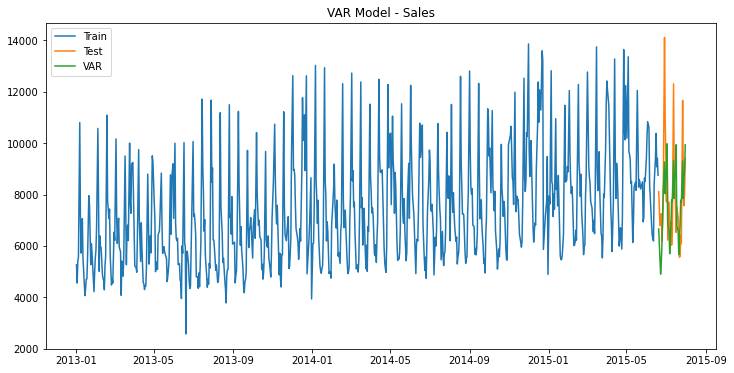

In [468]:
plt.figure(figsize=(12,6))
plt.plot(train['Sales'], label='Train')
plt.plot(test['Sales'], label='Test')
plt.plot(predictions['Sales'], label='VAR')
plt.legend(loc='best')
plt.title('VAR Model - Sales')
plt.show()

In [469]:
# Root Mean Square Error (RMSE)
rmse = np.sqrt(mean_squared_error(test.Sales, predictions.Sales)).round(2)

model_comparison=pd.DataFrame()
model_comparison.loc[0,'Model']='VARMAX'
model_comparison.loc[0,'Variable']='Sales'
model_comparison.loc[0,'RMSE']=rmse

rmse = np.sqrt(mean_squared_error(test.Customers, predictions.Customers)).round(2)
#print('Investment: RMSE:',  rmse)

append=pd.DataFrame()
append.loc[0,'Model']='VARMAX'
append.loc[0,'Variable']='Customers'
append.loc[0,'RMSE']=rmse

model_comparison = model_comparison.append(append)

# Mean Absolute Percentage Error
abs_error = np.abs(test.Sales-predictions.Sales)
actual = test.Sales
mape = np.round(np.mean(abs_error/actual)*100, 2)

model_comparison.loc[model_comparison['Variable']=='Sales', 'MAPE'] = mape

abs_error = np.abs(test.Customers-predictions.Customers)
actual = test.Customers
mape = np.round(np.mean(abs_error/actual)*100, 2)
#print('Investment: MAPE:',  mape)

model_comparison.loc[model_comparison['Variable']=='Customers', 'MAPE'] = mape

In [470]:
model_comparison.reset_index(drop=True, inplace=True)
#model_comparison

In [471]:
results_display = pd.concat([results_display, model_comparison])
results_display

,Model,Variable,RMSE,MAPE
0,VAR,Sales,1969.26,15.51
1,VAR,Customers,108.18,11.78
0,VARMAX,Sales,1600.09,15.47
1,VARMAX,Customers,99.84,12.87


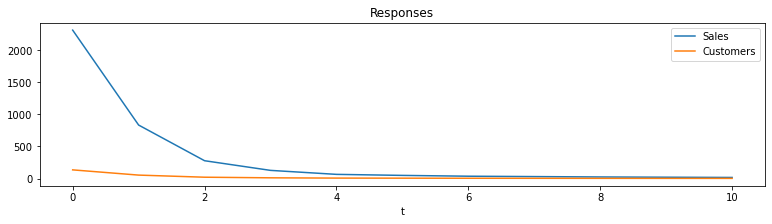

In [472]:
ax = res.impulse_responses(10, orthogonalized=True, impulse=[1, 0]).plot(figsize=(13,3))
ax.set(xlabel='t', title='Responses');

### SARIMAX Model for Sales

In [473]:
model=sm.tsa.statespace.SARIMAX(data['Sales'],order=(1, 1, 1),seasonal_order=(1,0,1,12), exog=data[exog_vars])
results=model.fit()
print(model_fit.params)

/Users/venkir/opt/anaconda3/lib/python3.9/site-packages/statsmodels/tsa/base/tsa_model.py:581: ValueWarning: A date index has been provided, but it has no associated frequency information and so will be ignored when e.g. forecasting.
  warnings.warn('A date index has been provided, but it has no'
/Users/venkir/opt/anaconda3/lib/python3.9/site-packages/statsmodels/tsa/base/tsa_model.py:581: ValueWarning: A date index has been provided, but it has no associated frequency information and so will be ignored when e.g. forecasting.
  warnings.warn('A date index has been provided, but it has no'
 This problem is unconstrained.


RUNNING THE L-BFGS-B CODE

           * * *

Machine precision = 2.220D-16
 N =            8     M =           10

At X0         0 variables are exactly at the bounds

At iterate    0    f=  9.27842D+00    |proj g|=  1.20427D+00

At iterate    5    f=  8.57857D+00    |proj g|=  1.97296D-02

At iterate   10    f=  8.56253D+00    |proj g|=  9.10147D-03

At iterate   15    f=  8.55695D+00    |proj g|=  7.77858D-04

At iterate   20    f=  8.55692D+00    |proj g|=  2.35340D-04

At iterate   25    f=  8.55516D+00    |proj g|=  1.02179D-02

At iterate   30    f=  8.54450D+00    |proj g|=  3.71982D-03

At iterate   35    f=  8.53402D+00    |proj g|=  1.35504D-02

At iterate   40    f=  8.53365D+00    |proj g|=  2.00952D-05

           * * *

Tit   = total number of iterations
Tnf   = total number of function evaluations
Tnint = total number of segments explored during Cauchy searches
Skip  = number of BFGS updates skipped
Nact  = number of active bounds at final generalized Cauchy point
Projg 

<AxesSubplot:title={'center':'SARIMAX Model - Sales'}, xlabel='Date'>

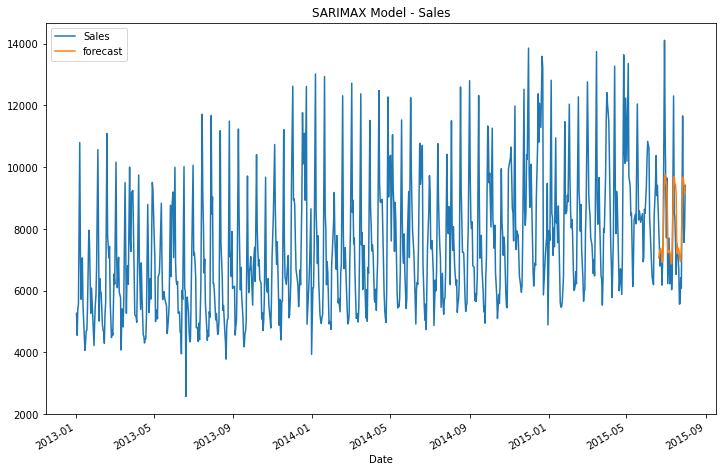

In [474]:
#Testing the fitted model.
data['forecast']=results.predict(start=test.index.min(),end=test.index.max(),dynamic=True)
data[['Sales','forecast']].plot(figsize=(12,8), title='SARIMAX Model - Sales')

In [475]:
rmse = np.sqrt(mean_squared_error(test['Sales'], data['forecast'][test.index.min():])).round(2)
mape = np.round(np.mean(np.abs(test['Sales']-data['forecast'][test.index.min():])/test['Sales'])*100,2)

tempResults = pd.DataFrame({'Model':['SARIMAX method'], 'Variable':['Sales'], 'RMSE': [rmse],'MAPE': [mape] })
#tempResults

In [476]:
results_display = pd.concat([results_display, tempResults])
results_display

,Model,Variable,RMSE,MAPE
0,VAR,Sales,1969.26,15.51
1,VAR,Customers,108.18,11.78
0,VARMAX,Sales,1600.09,15.47
1,VARMAX,Customers,99.84,12.87
0,SARIMAX method,Sales,1377.78,13.30


### SARIMAX Model for Customers

In [477]:
model=sm.tsa.statespace.SARIMAX(data['Customers'],order=(1, 1, 1),seasonal_order=(1,0,1,12), exog=data[exog_vars])
results=model.fit()
print(model_fit.params)

/Users/venkir/opt/anaconda3/lib/python3.9/site-packages/statsmodels/tsa/base/tsa_model.py:581: ValueWarning: A date index has been provided, but it has no associated frequency information and so will be ignored when e.g. forecasting.
  warnings.warn('A date index has been provided, but it has no'
/Users/venkir/opt/anaconda3/lib/python3.9/site-packages/statsmodels/tsa/base/tsa_model.py:581: ValueWarning: A date index has been provided, but it has no associated frequency information and so will be ignored when e.g. forecasting.
  warnings.warn('A date index has been provided, but it has no'
 This problem is unconstrained.


RUNNING THE L-BFGS-B CODE

           * * *

Machine precision = 2.220D-16
 N =            8     M =           10

At X0         0 variables are exactly at the bounds

At iterate    0    f=  5.95199D+00    |proj g|=  2.26556D-01

At iterate    5    f=  5.85105D+00    |proj g|=  7.47628D-02

At iterate   10    f=  5.80386D+00    |proj g|=  1.84066D-02

At iterate   15    f=  5.79274D+00    |proj g|=  2.95527D-03

At iterate   20    f=  5.78166D+00    |proj g|=  1.36537D-02

At iterate   25    f=  5.78008D+00    |proj g|=  6.39977D-04

At iterate   30    f=  5.78007D+00    |proj g|=  3.39009D-03

At iterate   35    f=  5.77131D+00    |proj g|=  3.00139D-02

At iterate   40    f=  5.76986D+00    |proj g|=  1.36508D-03

At iterate   45    f=  5.76871D+00    |proj g|=  1.68094D-02

At iterate   50    f=  5.76776D+00    |proj g|=  1.84389D-04

           * * *

Tit   = total number of iterations
Tnf   = total number of function evaluations
Tnint = total number of segments explored during Cau

/Users/venkir/opt/anaconda3/lib/python3.9/site-packages/statsmodels/base/model.py:566: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "


<AxesSubplot:title={'center':'SARIMAX Model - Customers'}, xlabel='Date'>

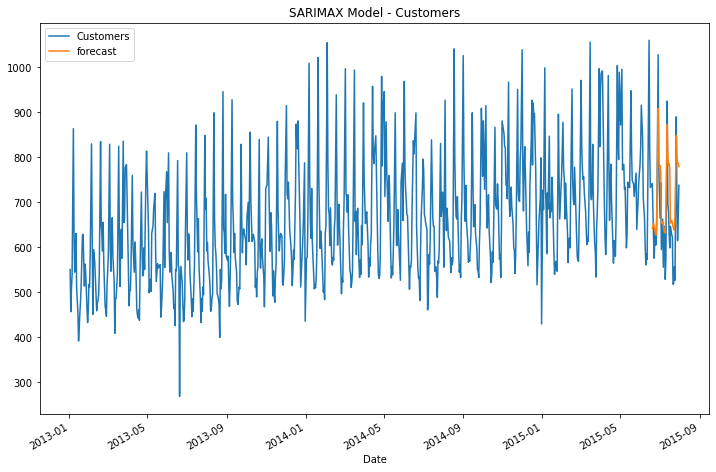

In [478]:
#Testing the fitted model.
data['forecast']=results.predict(start=test.index.min(),end=test.index.max(),dynamic=True)
data[['Customers','forecast']].plot(figsize=(12,8), title='SARIMAX Model - Customers')

In [479]:
rmse = np.sqrt(mean_squared_error(test['Customers'], data['forecast'][test.index.min():])).round(2)
mape = np.round(np.mean(np.abs(test['Customers']-data['forecast'][test.index.min():])/test['Sales'])*100,2)

tempResults = pd.DataFrame({'Model':['SARIMAX method'], 'Variable':['Customers'], 'RMSE': [rmse],'MAPE': [mape] })
#tempResults

In [480]:
results_display = pd.concat([results_display, tempResults])
results_display

,Model,Variable,RMSE,MAPE
0,VAR,Sales,1969.26,15.51
1,VAR,Customers,108.18,11.78
0,VARMAX,Sales,1600.09,15.47
1,VARMAX,Customers,99.84,12.87
0,SARIMAX method,Sales,1377.78,13.30
0,SARIMAX method,Customers,88.61,1.01


# Store 31

## Outlier detection for each Store as it affects each independently

### Box plot and interquartile range

In [481]:
data=data_store31.copy()
data = data.sort_index(ascending=True) # Sort of ascending time and date

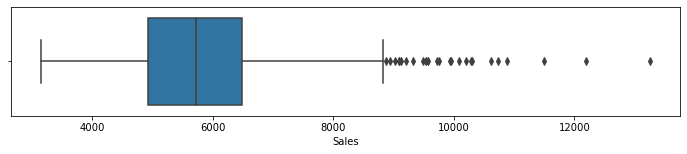

In [482]:
import seaborn as sns
fig = plt.subplots(figsize=(12, 2))
ax = sns.boxplot(x=data['Sales'],whis=1.5)

In [483]:
# Remove outliers for Sales, at 99% looks like we have many points
outlier_value = data['Sales'].quantile(0.99)
print(outlier_value)

10208.299999999996


In [484]:
# Update the outliers to NaN
data.Sales=data.Sales.where(data.Sales.between(0,outlier_value))
data['Sales'].describe()

count      776.000000
mean      5807.234536
std       1220.290478
min       3150.000000
25%       4912.250000
50%       5700.000000
75%       6470.000000
max      10193.000000
Name: Sales, dtype: float64

In [485]:
# Remove outliers for Customers, at 99% looks like we have many points
outlier_value = data['Customers'].quantile(0.99)
print(outlier_value)

887.6999999999996


In [486]:
# Update the outliers to NaN
data.Customers=data.Customers.where(data.Customers.between(0,outlier_value))
data['Customers'].describe()

count    776.000000
mean     581.873711
std       80.138071
min      363.000000
25%      528.000000
50%      574.000000
75%      625.250000
max      886.000000
Name: Customers, dtype: float64

### The NaN or Missing Values can be filled with Linear Interpolated values

#### Do for both the Sales and Customers Column

In [487]:
# Check for nulls in all columns
data.isnull().sum(axis = 0)

Store            0
DayOfWeek        0
Sales            8
Customers        8
Open             0
Promo            0
SchoolHoliday    0
dtype: int64

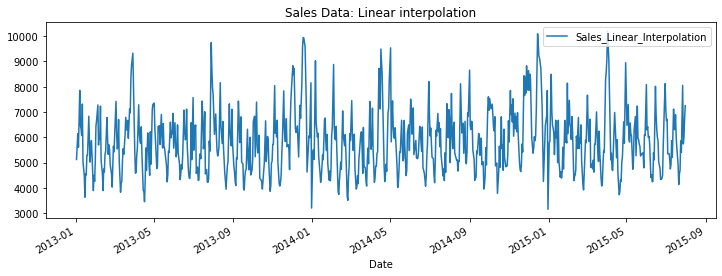

In [488]:
# FIll Missing with Linear Interpolation Doe Sales col
data = data.assign(Sales_Linear_Interpolation=data.Sales.interpolate(method='linear'))
data[['Sales_Linear_Interpolation']].plot(figsize=(12, 4))
plt.legend(loc='best')
plt.title('Sales Data: Linear interpolation')
plt.show(block=False)

In [489]:
data['Sales'] = data['Sales_Linear_Interpolation']
data.drop(columns=['Sales_Linear_Interpolation'],inplace=True)

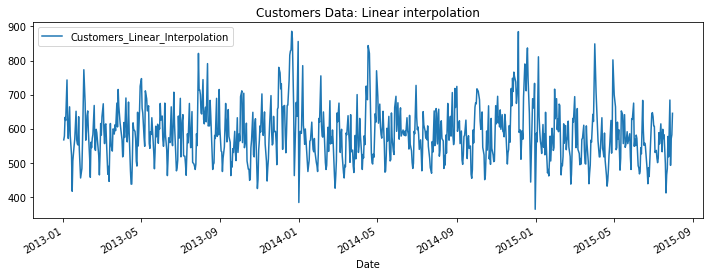

In [490]:
# FIll Missing with Linear Interpolation for Customers col
data = data.assign(Customers_Linear_Interpolation=data.Customers.interpolate(method='linear'))
data[['Customers_Linear_Interpolation']].plot(figsize=(12, 4))
plt.legend(loc='best')
plt.title('Customers Data: Linear interpolation')
plt.show(block=False)

In [491]:
# Replace with the Linear interpolated values
data['Customers'] = data['Customers_Linear_Interpolation']
data.drop(columns=['Customers_Linear_Interpolation'],inplace=True)

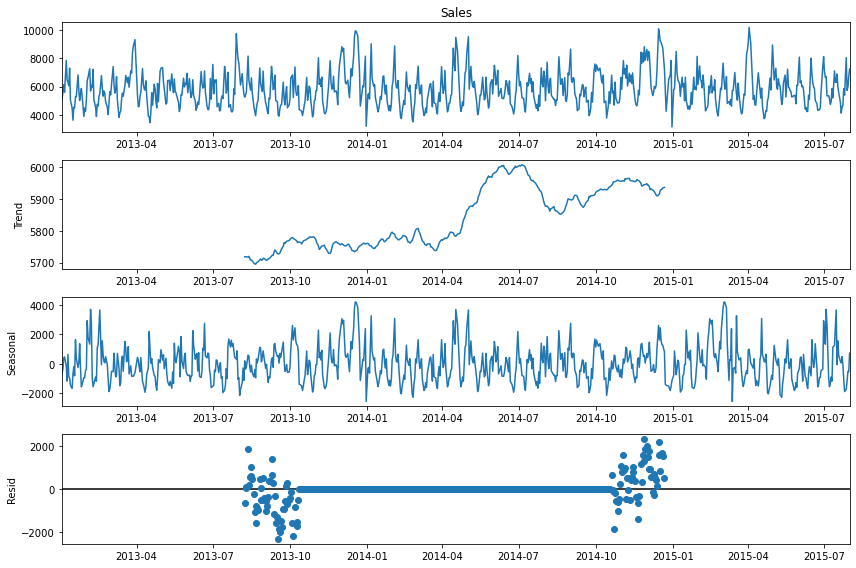

In [492]:
# Time series Decomposition
from pylab import rcParams
import statsmodels.api as sm
rcParams['figure.figsize'] = 12, 8
decomposition = sm.tsa.seasonal_decompose(data['Sales'], model='additive', freq=365) # additive seasonal index
fig = decomposition.plot()
    
plt.show()

#### Clearly, shows seasonality based on the three graphs drawn for the three stores but no trend.

## Split time series data into training and test keeping 36 rows for test (6 weeks)

In [493]:
data.head()
print("Number of Rows in DS 31:", len(data))

Number of Rows in DS 31: 784


In [494]:
# Leave last 36 for forecast, 6 weeks = 42 days minus 6 Sundays == 36
test_len = 36
train_len = len(data) - test_len
print(train_len)

748


In [495]:
# Set inferred freq
data.index.freq = data.index.inferred_freq
train = data.iloc[0:train_len, :]
test = data.iloc[train_len:,:]

In [496]:
train[endog_vars].head()

,Sales,Customers
Date,,
2013-01-02,5122.0,567.0
2013-01-03,5623.0,578.0
2013-01-04,6140.0,633.0
2013-01-05,5607.0,624.0
2013-01-07,7857.0,743.0


In [497]:
train[exog_vars].head()

,Promo,DayOfWeek,SchoolHoliday
Date,,,
2013-01-02,0,3,1
2013-01-03,0,4,1
2013-01-04,0,5,1
2013-01-05,0,6,0
2013-01-07,1,1,0


# Auto Regressive methods

## Stationarity vs non-stationary time series

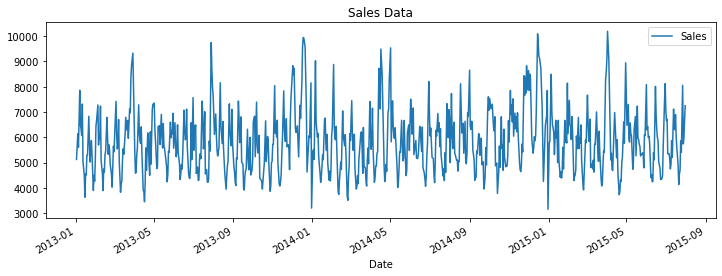

In [498]:
data['Sales'].plot(figsize=(12, 4))
plt.legend(loc='best')
plt.title('Sales Data')
plt.show(block=False)

### Augmented Dickey-Fuller (ADF) test

In [499]:
from statsmodels.tsa.stattools import adfuller
adf_test = adfuller(data['Sales'])

print('ADF Statistic: %f' % adf_test[0])
print('Critical Values @ 0.05: %.2f' % adf_test[4]['5%'])
print('p-value: %f' % adf_test[1])

ADF Statistic: -6.193851
Critical Values @ 0.05: -2.87
p-value: 0.000000


### The p-value is 0.003 way under than 0.05 and so according to ADF the series is Stationary

### Kwiatkowski-Phillips-Schmidt-Shin (KPSS) test

In [500]:
from statsmodels.tsa.stattools import kpss
kpss_test = kpss(data['Sales'])

print('KPSS Statistic: %f' % kpss_test[0])
print('Critical Values @ 0.05: %.2f' % kpss_test[3]['5%'])
print('p-value: %f' % kpss_test[1])

KPSS Statistic: 0.234769
Critical Values @ 0.05: 0.46
p-value: 0.100000


/Users/venkir/opt/anaconda3/lib/python3.9/site-packages/statsmodels/tsa/stattools.py:1910: InterpolationWarning: The test statistic is outside of the range of p-values available in the
look-up table. The actual p-value is greater than the p-value returned.

  warnings.warn(


### The p-value is 0.1 is higher than 0.05 and so according to KPSS the series is Stationary. 

### Autocorrelation function (ACF) and PACF as subplots

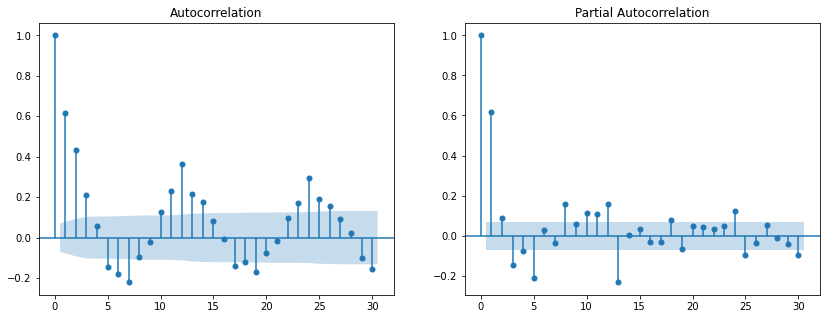

In [501]:
from statsmodels.graphics.tsaplots import plot_acf
from statsmodels.graphics.tsaplots import plot_pacf

fig, ax = plt.subplots(1,2,figsize=(14,5))
sm.graphics.tsa.plot_acf(data['Sales'].squeeze(), lags=30, ax=ax[0])
sm.graphics.tsa.plot_pacf(data['Sales'].squeeze(), lags=30, ax=ax[1])
plt.show()

#### p = 1 and q = 1

## VAR Model

In [502]:
# Define endog vards and exog vars and scale Sales and Customers to same metric
#from sklearn.preprocessing import StandardScaler
#caler = StandardScaler()
#train[endog_vars] = scaler.fit_transform(train[endog_vars]) # for train data
#test[endog_vars] = scaler.fit_transform(test[endog_vars]) # for test data

In [503]:
# Check and see if Scaling worked
train.head()

,Store,DayOfWeek,Sales,Customers,Open,Promo,SchoolHoliday
Date,,,,,,,
2013-01-02,31,3,5122.0,567.0,1,0,1
2013-01-03,31,4,5623.0,578.0,1,0,1
2013-01-04,31,5,6140.0,633.0,1,0,1
2013-01-05,31,6,5607.0,624.0,1,0,0
2013-01-07,31,1,7857.0,743.0,1,1,0


In [504]:
#  Stationarity Test - ADF Test
for i in range(len(endog_vars)):
    print('\n' + endog_vars[i] + ': ADF test results:')
    result = adfuller(data[endog_vars[i]].dropna())
    print('ADF Statistic: %f' % result[0])
    print('p-value: %f' % result[1])
    print('Critical Values:')
    for key, value in result[4].items():
        if key=='5%':
            print('\t%s: %.3f' % (key, value))


Sales: ADF test results:
ADF Statistic: -6.193851
p-value: 0.000000
Critical Values:
	5%: -2.865

Customers: ADF test results:
ADF Statistic: -5.951352
p-value: 0.000000
Critical Values:
	5%: -2.865


In [505]:
# VAR does not need exog vars
mod = sm.tsa.VARMAX(train[endog_vars], order=(2,1), trend='n') # p = 1 and q = 1
res = mod.fit(maxiter=1000, disp=False)
print(res.summary())
#Note the AIC value - lower AIC => better model

/Users/venkir/opt/anaconda3/lib/python3.9/site-packages/statsmodels/tsa/statespace/varmax.py:161: EstimationWarning: Estimation of VARMA(p,q) models is not generically robust, due especially to identification issues.
  warn('Estimation of VARMA(p,q) models is not generically robust,'
/Users/venkir/opt/anaconda3/lib/python3.9/site-packages/statsmodels/tsa/base/tsa_model.py:581: ValueWarning: A date index has been provided, but it has no associated frequency information and so will be ignored when e.g. forecasting.
  warnings.warn('A date index has been provided, but it has no'


                             Statespace Model Results                             
Dep. Variable:     ['Sales', 'Customers']   No. Observations:                  748
Model:                         VARMA(2,1)   Log Likelihood               -9898.802
Date:                    Mon, 17 Jan 2022   AIC                          19827.603
Time:                            13:24:03   BIC                          19896.864
Sample:                                 0   HQIC                         19854.294
                                    - 748                                         
Covariance Type:                      opg                                         
Ljung-Box (L1) (Q):             0.95, 0.07   Jarque-Bera (JB):        98.51, 413.53
Prob(Q):                        0.33, 0.79   Prob(JB):                   0.00, 0.00
Heteroskedasticity (H):         1.14, 1.05   Skew:                       0.17, 0.31
Prob(H) (two-sided):            0.30, 0.69   Kurtosis:                   4.74, 6.59


In [506]:
predictions = res.forecast(steps=test_len, exog=test[exog_vars])
predictions['Date'] = test.index
predictions = predictions.set_index('Date')

/Users/venkir/opt/anaconda3/lib/python3.9/site-packages/statsmodels/tsa/base/tsa_model.py:376: ValueWarning: No supported index is available. Prediction results will be given with an integer index beginning at `start`.
  warnings.warn('No supported index is available.'


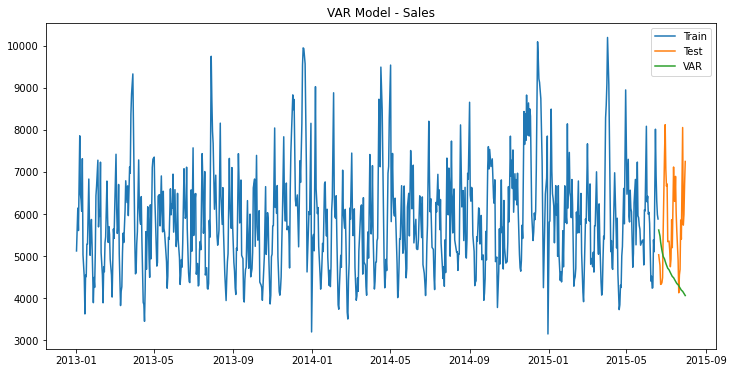

In [507]:
plt.figure(figsize=(12,6))
plt.plot(train['Sales'], label='Train')
plt.plot(test['Sales'], label='Test')
plt.plot(predictions['Sales'], label='VAR')
plt.legend(loc='best')
plt.title('VAR Model - Sales')
plt.show()

In [508]:
# Root Mean Square Error (RMSE)
rmse = np.sqrt(mean_squared_error(test.Sales, predictions.Sales)).round(2)

model_comparison=pd.DataFrame()
model_comparison.loc[0,'Model']='VAR'
model_comparison.loc[0,'Variable']='Sales'
model_comparison.loc[0,'RMSE']=rmse

rmse = np.sqrt(mean_squared_error(test.Customers, predictions.Customers)).round(2)
#print('Investment: RMSE:',  rmse)

append=pd.DataFrame()
append.loc[0,'Model']='VAR'
append.loc[0,'Variable']='Customers'
append.loc[0,'RMSE']=rmse

model_comparison = model_comparison.append(append)

# Mean Absolute Percentage Error
abs_error = np.abs(test.Sales-predictions.Sales)
actual = test.Sales
mape = np.round(np.mean(abs_error/actual)*100, 2)

model_comparison.loc[model_comparison['Variable']=='Sales', 'MAPE'] = mape

abs_error = np.abs(test.Customers-predictions.Customers)
actual = test.Customers
mape = np.round(np.mean(abs_error/actual)*100, 2)
#print('Investment: MAPE:',  mape)

model_comparison.loc[model_comparison['Variable']=='Customers', 'MAPE'] = mape

In [509]:
model_comparison.reset_index(drop=True, inplace=True)
#model_comparison

In [510]:
# Display concatenated Diplay of rrmse and mape errors
results_display = model_comparison.copy()
results_display

,Model,Variable,RMSE,MAPE
0,VAR,Sales,1698.14,22.46
1,VAR,Customers,106.67,15.76


In [511]:
from statsmodels.tsa.api import VAR
from statsmodels.tsa.base import  datetools
var = VAR(data[endog_vars])

x= var.select_order()
x.summary()

/Users/venkir/opt/anaconda3/lib/python3.9/site-packages/statsmodels/tsa/base/tsa_model.py:581: ValueWarning: A date index has been provided, but it has no associated frequency information and so will be ignored when e.g. forecasting.
  warnings.warn('A date index has been provided, but it has no'


,AIC,BIC,FPE,HQIC
0,21.34,21.35,1.850e+09,21.34
1,20.69,20.73,9.719e+08,20.71
2,20.70,20.76,9.726e+08,20.72
3,20.67,20.75,9.449e+08,20.70
4,20.61,20.72,8.922e+08,20.65
5,20.49,20.62*,7.889e+08,20.54
6,20.47,20.63,7.797e+08,20.54
7,20.48,20.66,7.835e+08,20.55
8,20.44,20.65,7.549e+08,20.52
9,20.44,20.67,7.529e+08,20.53


In [512]:
"""
    Johansen cointegration test of the cointegration rank of a VECM

    Parameters
    ----------
    endog : array_like (nobs_tot x neqs)
        Data to test
    det_order : int
        * -1 - no deterministic terms - model1
        * 0 - constant term - model3
        * 1 - linear trend
    k_ar_diff : int, nonnegative
        Number of lagged differences in the model.
"""

def joh_output(res):
    output = pd.DataFrame([res.lr2,res.lr1],
                          index=['max_eig_stat',"trace_stat"])
    print(output.T,'\n')
    print("Critical values(90%, 95%, 99%) of max_eig_stat\n",res.cvm,'\n')
    print("Critical values(90%, 95%, 99%) of trace_stat\n",res.cvt,'\n')

In [513]:
joh_model1 = coint_johansen(data[endog_vars],-1,1) # k_ar_diff +1 = K
joh_output(joh_model1)

   max_eig_stat  trace_stat
0    126.962692  128.624467
1      1.661775    1.661775 

Critical values(90%, 95%, 99%) of max_eig_stat
 [[ 9.4748 11.2246 15.0923]
 [ 2.9762  4.1296  6.9406]] 

Critical values(90%, 95%, 99%) of trace_stat
 [[10.4741 12.3212 16.364 ]
 [ 2.9762  4.1296  6.9406]] 



In [514]:
from statsmodels.tsa.vector_ar.vecm import select_coint_rank
rank=select_coint_rank(data[endog_vars],-1,1)
print(rank.rank)
#result=stt.coint(endog['Sales'], endog['Customers'])

1


**These two Series Sales and Customers are COINTEGRATED because the rank = 1**

In [515]:
# use fit = 13
results = var.fit(13)
#We can check the summary of the model by.
results.summary()

  Summary of Regression Results   
Model:                         VAR
Method:                        OLS
Date:           Mon, 17, Jan, 2022
Time:                     13:24:03
--------------------------------------------------------------------
No. of Equations:         2.00000    BIC:                    20.6682
Nobs:                     771.000    HQIC:                   20.4679
Log likelihood:          -9976.09    FPE:                6.83476e+08
AIC:                      20.3426    Det(Omega_mle):     6.38009e+08
--------------------------------------------------------------------
Results for equation Sales
                   coefficient       std. error           t-stat            prob
--------------------------------------------------------------------------------
const              2793.163457       577.706243            4.835           0.000
L1.Sales              0.450241         0.076993            5.848           0.000
L1.Customers          1.445737         1.100474            1

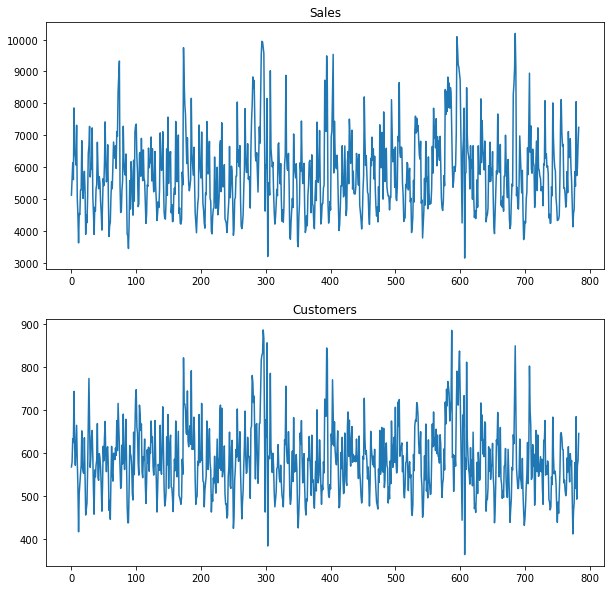

In [516]:
#Visualizing the input:
results.plot();

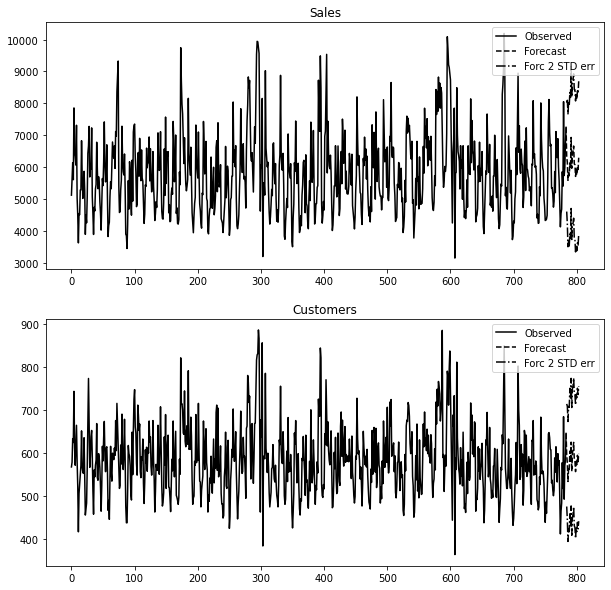

In [517]:
#We can also plot our forecasted values by the model.

results.plot_forecast(20);

### VARMAX Model

In [518]:
from statsmodels.tsa.api import VARMAX
mod = sm.tsa.VARMAX(data[endog_vars], order=(2,1), trend='n', exog=data[exog_vars])
res = mod.fit(maxiter=1000, disp=False)
print(res.summary())

/Users/venkir/opt/anaconda3/lib/python3.9/site-packages/statsmodels/tsa/statespace/varmax.py:161: EstimationWarning: Estimation of VARMA(p,q) models is not generically robust, due especially to identification issues.
  warn('Estimation of VARMA(p,q) models is not generically robust,'
/Users/venkir/opt/anaconda3/lib/python3.9/site-packages/statsmodels/tsa/base/tsa_model.py:581: ValueWarning: A date index has been provided, but it has no associated frequency information and so will be ignored when e.g. forecasting.
  warnings.warn('A date index has been provided, but it has no'
/Users/venkir/opt/anaconda3/lib/python3.9/site-packages/statsmodels/base/model.py:566: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "


                             Statespace Model Results                             
Dep. Variable:     ['Sales', 'Customers']   No. Observations:                  784
Model:                        VARMAX(2,1)   Log Likelihood              -10404.578
Date:                    Mon, 17 Jan 2022   AIC                          20851.156
Time:                            13:24:38   BIC                          20949.109
Sample:                                 0   HQIC                         20888.821
                                    - 784                                         
Covariance Type:                      opg                                         
Ljung-Box (L1) (Q):             0.12, 0.01   Jarque-Bera (JB):        98.24, 915.40
Prob(Q):                        0.73, 0.91   Prob(JB):                   0.00, 0.00
Heteroskedasticity (H):         1.21, 1.00   Skew:                       0.73, 0.29
Prob(H) (two-sided):            0.13, 0.99   Kurtosis:                   3.93, 8.26


In [519]:
predictions = res.forecast(steps=test_len, exog=test[exog_vars])
predictions['Date'] = test.index
predictions = predictions.set_index('Date')

/Users/venkir/opt/anaconda3/lib/python3.9/site-packages/statsmodels/tsa/statespace/varmax.py:161: EstimationWarning: Estimation of VARMA(p,q) models is not generically robust, due especially to identification issues.
  warn('Estimation of VARMA(p,q) models is not generically robust,'
/Users/venkir/opt/anaconda3/lib/python3.9/site-packages/statsmodels/tsa/base/tsa_model.py:376: ValueWarning: No supported index is available. Prediction results will be given with an integer index beginning at `start`.
  warnings.warn('No supported index is available.'
/Users/venkir/opt/anaconda3/lib/python3.9/site-packages/statsmodels/tsa/statespace/varmax.py:161: EstimationWarning: Estimation of VARMA(p,q) models is not generically robust, due especially to identification issues.
  warn('Estimation of VARMA(p,q) models is not generically robust,'


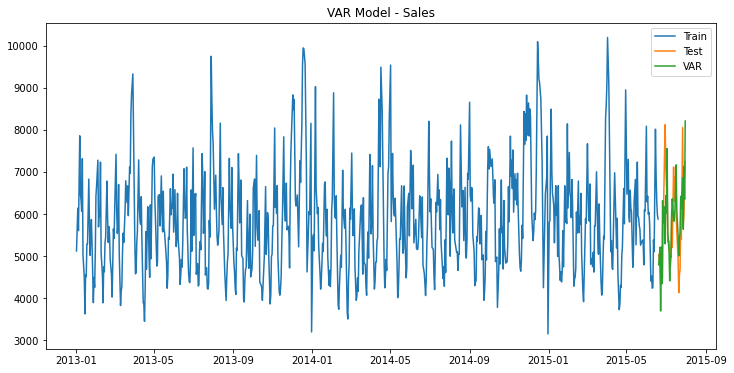

In [520]:
plt.figure(figsize=(12,6))
plt.plot(train['Sales'], label='Train')
plt.plot(test['Sales'], label='Test')
plt.plot(predictions['Sales'], label='VAR')
plt.legend(loc='best')
plt.title('VAR Model - Sales')
plt.show()

In [521]:
# Root Mean Square Error (RMSE)
rmse = np.sqrt(mean_squared_error(test.Sales, predictions.Sales)).round(2)

model_comparison=pd.DataFrame()
model_comparison.loc[0,'Model']='VARMAX'
model_comparison.loc[0,'Variable']='Sales'
model_comparison.loc[0,'RMSE']=rmse

rmse = np.sqrt(mean_squared_error(test.Customers, predictions.Customers)).round(2)
#print('Investment: RMSE:',  rmse)

append=pd.DataFrame()
append.loc[0,'Model']='VARMAX'
append.loc[0,'Variable']='Customers'
append.loc[0,'RMSE']=rmse

model_comparison = model_comparison.append(append)

# Mean Absolute Percentage Error
abs_error = np.abs(test.Sales-predictions.Sales)
actual = test.Sales
mape = np.round(np.mean(abs_error/actual)*100, 2)

model_comparison.loc[model_comparison['Variable']=='Sales', 'MAPE'] = mape

abs_error = np.abs(test.Customers-predictions.Customers)
actual = test.Customers
mape = np.round(np.mean(abs_error/actual)*100, 2)
#print('Investment: MAPE:',  mape)

model_comparison.loc[model_comparison['Variable']=='Customers', 'MAPE'] = mape

In [522]:
model_comparison.reset_index(drop=True, inplace=True)
#model_comparison

In [523]:
results_display = pd.concat([results_display, model_comparison])
results_display

,Model,Variable,RMSE,MAPE
0,VAR,Sales,1698.14,22.46
1,VAR,Customers,106.67,15.76
0,VARMAX,Sales,894.80,12.23
1,VARMAX,Customers,61.48,9.51


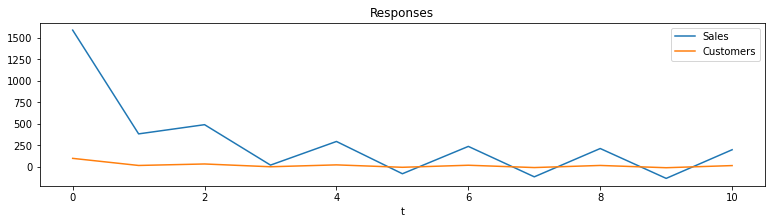

In [524]:
ax = res.impulse_responses(10, orthogonalized=True, impulse=[1, 0]).plot(figsize=(13,3))
ax.set(xlabel='t', title='Responses');

### SARIMAX Model for Sales

In [525]:
model=sm.tsa.statespace.SARIMAX(data['Sales'],order=(1, 1, 1),seasonal_order=(1,0,1,12), exog=data[exog_vars])
results=model.fit()
print(model_fit.params)

/Users/venkir/opt/anaconda3/lib/python3.9/site-packages/statsmodels/tsa/base/tsa_model.py:581: ValueWarning: A date index has been provided, but it has no associated frequency information and so will be ignored when e.g. forecasting.
  warnings.warn('A date index has been provided, but it has no'
/Users/venkir/opt/anaconda3/lib/python3.9/site-packages/statsmodels/tsa/base/tsa_model.py:581: ValueWarning: A date index has been provided, but it has no associated frequency information and so will be ignored when e.g. forecasting.
  warnings.warn('A date index has been provided, but it has no'
 This problem is unconstrained.


RUNNING THE L-BFGS-B CODE

           * * *

Machine precision = 2.220D-16
 N =            8     M =           10

At X0         0 variables are exactly at the bounds

At iterate    0    f=  8.78493D+00    |proj g|=  1.30127D+00

At iterate    5    f=  8.04109D+00    |proj g|=  4.93150D-02

At iterate   10    f=  8.03709D+00    |proj g|=  9.49230D-03

At iterate   15    f=  8.03275D+00    |proj g|=  1.17559D-02

At iterate   20    f=  8.03139D+00    |proj g|=  2.51020D-03

At iterate   25    f=  8.02793D+00    |proj g|=  2.14841D-02

At iterate   30    f=  8.02405D+00    |proj g|=  8.65075D-05

           * * *

Tit   = total number of iterations
Tnf   = total number of function evaluations
Tnint = total number of segments explored during Cauchy searches
Skip  = number of BFGS updates skipped
Nact  = number of active bounds at final generalized Cauchy point
Projg = norm of the final projected gradient
F     = final function value

           * * *

   N    Tit     Tnf  Tnint  Skip  Nac

<AxesSubplot:title={'center':'SARIMAX Model - Sales'}, xlabel='Date'>

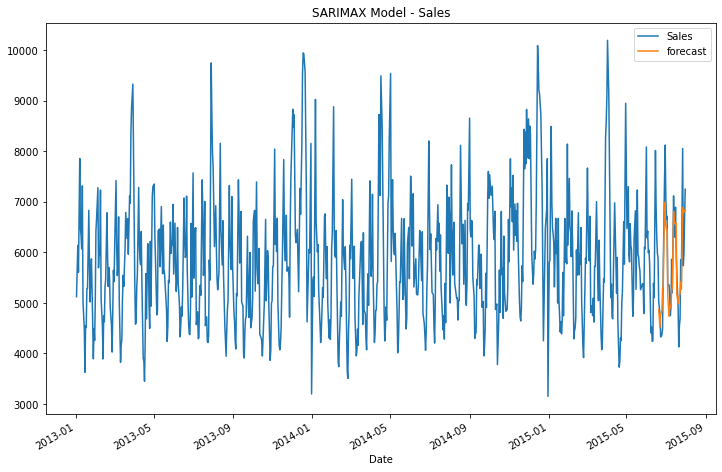

In [526]:
#Testing the fitted model.
data['forecast']=results.predict(start=test.index.min(),end=test.index.max(),dynamic=True)
data[['Sales','forecast']].plot(figsize=(12,8), title='SARIMAX Model - Sales')

In [527]:
rmse = np.sqrt(mean_squared_error(test['Sales'], data['forecast'][test.index.min():])).round(2)
mape = np.round(np.mean(np.abs(test['Sales']-data['forecast'][test.index.min():])/test['Sales'])*100,2)

tempResults = pd.DataFrame({'Model':['SARIMAX method'], 'Variable':['Sales'], 'RMSE': [rmse],'MAPE': [mape] })
#tempResults

In [528]:
results_display = pd.concat([results_display, tempResults])
results_display

,Model,Variable,RMSE,MAPE
0,VAR,Sales,1698.14,22.46
1,VAR,Customers,106.67,15.76
0,VARMAX,Sales,894.80,12.23
1,VARMAX,Customers,61.48,9.51
0,SARIMAX method,Sales,555.35,7.97


### SARIMAX Model for Customers

In [529]:
model=sm.tsa.statespace.SARIMAX(data['Customers'],order=(1, 1, 1),seasonal_order=(1,0,1,12), exog=data[exog_vars])
results=model.fit()
print(model_fit.params)

/Users/venkir/opt/anaconda3/lib/python3.9/site-packages/statsmodels/tsa/base/tsa_model.py:581: ValueWarning: A date index has been provided, but it has no associated frequency information and so will be ignored when e.g. forecasting.
  warnings.warn('A date index has been provided, but it has no'
/Users/venkir/opt/anaconda3/lib/python3.9/site-packages/statsmodels/tsa/base/tsa_model.py:581: ValueWarning: A date index has been provided, but it has no associated frequency information and so will be ignored when e.g. forecasting.
  warnings.warn('A date index has been provided, but it has no'
 This problem is unconstrained.


RUNNING THE L-BFGS-B CODE

           * * *

Machine precision = 2.220D-16
 N =            8     M =           10

At X0         0 variables are exactly at the bounds

At iterate    0    f=  6.24760D+00    |proj g|=  1.30720D+00

At iterate    5    f=  5.50691D+00    |proj g|=  1.74503D-02

At iterate   10    f=  5.50178D+00    |proj g|=  1.03451D-02

At iterate   15    f=  5.48626D+00    |proj g|=  6.53617D-03

At iterate   20    f=  5.48616D+00    |proj g|=  1.14489D-03

At iterate   25    f=  5.48576D+00    |proj g|=  5.79560D-04

At iterate   30    f=  5.48572D+00    |proj g|=  8.54965D-04

At iterate   35    f=  5.48485D+00    |proj g|=  6.98399D-03

At iterate   40    f=  5.48457D+00    |proj g|=  6.87931D-05

           * * *

Tit   = total number of iterations
Tnf   = total number of function evaluations
Tnint = total number of segments explored during Cauchy searches
Skip  = number of BFGS updates skipped
Nact  = number of active bounds at final generalized Cauchy point
Projg 

<AxesSubplot:title={'center':'SARIMAX Model - Customers'}, xlabel='Date'>

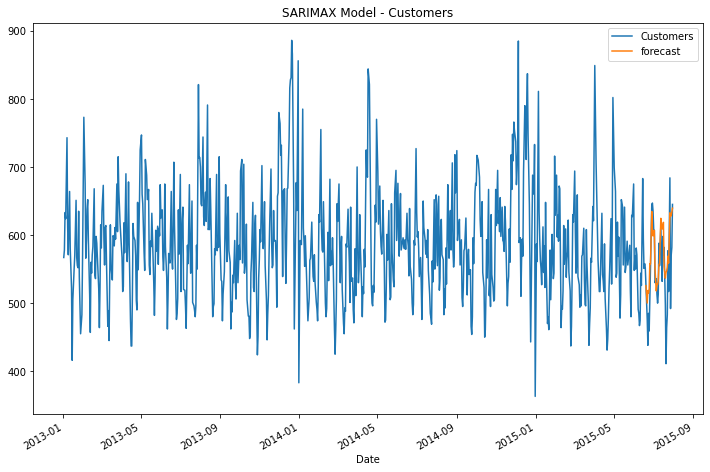

In [530]:
#Testing the fitted model.
data['forecast']=results.predict(start=test.index.min(),end=test.index.max(),dynamic=True)
data[['Customers','forecast']].plot(figsize=(12,8), title='SARIMAX Model - Customers')

In [531]:
rmse = np.sqrt(mean_squared_error(test['Customers'], data['forecast'][test.index.min():])).round(2)
mape = np.round(np.mean(np.abs(test['Customers']-data['forecast'][test.index.min():])/test['Sales'])*100,2)

tempResults = pd.DataFrame({'Model':['SARIMAX method'], 'Variable':['Customers'], 'RMSE': [rmse],'MAPE': [mape] })
#tempResults

In [532]:
results_display = pd.concat([results_display, tempResults])
results_display

,Model,Variable,RMSE,MAPE
0,VAR,Sales,1698.14,22.46
1,VAR,Customers,106.67,15.76
0,VARMAX,Sales,894.80,12.23
1,VARMAX,Customers,61.48,9.51
0,SARIMAX method,Sales,555.35,7.97
0,SARIMAX method,Customers,50.62,0.73


# Store 46

## Outlier detection for each Store as it affects each independently

### Box plot and interquartile range

In [533]:
start_store46_time = time.time()
data=data_store46.copy()
data = data.sort_index(ascending=True) # Sort of ascending time and date

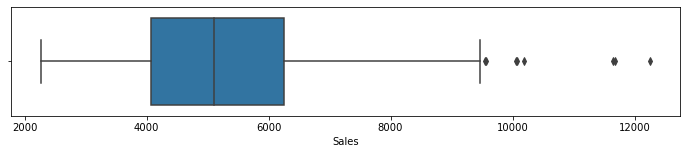

In [534]:
import seaborn as sns
fig = plt.subplots(figsize=(12, 2))
ax = sns.boxplot(x=data['Sales'],whis=1.5)

In [535]:
# Remove outliers for Sales, at 99% looks like we have many points
outlier_value = data['Sales'].quantile(0.99)
print(outlier_value)

9555.689999999999


In [536]:
# Update the outliers to NaN
data.Sales=data.Sales.where(data.Sales.between(0,outlier_value))
data['Sales'].describe()

count     615.000000
mean     5290.531707
std      1473.320743
min      2272.000000
25%      4054.500000
50%      5084.000000
75%      6206.500000
max      9547.000000
Name: Sales, dtype: float64

In [537]:
# Remove outliers for Customers, at 99% looks like we have many points
outlier_value = data['Customers'].quantile(0.99)
print(outlier_value)

994.7399999999998


In [538]:
# Update the outliers to NaN
data.Customers=data.Customers.where(data.Customers.between(0,outlier_value))
data['Customers'].describe()

count    615.000000
mean     656.136585
std      112.992177
min      362.000000
25%      560.500000
50%      655.000000
75%      721.500000
max      990.000000
Name: Customers, dtype: float64

### The NaN or Missing Values can be filled with Linear Interpolated values

#### Do for both the Sales and Customers Column

In [539]:
index_min = data.index.min()
index_max = data.index.max()
print('Min time stamp:', index_min)
print('Max time stamp:', index_max)
print('Number of daily rows should be:', index_max - index_min)

Min time stamp: 2013-01-02 00:00:00
Max time stamp: 2015-07-31 00:00:00
Number of daily rows should be: 940 days 00:00:00


In [540]:
print('Number of rows in data frame for store 46:', len(data))

Number of rows in data frame for store 46: 622


In [541]:
# FInd MISSING ROWS, seems to have a large GAP of 4 months
# Check to see if any time entries are missing between the start and the end date
# dates which are not in the sequence are returned
print(pd.date_range(
  start=index_min, end=index_max, freq='D').difference(data.index)) # D = Daily

DatetimeIndex(['2013-01-06', '2013-01-13', '2013-01-20', '2013-01-27',
               '2013-02-03', '2013-02-10', '2013-02-17', '2013-02-24',
               '2013-03-03', '2013-03-10',
               ...
               '2015-05-31', '2015-06-04', '2015-06-07', '2015-06-14',
               '2015-06-21', '2015-06-28', '2015-07-05', '2015-07-12',
               '2015-07-19', '2015-07-26'],
              dtype='datetime64[ns]', length=319, freq=None)


In [542]:
# Rows to fill
print('Difference =', 940 - 622)

Difference = 318


In [543]:
# fill in the missing time series date entries
df = data.copy()
df.head()

,Store,DayOfWeek,Sales,Customers,Open,Promo,SchoolHoliday
Date,,,,,,,
2013-01-02,46,3,4016.0,582.0,1,0,1
2013-01-03,46,4,4177.0,553.0,1,0,1
2013-01-04,46,5,4125.0,569.0,1,0,1
2013-01-05,46,6,4848.0,651.0,1,0,0
2013-01-07,46,1,7788.0,825.0,1,1,0


In [544]:
idx = pd.date_range(min(data.index), max(data.index), freq='D')
data = df.reindex(idx, fill_value=np.nan)

In [545]:
data.head()

,Store,DayOfWeek,Sales,Customers,Open,Promo,SchoolHoliday
2013-01-02,46.0,3.0,4016.0,582.0,1.0,0.0,1.0
2013-01-03,46.0,4.0,4177.0,553.0,1.0,0.0,1.0
2013-01-04,46.0,5.0,4125.0,569.0,1.0,0.0,1.0
2013-01-05,46.0,6.0,4848.0,651.0,1.0,0.0,0.0
2013-01-06,NaN,NaN,NaN,NaN,NaN,NaN,NaN


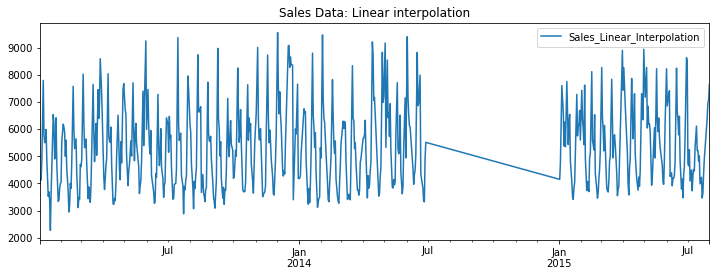

In [546]:
#data = df.copy()
# FIll Missing with Linear Interpolation Doe Sales col
data = data.assign(Sales_Linear_Interpolation=data.Sales.interpolate(method='linear'))
data[['Sales_Linear_Interpolation']].plot(figsize=(12, 4))
plt.legend(loc='best')
plt.title('Sales Data: Linear interpolation')
plt.show(block=False)

In [547]:
data['Sales'] = data['Sales_Linear_Interpolation']
data.drop(columns=['Sales_Linear_Interpolation'],inplace=True)

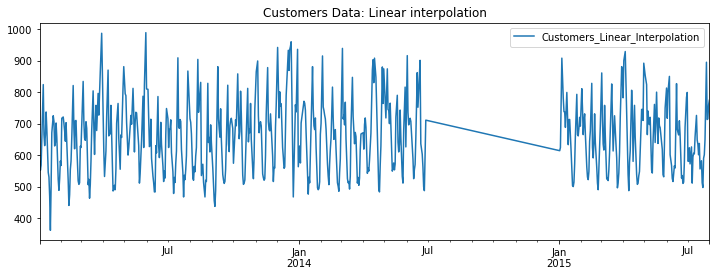

In [548]:
# FIll Missing with Linear Interpolation for Customers col
data = data.assign(Customers_Linear_Interpolation=data.Customers.interpolate(method='linear'))
data[['Customers_Linear_Interpolation']].plot(figsize=(12, 4))
plt.legend(loc='best')
plt.title('Customers Data: Linear interpolation')
plt.show(block=False)

In [549]:
data['Customers'] = data['Customers_Linear_Interpolation']
data.drop(columns=['Customers_Linear_Interpolation'],inplace=True)

In [550]:
# Forward fill the values for the exog columns
data = data.ffill().bfill(downcast='infer')

In [551]:
# See if interpolation worked
data.head(10)

,Store,DayOfWeek,Sales,Customers,Open,Promo,SchoolHoliday
2013-01-02,46,3,4016.0,582.0,1,0,1
2013-01-03,46,4,4177.0,553.0,1,0,1
2013-01-04,46,5,4125.0,569.0,1,0,1
2013-01-05,46,6,4848.0,651.0,1,0,0
2013-01-06,46,6,6318.0,738.0,1,0,0
2013-01-07,46,1,7788.0,825.0,1,1,0
2013-01-08,46,2,5793.0,666.0,1,1,0
2013-01-09,46,3,5501.0,631.0,1,1,0
2013-01-10,46,4,5503.0,665.0,1,1,0
2013-01-11,46,5,5985.0,738.0,1,1,0


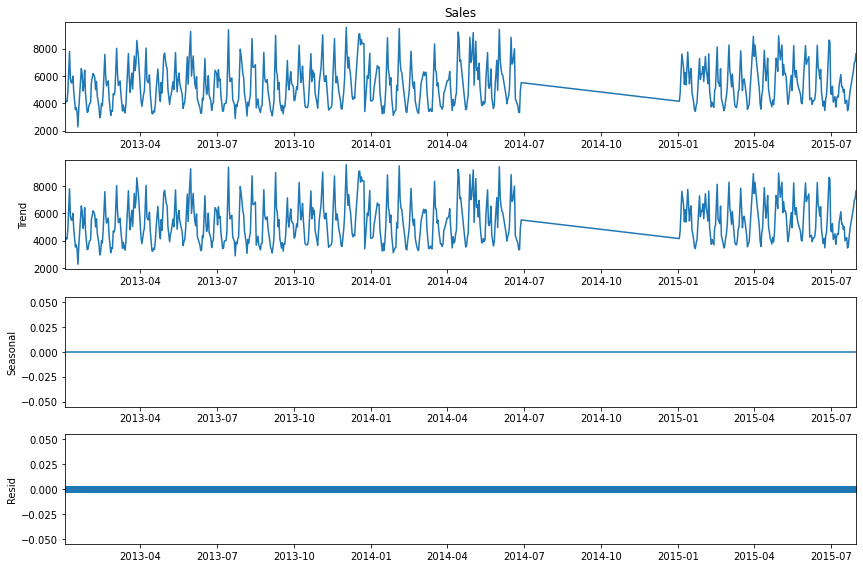

In [552]:
# Time series Decomposition
from pylab import rcParams
import statsmodels.api as sm
rcParams['figure.figsize'] = 12, 8
decomposition = sm.tsa.seasonal_decompose(data['Sales'], model='additive', period=1) # additive seasonal index
fig = decomposition.plot()
    
plt.show()

#### Clearly, shows seasonality based on the three graphs drawn for the three stores but no trend.

## Split time series data into training and test keeping 36 rows for test (6 weeks)

In [553]:
data.head()
print("Number of Rows in DS 13:", len(data))

Number of Rows in DS 13: 941


In [554]:
# Leave last 36 for forecast, 6 weeks = 42 days minus 6 Sundays == 36
test_len = 36
train_len = len(data) - test_len
print(train_len)

905


In [555]:
# Set inferred freq
data.index.freq = data.index.inferred_freq
train = data.iloc[0:train_len, :]
test = data.iloc[train_len:,:]

In [556]:
train[endog_vars].head()

,Sales,Customers
2013-01-02,4016.0,582.0
2013-01-03,4177.0,553.0
2013-01-04,4125.0,569.0
2013-01-05,4848.0,651.0
2013-01-06,6318.0,738.0


In [557]:
train[exog_vars].head()

,Promo,DayOfWeek,SchoolHoliday
2013-01-02,0,3,1
2013-01-03,0,4,1
2013-01-04,0,5,1
2013-01-05,0,6,0
2013-01-06,0,6,0


# Auto Regressive methods

## Stationarity vs non-stationary time series

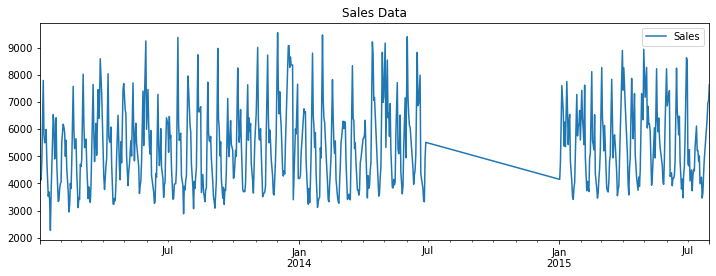

In [558]:
data['Sales'].plot(figsize=(12, 4))
plt.legend(loc='best')
plt.title('Sales Data')
plt.show(block=False)

### Augmented Dickey-Fuller (ADF) test

In [559]:
from statsmodels.tsa.stattools import adfuller
adf_test = adfuller(data['Sales'])

print('ADF Statistic: %f' % adf_test[0])
print('Critical Values @ 0.05: %.2f' % adf_test[4]['5%'])
print('p-value: %f' % adf_test[1])

ADF Statistic: -5.089202
Critical Values @ 0.05: -2.86
p-value: 0.000015


### The p-value is 0.03 way under than 0.05 and so according to ADF the series is Non-Stationary

### Kwiatkowski-Phillips-Schmidt-Shin (KPSS) test

In [560]:
from statsmodels.tsa.stattools import kpss
kpss_test = kpss(data['Sales'])

print('KPSS Statistic: %f' % kpss_test[0])
print('Critical Values @ 0.05: %.2f' % kpss_test[3]['5%'])
print('p-value: %f' % kpss_test[1])

KPSS Statistic: 0.116571
Critical Values @ 0.05: 0.46
p-value: 0.100000


/Users/venkir/opt/anaconda3/lib/python3.9/site-packages/statsmodels/tsa/stattools.py:1910: InterpolationWarning: The test statistic is outside of the range of p-values available in the
look-up table. The actual p-value is greater than the p-value returned.

  warnings.warn(


### The p-value is 0.01 is lower than 0.05 and so according to KPSS the series is non-Stationary. 

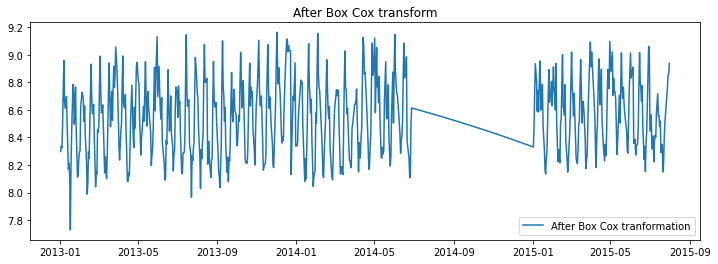

In [561]:
### Box Cox transformation to make variance constant
from scipy.stats import boxcox
data_boxcox = pd.Series(boxcox(data['Sales'], lmbda=0), index = data.index)

plt.figure(figsize=(12,4))
plt.plot(data_boxcox, label='After Box Cox tranformation')
plt.legend(loc='best')
plt.title('After Box Cox transform')
plt.show()

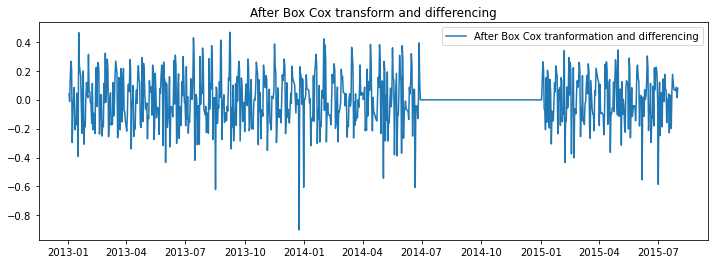

In [562]:
# Differencing
data_boxcox_diff = pd.Series(data_boxcox - data_boxcox.shift(), data.index)
plt.figure(figsize=(12,4))
plt.plot(data_boxcox_diff, label='After Box Cox tranformation and differencing')
plt.legend(loc='best')
plt.title('After Box Cox transform and differencing')
plt.show()

In [563]:
data_boxcox_diff.dropna(inplace=True)

### Autocorrelation function (ACF) and PACF as subplots

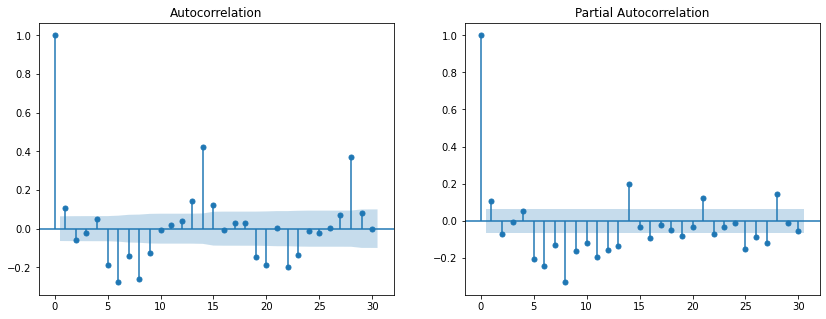

In [564]:
from statsmodels.graphics.tsaplots import plot_acf
from statsmodels.graphics.tsaplots import plot_pacf

fig, ax = plt.subplots(1,2,figsize=(14,5))
sm.graphics.tsa.plot_acf(data_boxcox_diff.squeeze(), lags=30, ax=ax[0])
sm.graphics.tsa.plot_pacf(data_boxcox_diff.squeeze(), lags=30, ax=ax[1])
plt.show()

#### p = 8 and q = 1

## VAR Model

In [565]:
#  Stationarity Test - ADF Test
for i in range(len(endog_vars)):
    print('\n' + endog_vars[i] + ': ADF test results:')
    result = adfuller(data[endog_vars[i]].dropna())
    print('ADF Statistic: %f' % result[0])
    print('p-value: %f' % result[1])
    print('Critical Values:')
    for key, value in result[4].items():
        if key=='5%':
            print('\t%s: %.3f' % (key, value))


Sales: ADF test results:
ADF Statistic: -5.089202
p-value: 0.000015
Critical Values:
	5%: -2.865

Customers: ADF test results:
ADF Statistic: -6.548910
p-value: 0.000000
Critical Values:
	5%: -2.865


In [566]:

# VAR does not need exog vars
mod = sm.tsa.VARMAX(train[endog_vars], order=(2,1), trend='n') # p = 1 and q = 14
res = mod.fit(maxiter=1000, disp=False)
print(res.summary())
#Note the AIC value - lower AIC => better model

/Users/venkir/opt/anaconda3/lib/python3.9/site-packages/statsmodels/tsa/statespace/varmax.py:161: EstimationWarning: Estimation of VARMA(p,q) models is not generically robust, due especially to identification issues.
  warn('Estimation of VARMA(p,q) models is not generically robust,'


                             Statespace Model Results                             
Dep. Variable:     ['Sales', 'Customers']   No. Observations:                  905
Model:                         VARMA(2,1)   Log Likelihood              -11740.147
Date:                    Mon, 17 Jan 2022   AIC                          23510.294
Time:                            13:24:58   BIC                          23582.413
Sample:                        01-02-2013   HQIC                         23537.836
                             - 06-25-2015                                         
Covariance Type:                      opg                                         
Ljung-Box (L1) (Q):             1.47, 1.25   Jarque-Bera (JB):        91.65, 841.97
Prob(Q):                        0.23, 0.26   Prob(JB):                   0.00, 0.00
Heteroskedasticity (H):         0.62, 0.73   Skew:                       0.36, 0.07
Prob(H) (two-sided):            0.00, 0.01   Kurtosis:                   4.38, 7.72


In [567]:
test_len=len(test.index)
test_len

36

In [568]:
predictions = res.forecast(steps=test_len, exog=test[exog_vars])
predictions['Date'] = test.index
predictions = predictions.set_index('Date')

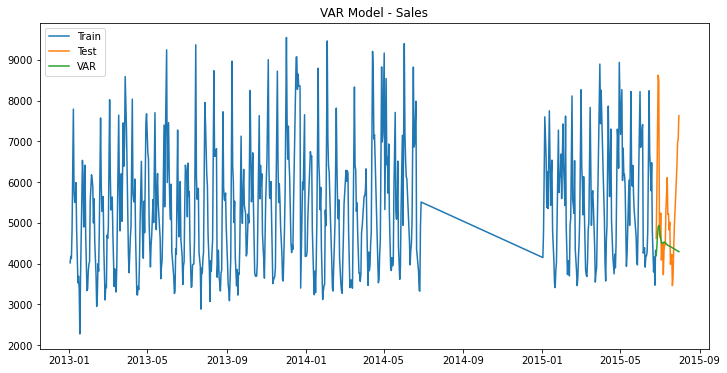

In [569]:
plt.figure(figsize=(12,6))
plt.plot(train['Sales'], label='Train')
plt.plot(test['Sales'], label='Test')
plt.plot(predictions['Sales'], label='VAR')
plt.legend(loc='best')
plt.title('VAR Model - Sales')
plt.show()

In [570]:
# Root Mean Square Error (RMSE)
rmse = np.sqrt(mean_squared_error(test.Sales, predictions.Sales)).round(2)

model_comparison=pd.DataFrame()
model_comparison.loc[0,'Model']='VAR'
model_comparison.loc[0,'Variable']='Sales'
model_comparison.loc[0,'RMSE']=rmse

rmse = np.sqrt(mean_squared_error(test.Customers, predictions.Customers)).round(2)
#print('Investment: RMSE:',  rmse)

append=pd.DataFrame()
append.loc[0,'Model']='VAR'
append.loc[0,'Variable']='Customers'
append.loc[0,'RMSE']=rmse

model_comparison = model_comparison.append(append)

# Mean Absolute Percentage Error
abs_error = np.abs(test.Sales-predictions.Sales)
actual = test.Sales
mape = np.round(np.mean(abs_error/actual)*100, 2)

model_comparison.loc[model_comparison['Variable']=='Sales', 'MAPE'] = mape

abs_error = np.abs(test.Customers-predictions.Customers)
actual = test.Customers
mape = np.round(np.mean(abs_error/actual)*100, 2)
#print('Investment: MAPE:',  mape)

model_comparison.loc[model_comparison['Variable']=='Customers', 'MAPE'] = mape

In [571]:
model_comparison.reset_index(drop=True, inplace=True)
#model_comparison

In [572]:
# Display concatenated Diplay of rrmse and mape errors
results_display = model_comparison.copy()
results_display

,Model,Variable,RMSE,MAPE
0,VAR,Sales,1490.14,17.43
1,VAR,Customers,127.26,13.95


In [573]:
from statsmodels.tsa.api import VAR
from statsmodels.tsa.base import  datetools
var = VAR(data[endog_vars])

x= var.select_order()
x.summary()

,AIC,BIC,FPE,HQIC
0,21.67,21.68,2.582e+09,21.68
1,20.42,20.45,7.398e+08,20.43
2,20.34,20.39,6.825e+08,20.36
3,20.32,20.39,6.651e+08,20.34
4,20.29,20.39,6.503e+08,20.33
5,20.16,20.28,5.696e+08,20.20
6,20.12,20.26,5.484e+08,20.17
7,20.10,20.26,5.378e+08,20.16
8,20.10,20.28,5.350e+08,20.17
9,20.04,20.24,5.036e+08,20.11


In [574]:
"""
    Johansen cointegration test of the cointegration rank of a VECM

    Parameters
    ----------
    endog : array_like (nobs_tot x neqs)
        Data to test
    det_order : int
        * -1 - no deterministic terms - model1
        * 0 - constant term - model3
        * 1 - linear trend
    k_ar_diff : int, nonnegative
        Number of lagged differences in the model.
"""

def joh_output(res):
    output = pd.DataFrame([res.lr2,res.lr1],
                          index=['max_eig_stat',"trace_stat"])
    print(output.T,'\n')
    print("Critical values(90%, 95%, 99%) of max_eig_stat\n",res.cvm,'\n')
    print("Critical values(90%, 95%, 99%) of trace_stat\n",res.cvt,'\n')

In [575]:
joh_model1 = coint_johansen(data[endog_vars],-1,1) # k_ar_diff +1 = K
joh_output(joh_model1)

   max_eig_stat  trace_stat
0    164.535303  166.652473
1      2.117170    2.117170 

Critical values(90%, 95%, 99%) of max_eig_stat
 [[ 9.4748 11.2246 15.0923]
 [ 2.9762  4.1296  6.9406]] 

Critical values(90%, 95%, 99%) of trace_stat
 [[10.4741 12.3212 16.364 ]
 [ 2.9762  4.1296  6.9406]] 



In [576]:
from statsmodels.tsa.vector_ar.vecm import select_coint_rank
rank=select_coint_rank(data[endog_vars],-1,1)
print(rank.rank)
#result=stt.coint(endog['Sales'], endog['Customers'])

1


**These two Series Sales and Customers are COINTEGRATED because the rank = 1**

In [577]:
# use fit = 20
results = var.fit(20)
#We can check the summary of the model by.
results.summary()

  Summary of Regression Results   
Model:                         VAR
Method:                        OLS
Date:           Mon, 17, Jan, 2022
Time:                     13:24:58
--------------------------------------------------------------------
No. of Equations:         2.00000    BIC:                    20.2911
Nobs:                     921.000    HQIC:                   20.0254
Log likelihood:          -11677.9    FPE:                4.22464e+08
AIC:                      19.8615    Det(Omega_mle):     3.87221e+08
--------------------------------------------------------------------
Results for equation Sales
                   coefficient       std. error           t-stat            prob
--------------------------------------------------------------------------------
const              1681.441597       504.634031            3.332           0.001
L1.Sales              0.530423         0.064154            8.268           0.000
L1.Customers          3.620099         0.838515            4

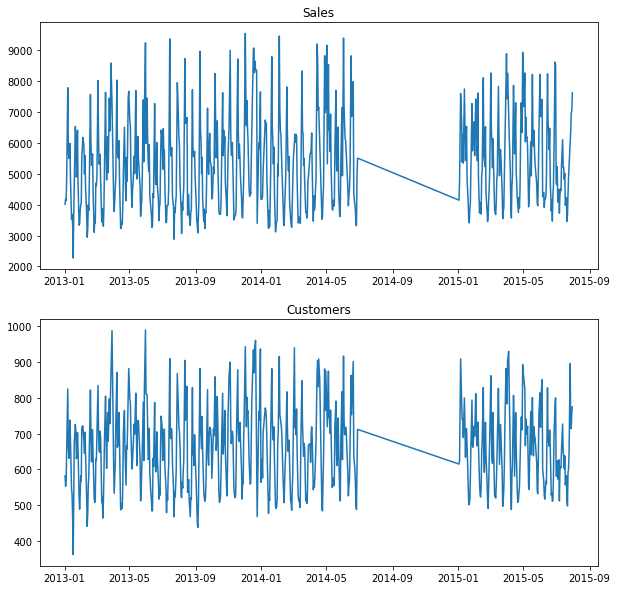

In [578]:
#Visualizing the input:
results.plot();

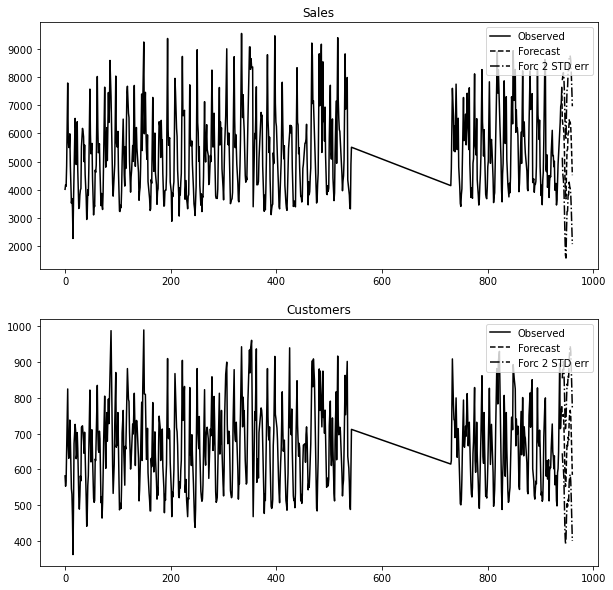

In [579]:
#We can also plot our forecasted values by the model.

results.plot_forecast(20);

### VARMAX Model

In [580]:
from statsmodels.tsa.api import VARMAX
mod = sm.tsa.VARMAX(data[endog_vars], order=(2,1), trend='n', exog=data[exog_vars])
res = mod.fit(maxiter=1000, disp=False)
print(res.summary())

/Users/venkir/opt/anaconda3/lib/python3.9/site-packages/statsmodels/tsa/statespace/varmax.py:161: EstimationWarning: Estimation of VARMA(p,q) models is not generically robust, due especially to identification issues.
  warn('Estimation of VARMA(p,q) models is not generically robust,'


                             Statespace Model Results                             
Dep. Variable:     ['Sales', 'Customers']   No. Observations:                  941
Model:                        VARMAX(2,1)   Log Likelihood              -12701.193
Date:                    Mon, 17 Jan 2022   AIC                          25444.385
Time:                            13:25:21   BIC                          25546.171
Sample:                        01-02-2013   HQIC                         25483.185
                             - 07-31-2015                                         
Covariance Type:                      opg                                         
Ljung-Box (L1) (Q):             5.15, 0.17   Jarque-Bera (JB):       100.65, 526.59
Prob(Q):                        0.02, 0.68   Prob(JB):                   0.00, 0.00
Heteroskedasticity (H):         0.83, 0.97   Skew:                      0.74, -0.30
Prob(H) (two-sided):            0.10, 0.76   Kurtosis:                   3.59, 6.61


In [581]:
predictions = res.forecast(steps=test_len, exog=test[exog_vars])
predictions['Date'] = test.index
predictions = predictions.set_index('Date')

/Users/venkir/opt/anaconda3/lib/python3.9/site-packages/statsmodels/tsa/statespace/varmax.py:161: EstimationWarning: Estimation of VARMA(p,q) models is not generically robust, due especially to identification issues.
  warn('Estimation of VARMA(p,q) models is not generically robust,'
/Users/venkir/opt/anaconda3/lib/python3.9/site-packages/statsmodels/tsa/statespace/varmax.py:161: EstimationWarning: Estimation of VARMA(p,q) models is not generically robust, due especially to identification issues.
  warn('Estimation of VARMA(p,q) models is not generically robust,'


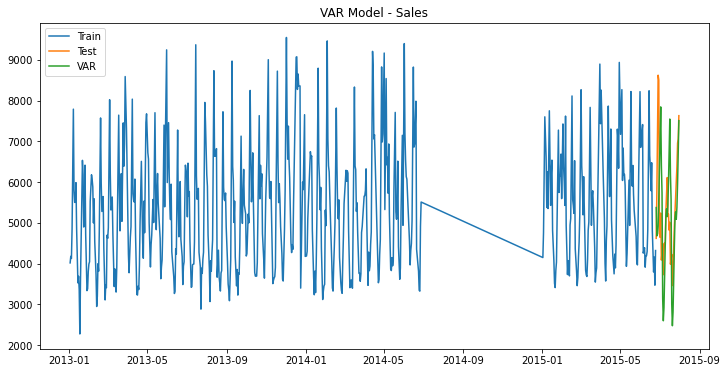

In [582]:
plt.figure(figsize=(12,6))
plt.plot(train['Sales'], label='Train')
plt.plot(test['Sales'], label='Test')
plt.plot(predictions['Sales'], label='VAR')
plt.legend(loc='best')
plt.title('VAR Model - Sales')
plt.show()

In [583]:
# Root Mean Square Error (RMSE)
rmse = np.sqrt(mean_squared_error(test.Sales, predictions.Sales)).round(2)

model_comparison=pd.DataFrame()
model_comparison.loc[0,'Model']='VARMAX'
model_comparison.loc[0,'Variable']='Sales'
model_comparison.loc[0,'RMSE']=rmse

rmse = np.sqrt(mean_squared_error(test.Customers, predictions.Customers)).round(2)
#print('Investment: RMSE:',  rmse)

append=pd.DataFrame()
append.loc[0,'Model']='VARMAX'
append.loc[0,'Variable']='Customers'
append.loc[0,'RMSE']=rmse

model_comparison = model_comparison.append(append)

# Mean Absolute Percentage Error
abs_error = np.abs(test.Sales-predictions.Sales)
actual = test.Sales
mape = np.round(np.mean(abs_error/actual)*100, 2)

model_comparison.loc[model_comparison['Variable']=='Sales', 'MAPE'] = mape

abs_error = np.abs(test.Customers-predictions.Customers)
actual = test.Customers
mape = np.round(np.mean(abs_error/actual)*100, 2)
#print('Investment: MAPE:',  mape)

model_comparison.loc[model_comparison['Variable']=='Customers', 'MAPE'] = mape

In [584]:
model_comparison.reset_index(drop=True, inplace=True)
#model_comparison

In [585]:
results_display = pd.concat([results_display, model_comparison])
results_display

,Model,Variable,RMSE,MAPE
0,VAR,Sales,1490.14,17.43
1,VAR,Customers,127.26,13.95
0,VARMAX,Sales,1533.81,24.47
1,VARMAX,Customers,147.59,18.89


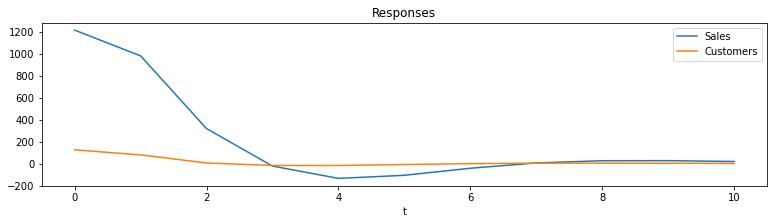

In [586]:
ax = res.impulse_responses(10, orthogonalized=True, impulse=[1, 0]).plot(figsize=(13,3))
ax.set(xlabel='t', title='Responses');

### SARIMAX Model for Sales

In [587]:
model=sm.tsa.statespace.SARIMAX(data['Sales'],order=(2, 1, 1),seasonal_order=(1,0,1,12), exog=data[exog_vars])
results=model.fit()
print(model_fit.params)

 This problem is unconstrained.


RUNNING THE L-BFGS-B CODE

           * * *

Machine precision = 2.220D-16
 N =            9     M =           10

At X0         0 variables are exactly at the bounds

At iterate    0    f=  8.03073D+00    |proj g|=  8.71153D-02

At iterate    5    f=  8.00805D+00    |proj g|=  5.71708D-02

At iterate   10    f=  7.99899D+00    |proj g|=  2.62973D-03

At iterate   15    f=  7.99892D+00    |proj g|=  5.91847D-03

At iterate   20    f=  7.99717D+00    |proj g|=  2.07985D-03

At iterate   25    f=  7.99705D+00    |proj g|=  1.65144D-04

At iterate   30    f=  7.99698D+00    |proj g|=  7.47585D-04

At iterate   35    f=  7.99384D+00    |proj g|=  1.17822D-03

At iterate   40    f=  7.99381D+00    |proj g|=  2.93462D-03

At iterate   45    f=  7.99315D+00    |proj g|=  2.19051D-02

At iterate   50    f=  7.99270D+00    |proj g|=  8.13906D-04

           * * *

Tit   = total number of iterations
Tnf   = total number of function evaluations
Tnint = total number of segments explored during Cau

/Users/venkir/opt/anaconda3/lib/python3.9/site-packages/statsmodels/base/model.py:566: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "


<AxesSubplot:title={'center':'SARIMAX Model - Sales'}>

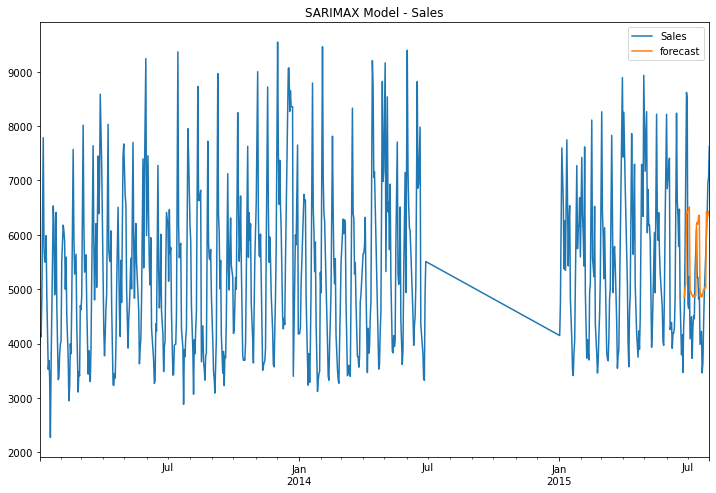

In [588]:
#Testing the fitted model.
data['forecast']=results.predict(start=test.index.min(),end=test.index.max(),dynamic=True)
data[['Sales','forecast']].plot(figsize=(12,8), title='SARIMAX Model - Sales')

In [589]:
rmse = np.sqrt(mean_squared_error(test['Sales'], data['forecast'][test.index.min():])).round(2)
mape = np.round(np.mean(np.abs(test['Sales']-data['forecast'][test.index.min():])/test['Sales'])*100,2)

tempResults = pd.DataFrame({'Model':['SARIMAX method'], 'Variable':['Sales'], 'RMSE': [rmse],'MAPE': [mape] })
#tempResults

In [590]:
results_display = pd.concat([results_display, tempResults])
results_display

,Model,Variable,RMSE,MAPE
0,VAR,Sales,1490.14,17.43
1,VAR,Customers,127.26,13.95
0,VARMAX,Sales,1533.81,24.47
1,VARMAX,Customers,147.59,18.89
0,SARIMAX method,Sales,1067.15,17.54


### SARIMAX Model for Customers

In [591]:
model=sm.tsa.statespace.SARIMAX(data['Customers'],order=(2, 1, 1),seasonal_order=(1,0,1,12), exog=data[exog_vars])
results=model.fit()
print(model_fit.params)

 This problem is unconstrained.


RUNNING THE L-BFGS-B CODE

           * * *

Machine precision = 2.220D-16
 N =            9     M =           10

At X0         0 variables are exactly at the bounds

At iterate    0    f=  5.59483D+00    |proj g|=  1.92374D-01

At iterate    5    f=  5.55843D+00    |proj g|=  6.51346D-02

At iterate   10    f=  5.50202D+00    |proj g|=  8.33784D-02

At iterate   15    f=  5.47260D+00    |proj g|=  7.34868D-03

At iterate   20    f=  5.46732D+00    |proj g|=  2.02787D-02

At iterate   25    f=  5.46573D+00    |proj g|=  6.70857D-03

At iterate   30    f=  5.46278D+00    |proj g|=  1.65322D-02

At iterate   35    f=  5.46220D+00    |proj g|=  4.27493D-04

At iterate   40    f=  5.46025D+00    |proj g|=  2.32182D-02

At iterate   45    f=  5.45697D+00    |proj g|=  1.20191D-02

At iterate   50    f=  5.45658D+00    |proj g|=  3.87477D-04

           * * *

Tit   = total number of iterations
Tnf   = total number of function evaluations
Tnint = total number of segments explored during Cau

/Users/venkir/opt/anaconda3/lib/python3.9/site-packages/statsmodels/base/model.py:566: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "


<AxesSubplot:title={'center':'SARIMAX Model - Customers'}>

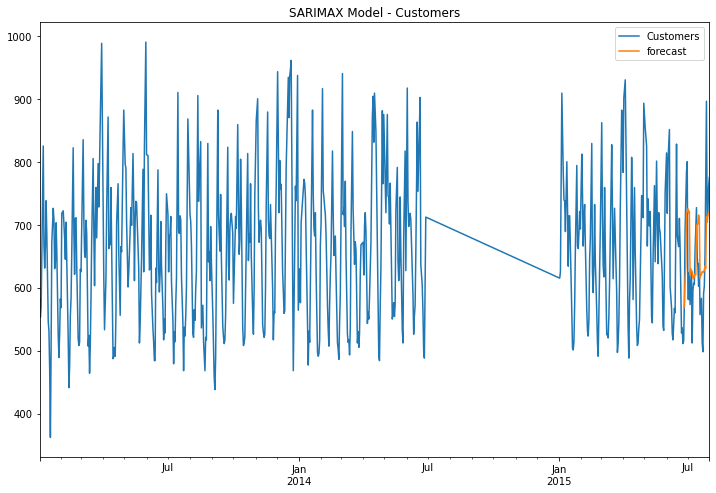

In [592]:
#Testing the fitted model.
data['forecast']=results.predict(start=test.index.min(),end=test.index.max(),dynamic=True)
data[['Customers','forecast']].plot(figsize=(12,8), title='SARIMAX Model - Customers')

In [593]:
rmse = np.sqrt(mean_squared_error(test['Customers'], data['forecast'][test.index.min():])).round(2)
mape = np.round(np.mean(np.abs(test['Customers']-data['forecast'][test.index.min():])/test['Sales'])*100,2)

tempResults = pd.DataFrame({'Model':['SARIMAX method'], 'Variable':['Customers'], 'RMSE': [rmse],'MAPE': [mape] })
#tempResults

In [594]:
results_display = pd.concat([results_display, tempResults])
results_display

,Model,Variable,RMSE,MAPE
0,VAR,Sales,1490.14,17.43
1,VAR,Customers,127.26,13.95
0,VARMAX,Sales,1533.81,24.47
1,VARMAX,Customers,147.59,18.89
0,SARIMAX method,Sales,1067.15,17.54
0,SARIMAX method,Customers,78.46,1.27


In [595]:
end_store46_time = time.time()
print("Time to do VAR model for Store 46 (mins):", (end_store46_time-start_store46_time)/60)

Time to do VAR model for Store 46 (mins): 0.7611818194389344


In [596]:
total_end_time = time.time()
print('Total time it took to run the Rossmann Retail Time Series Analysis for all Stores in mins:', 
      round((total_end_time-total_start_time)/60))

Total time it took to run the Rossmann Retail Time Series Analysis for all Stores in mins: 10
